IMPORTING LIBRARIES, SETTING THE DIFFERENTIAL EVOLUTION ALGORITHM AND LOADING THE DATA:

In [ ]:
#Import libraries:
import numpy as np
import random
import pandas as pd
import matplotlib.pyplot as plt


                     0           1    ...         372         373
0                 DataBR  2020-02-26  ...  2021-03-03  2021-03-04
1  Casos novos por diaBR           1  ...       71704       75102

[2 rows x 374 columns]
              0                      1
0        DataBR  Casos novos por diaBR
1    2020-02-26                      1
2    2020-02-27                      0
3    2020-02-28                      0
4    2020-02-29                      1
..          ...                    ...
369  2021-02-28                  34027
370  2021-03-01                  35742
371  2021-03-02                  59925
372  2021-03-03                  71704
373  2021-03-04                  75102

[374 rows x 2 columns]
              0      1
1    2020-02-26      1
2    2020-02-27      0
3    2020-02-28      0
4    2020-02-29      1
5    2020-03-01      0
..          ...    ...
369  2021-02-28  34027
370  2021-03-01  35742
371  2021-03-02  59925
372  2021-03-03  71704
373  2021-03-04  75102

[373 rows

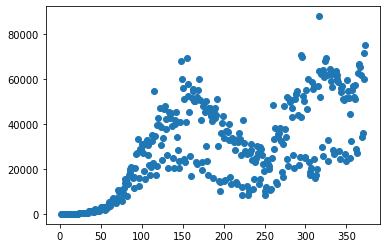

                      0           1    ...         372         373
0                  DataBR  2020-02-26  ...  2021-03-03  2021-03-04
1  Óbitos novos por diaBR           0  ...        1910        1699

[2 rows x 374 columns]
              0                       1
0        DataBR  Óbitos novos por diaBR
1    2020-02-26                       0
2    2020-02-27                       0
3    2020-02-28                       0
4    2020-02-29                       0
..          ...                     ...
369  2021-02-28                     721
370  2021-03-01                     778
371  2021-03-02                    1641
372  2021-03-03                    1910
373  2021-03-04                    1699

[374 rows x 2 columns]
              0     1
1    2020-02-26     0
2    2020-02-27     0
3    2020-02-28     0
4    2020-02-29     0
5    2020-03-01     0
..          ...   ...
369  2021-02-28   721
370  2021-03-01   778
371  2021-03-02  1641
372  2021-03-03  1910
373  2021-03-04  1699

[373 r

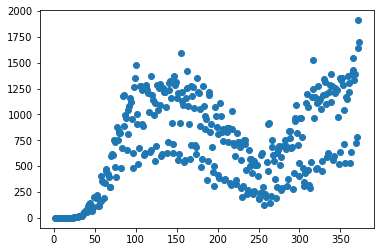

                          0      1      2      3   ...     50     51     52     53
0  Semana epidemiológica2018      1      2      3  ...     50     51     52   Null
1                  Casos2018    264    232    238  ...    452    334    259   Null
2  Semana epidemiológica2019      1      2      3  ...     50     51     52   Null
3                  Casos2019    316    289    274  ...    420    376    326   Null
4  Semana epidemiológica2020      1      2      3  ...     50     51     52     53
5                  Casos2020    547    526    514  ...  29416  27415  29053  32288
6  Semana epidemiológica2021      1      2      3  ...   Null   Null   Null   Null
7                  Casos2021  32964  31312  28183  ...   Null   Null   Null   Null

[8 rows x 54 columns]
                            0          1  ...                          6          7
0   Semana epidemiológica2018  Casos2018  ...  Semana epidemiológica2021  Casos2021
1                           1        264  ...                 

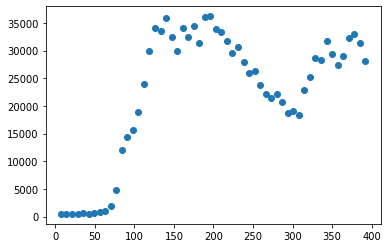

                          0     1     2     3   ...    50    51    52    53
0  Semana epidemiológica2018     1     2     3  ...    50    51    52  Null
1                 Óbitos2018    49    42    36  ...    35    34    29  Null
2  Semana epidemiológica2019     1     2     3  ...    50    51    52  Null
3                 Óbitos2019    44    41    45  ...    34    46    25  Null
4  Semana epidemiológica2020     1     2     3  ...    50    51    52    53
5                 Óbitos2020    82    85    86  ...  7044  6588  6984  8115
6  Semana epidemiológica2021     1     2     3  ...  Null  Null  Null  Null
7                 Óbitos2021  7937  7587  6265  ...  Null  Null  Null  Null

[8 rows x 54 columns]
                            0  ...           7
0   Semana epidemiológica2018  ...  Óbitos2021
1                           1  ...        7937
2                           2  ...        7587
3                           3  ...        6265
4                           4  ...        4917
5          

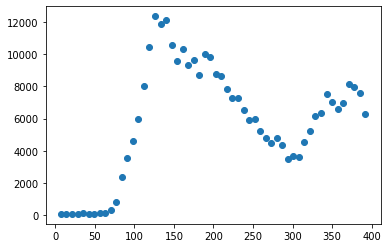

In [ ]:
#Import the datasets and visualize them:

#New cases of covid19 per day
cases_data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/covid19_second_wave/data_bigdata-covid19_05_03_2021/new_cases_brazil.csv', header=None)
print(cases_data)
cases_data = cases_data.transpose()
print(cases_data)
cases_data.drop([0], inplace=True)
print(cases_data)
cases_data.reset_index(inplace=True)
print(cases_data)
cases_data = cases_data.rename(columns={'index': 'dia_epidemiologico',
                                        0: 'data', 1: 'casos'})
print(cases_data)
cases_data['casos'] = pd.to_numeric(cases_data['casos'])
print(cases_data)

plt.scatter(cases_data['dia_epidemiologico'], cases_data['casos'])
plt.show()

#New deaths from covid19 per day
deaths_data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/covid19_second_wave/data_bigdata-covid19_05_03_2021/new_deaths_brazil.csv', header=None)
print(deaths_data)
deaths_data = deaths_data.transpose()
print(deaths_data)
deaths_data.drop([0], inplace=True)
print(deaths_data)
deaths_data.reset_index(inplace=True)
print(deaths_data)
deaths_data = deaths_data.rename(columns={'index': 'dia_epidemiologico',
                                          0: 'data', 1: 'casos'})
print(deaths_data)
deaths_data['casos'] = pd.to_numeric(deaths_data['casos'])
print(deaths_data)

plt.scatter(deaths_data['dia_epidemiologico'], deaths_data['casos'])
plt.show()

#New cases of SRAG per day
srag_cases_data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/covid19_second_wave/data_bigdata-covid19_05_03_2021/srag_cases_brazil.csv', header=None)
print(srag_cases_data)
srag_cases_data = srag_cases_data.transpose()
print(srag_cases_data)
for i in range(4): del srag_cases_data[i]
print(srag_cases_data)
srag_cases_data.drop([0], inplace=True)
print(srag_cases_data)
for i in range(7): srag_cases_data.iloc[i][6] = srag_cases_data.iloc[i][6]+53
print(srag_cases_data)
tmp_dataframe=pd.DataFrame()
tmp_dataframe[0]=srag_cases_data[6]
tmp_dataframe[1]=srag_cases_data[7]
print(tmp_dataframe)
del srag_cases_data[6]
del srag_cases_data[7]
print(srag_cases_data)
srag_cases_data = srag_cases_data.rename(columns={4: 0, 5: 1})
srag_cases_data = pd.concat([srag_cases_data, tmp_dataframe])
print(srag_cases_data)
srag_cases_data.reset_index(inplace=True)
print(srag_cases_data)
del srag_cases_data['index']
print(srag_cases_data)
for i in reversed(range(len(srag_cases_data))):
    if srag_cases_data.iloc[i][0]=='Null':
        srag_cases_data.drop([i], inplace=True)
print(srag_cases_data)
original_size=len(srag_cases_data)
for i in reversed(range(len(srag_cases_data))):
    if i>original_size-6:
        srag_cases_data.drop([i], inplace=True)
print(srag_cases_data)
srag_cases_data = srag_cases_data.rename(columns={0: 'semana_epidemiologica', 1: 'casos'})
print(srag_cases_data)
#convertendo semanas para dias para facilitar mais pra frente:
srag_cases_data['semana_epidemiologica'] = srag_cases_data['semana_epidemiologica'].astype(int).multiply(7)
print(srag_cases_data)
#corrigindo tipo dos dados:
srag_cases_data['casos'] = srag_cases_data['casos'].astype(float)


plt.scatter(srag_cases_data['semana_epidemiologica'], srag_cases_data['casos'])
plt.show()

#New deaths from SRAG per day
srag_deaths_data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/covid19_second_wave/data_bigdata-covid19_05_03_2021/srag_deaths_brazil.csv', header=None)
print(srag_deaths_data)
srag_deaths_data = srag_deaths_data.transpose()
print(srag_deaths_data)
for i in range(4): del srag_deaths_data[i]
print(srag_deaths_data)
srag_deaths_data.drop([0], inplace=True)
print(srag_deaths_data)
for i in range(7): srag_deaths_data.iloc[i][6] = srag_deaths_data.iloc[i][6]+53
print(srag_deaths_data)
tmp_dataframe=pd.DataFrame()
tmp_dataframe[0]=srag_deaths_data[6]
tmp_dataframe[1]=srag_deaths_data[7]
print(tmp_dataframe)
del srag_deaths_data[6]
del srag_deaths_data[7]
print(srag_deaths_data)
srag_deaths_data = srag_deaths_data.rename(columns={4: 0, 5: 1})
srag_deaths_data = pd.concat([srag_deaths_data, tmp_dataframe])
print(srag_deaths_data)
srag_deaths_data.reset_index(inplace=True)
print(srag_deaths_data)
del srag_deaths_data['index']
print(srag_deaths_data)
for i in reversed(range(len(srag_deaths_data))):
    if srag_deaths_data.iloc[i][0]=='Null':
        srag_deaths_data.drop([i], inplace=True)
print(srag_deaths_data)
original_size=len(srag_deaths_data)
for i in reversed(range(len(srag_deaths_data))):
    if i>original_size-6:
        srag_deaths_data.drop([i], inplace=True)
print(srag_deaths_data)
srag_deaths_data = srag_deaths_data.rename(columns={0: 'semana_epidemiologica', 1: 'casos'})
print(srag_deaths_data)
#convertendo semanas para dias para facilitar mais pra frente:
srag_deaths_data['semana_epidemiologica'] = srag_deaths_data['semana_epidemiologica'].astype(int).multiply(7)
print(srag_deaths_data)
#corrigindo tipo dos dados:
srag_deaths_data['casos'] = srag_deaths_data['casos'].astype(float)

plt.scatter(srag_deaths_data['semana_epidemiologica'], srag_deaths_data['casos'])
plt.show()


In [ ]:
#Defining our models and other useful functions:

def ensure_bounds(vec, bounds):
    vec_new = [] 
    for i in range(len(vec)):
        if vec[i] < bounds[i][0]:
            vec_new.append(bounds[i][0])
        if vec[i] > bounds[i][1]:
            vec_new.append(bounds[i][1])
        if bounds[i][0] <= vec[i] <= bounds[i][1]:
            vec_new.append(vec[i])
    return vec_new

def grafico(x, y, yfit):
    plt.plot(x, y, '+')
    plt.plot(x, yfit)
    plt.show()
    #plt.pause(0.1)
    plt.clf()

def rsme(x_dados, y_dados, w):
    if objective_function_name == 'dist_maxwell_boltzmann': y_pred = dist_maxwell_boltzmann(x_dados, w)
    elif objective_function_name == 'single_maxwell_boltzmann': y_pred = single_maxwell_boltzmann(x_dados, w)
    elif objective_function_name == 'double_gaussian': y_pred = double_gaussian(x_dados, w)
    return np.sqrt(sum((y_dados-y_pred)**2)/len(y_dados))

def single_gaussian(x_dados, w):
    return w[0]*np.exp(-(x_dados-w[1])**2/(2*(w[2]**2)))

def double_gaussian(x_dados, w):
    return w[0]*np.exp(-((x_dados-w[1])**2)/(2*(w[2]**2)))+w[3]*np.exp(-((x_dados-w[4])**2)/(2*(w[5]**2)))

def single_maxwell_boltzmann(data, w):
    
    tmp_list = []

    A1=w[0]
    B1=w[1]
    C1=w[2]
    D1=w[3]
      
    for i in range(len(data)):
        
        if C1*data[i]-B1 >= 0:
            tmp_1 = D1*4*np.pi*(np.sqrt(A1/np.pi)**3)*((C1*data[i]-B1)**2)/np.exp(A1*(C1*data[i]-B1)**2)
        else: 
            tmp_1 = 0.

        tmp_list.append(tmp_1)

    return tmp_list

def dist_maxwell_boltzmann(data, w):
    
    tmp_list = []

    A1=w[0]
    B1=w[1]
    C1=w[2]
    D1=w[3]

    A2=w[4]
    B2=w[5]
    C2=w[6]
    D2=w[7]
      
    for i in range(len(data)):
        
        if C1*data[i]-B1 >= 0:
            tmp_1 = D1*4*np.pi*(np.sqrt(A1/np.pi)**3)*((C1*data[i]-B1)**2)/np.exp(A1*(C1*data[i]-B1)**2)
        else: 
            tmp_1 = 0.

        if C2*data[i]-B2 >= 0:
            tmp_2 = D2*4*np.pi*(np.sqrt(A2/np.pi)**3)*((C2*data[i]-B2)**2)/np.exp(A2*(C2*data[i]-B2)**2)
        else: 
            tmp_2 = 0.

        tmp_list.append(tmp_1 + tmp_2)

    return tmp_list

def objective_function(data, w):

    if objective_function_name == 'dist_maxwell_boltzmann': return dist_maxwell_boltzmann(data, w)
    elif objective_function_name == 'single_maxwell_boltzmann': return single_maxwell_boltzmann(data, w)
    elif objective_function_name == 'double_gaussian': return double_gaussian(data, w)


In [ ]:
#Differential Evolution algorithm:

def Differential_Evolution(cost_func, bounds, popsize, mutate, recombination, maxiter, x_dados, y_dados, plot_interval):

    population = []
    for i in range(0,popsize):
        indv = []
        for j in range(len(bounds)):
            indv.append(random.uniform(bounds[j][0],bounds[j][1]))
        population.append(indv)
            
    for i in range(1, maxiter+1):
        #print ("Iteração:",i)
        gen_scores = []
        for j in range(0, popsize):

            candidates = list(range(0,popsize))
            candidates.remove(j)
            random_index = random.sample(candidates, 3)

            x_1 = population[random_index[0]]
            x_2 = population[random_index[1]]
            x_3 = population[random_index[2]]
            x_t = population[j]
            
            x_diff = [x_2_i - x_3_i for x_2_i, x_3_i in zip(x_2, x_3)]
            v_donor = [x_1_i + mutate * x_diff_i for x_1_i, x_diff_i in zip(x_1, x_diff)]
            v_donor = ensure_bounds(v_donor, bounds)

            v_trial = []
            for k in range(len(x_t)):
                crossover = random.random()
                if crossover <= recombination:
                    v_trial.append(v_donor[k])
                else:
                    v_trial.append(x_t[k])
                    
            score_trial  = cost_func(x_dados, y_dados, v_trial)
            score_target = cost_func(x_dados, y_dados, x_t)
            
            if score_trial < score_target:
                population[j] = v_trial
                gen_scores.append(score_trial)
                #print( '   >',score_trial, v_trial)
            else:
                #print( '   >',score_target, x_t)
                gen_scores.append(score_target)

        #gen_avg = sum(gen_scores) / popsize #média da geração
        #gen_best = min(gen_scores) #melhor da geração
        gen_sol = population[gen_scores.index(min(gen_scores))] #melhor resultado
        
        if (i%plot_interval==0):
            print('Iteração:', i)
            yfit = objective_function(x_dados, gen_sol)
            grafico(x_dados, y_dados, yfit)
            print(gen_sol)

    return gen_sol


CREATING AND TESTING THE MAXWELL-BOLTZMANN-LIKE MODEL:

A1: 0.7445544791546311 B1: 48.71123400597408 C1: 0.5862371960531665 D1: 281.1584820088865 A2: 0.6591781504424534 B2: 68.1466403003853 C2: 0.3788753890774371 D2: 354.1737876432435


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


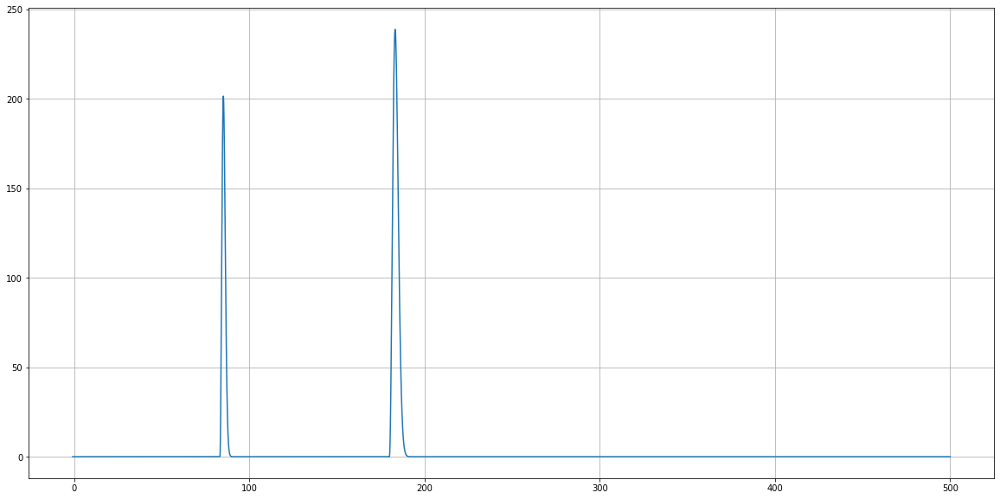

A1: 0.03417985500799292 B1: 59.512006643583106 C1: 0.9358578079344304 D1: 6.711746687952047 A2: 0.9040914315750838 B2: 96.58840550263862 C2: 0.9715485061622163 D2: 746.7004785802412


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


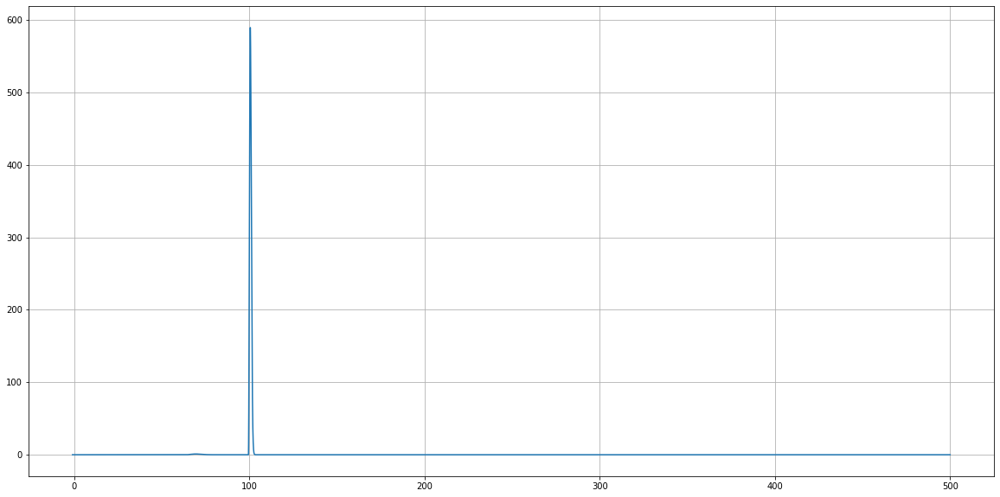

A1: 0.9833385136549081 B1: 32.82559889281483 C1: 0.5490816425658915 D1: 989.0549297037127 A2: 0.5477715076563391 B2: 3.5585647546942822 C2: 0.8721904722862688 D2: 487.78671461026266


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


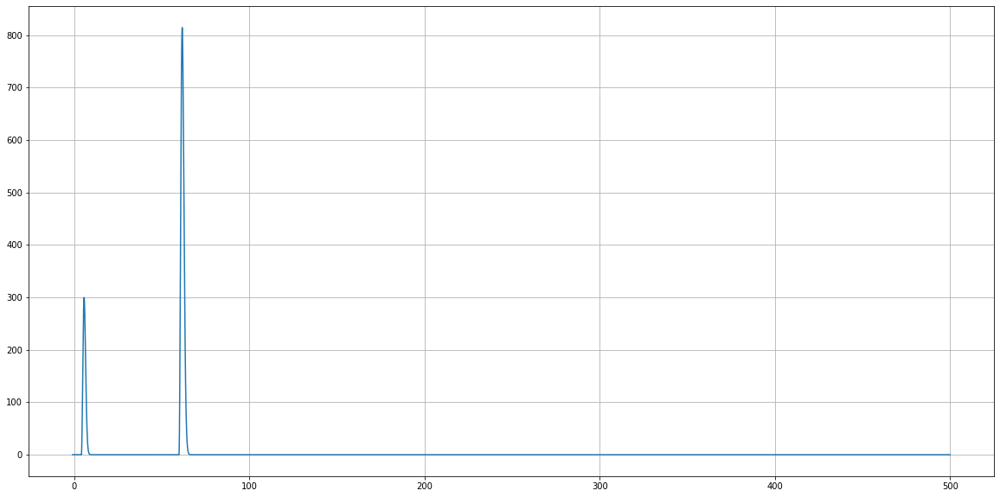

A1: 0.7252760929591563 B1: 67.77498784271853 C1: 0.039420786428963295 D1: 708.4041448313498 A2: 0.7178183257518027 B2: 10.299570337951891 C2: 0.1960143034707773 D2: 854.967811723637


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


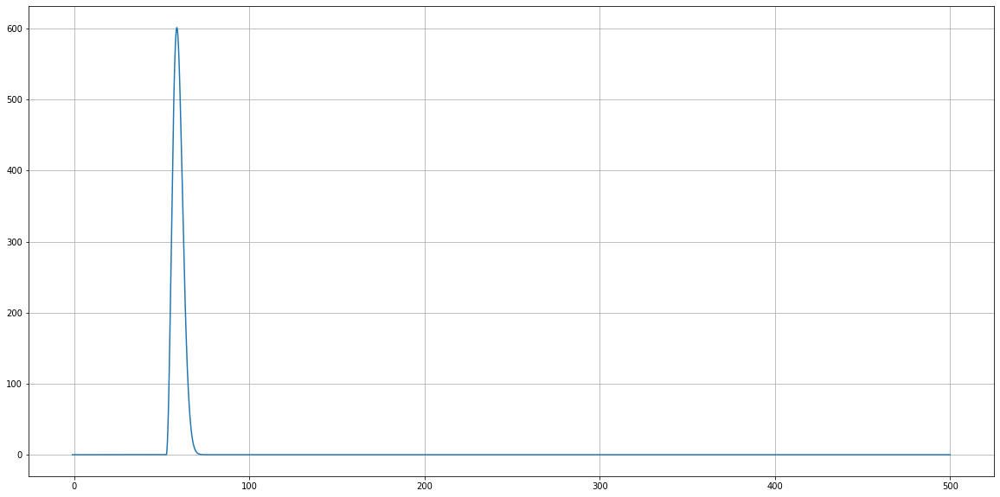

A1: 0.7679546948267179 B1: 85.97953147060555 C1: 0.38857918690607196 D1: 519.7053038292566 A2: 0.2847345925470044 B2: 51.97914681100971 C2: 0.4199120161476467 D2: 942.7584245509822


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


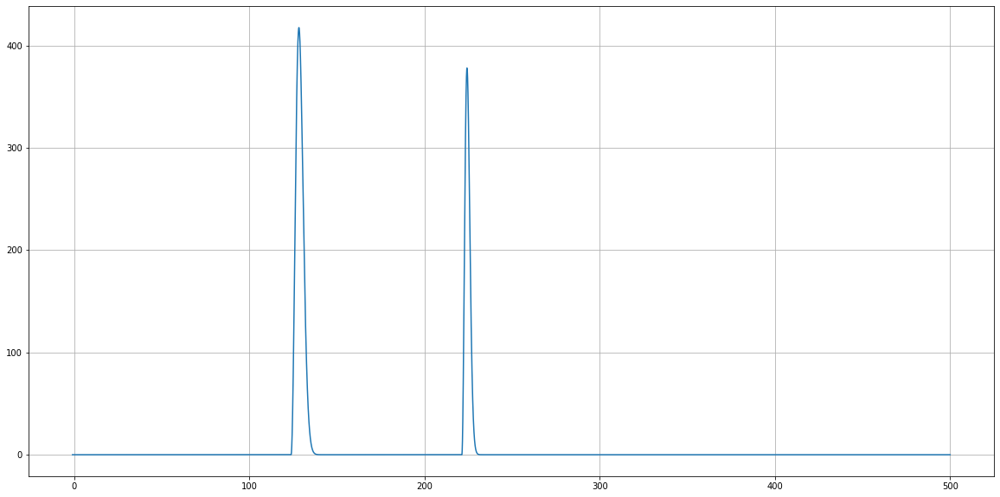

A1: 0.1173143268545156 B1: 68.05036873267882 C1: 0.9443753188846784 D1: 891.2557441495201 A2: 0.36056646440646767 B2: 29.835439582806256 C2: 0.1324348194276732 D2: 529.6479238272193


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


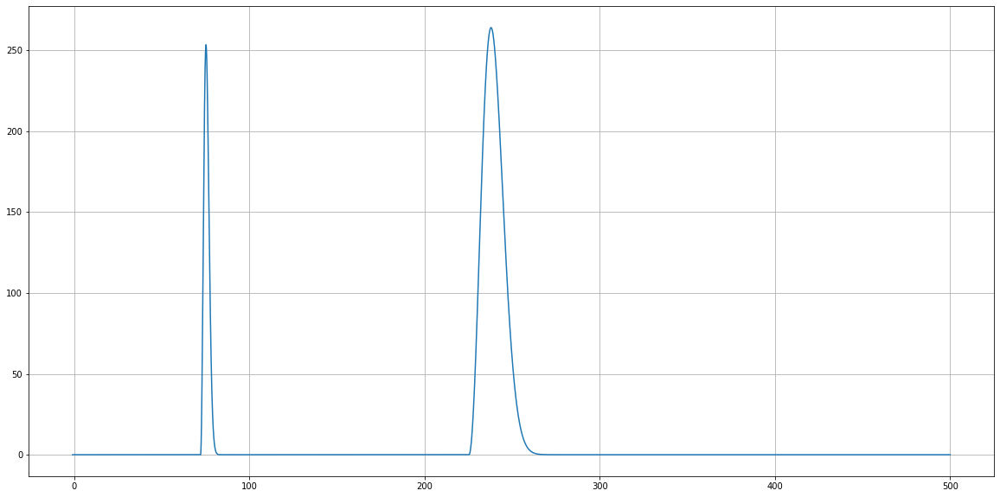

A1: 0.7013798940293253 B1: 15.412140620415816 C1: 0.9101392933004698 D1: 268.46175091839007 A2: 0.034144683119350705 B2: 62.19301613864635 C2: 0.8584946747528749 D2: 283.36668042797487


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


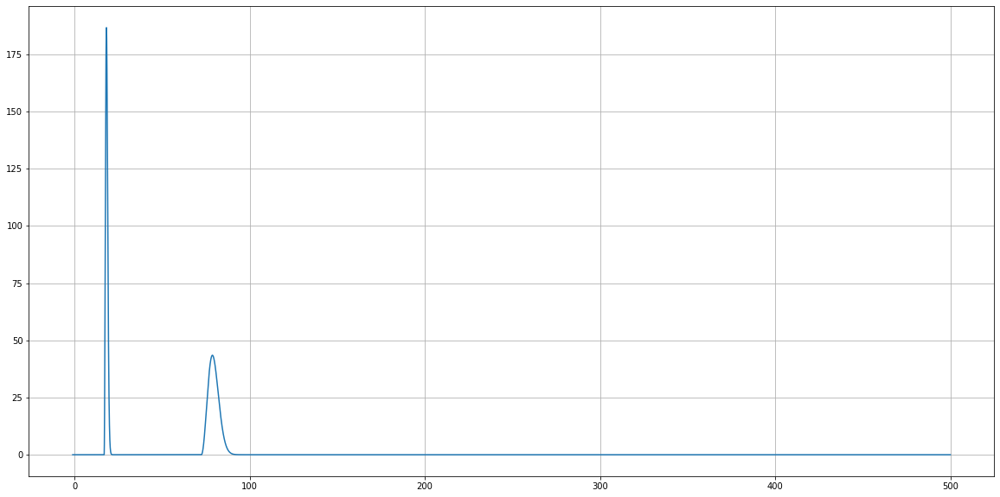

A1: 0.9954981581158551 B1: 7.744762458917931 C1: 0.033801218839067504 D1: 559.2195790100864 A2: 0.05947033448573491 B2: 35.81420167858245 C2: 0.8433524783721993 D2: 521.7221245795112


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


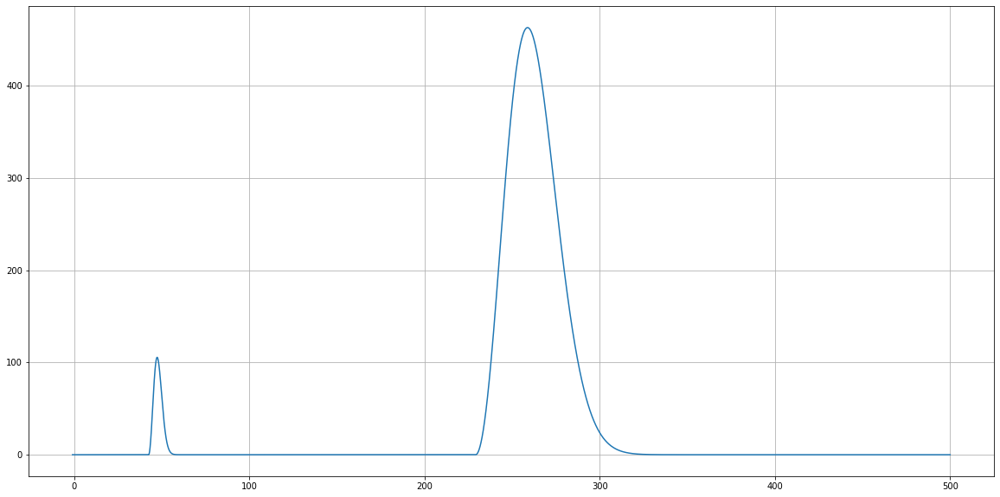

A1: 0.5447036293780709 B1: 36.612616007535145 C1: 0.12405877742179094 D1: 763.0720519000664 A2: 0.2631167731607523 B2: 62.702503601245915 C2: 0.6052495556284916 D2: 53.19977514539664


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


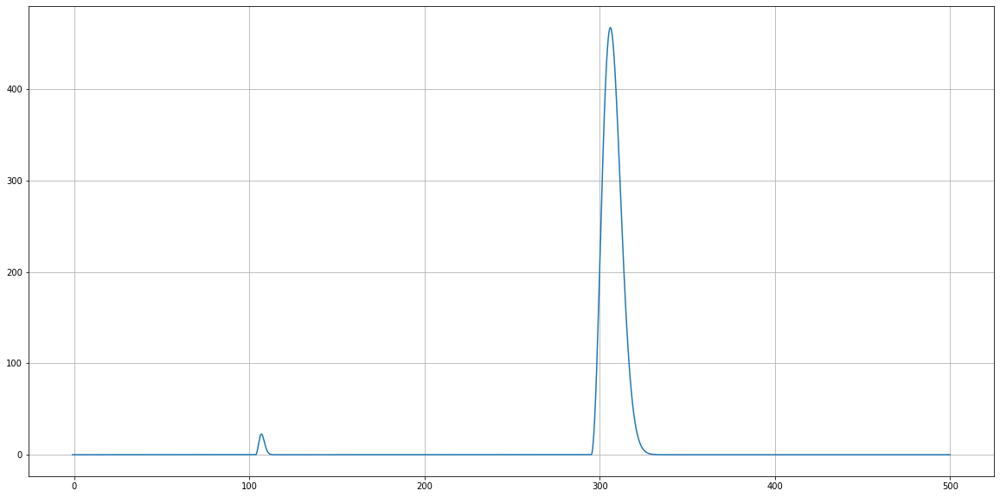

A1: 0.5742979368182967 B1: 65.778432438402 C1: 0.5923306674409339 D1: 779.0715421071718 A2: 0.7493777622986053 B2: 87.13597954295814 C2: 0.4732599389099744 D2: 27.214549023234614


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


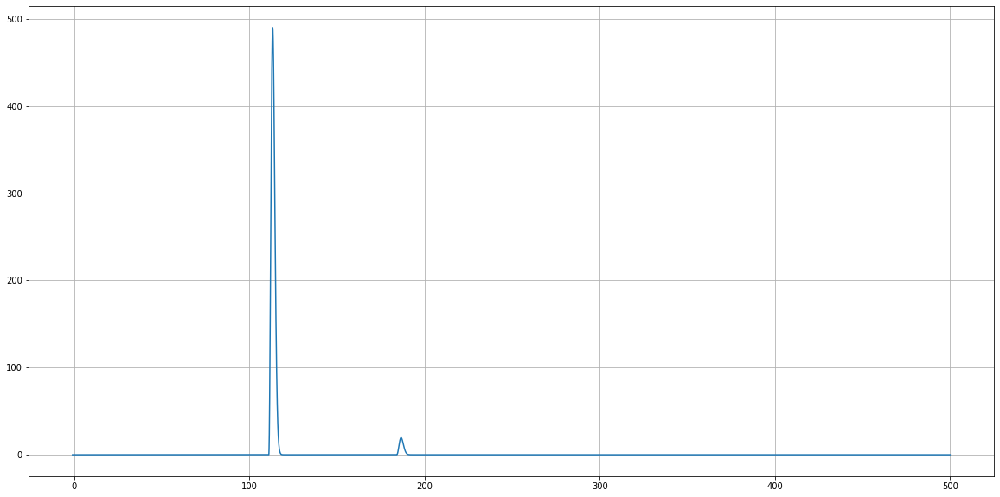

A1: 0.9318182564776207 B1: 18.910058731714486 C1: 0.1343929512304668 D1: 722.091936777376 A2: 0.6058333549513578 B2: 45.84960831185507 C2: 0.07298980113689446 D2: 612.2438974629908


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


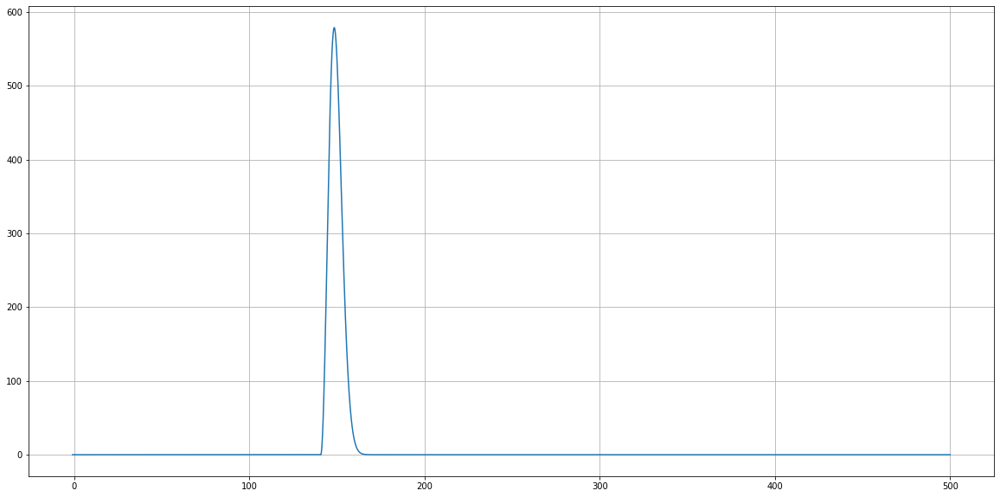

A1: 0.008763138724868225 B1: 26.65436760767642 C1: 0.7800360274553515 D1: 849.6124108828144 A2: 0.9062314242124941 B2: 53.12969112087126 C2: 0.3897997896695047 D2: 383.6894396053212


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


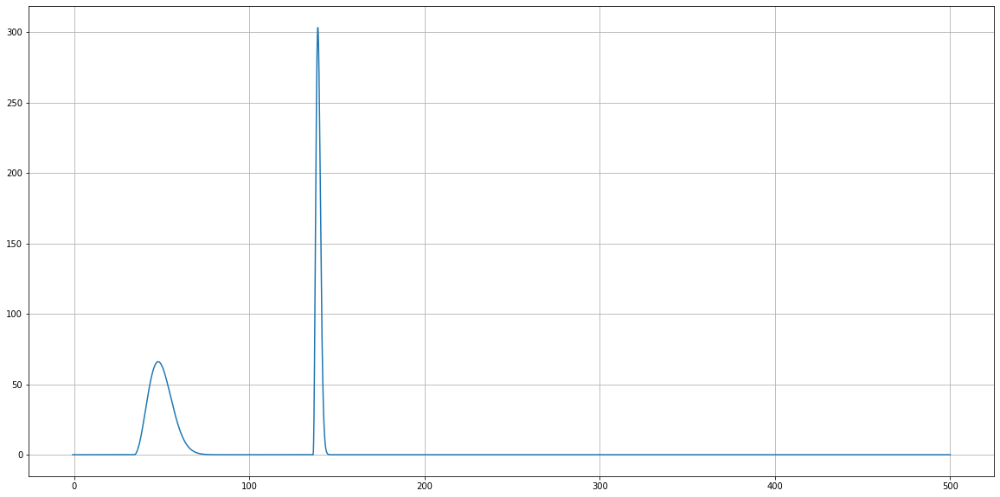

A1: 0.8506101471190451 B1: 98.6068607165705 C1: 0.09526379455928036 D1: 326.59514017446736 A2: 0.6259158178398705 B2: 59.289235978346966 C2: 0.7658372553380906 D2: 842.3497134047794


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


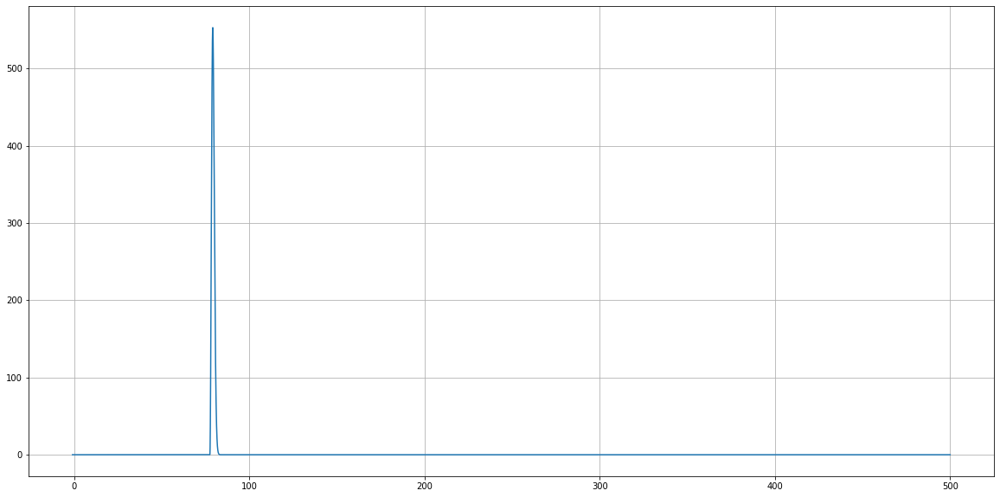

A1: 0.9886239254137377 B1: 23.667156303880788 C1: 0.19906221995457773 D1: 897.0225578383851 A2: 0.9685786968221104 B2: 70.27581930175101 C2: 0.7989920236872325 D2: 199.4890921130339


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


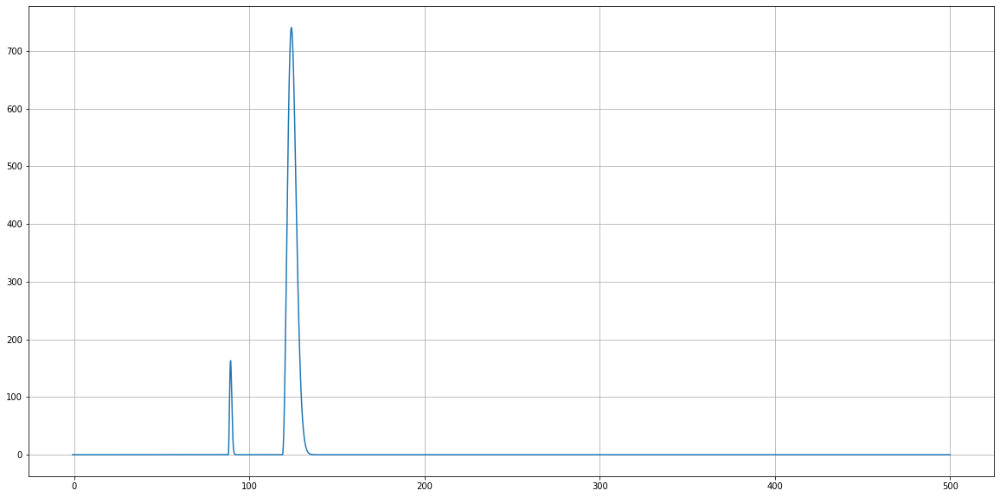

A1: 0.5844329207142841 B1: 31.061660465877907 C1: 0.5124624466504006 D1: 106.31382515574417 A2: 0.7016914184463452 B2: 50.221224206626715 C2: 0.03284333023718555 D2: 845.9602324014893


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


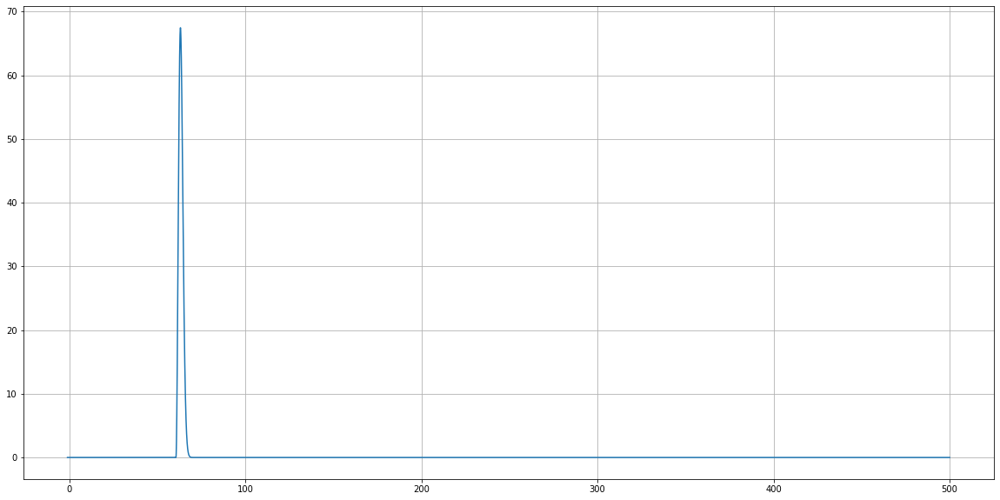

A1: 0.19534843015049386 B1: 21.982631982596935 C1: 0.2103485581156943 D1: 500.18506152603493 A2: 0.45348302773709637 B2: 41.43516780056389 C2: 0.5552121259231216 D2: 891.120650658884


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


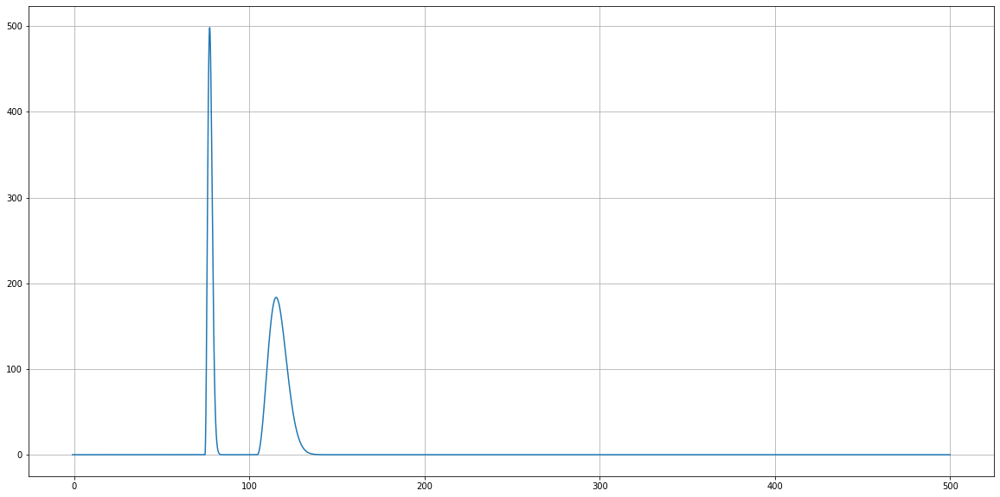

A1: 0.28715457790815313 B1: 32.15557325186526 C1: 0.7792341413713214 D1: 9.81389883047834 A2: 0.8252741265685413 B2: 15.155596060147214 C2: 0.7521733601047796 D2: 598.0499863264697


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


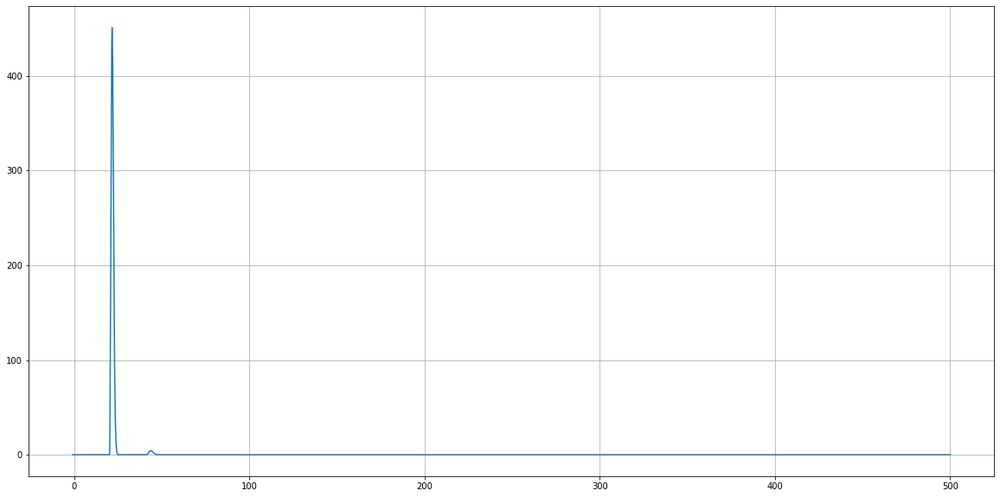

A1: 0.7734644156038073 B1: 31.409118271031524 C1: 0.38180039717898284 D1: 279.13271365657675 A2: 0.2476898410149222 B2: 12.805436600469488 C2: 0.2398934940049311 D2: 273.9345719755083


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


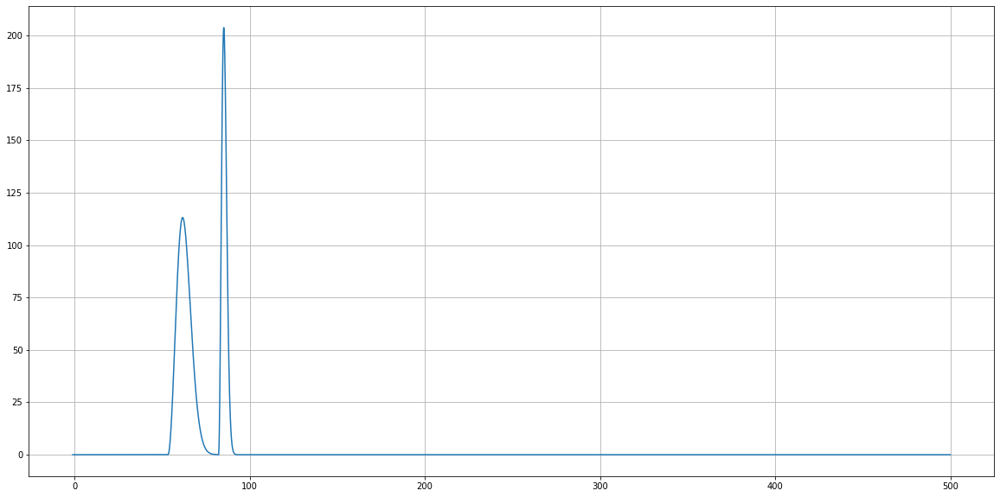

A1: 0.7732828978499929 B1: 23.867708979289482 C1: 0.4759753205996754 D1: 455.9268728541386 A2: 0.5765870396357181 B2: 82.49719666837531 C2: 0.8870613601598628 D2: 865.2983201077595


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


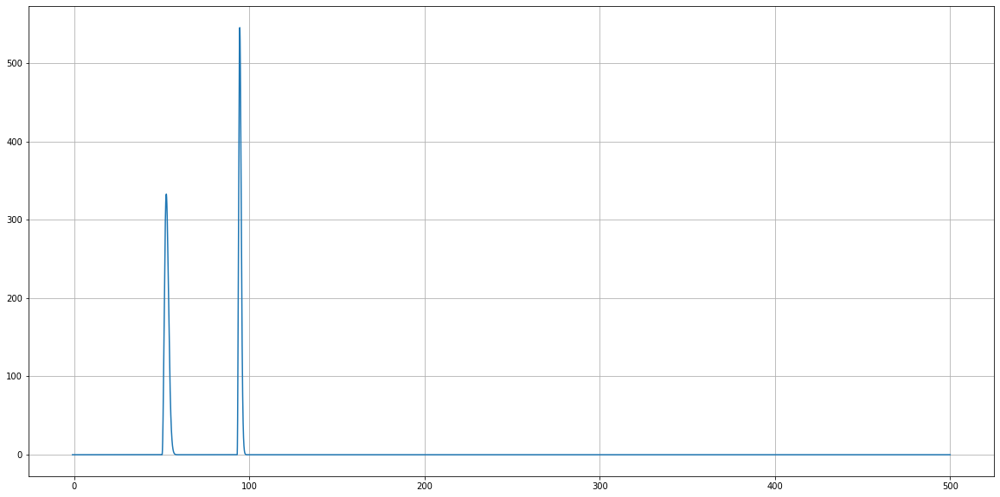

A1: 0.6747690149429102 B1: 6.97757342130072 C1: 0.40037516760546465 D1: 34.626383590850466 A2: 0.1893187917442628 B2: 13.591228015221791 C2: 0.3490278073322153 D2: 407.7359532258893


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


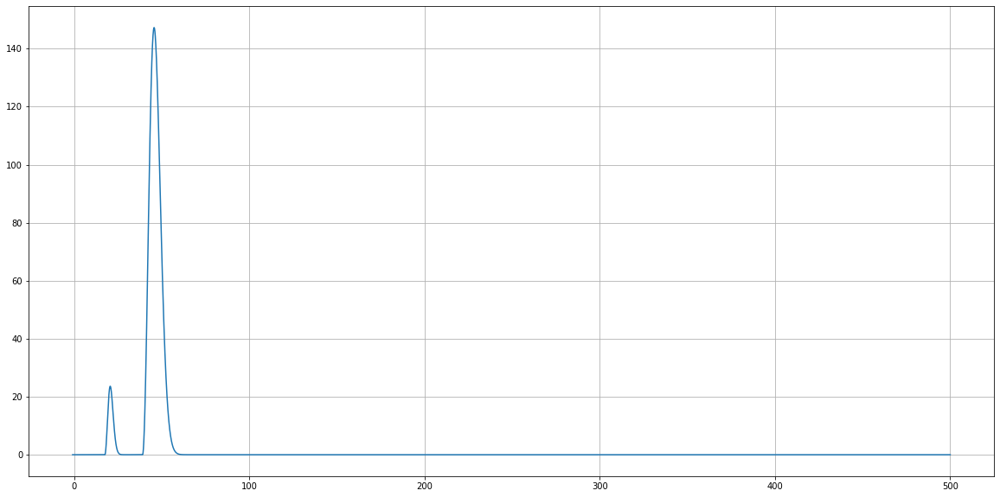

A1: 0.1373641678732167 B1: 84.79722067999947 C1: 0.7051570510258277 D1: 801.6014972644592 A2: 0.6518466422896066 B2: 37.03387479642346 C2: 0.0943286900955631 D2: 311.5383515588075


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


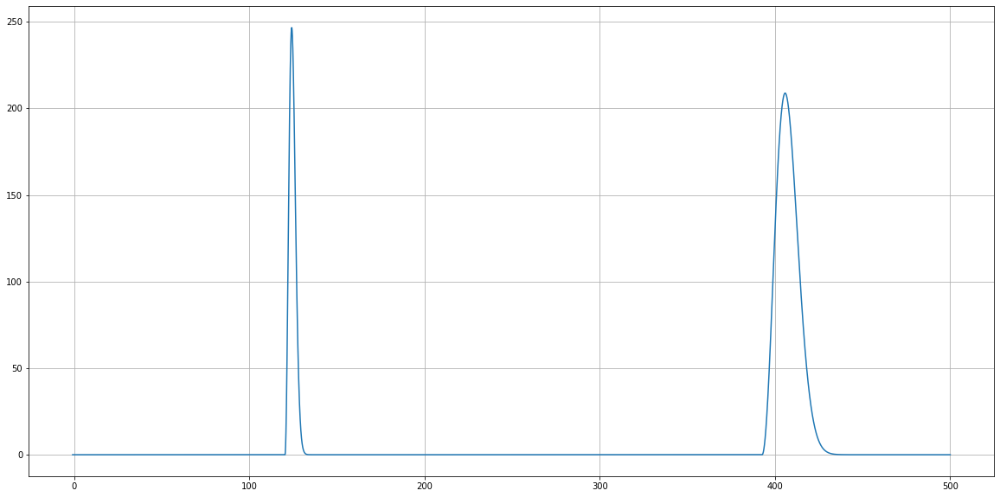

A1: 0.09268914178329268 B1: 92.89719200503087 C1: 0.39413896581434194 D1: 510.0066580557755 A2: 0.6948256178539726 B2: 49.35213698730273 C2: 0.46145143305857805 D2: 490.9658290992277


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


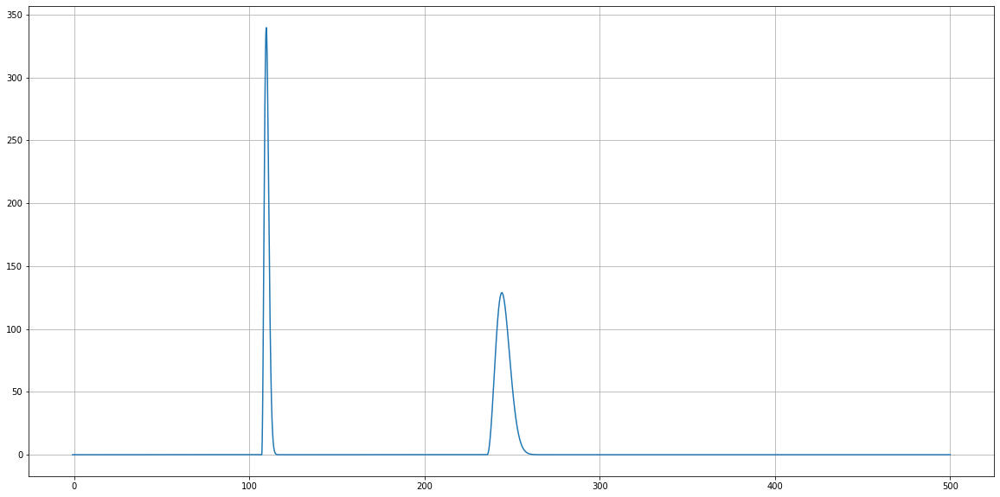

A1: 0.9995330722342404 B1: 5.703522651957638 C1: 0.8146716039445863 D1: 901.6900439697872 A2: 0.03486596563853184 B2: 49.05199937933013 C2: 0.14288866083109508 D2: 544.4608497295161


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


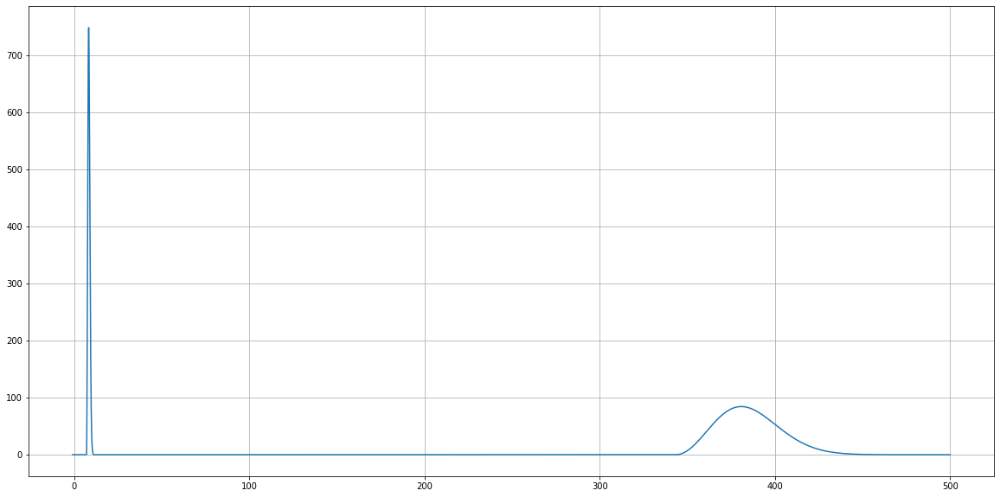

A1: 0.732972982173255 B1: 81.23112081036956 C1: 0.757069639020452 D1: 878.9076137832711 A2: 0.2442640441071059 B2: 14.016082731690338 C2: 0.1799313943255837 D2: 96.7166730731891


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


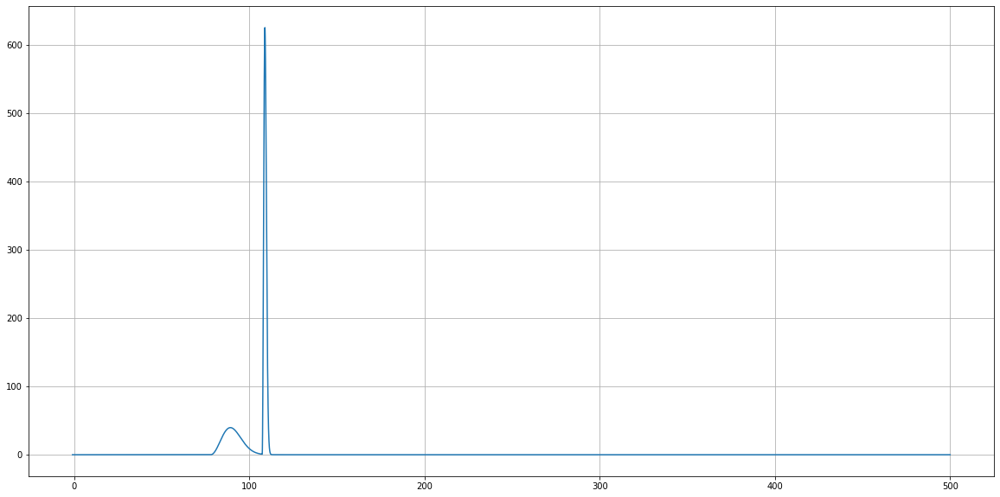

A1: 0.7242412175562181 B1: 45.72455240080191 C1: 0.21027828810013582 D1: 784.4489114777365 A2: 0.4995421291171106 B2: 55.2824851901639 C2: 0.3199874000037528 D2: 451.1758786395043


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


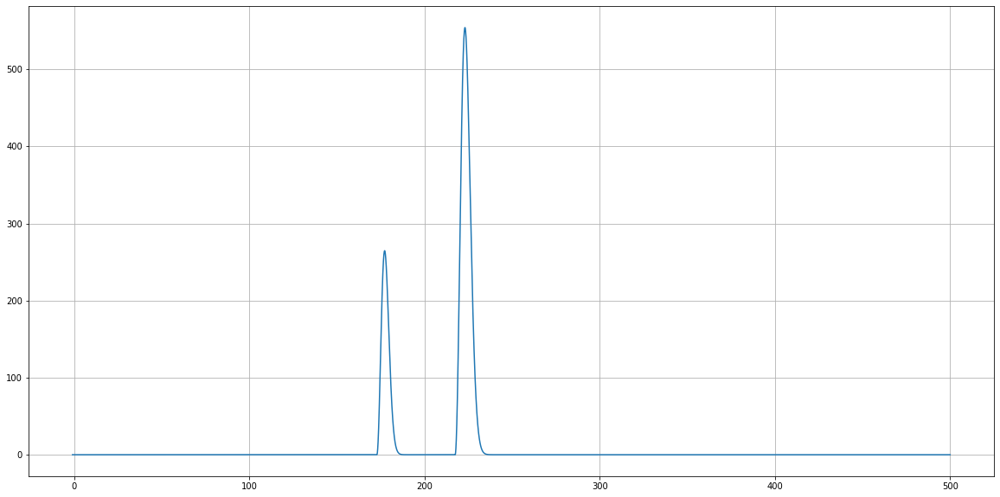

A1: 0.8377118261716747 B1: 20.68673874517425 C1: 0.7037512169856805 D1: 113.82321147436059 A2: 0.14077978377069833 B2: 1.111119329585608 C2: 0.3303965214024607 D2: 575.6600582811449


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


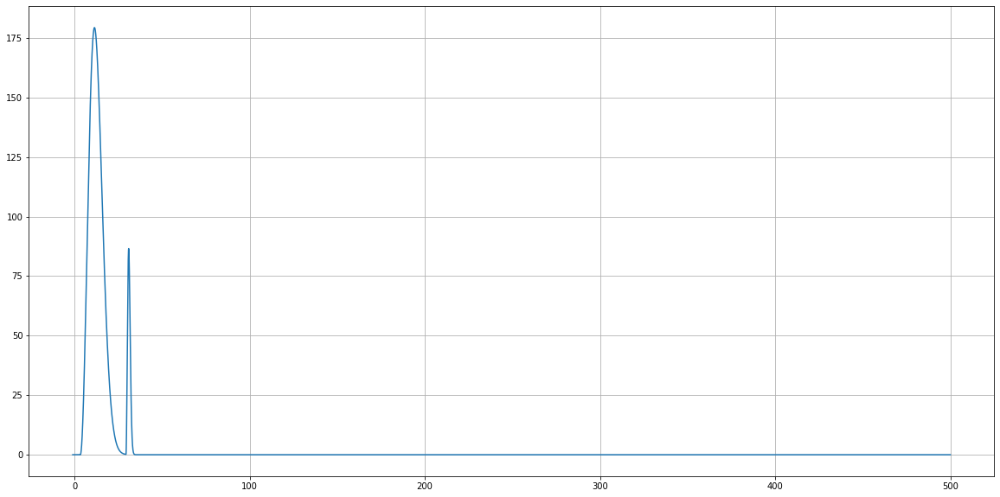

A1: 0.5557784605731798 B1: 8.062092274200516 C1: 0.9824975945422058 D1: 614.2763358347017 A2: 0.013513917269457054 B2: 20.028152381652507 C2: 0.65633397227079 D2: 881.256697608695


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


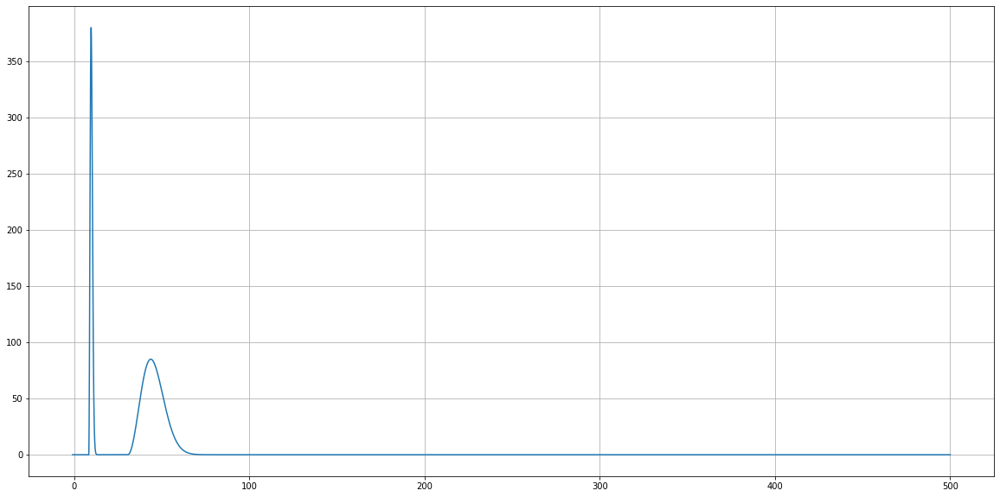

A1: 0.281412096369813 B1: 7.048334080680652 C1: 0.10169892790750845 D1: 482.63731652542816 A2: 0.5182622141601249 B2: 91.69210515979965 C2: 0.29706182037921425 D2: 748.7334321051368


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


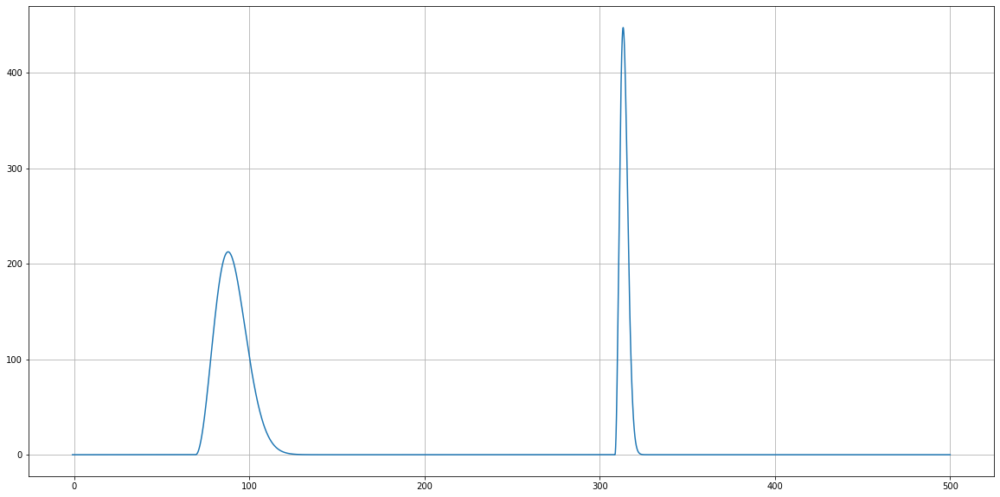

A1: 0.09898571239185028 B1: 85.19397465356815 C1: 0.1373399728310607 D1: 144.9999299924657 A2: 0.5848131312196041 B2: 10.431431756740784 C2: 0.4171466523656271 D2: 95.12458342457941


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


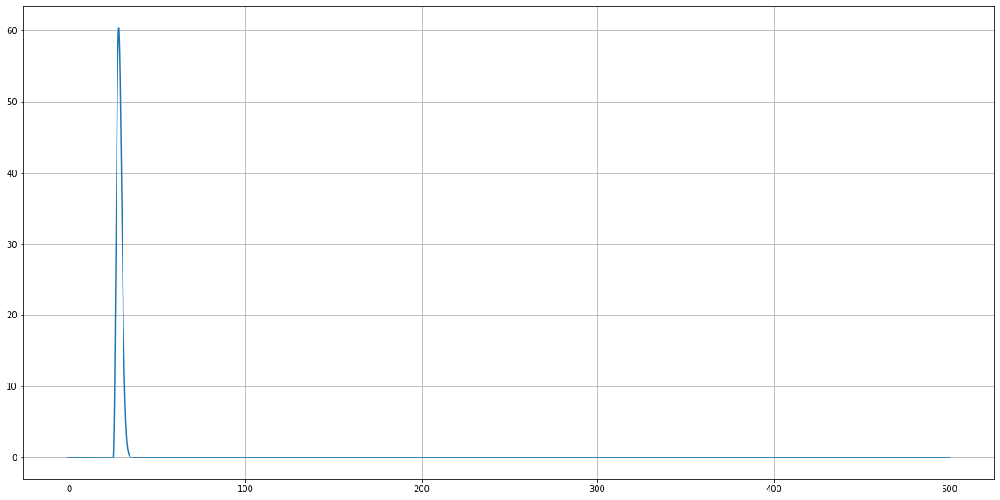

A1: 0.4179364236073382 B1: 48.28388016177837 C1: 0.9549823328825486 D1: 882.974399221735 A2: 0.615179490123131 B2: 77.60751742901196 C2: 0.7713763267643912 D2: 252.82374377160332


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


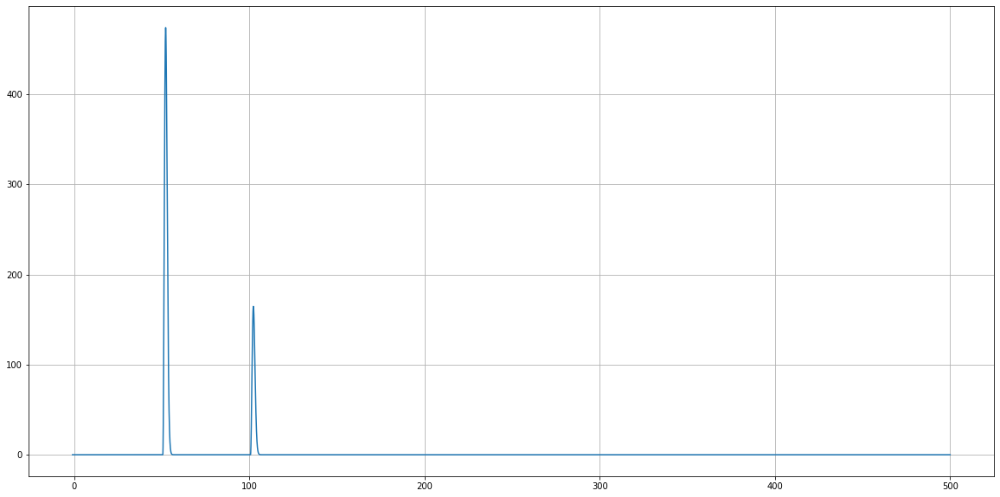

A1: 0.16962944165024307 B1: 3.1147793153911474 C1: 0.009967336592547782 D1: 636.5239505467562 A2: 0.22405554366566605 B2: 24.229948443992065 C2: 0.5113436293349071 D2: 512.1690105222505


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


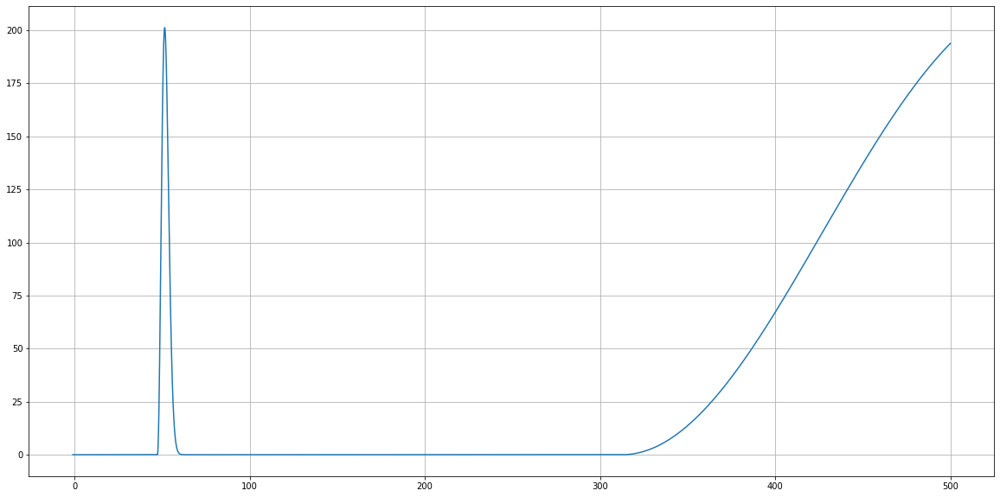

A1: 0.8881002646341185 B1: 28.566281944029313 C1: 0.8083709649216784 D1: 984.8646172763125 A2: 0.434560544975776 B2: 66.18342876535444 C2: 0.08652523413488766 D2: 87.767614216687


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


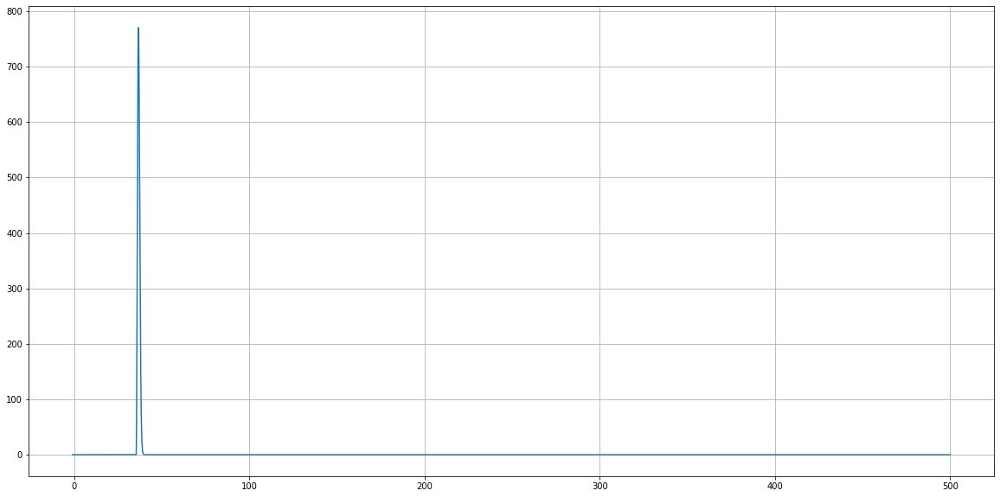

A1: 0.046675222627742485 B1: 97.25580668465031 C1: 0.062026842213925626 D1: 292.5788267629984 A2: 0.2830607676137329 B2: 28.18389608716948 C2: 0.7984631678277032 D2: 488.09936287051613


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


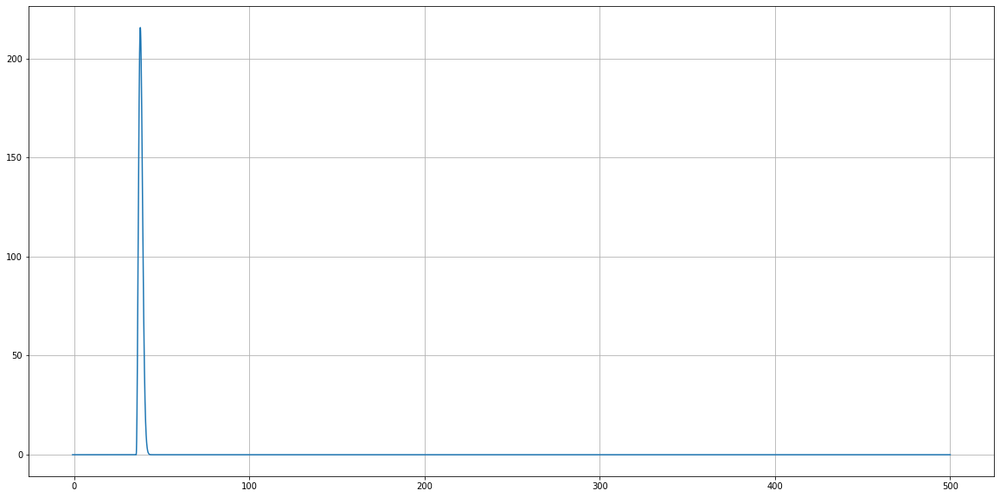

A1: 0.8046513209994077 B1: 86.6188348800689 C1: 0.3495741988689711 D1: 95.43616910187124 A2: 0.7532157872906459 B2: 93.31290002075625 C2: 0.4728907543870039 D2: 760.8637260958596


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


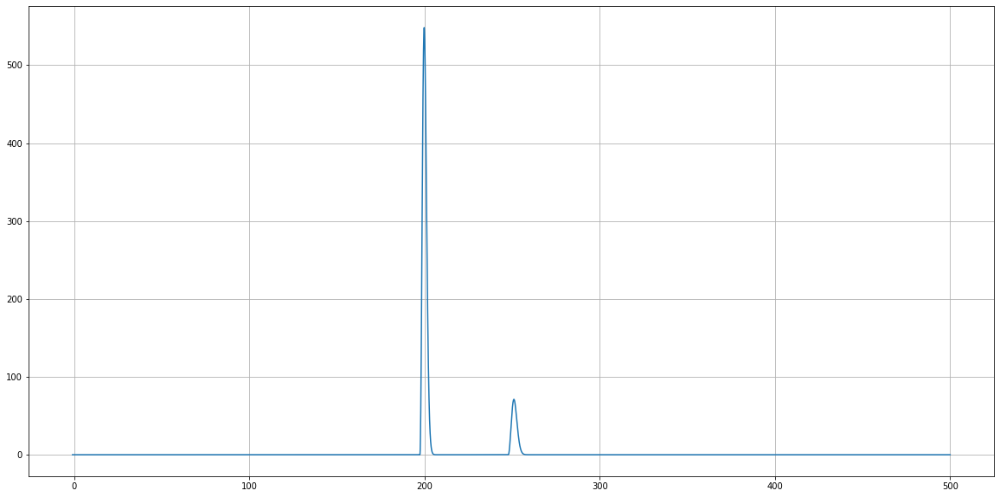

A1: 0.4767387792549077 B1: 25.97105507660754 C1: 0.0345091965104698 D1: 808.0353469358497 A2: 0.5337343843256963 B2: 31.08273507492285 C2: 0.42113804922887255 D2: 71.23866615523356


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


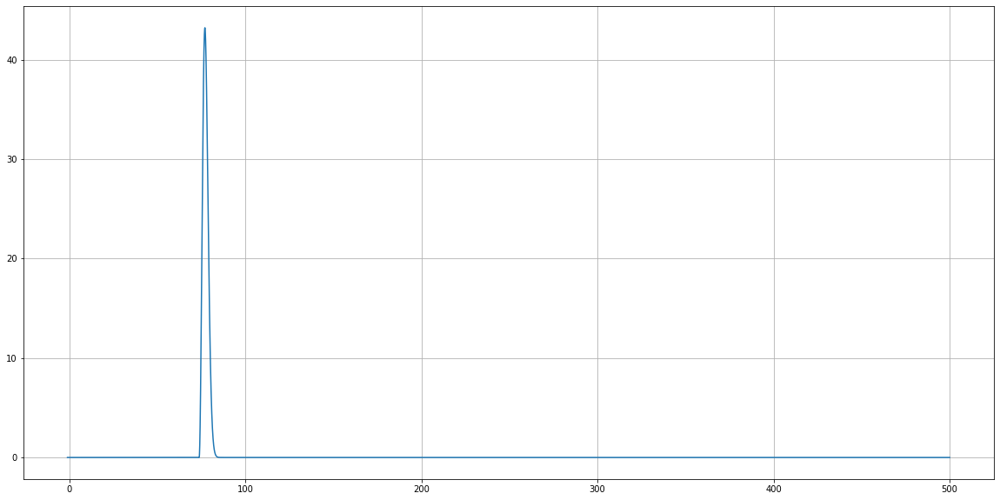

A1: 0.8095726439033061 B1: 4.31272688890012 C1: 0.19592085483189636 D1: 872.5500582491417 A2: 0.7629612584425788 B2: 5.711391735905069 C2: 0.436833591415252 D2: 814.2922156550968


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


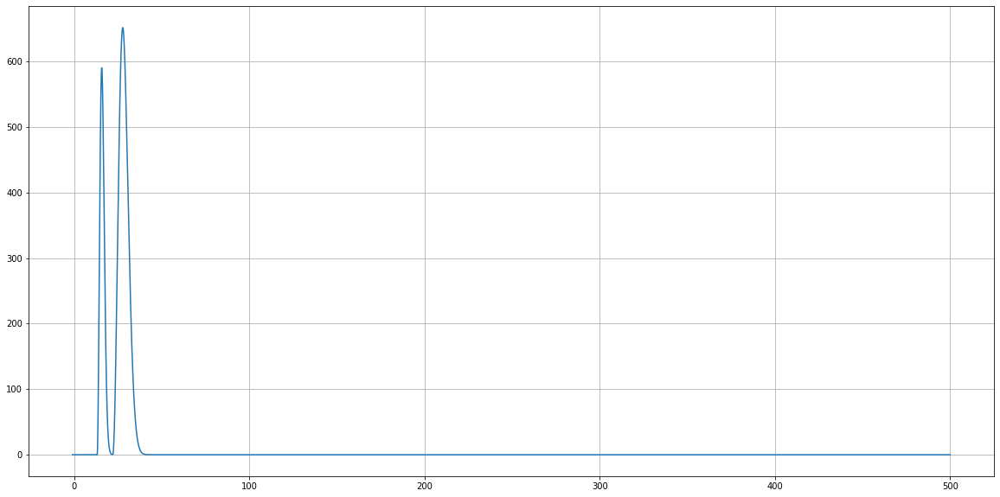

A1: 0.10676246869103301 B1: 64.39263828529742 C1: 0.05921052855992759 D1: 428.2242634880784 A2: 0.29006076218238985 B2: 76.42751994539127 C2: 0.6113128188534579 D2: 163.76861721425072


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


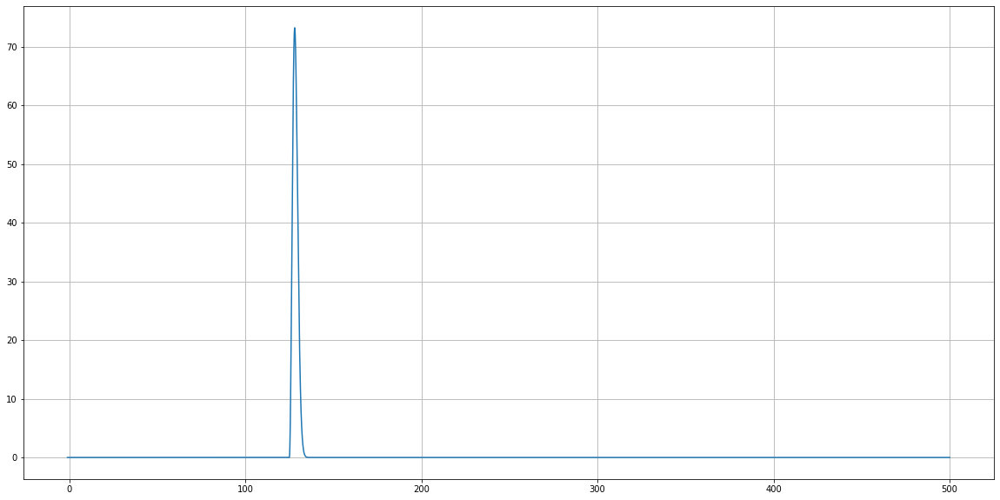

A1: 0.6942683492563436 B1: 50.097682431416544 C1: 0.44487635465758113 D1: 75.24437378909654 A2: 0.7892241141116322 B2: 70.94790948517084 C2: 0.8170124889090203 D2: 471.0464745898183


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


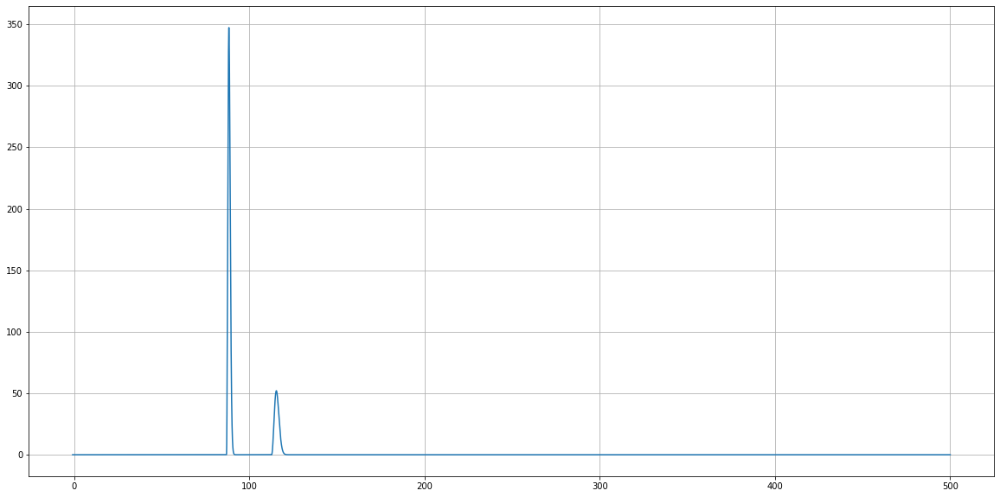

A1: 0.12433806835654782 B1: 17.90576727658102 C1: 0.9266168143856273 D1: 63.73063426326342 A2: 0.0591112262150465 B2: 85.80908658437028 C2: 0.2871896400600362 D2: 319.4769314073849


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


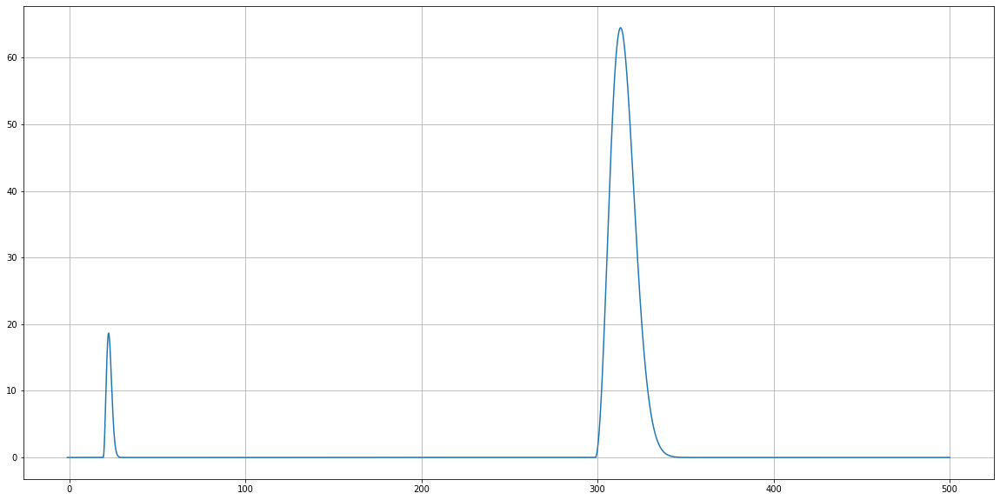

A1: 0.5028087576488801 B1: 35.219535728377025 C1: 0.6088309653815733 D1: 847.8940126034155 A2: 0.4152195249948595 B2: 29.523740995842672 C2: 0.771061878285384 D2: 72.98080542514485


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


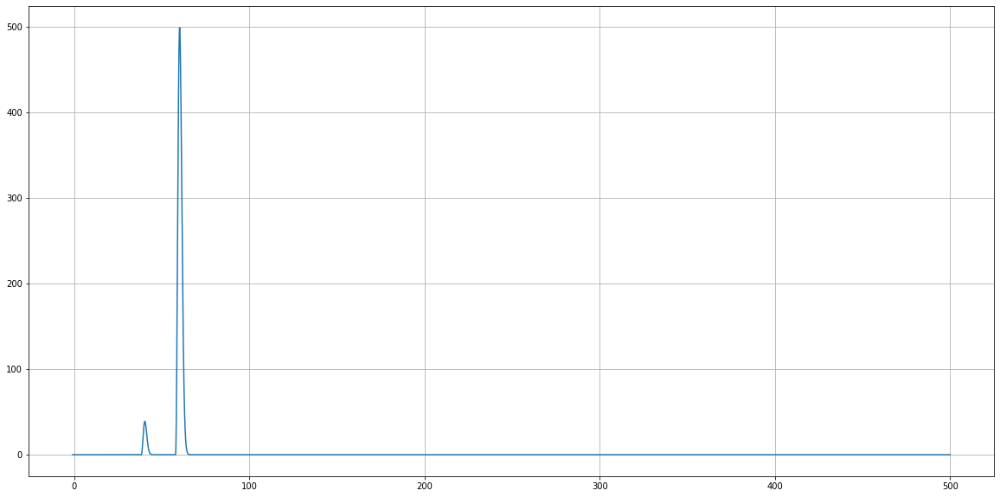

A1: 0.13808419622114865 B1: 35.498312657828365 C1: 0.5349246840434635 D1: 568.8078873177718 A2: 0.10040541650483292 B2: 40.95008165790621 C2: 0.28294395588731636 D2: 664.0451246948104


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


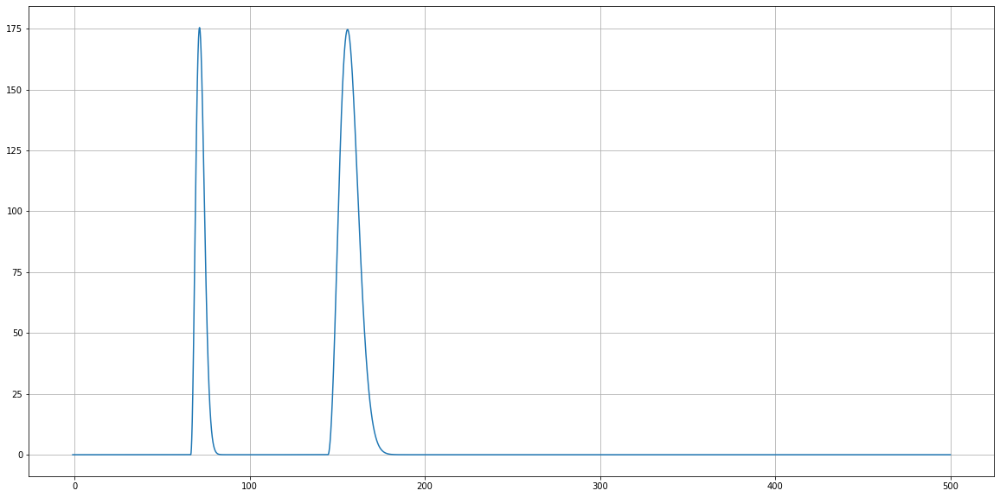

A1: 0.8596346404105379 B1: 86.51866592320191 C1: 0.8296204132692259 D1: 292.55892143623186 A2: 0.9934719520471224 B2: 54.8895858969331 C2: 0.782453507125573 D2: 681.9484264501095


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


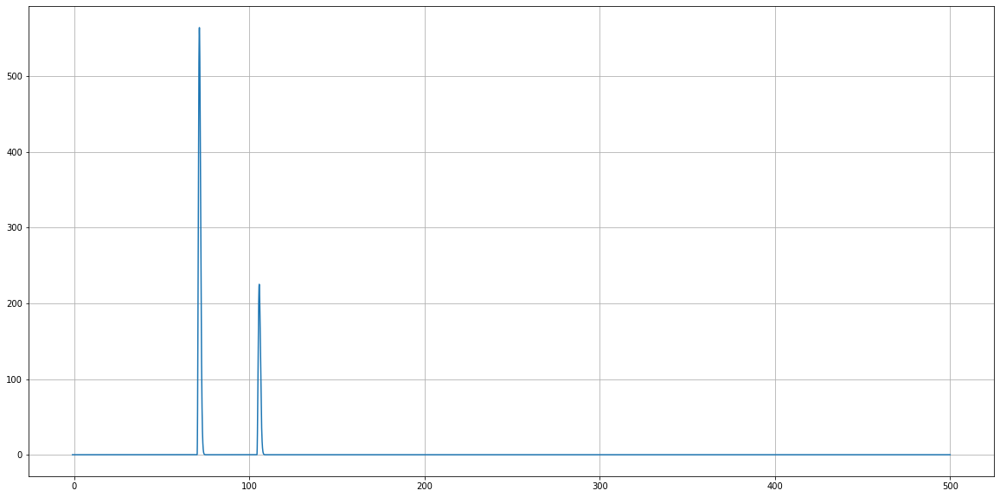

A1: 0.21819509599279574 B1: 70.0880191805 C1: 0.46675945267092145 D1: 855.7004492134583 A2: 0.048506370401152465 B2: 26.25522704172902 C2: 0.4359565729859305 D2: 832.0560162716744


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


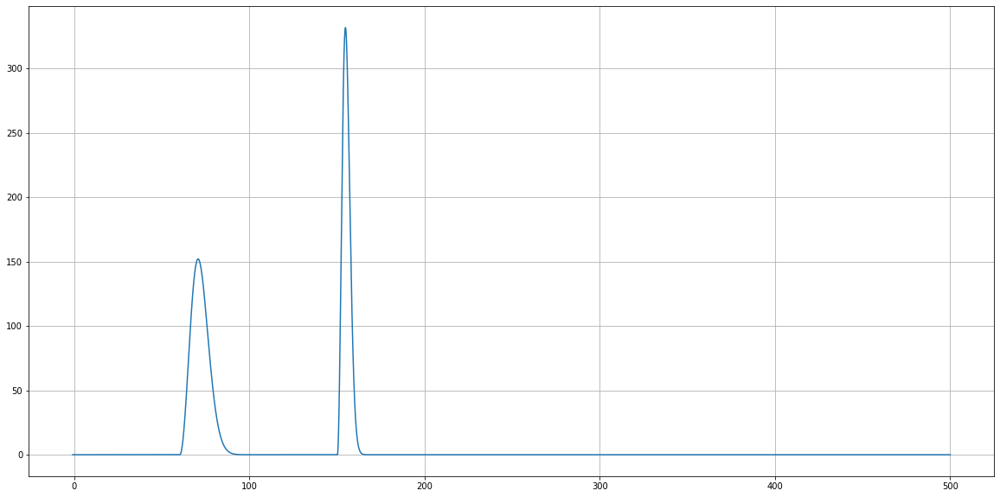

A1: 0.06817850982051743 B1: 85.88745954744013 C1: 0.09308760968582208 D1: 710.0367167873593 A2: 0.894215809421317 B2: 52.071625463668006 C2: 0.6337970934289425 D2: 57.90443038709003


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


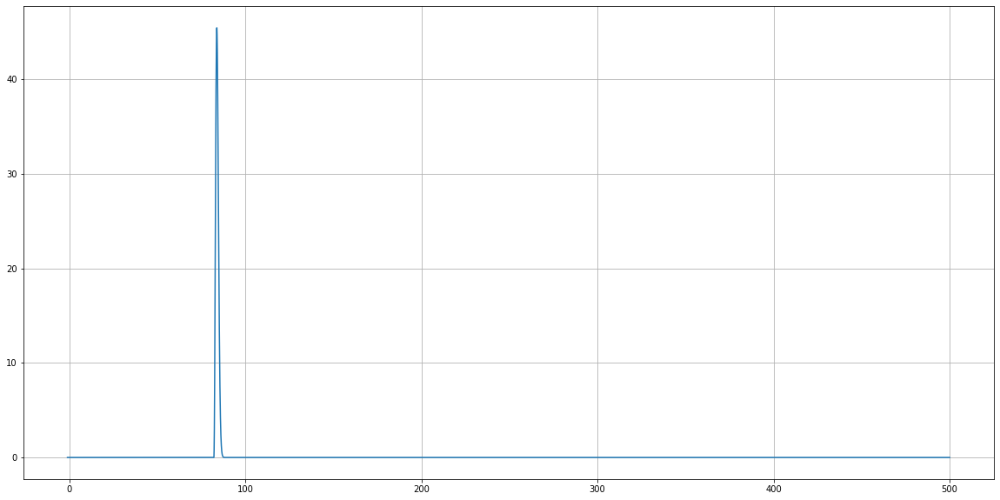

A1: 0.33609473977636506 B1: 46.86659307858962 C1: 0.4908931798316305 D1: 110.60053700802885 A2: 0.42472855058099246 B2: 13.133240260725831 C2: 0.2903464529095877 D2: 220.55800804352833


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


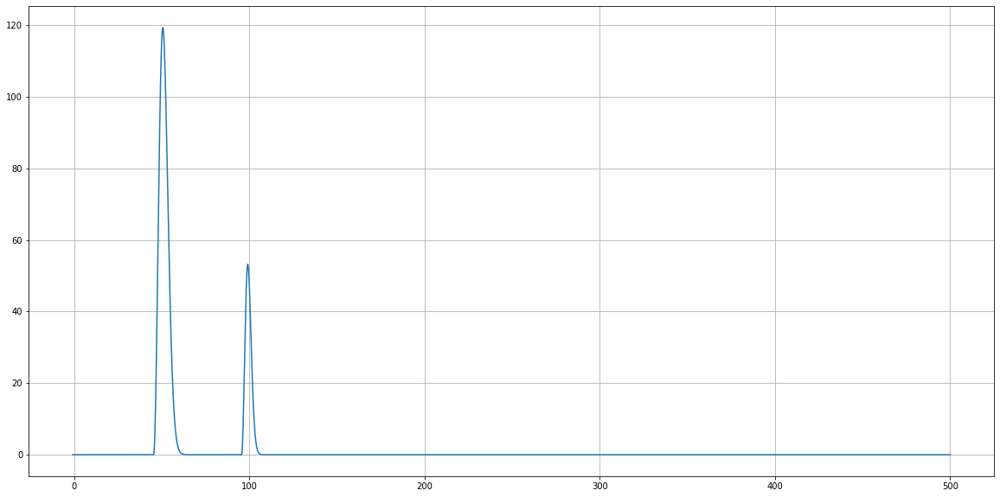

A1: 0.6921310612927282 B1: 0.18914667727431 C1: 0.2739071123132496 D1: 384.19050857617754 A2: 0.7182382774492715 B2: 82.92392901358348 C2: 0.5054078326159792 D2: 153.74022401990806


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


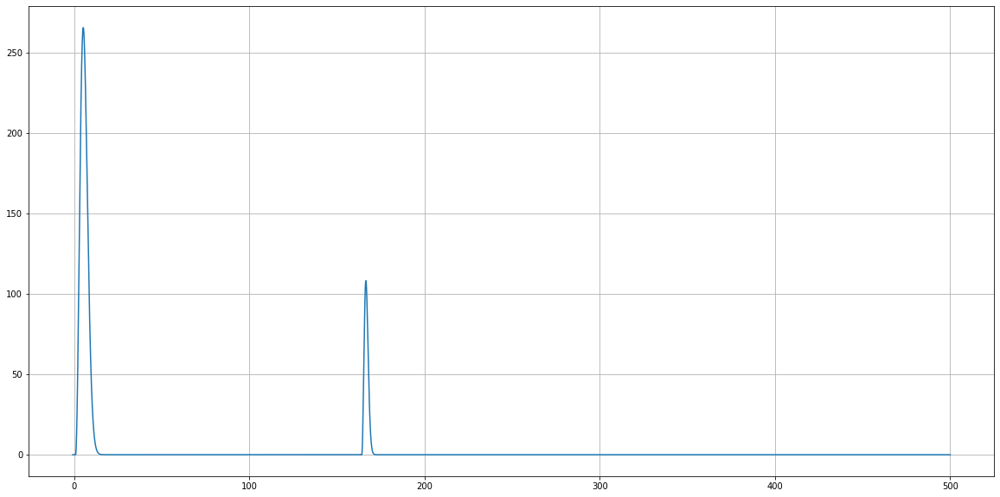

A1: 0.9229253556904407 B1: 92.89294057344331 C1: 0.7242395821719085 D1: 324.8082342362385 A2: 0.9204002187896428 B2: 97.90598262096381 C2: 0.7891770082915097 D2: 924.2749117046428


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


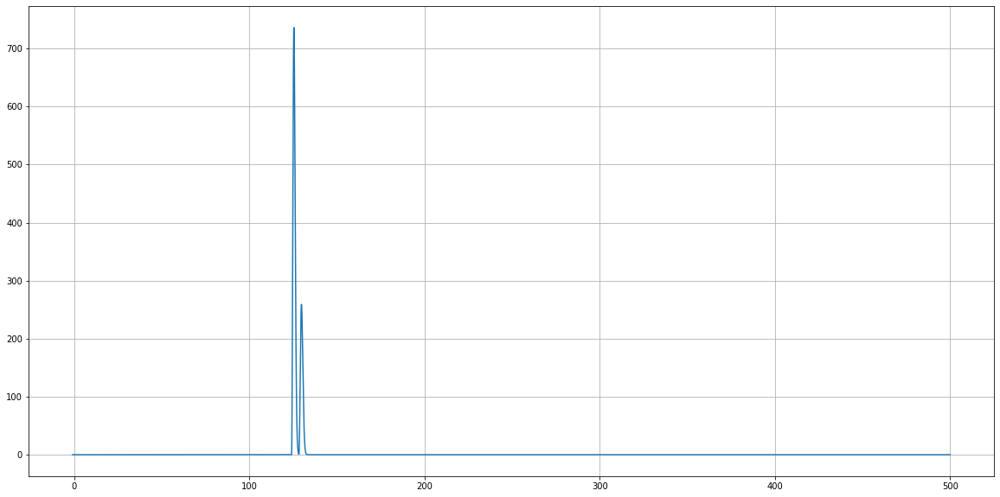

A1: 0.2825431817931171 B1: 8.28110977477936 C1: 0.5701089379399693 D1: 181.48943664671867 A2: 0.5239070223343575 B2: 91.838104764892 C2: 0.1011194678149333 D2: 53.80974168829567


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


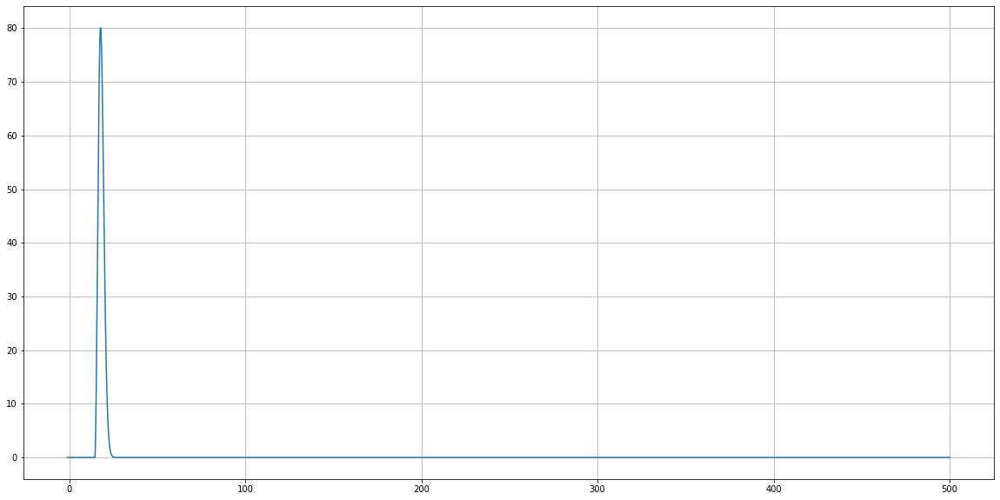

A1: 0.9296354835948799 B1: 9.556038374899833 C1: 0.6901552602515556 D1: 165.9271245205517 A2: 0.5846337899375798 B2: 24.679791200480683 C2: 0.2346522594575503 D2: 32.64134253763207


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


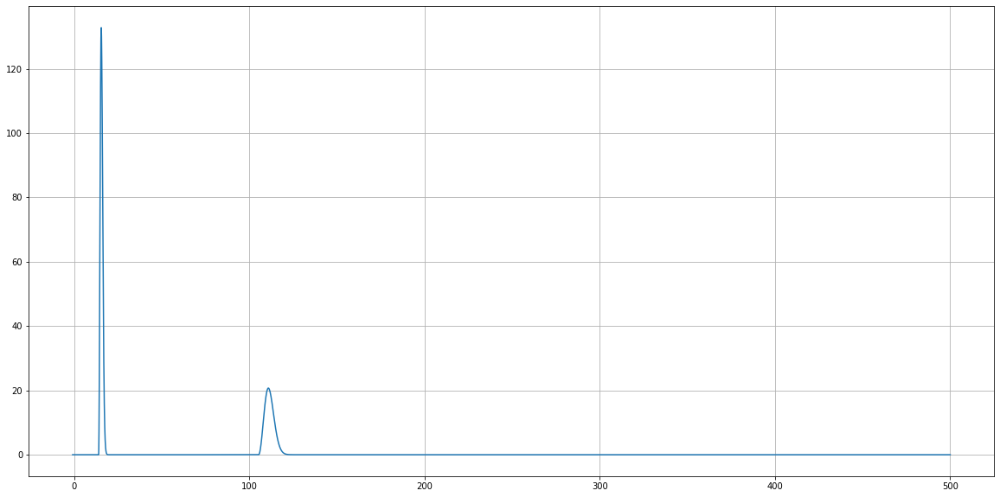

A1: 0.9356755545214165 B1: 25.74614764849372 C1: 0.3517787436839207 D1: 589.491892073346 A2: 0.34907951208860866 B2: 79.63249717031113 C2: 0.4502697797523322 D2: 387.9128075472889


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


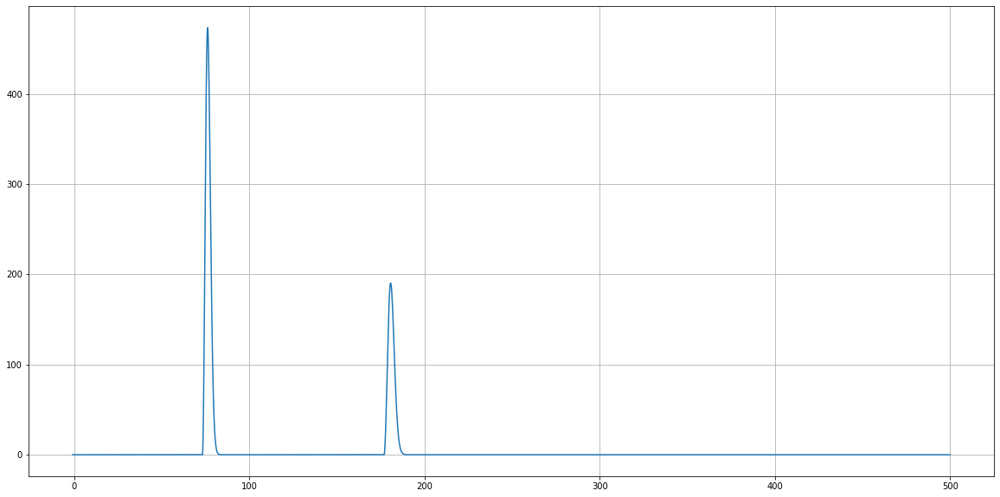

A1: 0.16137315139358854 B1: 31.043569147224627 C1: 0.26986190002121946 D1: 180.93824551232373 A2: 0.6027748119429278 B2: 39.21317530456613 C2: 0.07989846302859926 D2: 970.0578199518666


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


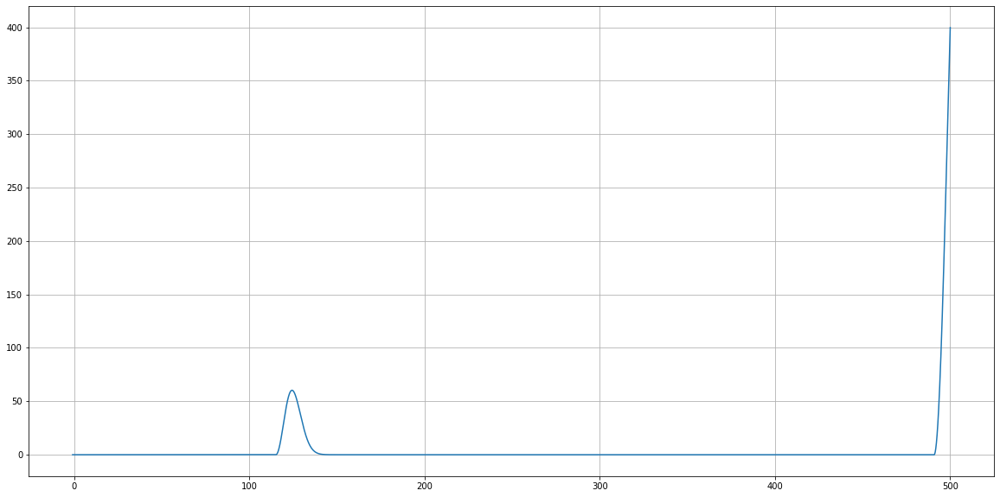

A1: 0.7884778525098617 B1: 63.87262134981808 C1: 0.3778212302821118 D1: 868.7514306164256 A2: 0.02914359763886054 B2: 62.613688759841594 C2: 0.8521891311763151 D2: 524.2414397402703


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


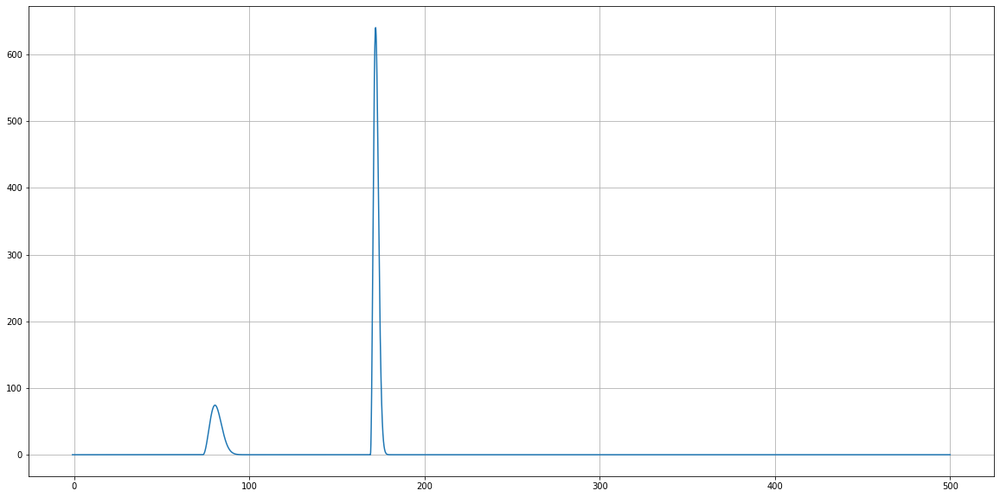

A1: 0.03217393529666446 B1: 85.21811884668297 C1: 0.8899952170398767 D1: 63.584212951475536 A2: 0.3484673177875437 B2: 36.173004622056325 C2: 0.15598959947560387 D2: 436.3580836614853


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


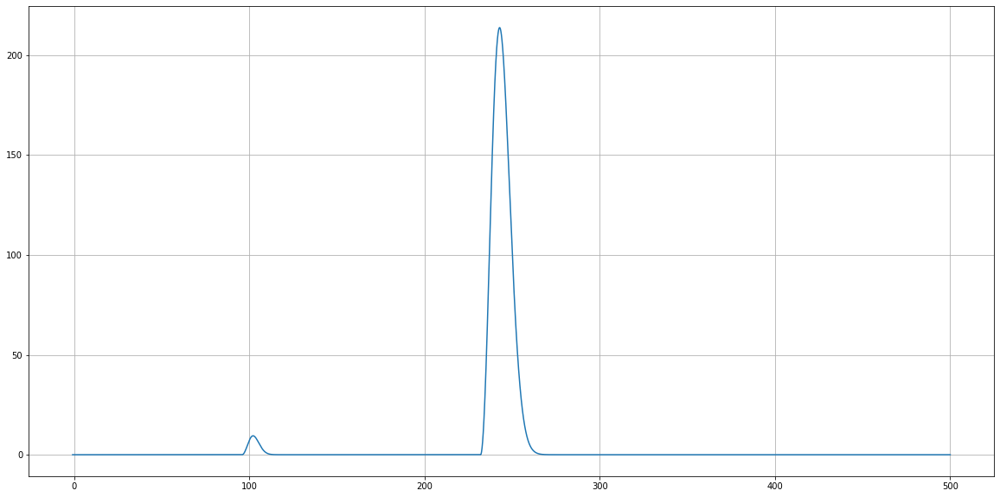

A1: 0.4996724386404011 B1: 25.25837589916907 C1: 0.1927380493525338 D1: 669.3653173752439 A2: 0.19647199195386322 B2: 55.111400357456596 C2: 0.06471229571249038 D2: 648.8872784388768


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


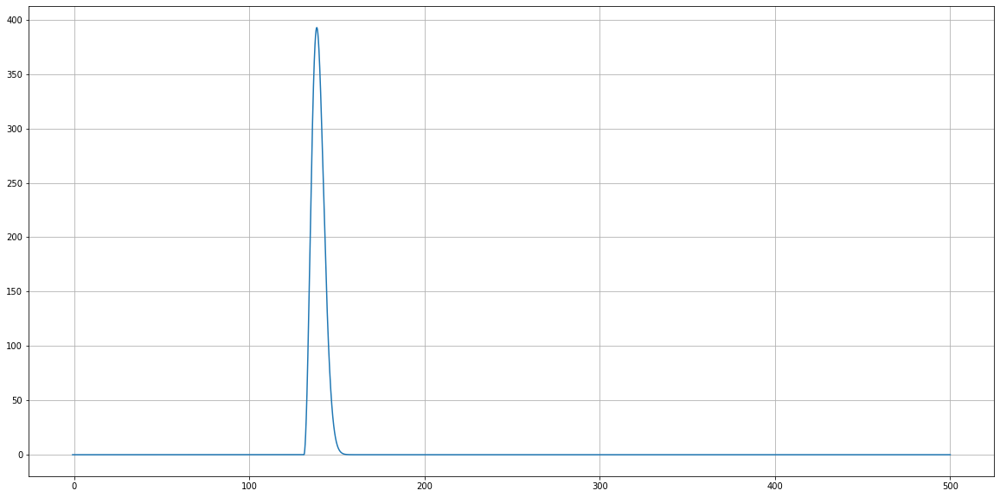

A1: 0.022043622371346494 B1: 99.50403907027976 C1: 0.24242507120814394 D1: 80.41823010987814 A2: 0.9351383214664568 B2: 86.58147847296563 C2: 0.2586756955206231 D2: 761.1078019289573


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


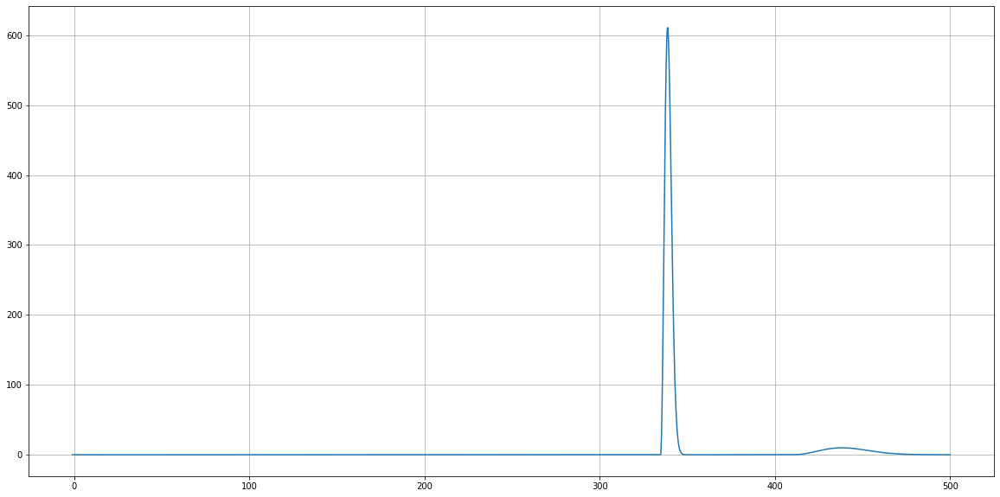

A1: 0.3816001332238699 B1: 83.27010649608268 C1: 0.20795123091774625 D1: 943.1857876083591 A2: 0.30436869747509243 B2: 84.61913081111132 C2: 0.26228490404980354 D2: 382.5999483153537


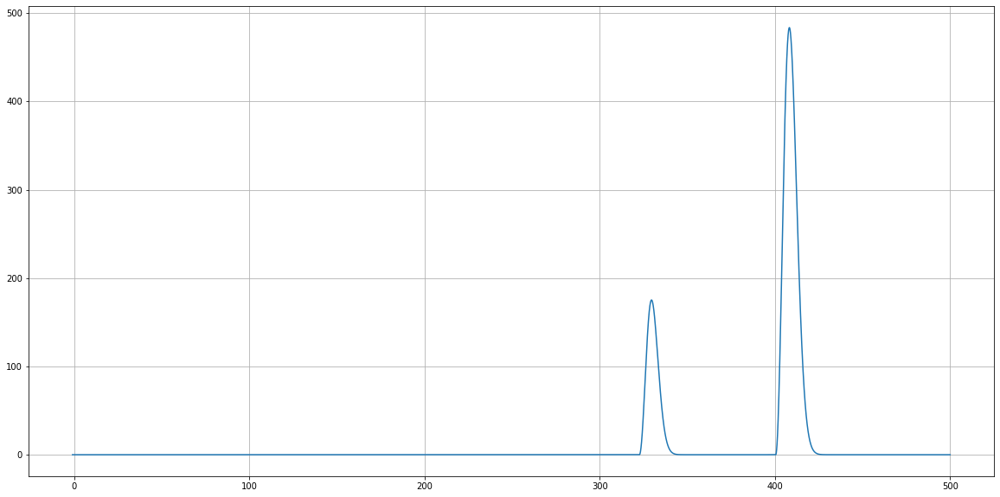

A1: 0.6079157588174496 B1: 79.30629295232113 C1: 0.35599278434739323 D1: 113.88995877429564 A2: 0.3520732143400993 B2: 85.87127311125829 C2: 0.8542089946031372 D2: 729.3116195320075


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


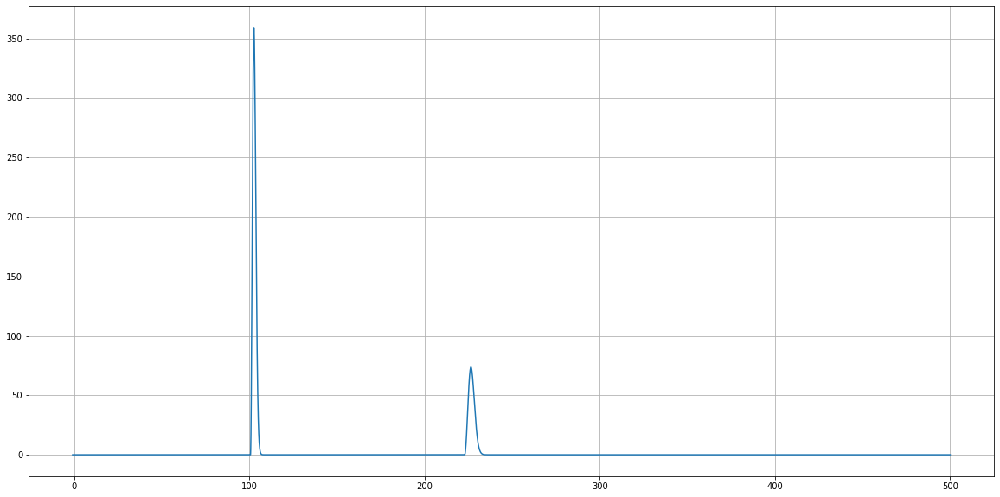

A1: 0.0561471143857486 B1: 3.25221351549847 C1: 0.1901820343272298 D1: 518.7382077270383 A2: 0.5207580271181472 B2: 36.84621759969654 C2: 0.42660846456089296 D2: 10.004987106446372


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


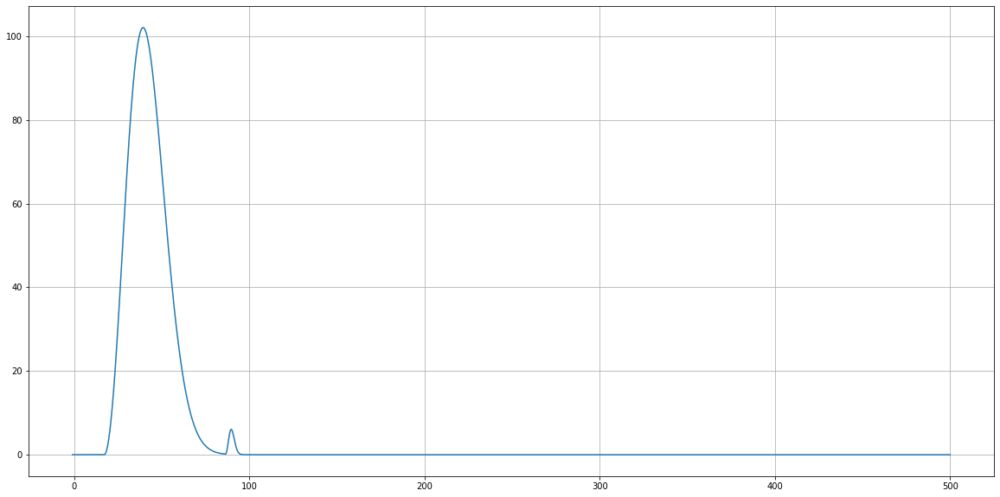

A1: 0.5430962621975846 B1: 16.192198498442302 C1: 0.3532965183279724 D1: 774.5781190415494 A2: 0.010596988336109447 B2: 5.325336680346126 C2: 0.19176258435565097 D2: 595.0620128127168


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


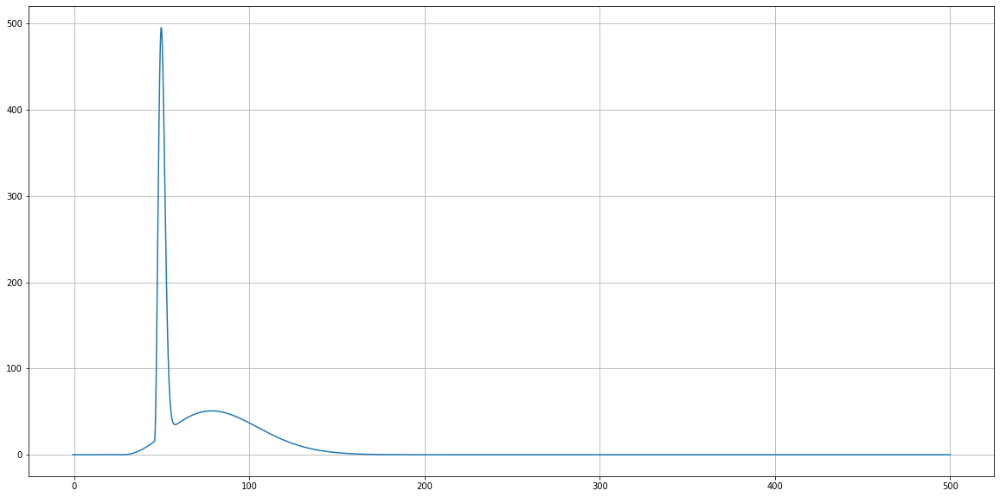

A1: 0.8646399883715551 B1: 89.31121942047537 C1: 0.05209532203511691 D1: 672.3133970293268 A2: 0.02670713359475918 B2: 93.4389086288271 C2: 0.9725009930173372 D2: 962.2940706381559


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


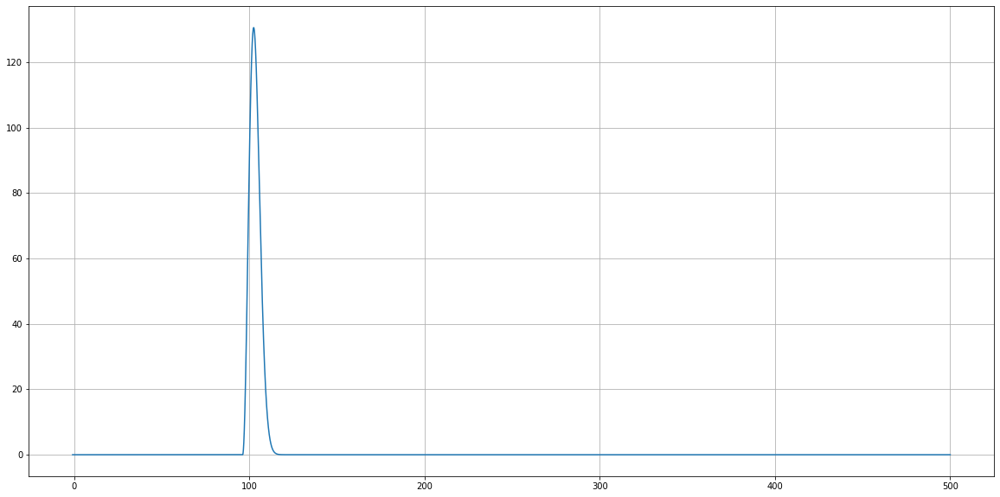

A1: 0.0519729818921294 B1: 46.61917226144866 C1: 0.1418614546687541 D1: 643.1098438798358 A2: 0.4174762719780699 B2: 12.347053653579987 C2: 0.9432844702508365 D2: 926.4799375311301


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


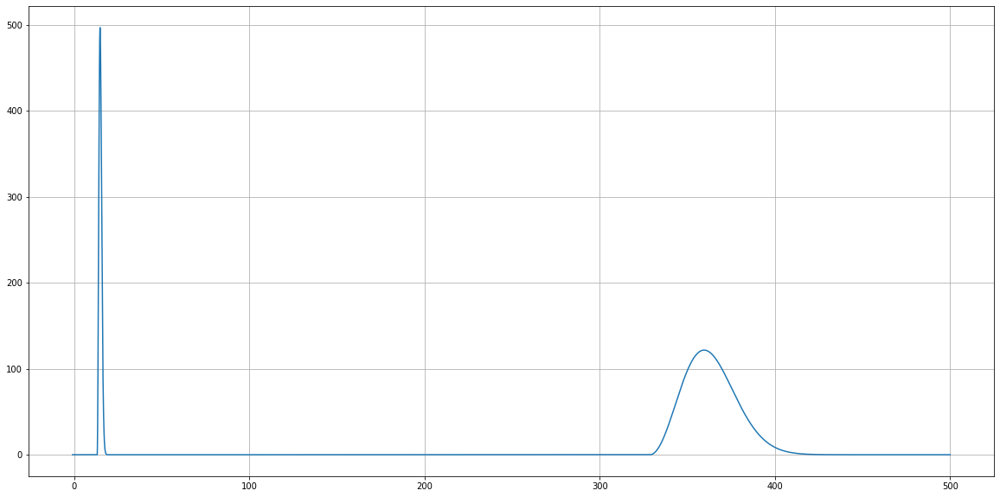

A1: 0.8517851418387185 B1: 42.1170883535955 C1: 0.761089514439629 D1: 939.5283431027219 A2: 0.0720210089837775 B2: 69.54830654119726 C2: 0.9877697832327568 D2: 712.5041771019767


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


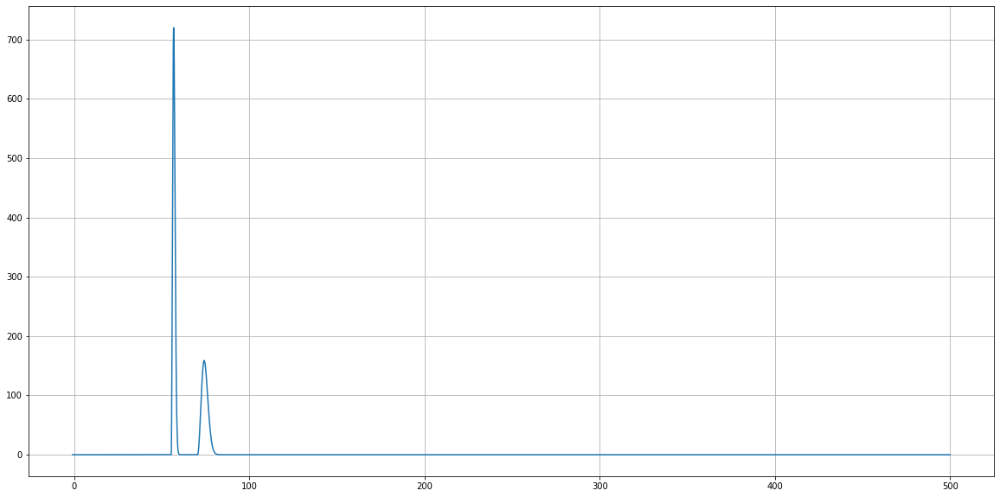

A1: 0.170046153856804 B1: 24.474518998603656 C1: 0.3111693725379133 D1: 714.9822901393892 A2: 0.8736016696582366 B2: 95.4849846132169 C2: 0.8128409865294132 D2: 95.46648935846247


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


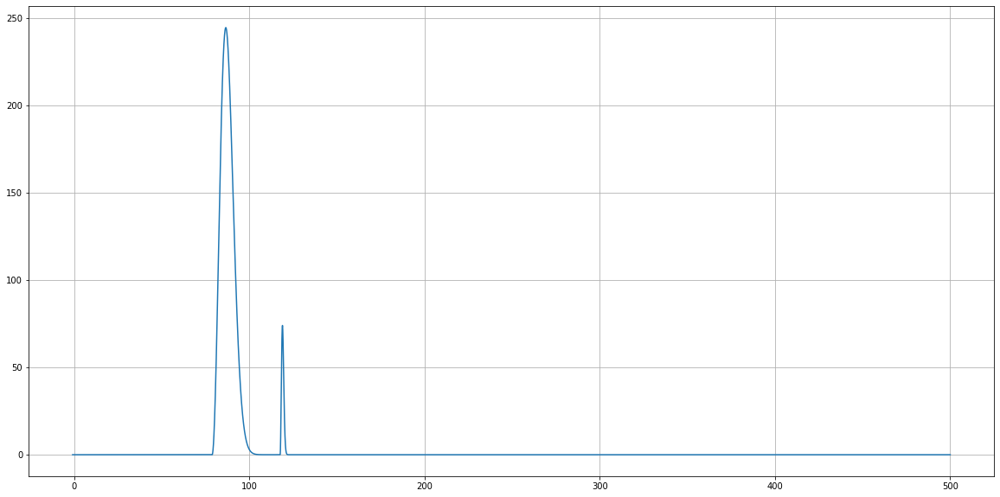

A1: 0.8228134810041899 B1: 32.312490361865684 C1: 0.5075681904090729 D1: 567.9553343787344 A2: 0.9307707261944991 B2: 74.60117798980889 C2: 0.9806740850965232 D2: 522.878304808546


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


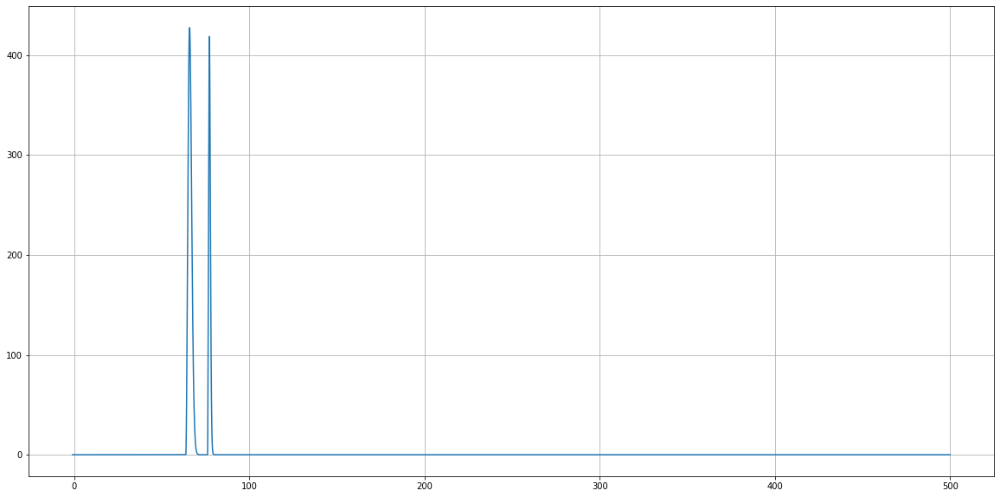

A1: 0.24127514482990942 B1: 74.50656323004509 C1: 0.708208214270618 D1: 839.3420976463211 A2: 0.6914536862159583 B2: 53.45362703964325 C2: 0.0462563515433313 D2: 965.0765039668128


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


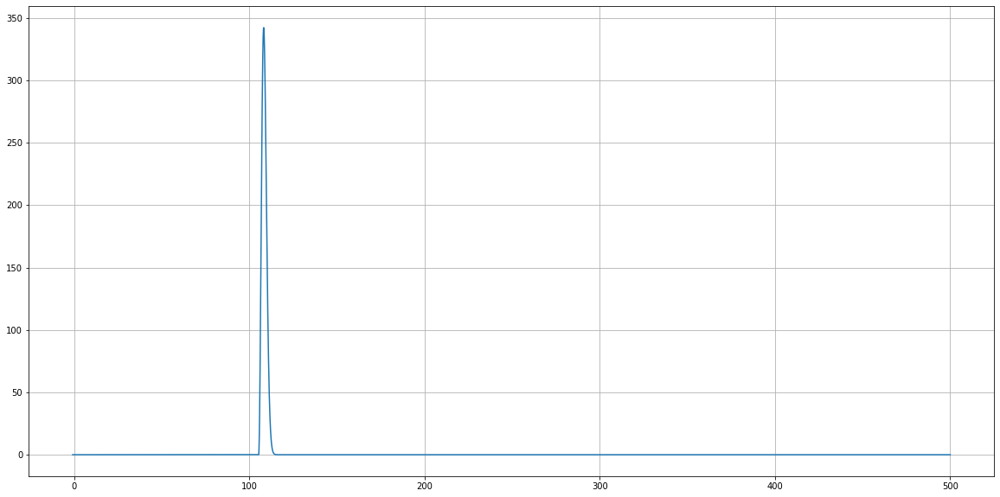

A1: 0.7265044504905351 B1: 76.22404746103905 C1: 0.44204722371413074 D1: 990.2064625045572 A2: 0.2340209164264344 B2: 54.02830561253062 C2: 0.849319451106681 D2: 925.2495973762752


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


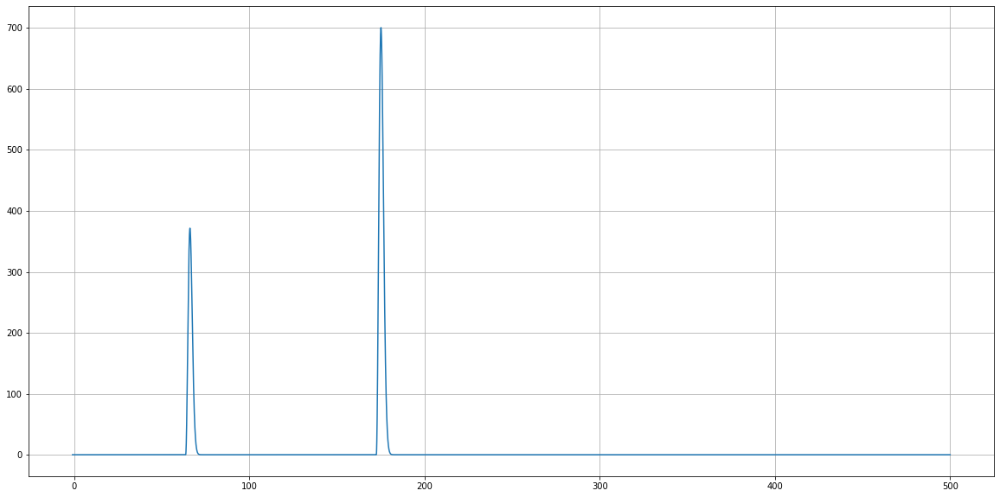

A1: 0.19528993471124634 B1: 72.20875663626643 C1: 0.07386888062731622 D1: 182.58583369552028 A2: 0.8630086818396048 B2: 55.04025340312023 C2: 0.05035137176905313 D2: 537.9818671195225


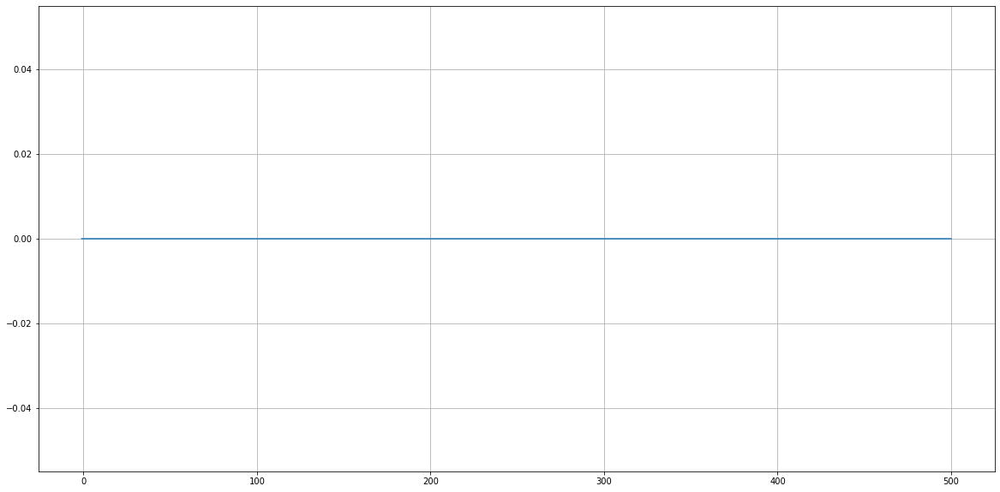

A1: 0.839330556174218 B1: 84.81596954700342 C1: 0.5362132874250677 D1: 883.0646223018676 A2: 0.41427452193805203 B2: 29.548325079171466 C2: 0.38266771396007526 D2: 218.6226494042467


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


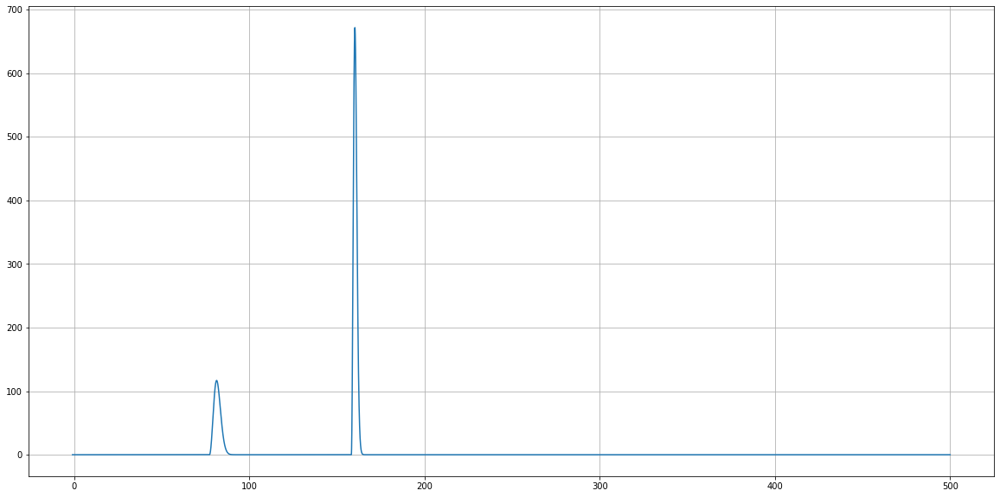

A1: 0.48639370101138757 B1: 90.17987984566552 C1: 0.111197007345741 D1: 162.82705013789644 A2: 0.4101691896918974 B2: 46.91135999363817 C2: 0.8030952992704113 D2: 477.7132779258204


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


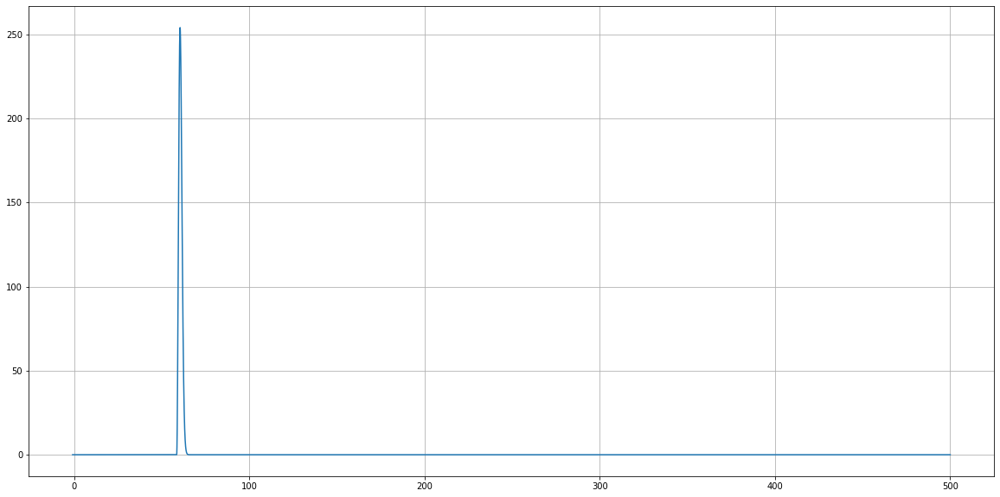

A1: 0.6227203340639013 B1: 70.64807472432825 C1: 0.9509131258243735 D1: 769.2650820523909 A2: 0.4603790859177579 B2: 88.9880251554533 C2: 0.524179719653723 D2: 475.1506731687467


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


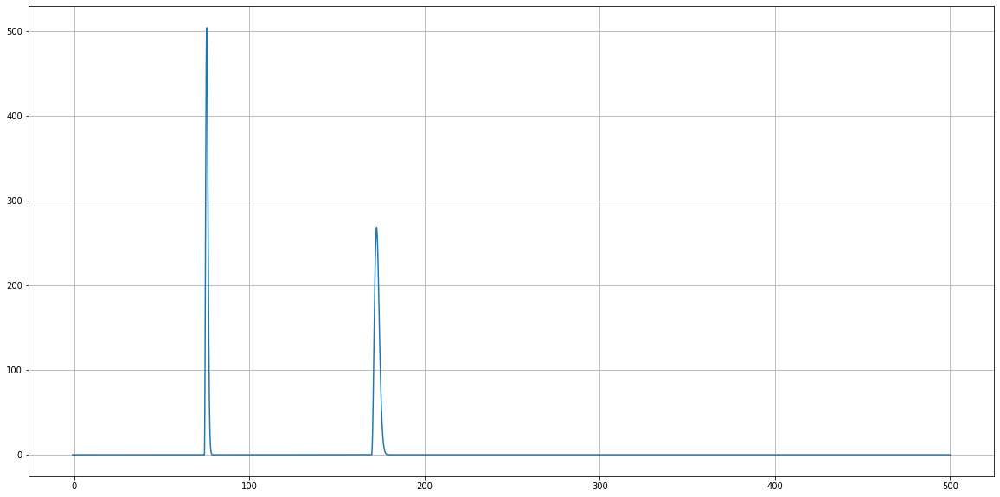

A1: 0.6361877966707279 B1: 4.1845025631314865 C1: 0.900340583737072 D1: 407.6327625967532 A2: 0.8057976951195214 B2: 92.3144141476831 C2: 0.5029103835952126 D2: 372.6547153207512


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


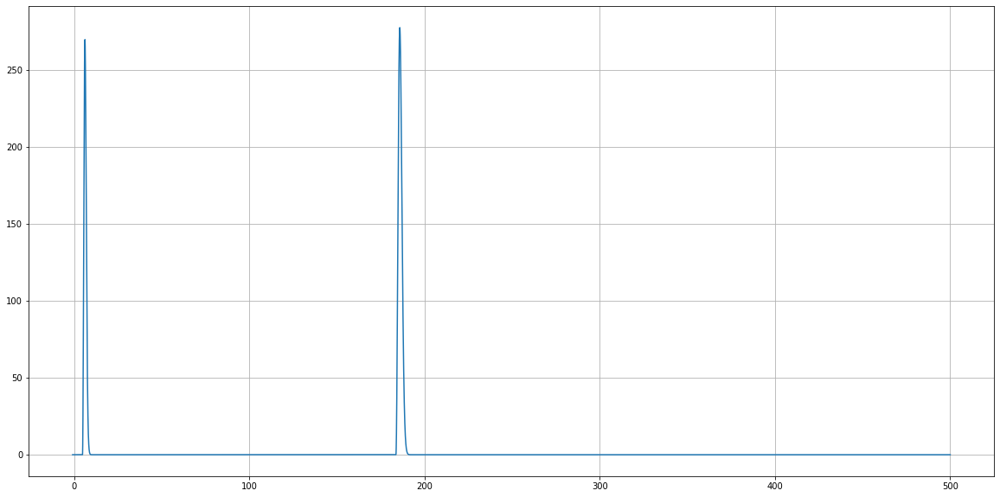

A1: 0.5512804368132791 B1: 37.73281242639411 C1: 0.8450756665412721 D1: 608.8568793089937 A2: 0.5109553038472311 B2: 2.302877230800071 C2: 0.8231519602391051 D2: 720.5043384074979


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


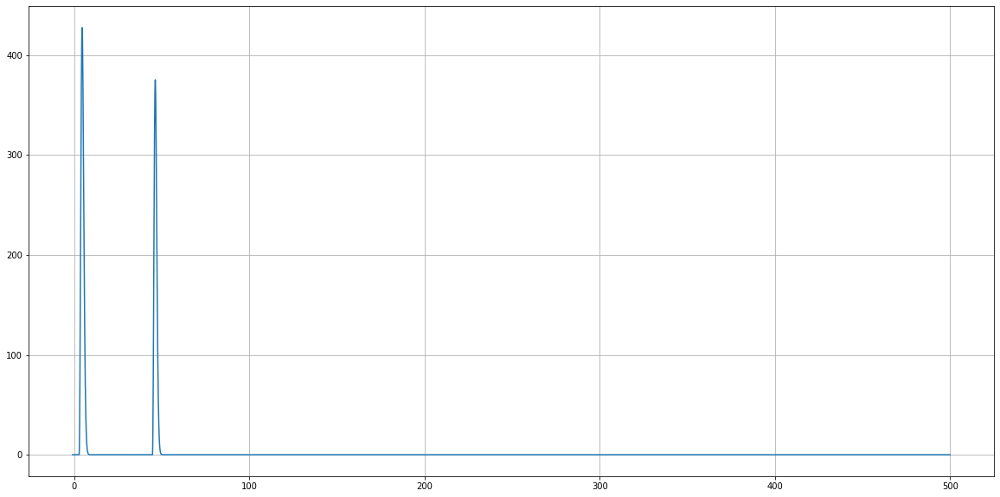

A1: 0.8497135252826161 B1: 82.81468231847158 C1: 0.9836540787648258 D1: 589.7456159092931 A2: 0.46408564784476947 B2: 22.21487654359231 C2: 0.8687636601547781 D2: 831.950074478416


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


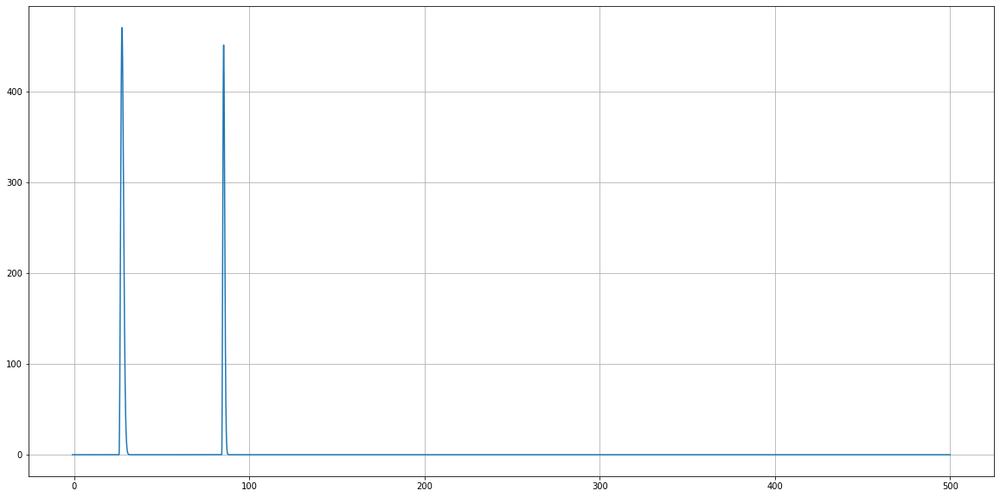

A1: 0.5968528695753097 B1: 81.04477510598555 C1: 0.019310869233031824 D1: 883.3187144990767 A2: 0.23674999817848286 B2: 18.124716206380466 C2: 0.5473108537809732 D2: 32.09228394305508


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


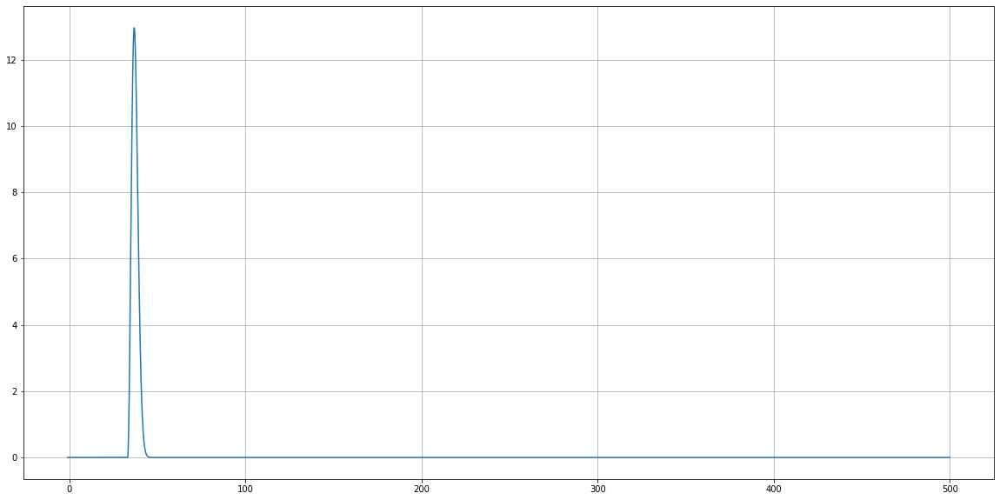

A1: 0.6099510490175202 B1: 26.06473081360535 C1: 0.6571305636598961 D1: 536.0720820225225 A2: 0.6908944772564193 B2: 5.461722104184419 C2: 0.13830246021557102 D2: 601.174144064705


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


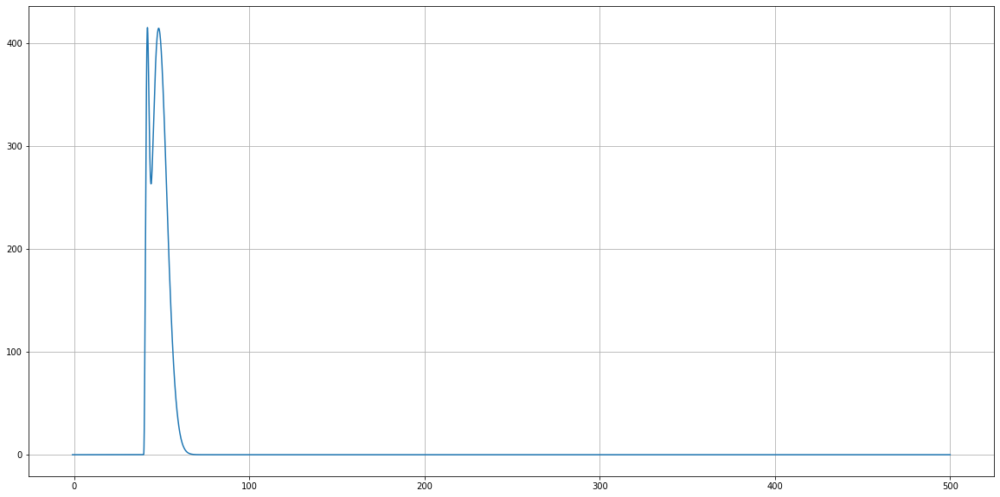

A1: 0.0888271858581946 B1: 23.47479628031475 C1: 0.0563928888124795 D1: 826.7289511506233 A2: 0.3812366501893172 B2: 86.64637217274979 C2: 0.5937867492702735 D2: 831.0953146353337


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


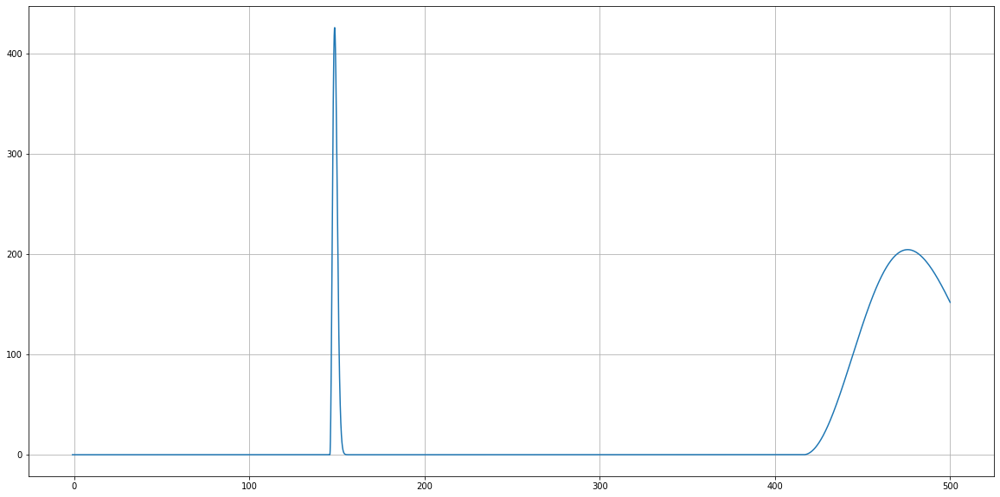

A1: 0.16051351359969301 B1: 22.6261360515138 C1: 0.7334866435475422 D1: 412.0302915227896 A2: 0.15833588806057652 B2: 83.60084062809494 C2: 0.021463886006277688 D2: 790.0463275541964


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


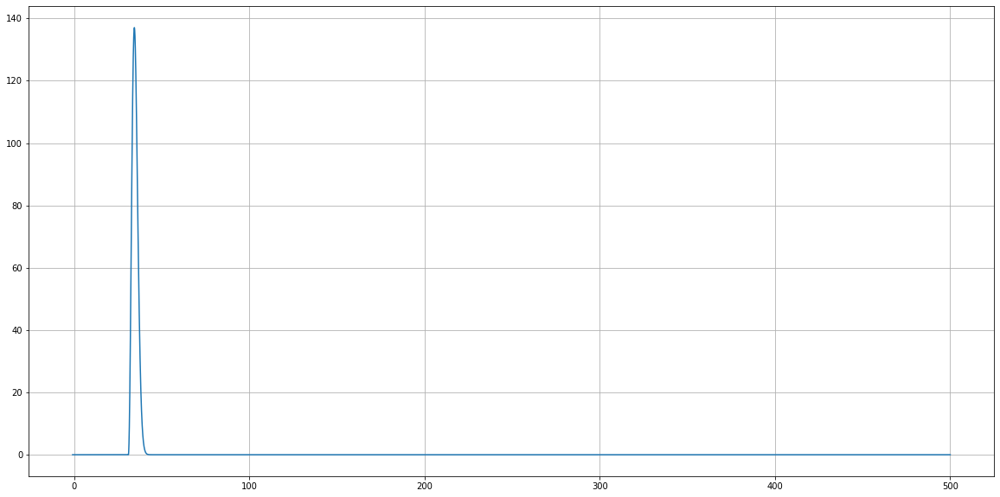

A1: 0.35833793745078335 B1: 60.51417283107481 C1: 0.32433299582919695 D1: 445.9915503421337 A2: 0.9912711510408804 B2: 43.63361543207019 C2: 0.6311247547665129 D2: 587.7831713329598


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


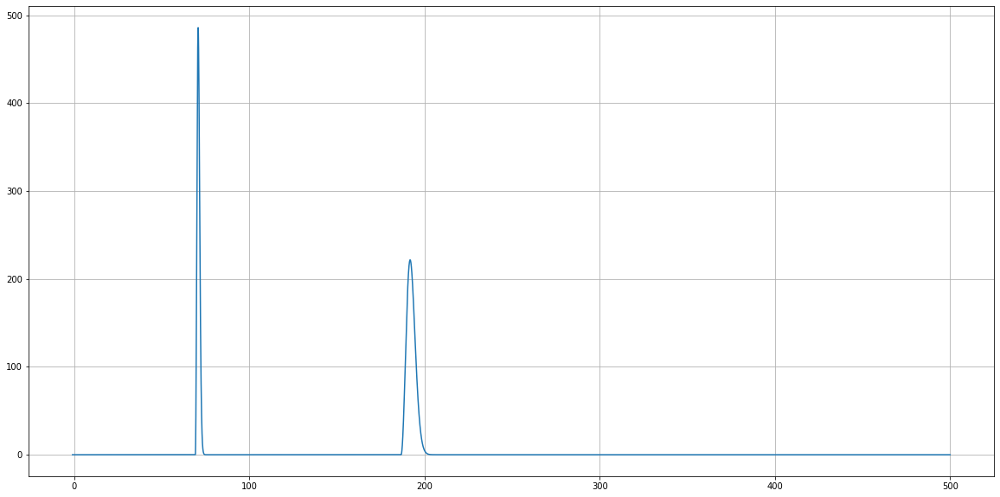

A1: 0.7491901064353654 B1: 34.81297812817271 C1: 0.2599311299996647 D1: 744.3963093125213 A2: 0.40785251262141553 B2: 91.2860179269266 C2: 0.8529985758411842 D2: 90.22711608381006


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


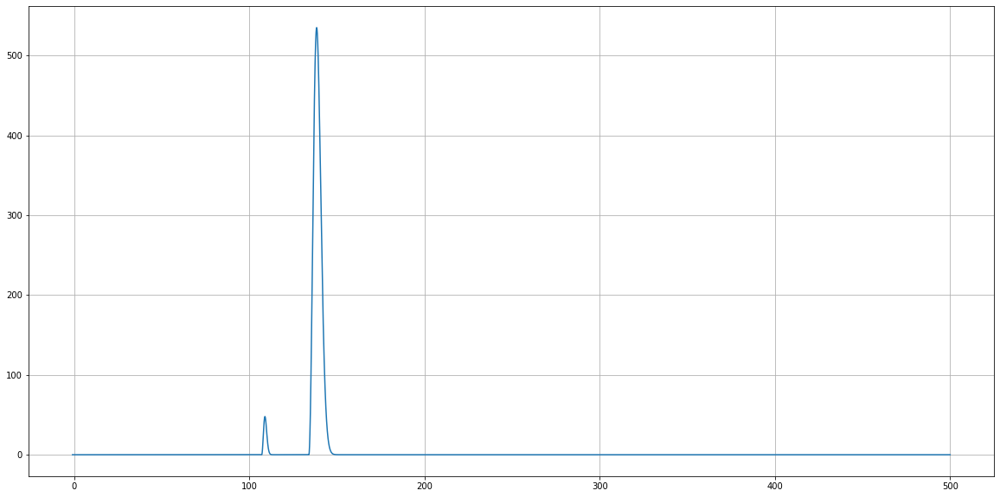

A1: 0.2278003020608883 B1: 3.4651984148072468 C1: 0.8755040861021518 D1: 359.5458376050302 A2: 0.9961604314928791 B2: 59.853498119273986 C2: 0.9075858468529056 D2: 80.6801423573218


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


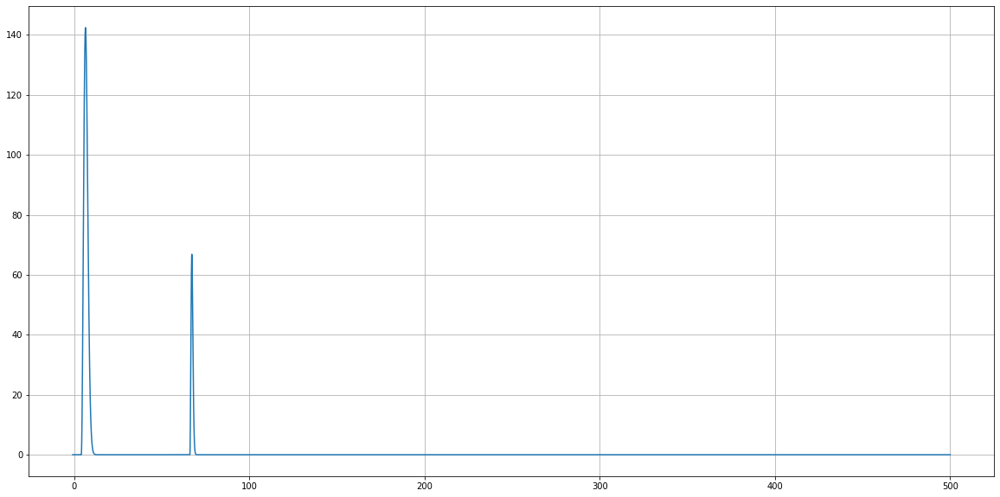

A1: 0.1955348864096974 B1: 63.18347992914721 C1: 0.14329403759163806 D1: 606.7279147062214 A2: 0.2528830612768942 B2: 44.571173447845645 C2: 0.6246416238731838 D2: 818.7785075574232


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


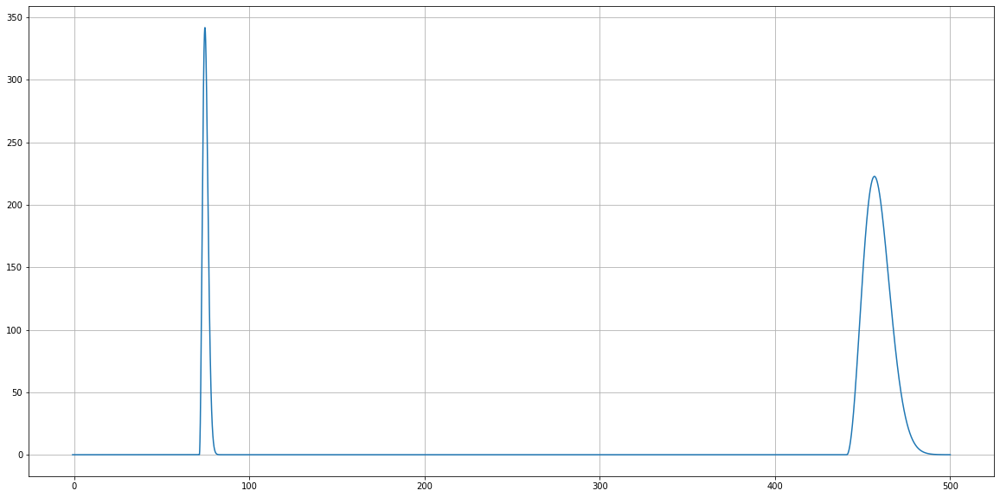

A1: 0.2886284554062174 B1: 0.152867469866369 C1: 0.028634162832553267 D1: 672.2583669509107 A2: 0.750691336952188 B2: 99.55257793254293 C2: 0.30300843374992803 D2: 324.7503175286723


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


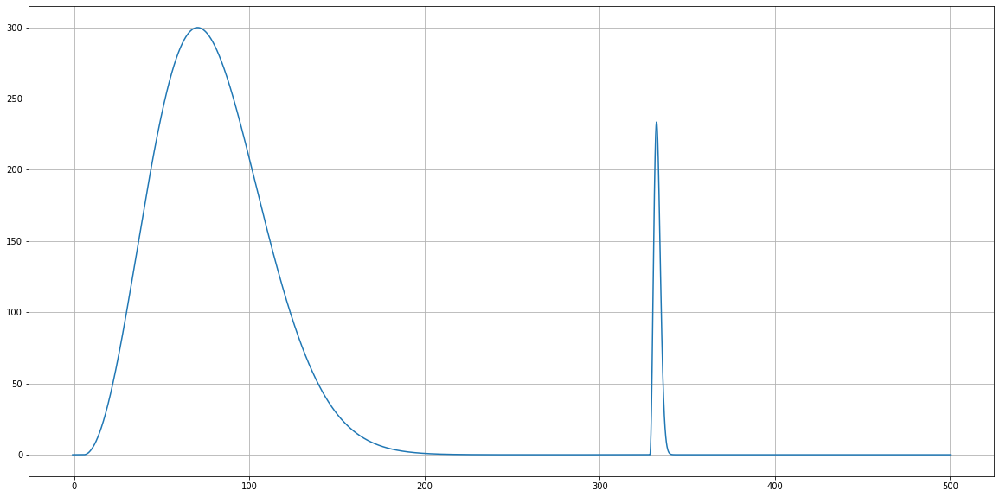

A1: 0.6450944859684603 B1: 69.97745035870011 C1: 0.40791061335844847 D1: 339.4796587146927 A2: 0.7066644377156539 B2: 43.63150308279915 C2: 0.2101882478300976 D2: 52.38438779553833


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


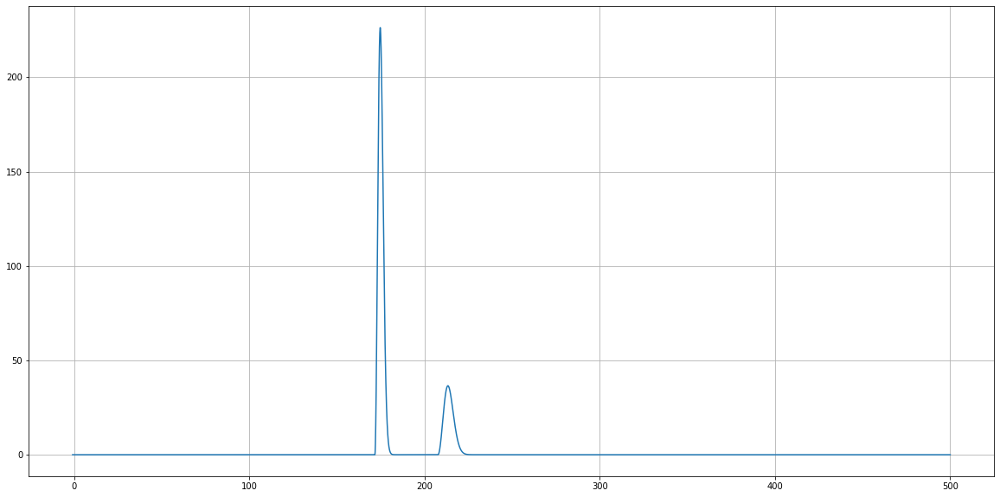

A1: 0.27355853289046594 B1: 64.42611932386912 C1: 0.08399674495571718 D1: 755.2021634491038 A2: 0.08059887110619768 B2: 49.213109903305565 C2: 0.8452229879754071 D2: 682.0769017900221


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


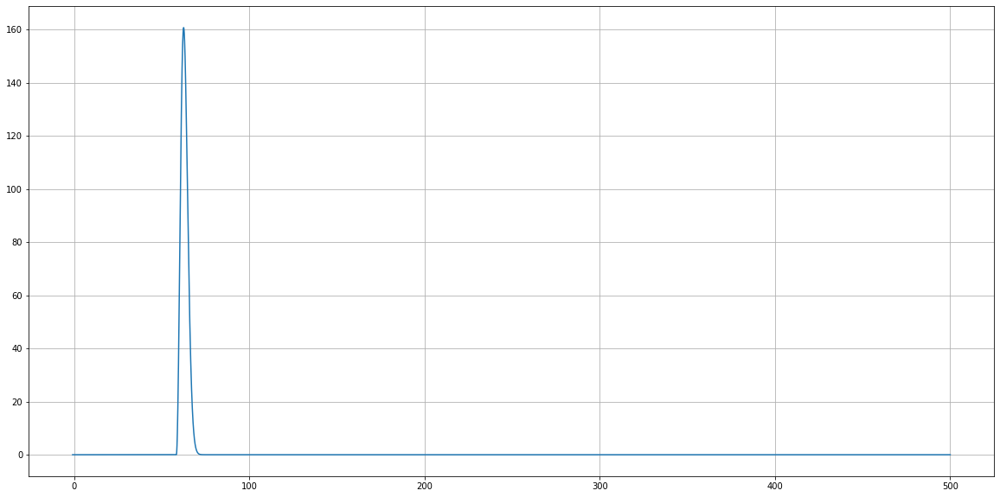

A1: 0.5314869675439725 B1: 80.76909554769252 C1: 0.5638813194013008 D1: 910.383245558681 A2: 0.9411894908931232 B2: 16.472405351409392 C2: 0.0832648590392634 D2: 41.87045360371544


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


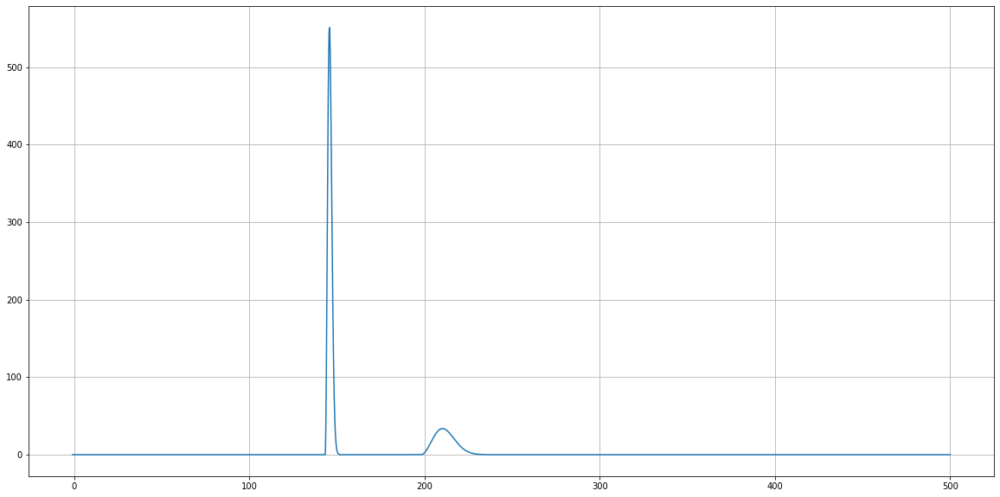

A1: 0.8715736596225834 B1: 53.18818961174 C1: 0.11462851890752068 D1: 479.78468031714584 A2: 0.4983263635004963 B2: 65.59656661787959 C2: 0.7588265298403998 D2: 165.2434202656835


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


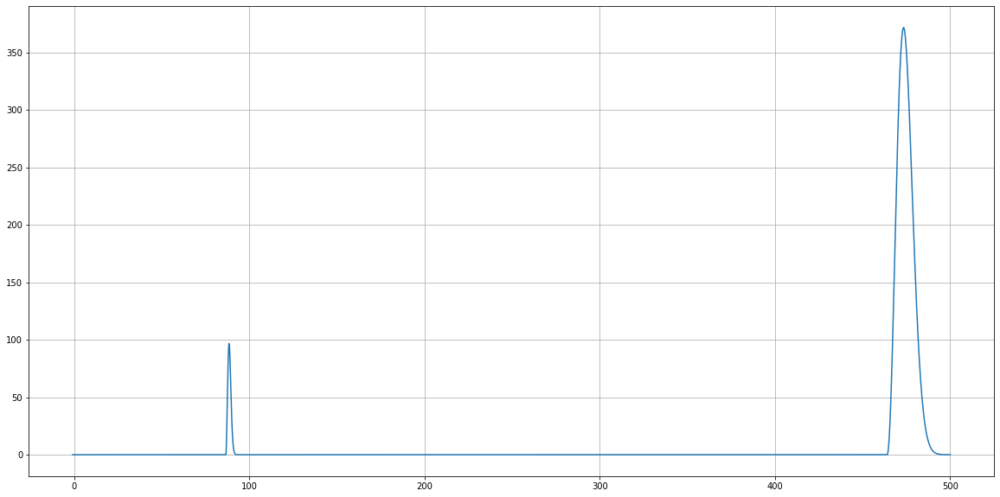

A1: 0.841932930622827 B1: 71.97115247326384 C1: 0.4625415369913176 D1: 853.5367959921452 A2: 0.11770045640280236 B2: 46.20756495450503 C2: 0.8218001381554267 D2: 25.228859500108115


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


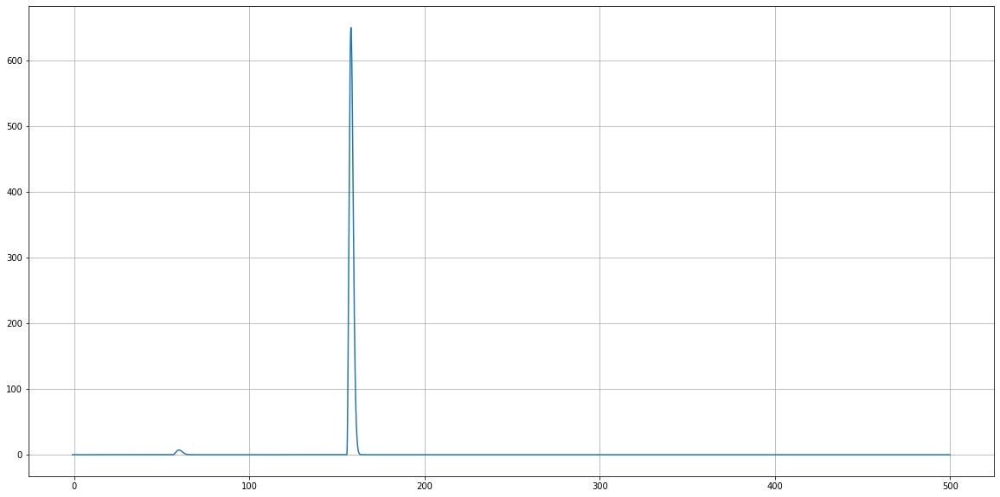

A1: 0.13881500549093084 B1: 95.94234839936571 C1: 0.09643644493692227 D1: 987.8009743512293 A2: 0.93393330117839 B2: 22.27628995602039 C2: 0.8961428577717205 D2: 396.524468714893


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


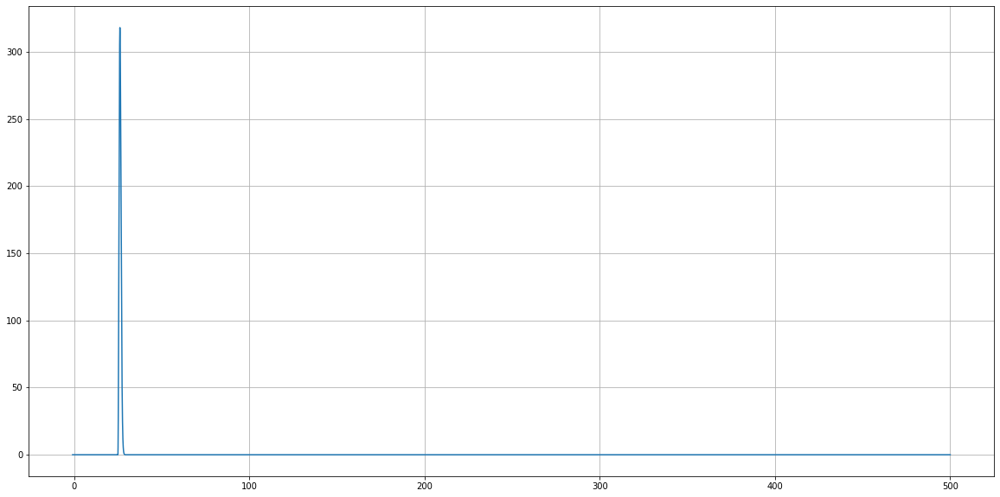

A1: 0.06925338365085032 B1: 47.62052674983017 C1: 0.5260949797712968 D1: 519.3758382836011 A2: 0.5284326110588474 B2: 24.37100314762448 C2: 0.26678770200058866 D2: 564.4576941551654


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


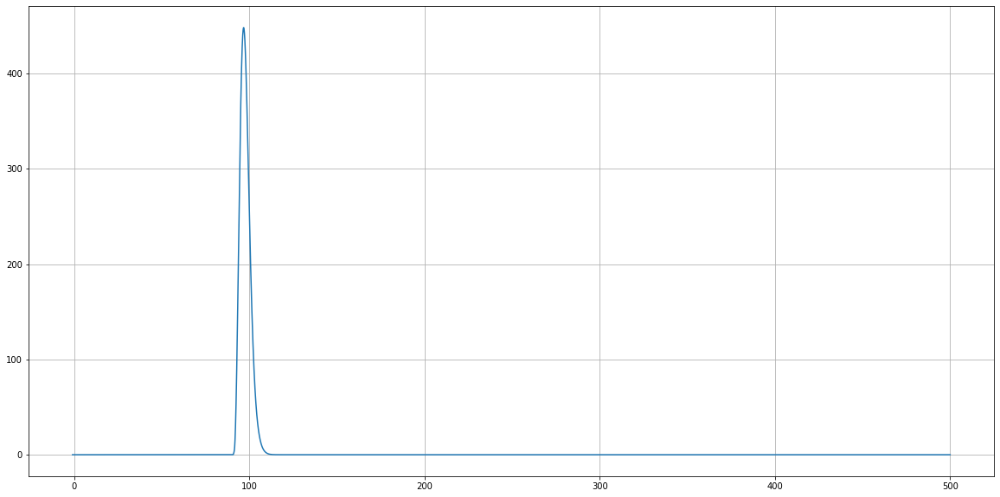

A1: 0.6829630953398352 B1: 72.38518950924018 C1: 0.11636557486029908 D1: 315.1751958330563 A2: 0.9711485151463126 B2: 16.449905606742522 C2: 0.5415598450994051 D2: 967.0128731097396


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


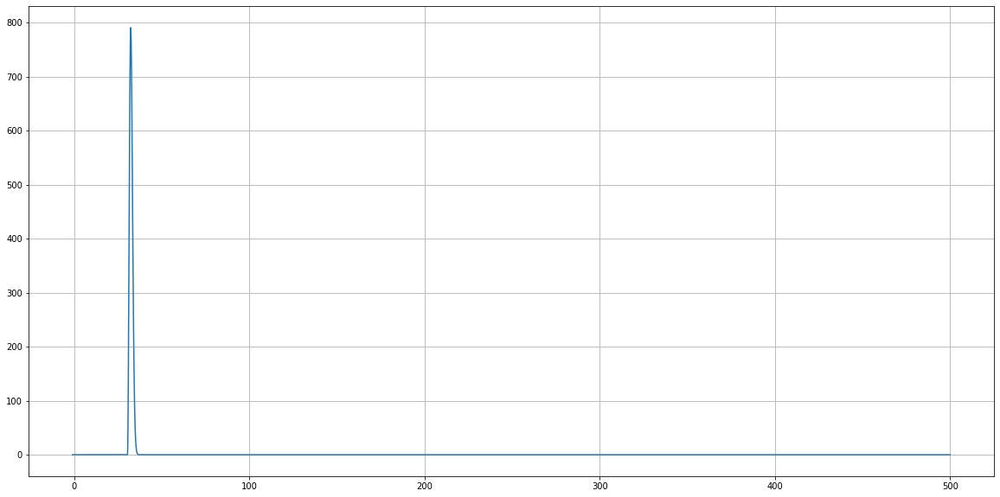

A1: 0.7732773452565909 B1: 97.34721223468411 C1: 0.6486563297711381 D1: 927.1220283613407 A2: 0.8821467299301248 B2: 41.69991390793476 C2: 0.7470182766024679 D2: 740.1050728469056


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


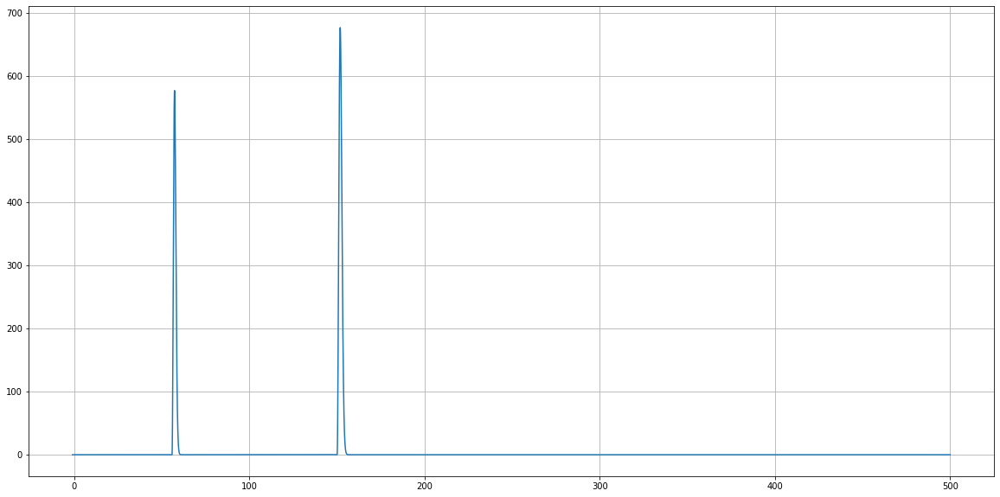

A1: 0.06843291574950361 B1: 84.84326441437176 C1: 0.8146978747765857 D1: 10.114862942198432 A2: 0.12804739877122628 B2: 99.74023179232151 C2: 0.9781104611503253 D2: 221.74615434762313


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


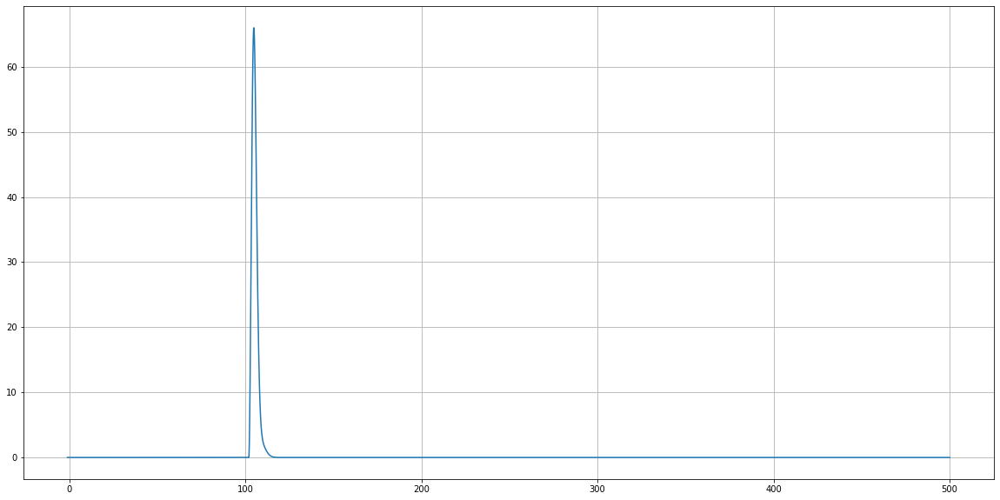

A1: 0.8428773439075719 B1: 80.66416674220017 C1: 0.21189463026040745 D1: 445.9948902845765 A2: 0.07200381819207691 B2: 86.0606057584451 C2: 0.1428573438542886 D2: 487.9097291930937


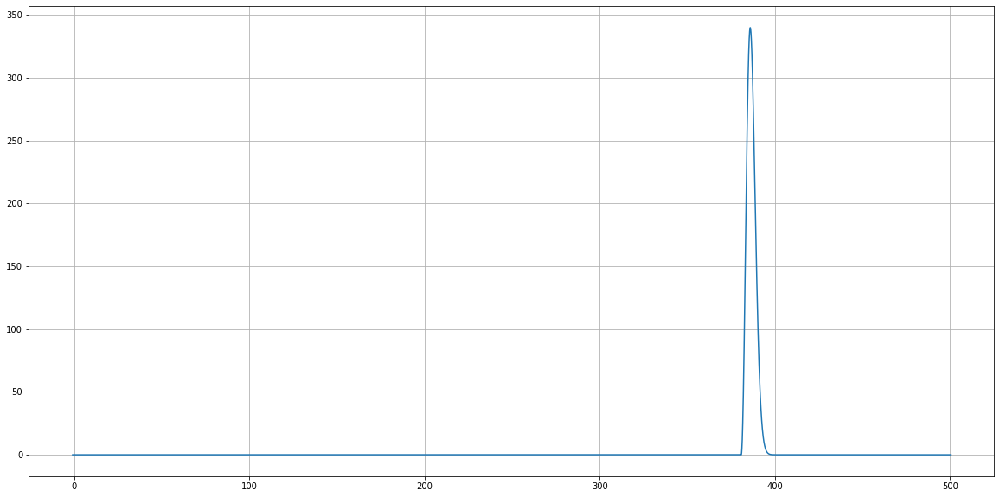

A1: 0.34533113055358544 B1: 61.09897749454329 C1: 0.7696318703698691 D1: 855.6200617249896 A2: 0.9796375640049712 B2: 29.866095283989747 C2: 0.5715778699075298 D2: 949.6968393227997


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


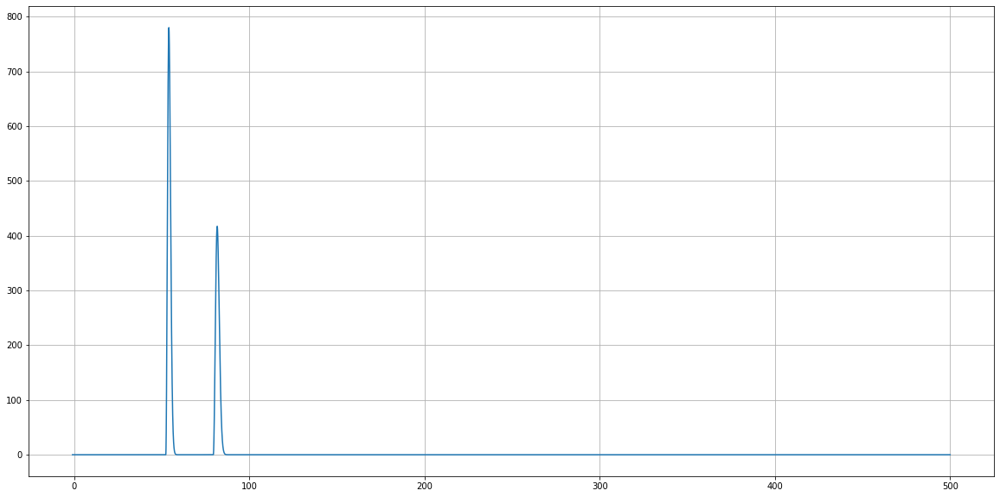

A1: 0.8919332191189293 B1: 78.19673755621773 C1: 0.5360561219239544 D1: 897.9105290585054 A2: 0.6049834124057201 B2: 51.77490893203562 C2: 0.3495331844898475 D2: 899.297638417604


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


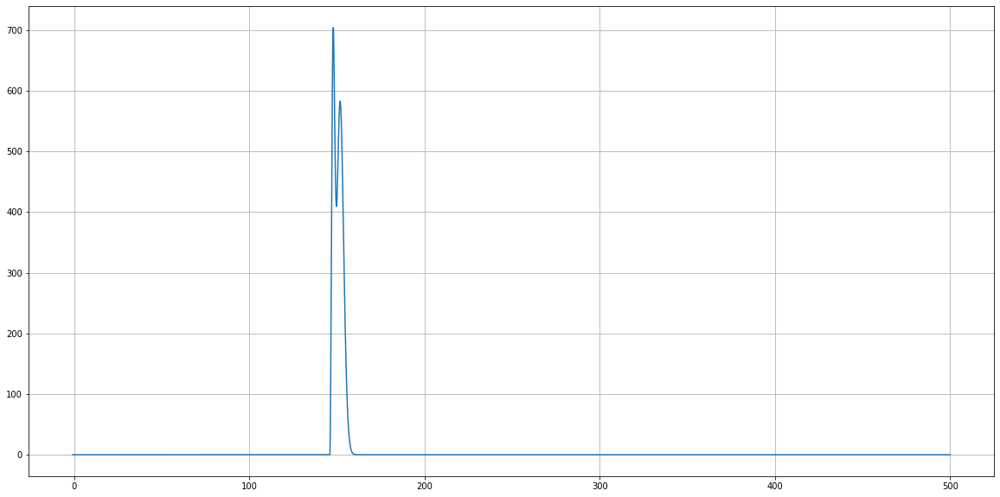

A1: 0.46228892983000613 B1: 20.473847592609175 C1: 0.5914188962052838 D1: 132.3489366597843 A2: 0.6920879231788298 B2: 21.960151232363103 C2: 0.06765442823244239 D2: 368.30690366328446


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


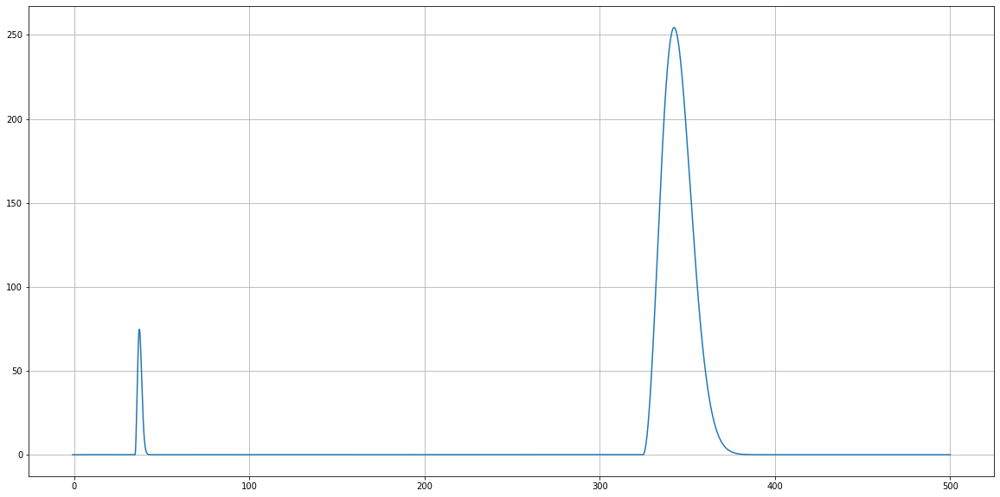

A1: 0.6795237012758438 B1: 86.5567364223954 C1: 0.9936137864999558 D1: 413.7512689175243 A2: 0.1917951819756536 B2: 93.31631442598062 C2: 0.0750659066984618 D2: 716.981493822199


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


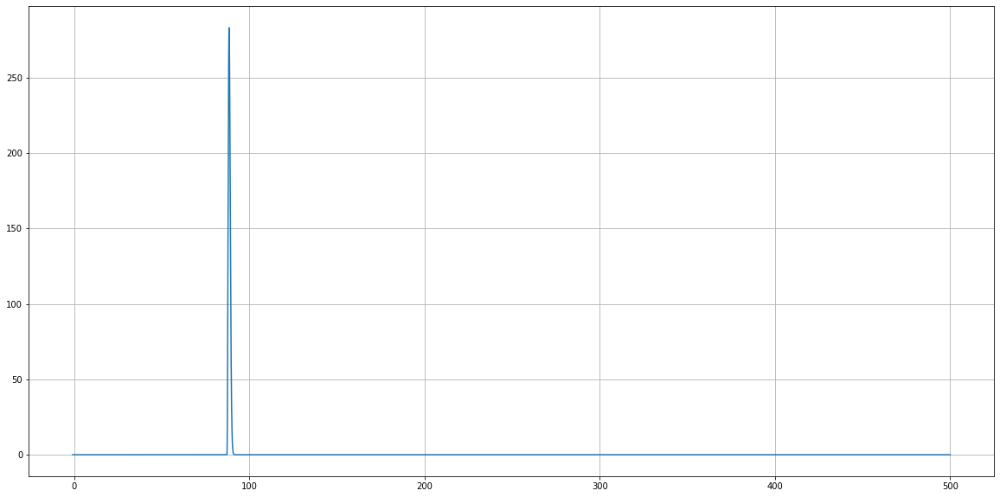

A1: 0.8539591955830009 B1: 89.19769422179591 C1: 0.5982406527708034 D1: 512.3079148433353 A2: 0.20361372665604205 B2: 5.169330999986621 C2: 0.05234412069855365 D2: 436.44310906915473


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


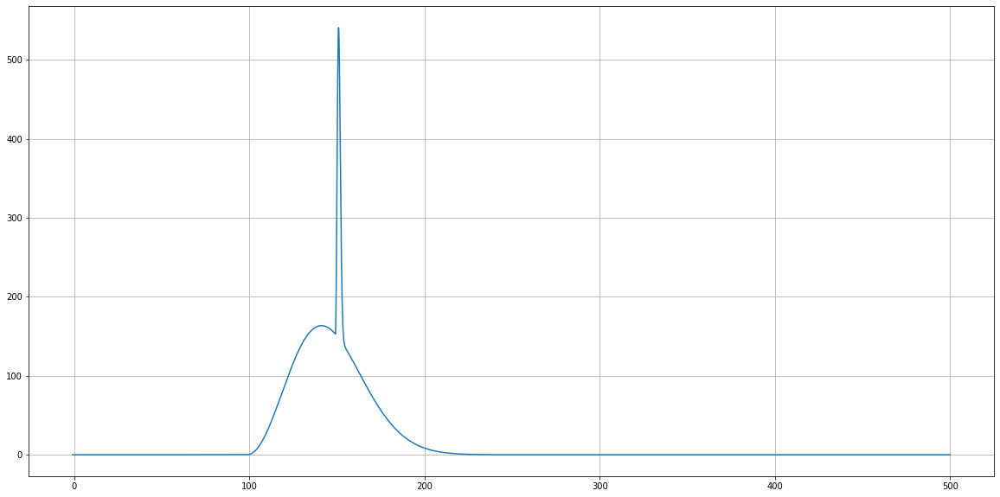

A1: 0.9445534605292051 B1: 45.90156973259889 C1: 0.1511859734567449 D1: 937.4081720477241 A2: 0.884865937029418 B2: 97.08445343053907 C2: 0.562002021436318 D2: 639.4244426213719


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp


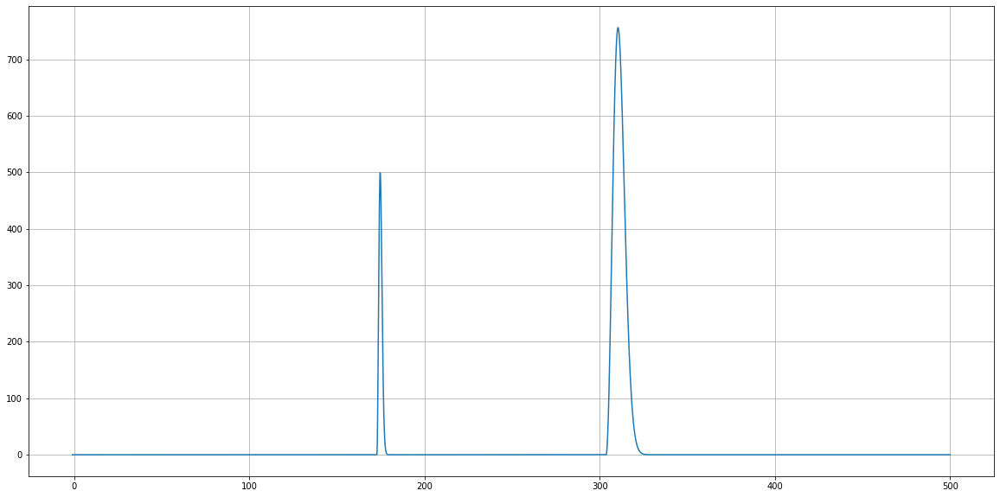

A1: 0.8295279213105006 B1: 86.57211247894655 C1: 0.5818869602271297 D1: 461.48399383822135 A2: 0.2303289220253707 B2: 30.079892070144844 C2: 0.2886901040198062 D2: 113.77756741482958


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: overflow encountered in exp


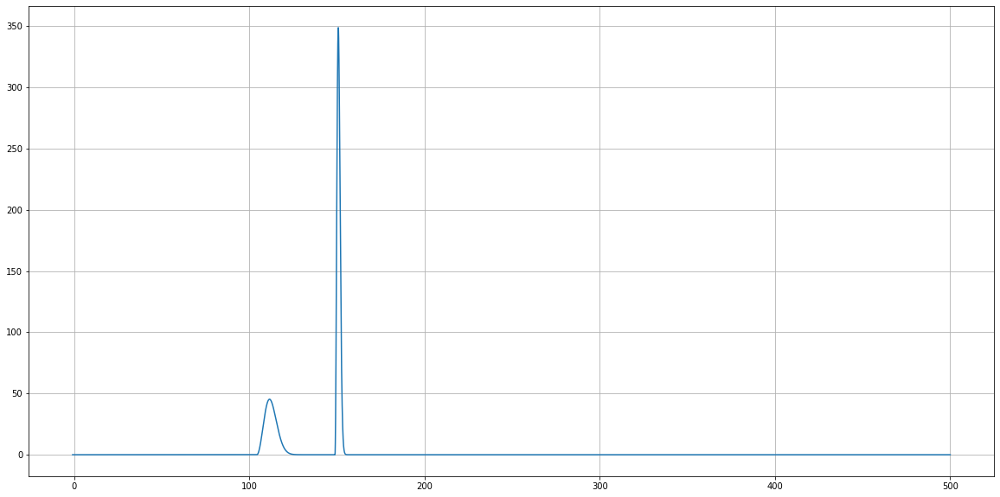

In [ ]:
#Models first test:

x_data = np.arange(-1, 500, 0.01)

def dist_maxwell_boltzmann(data):

    tmp_list = []       
    
    for i in range(len(data)):
        
        if C1*data[i]-B1 >= 0:
            tmp_1 = D1*4*np.pi*(np.sqrt(A1/np.pi)**3)*((C1*data[i]-B1)**2)/np.exp(A1*(C1*data[i]-B1)**2)
        else: 
            tmp_1 = 0.

        if C2*data[i]-B2 >= 0:
            tmp_2 = D2*4*np.pi*(np.sqrt(A2/np.pi)**3)*((C2*data[i]-B2)**2)/np.exp(A2*(C2*data[i]-B2)**2)
        else: 
            tmp_2 = 0.

        tmp_list.append(tmp_1 + tmp_2)

    return tmp_list

for i in range(100):

    A1 = rd.uniform(0, 1)
    B1 = rd.uniform(0, 100)
    C1 = rd.uniform(0, 1)
    D1 = rd.uniform(0, 1000) 

    A2 = rd.uniform(0, 1)
    B2 = rd.uniform(0, 100)
    C2 = rd.uniform(0, 1)
    D2 = rd.uniform(0, 1000)

    print('A1:', A1, 'B1:', B1, 'C1:', C1, 'D1:', D1, 'A2:', A2, 'B2:', B2, 'C2:', C2, 'D2:', D2)

    plt.figure(figsize=(20,10))
    plt.grid(True)
    plt.plot(x_data, dist_maxwell_boltzmann(x_data))
    plt.show()


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp


Iteração: 500


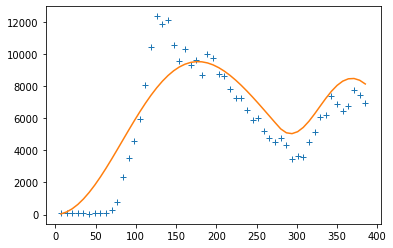

[0.015180423376897002, 0.0, 0.045797918005956034, 93109.24112577208, 0.00012419711360664443, 250.02362251688868, 0.8998002763942198, 769292.634033776]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp


Iteração: 1000


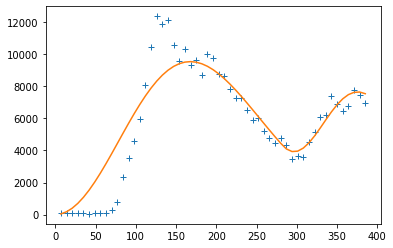

[0.015180423376897002, 0.0, 0.048407977222593435, 93109.24112577208, 0.00012419711360664443, 254.0690330358202, 0.8998002763942198, 739073.7287406068]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp


Iteração: 1500


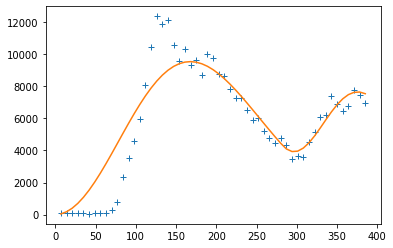

[0.015180423376897002, 0.0, 0.048407977222593435, 93109.24112577208, 0.00012419711360664443, 254.0690330358202, 0.8998002763942198, 739073.7287406068]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp


Iteração: 2000


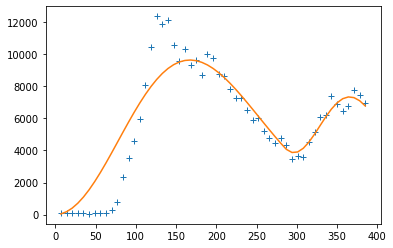

[0.007266847635601184, 0.0, 0.07014278893478659, 135980.97235291474, 0.0010183044875857676, 102.52418603295419, 0.36002048874607256, 239500.99009881594]
Iteração: 2500


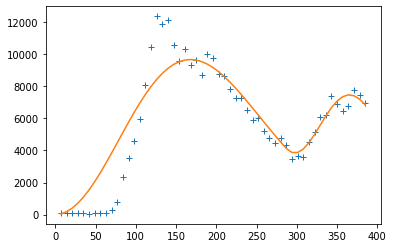

[0.0072754641373770634, 0.0, 0.06987224586355803, 136334.07326336135, 0.0010856745151117439, 102.91305736922573, 0.3589574058234175, 235230.31632093643]
Iteração: 3000


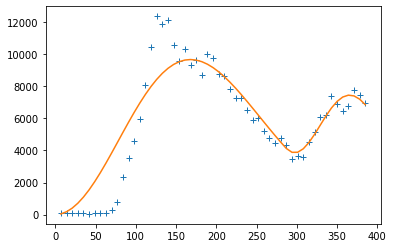

[0.008164514126529802, 0.0, 0.06596299083943566, 128692.33956989748, 0.001126940354716504, 100, 0.3492632484571785, 230542.14448043046]
[0.008164514126529802, 0.0, 0.06596299083943566, 128692.33956989748, 0.001126940354716504, 100, 0.3492632484571785, 230542.14448043046]
       w[0]  w[1]      w[2]  ...   w[5]      w[6]          w[7]
0  0.008165   0.0  0.065963  ...  100.0  0.349263  230542.14448

[1 rows x 8 columns]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp


Iteração: 500


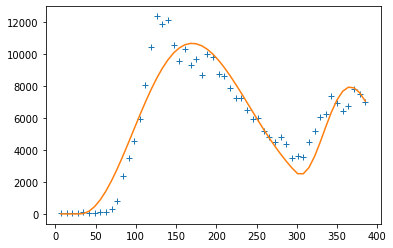

[0.0021157206866723862, 4.911149866822663, 0.15684079517909716, 279076.2054817979, 0.00020219808875675325, 298.53699782269916, 1.0, 631963.6670441448]
Iteração: 1000


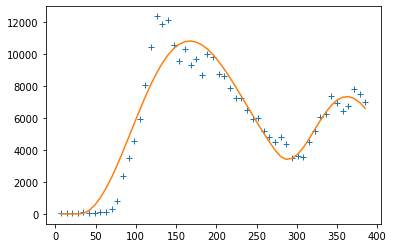

[0.0016271908993297358, 5.437294311647035, 0.18086314407610637, 322589.5466511268, 0.00011887716910605668, 274.61087886406057, 0.9999952913435, 759345.1173833527]
Iteração: 1500


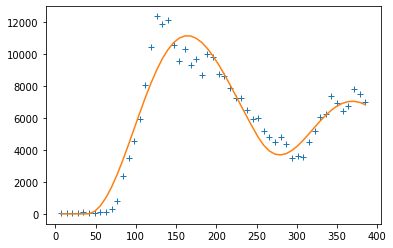

[0.0016264207641338766, 7.923340894765131, 0.19933263058312262, 332570.42928266135, 6.823142913693815e-05, 251.4455121784282, 0.9997538424003984, 1000000.0]
Iteração: 2000


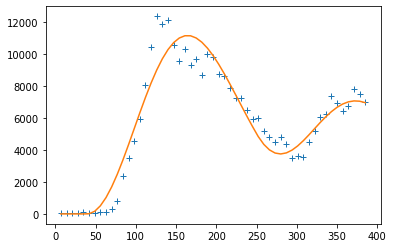

[0.0016969822333235407, 7.740727631320597, 0.19478714854170856, 325903.02728536155, 6.911414042933849e-05, 237.2352839756202, 0.9496711455834564, 1000000.0]
Iteração: 2500


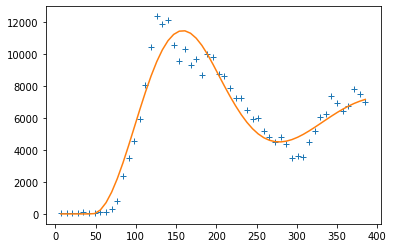

[0.0019027914029716602, 9.380012344439375, 0.20406869155986607, 316160.090183943, 7.76373777500124e-05, 101.09539896791031, 0.5241739136637527, 999565.0507483052]
Iteração: 3000


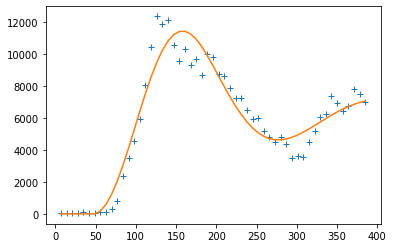

[0.0019781627392171847, 9.700669200055126, 0.20375614964471844, 309402.3455074126, 7.365519665716391e-05, 100.00014668768013, 0.5368347627017369, 999993.1782177192]
[0.0019781627392171847, 9.700669200055126, 0.20375614964471844, 309402.3455074126, 7.365519665716391e-05, 100.00014668768013, 0.5368347627017369, 999993.1782177192]
       w[0]      w[1]      w[2]  ...        w[5]      w[6]           w[7]
0  0.008165  0.000000  0.065963  ...  100.000000  0.349263  230542.144480
1  0.001978  9.700669  0.203756  ...  100.000147  0.536835  999993.178218

[2 rows x 8 columns]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp


Iteração: 500


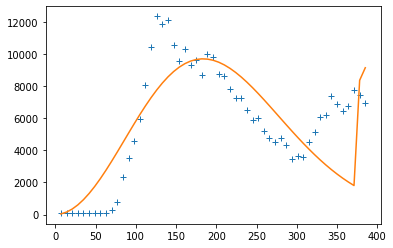

[0.00035782465485394925, 0.0, 0.2881555875963089, 617404.6425661999, 0.7781509762941493, 100, 0.26542624638463513, 43309.272114505875]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp


Iteração: 1000


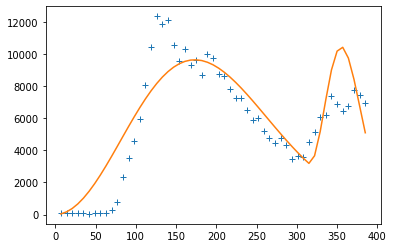

[0.000540835605745385, 0.0, 0.24814988321279968, 499107.39986245736, 0.00055026543759229, 314.0752837137413, 1, 452885.786228612]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp


Iteração: 1500


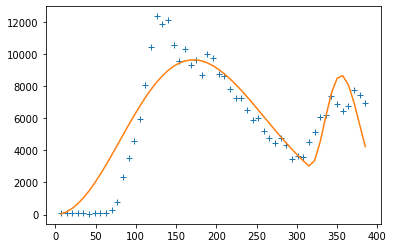

[0.000540835605745385, 0.0, 0.2508953111581492, 499107.39986245736, 0.00055026543759229, 314.0752837137413, 1, 367852.22769313556]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp


Iteração: 2000


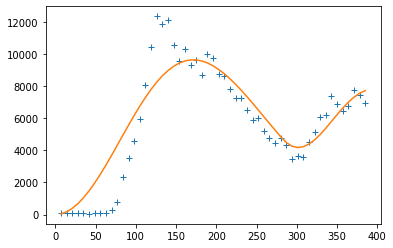

[0.000540835605745385, 0.0, 0.2508953111581492, 499107.39986245736, 0.00055026543759229, 100, 0.35474271591061013, 367852.22769313556]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp


Iteração: 2500


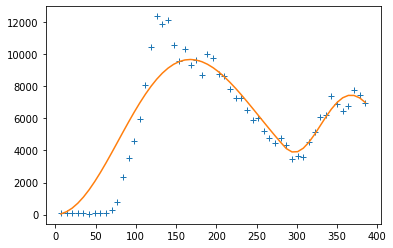

[0.0004669412216837142, 0.0, 0.27612097628707577, 538344.8433853259, 0.0009854302146952052, 102.3799568809342, 0.3592276613170063, 248361.45162636222]
Iteração: 3000


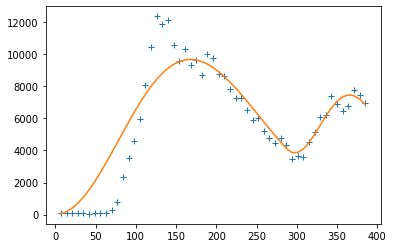

[0.00043605191863720603, 0.0, 0.28542452159882903, 557251.3285693736, 0.0011433602577416678, 100, 0.3488345180848701, 229263.15579896956]
[0.00043605191863720603, 0.0, 0.28542452159882903, 557251.3285693736, 0.0011433602577416678, 100, 0.3488345180848701, 229263.15579896956]
       w[0]      w[1]      w[2]  ...        w[5]      w[6]           w[7]
0  0.008165  0.000000  0.065963  ...  100.000000  0.349263  230542.144480
1  0.001978  9.700669  0.203756  ...  100.000147  0.536835  999993.178218
2  0.000436  0.000000  0.285425  ...  100.000000  0.348835  229263.155799

[3 rows x 8 columns]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp


Iteração: 500


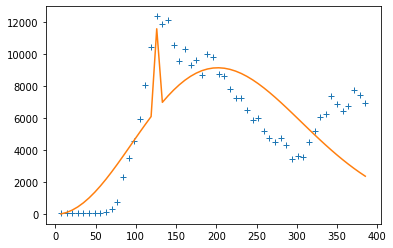

[0.0018933533718322767, 0.0, 0.11382872810986908, 252927.68173416788, 0.49682774400074026, 100, 0.8248812851243739, 898769.0195132497]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp


Iteração: 1000


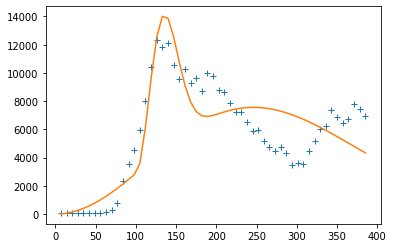

[0.0054213079888075395, 0.0, 0.055235586106987346, 123737.41950728821, 0.000879335644768664, 100, 0.9957914574211075, 387964.8720697692]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp


Iteração: 1500


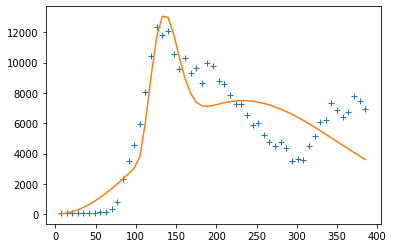

[0.005324083668721394, 0.0, 0.058927991632943974, 123737.41950728821, 0.000879335644768664, 100, 0.9957914574211075, 336422.66134856804]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp


Iteração: 2000


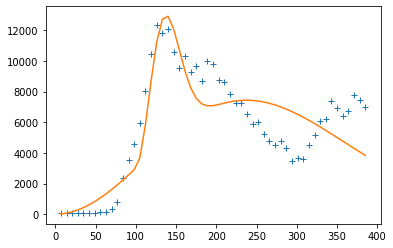

[0.0022504060982259174, 0.0, 0.08875228747458869, 188881.3967621778, 0.0007855256454548645, 100.0, 1.0, 351741.81523900543]
Iteração: 2500


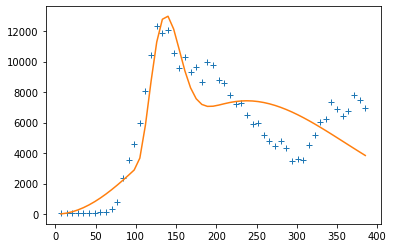

[0.0033323577466625597, 0.0, 0.07286607181056312, 155021.93521294594, 0.0007847980226232643, 100.0, 1.0, 354483.50013868]
Iteração: 3000


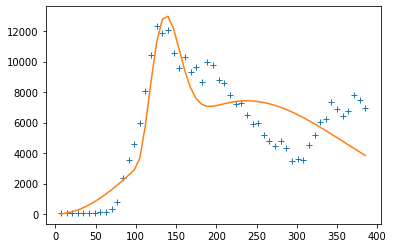

[0.0031991165641276458, 0.0, 0.07436759433564791, 158219.2168953032, 0.0007848357953430144, 100.0, 1.0, 354467.0797015567]
[0.0031991165641276458, 0.0, 0.07436759433564791, 158219.2168953032, 0.0007848357953430144, 100.0, 1.0, 354467.0797015567]
       w[0]      w[1]      w[2]  ...        w[5]      w[6]           w[7]
0  0.008165  0.000000  0.065963  ...  100.000000  0.349263  230542.144480
1  0.001978  9.700669  0.203756  ...  100.000147  0.536835  999993.178218
2  0.000436  0.000000  0.285425  ...  100.000000  0.348835  229263.155799
3  0.003199  0.000000  0.074368  ...  100.000000  1.000000  354467.079702

[4 rows x 8 columns]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: overflow encountered in exp


Iteração: 500


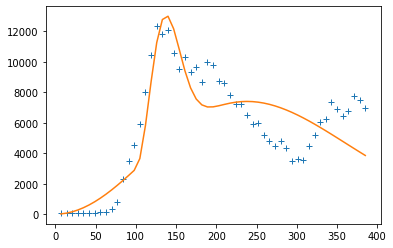

[0.00011207838734523379, 0.0, 0.39659137218199825, 842477.4741836111, 0.0007797307603280804, 100, 1.0, 357675.77675326413]
Iteração: 1000


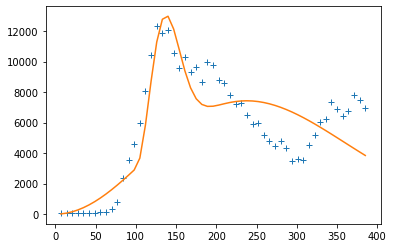

[0.00011594006915218221, 0.0, 0.39062779872572834, 831103.1922068187, 0.0007847676585116128, 100.0, 1.0, 354481.41537991073]
Iteração: 1500


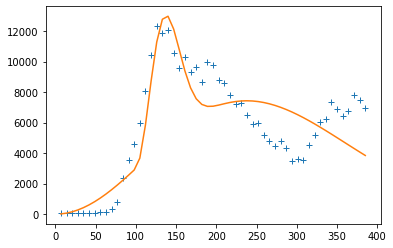

[0.00010812830075887626, 0.0, 0.40450992030019767, 860605.4719977088, 0.000784837880378227, 100.0, 1.0, 354465.8333892439]
Iteração: 2000


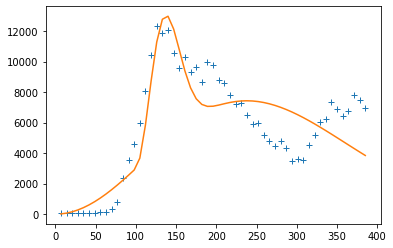

[0.00010752269721194598, 0.0, 0.4056474833294442, 863025.7950906677, 0.0007848374866356578, 100.0, 1.0, 354465.94889560086]
Iteração: 2500


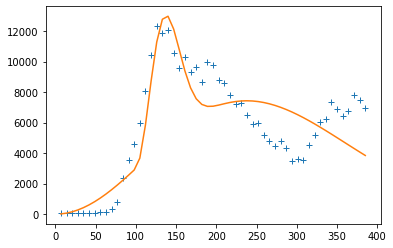

[0.00010749971273048034, 0.0, 0.4056908519255774, 863118.059049085, 0.0007848375290097485, 100.0, 1.0, 354465.9334494656]
Iteração: 3000


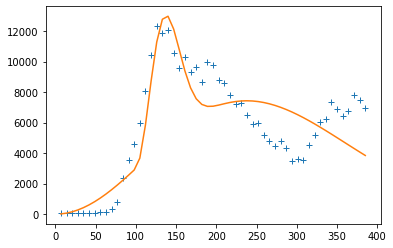

[0.00010749767985699094, 0.0, 0.40569468676712817, 863126.2238899912, 0.0007848375312426087, 100.0, 1.0, 354465.93669077044]
[0.00010749767985699094, 0.0, 0.40569468676712817, 863126.2238899912, 0.0007848375312426087, 100.0, 1.0, 354465.93669077044]
       w[0]      w[1]      w[2]  ...        w[5]      w[6]           w[7]
0  0.008165  0.000000  0.065963  ...  100.000000  0.349263  230542.144480
1  0.001978  9.700669  0.203756  ...  100.000147  0.536835  999993.178218
2  0.000436  0.000000  0.285425  ...  100.000000  0.348835  229263.155799
3  0.003199  0.000000  0.074368  ...  100.000000  1.000000  354467.079702
4  0.000107  0.000000  0.405695  ...  100.000000  1.000000  354465.936691

[5 rows x 8 columns]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp


Iteração: 500


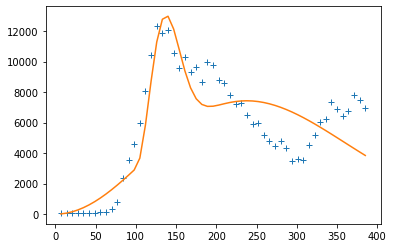

[8.273080936504538e-05, 0.0, 0.46243149518329224, 983878.6686396128, 0.0007848911388565107, 100, 1, 354440.1908999843]
Iteração: 1000


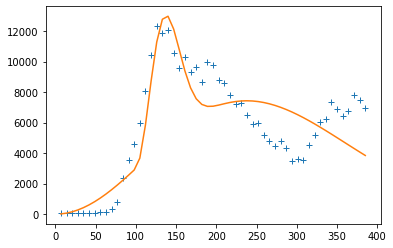

[8.441778525829116e-05, 0.0, 0.45780656403970876, 973995.5376211652, 0.0007848369334825583, 100.0, 0.9999999999978832, 354466.23091024737]
Iteração: 1500


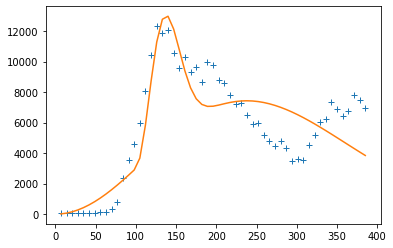

[8.429186192832262e-05, 0.0, 0.45814825054953745, 974722.5877032764, 0.0007848374732705855, 100.0, 1.0, 354465.9412674572]
Iteração: 2000


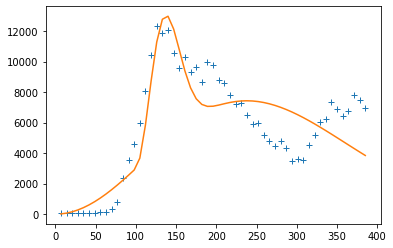

[8.432120727585064e-05, 0.0, 0.4580685311890328, 974552.9647191424, 0.0007848375264439189, 100.0, 1.0, 354465.93843401794]
Iteração: 2500


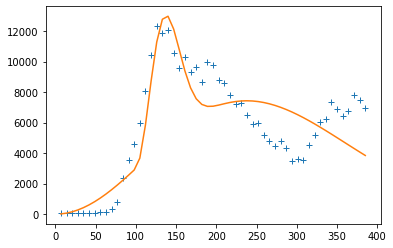

[8.432278613676342e-05, 0.0, 0.4580642418296813, 974543.8438726377, 0.0007848375199976335, 100.0, 1.0, 354465.9383661513]
Iteração: 3000


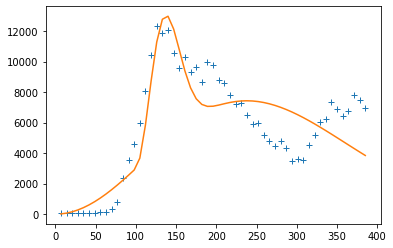

[8.436386376478941e-05, 0.0, 0.45795271045989416, 974306.5548742388, 0.0007848375167513906, 100.0, 1.0, 354465.9395875819]
[8.436386376478941e-05, 0.0, 0.45795271045989416, 974306.5548742388, 0.0007848375167513906, 100.0, 1.0, 354465.9395875819]
       w[0]      w[1]      w[2]  ...        w[5]      w[6]           w[7]
0  0.008165  0.000000  0.065963  ...  100.000000  0.349263  230542.144480
1  0.001978  9.700669  0.203756  ...  100.000147  0.536835  999993.178218
2  0.000436  0.000000  0.285425  ...  100.000000  0.348835  229263.155799
3  0.003199  0.000000  0.074368  ...  100.000000  1.000000  354467.079702
4  0.000107  0.000000  0.405695  ...  100.000000  1.000000  354465.936691
5  0.000084  0.000000  0.457953  ...  100.000000  1.000000  354465.939588

[6 rows x 8 columns]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp


Iteração: 500


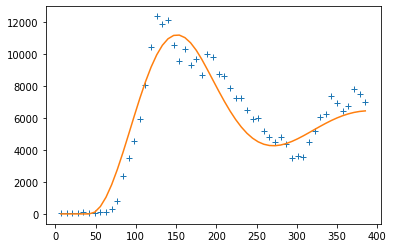

[0.001982452269197467, 8.772171903059245, 0.2064709149855088, 302575.3112254394, 7.629258913213185e-05, 100, 0.5483850210884114, 886940.5474449879]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: overflow encountered in exp


Iteração: 1000


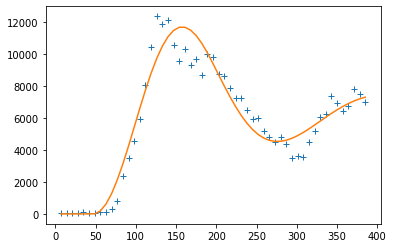

[0.0029159508600491695, 7.989038492820599, 0.16822714463171426, 260624.7574157631, 7.965236942135424e-05, 100, 0.5225328505673641, 1000000.0]
Iteração: 1500


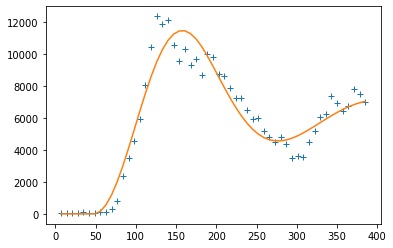

[0.002141937750335106, 9.469461254937514, 0.19710793806206595, 298144.4642158317, 7.34845383896103e-05, 100.0, 0.5365840260253446, 1000000.0]
Iteração: 2000


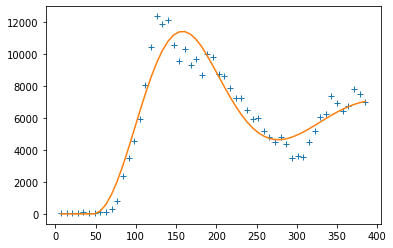

[0.0031743656315413567, 7.6373138876365285, 0.1607557707584637, 243816.425662375, 7.3231912270222e-05, 100, 0.5381547068995736, 1000000.0]
Iteração: 2500


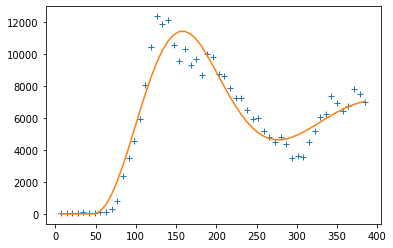

[0.0027686291463255327, 8.21079263671934, 0.17232219517183164, 261455.2987658676, 7.334784425845902e-05, 100.0, 0.5378010665273472, 1000000.0]
Iteração: 3000


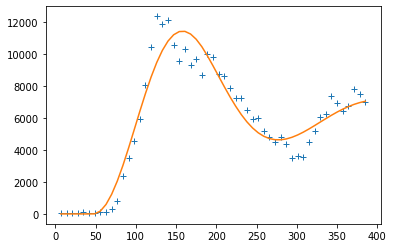

[0.0027648447859564365, 8.20865739132915, 0.172381047660809, 261615.94360942408, 7.344851577413023e-05, 100.0, 0.5373812023398077, 1000000.0]
[0.0027648447859564365, 8.20865739132915, 0.172381047660809, 261615.94360942408, 7.344851577413023e-05, 100.0, 0.5373812023398077, 1000000.0]
       w[0]      w[1]      w[2]  ...        w[5]      w[6]            w[7]
0  0.008165  0.000000  0.065963  ...  100.000000  0.349263   230542.144480
1  0.001978  9.700669  0.203756  ...  100.000147  0.536835   999993.178218
2  0.000436  0.000000  0.285425  ...  100.000000  0.348835   229263.155799
3  0.003199  0.000000  0.074368  ...  100.000000  1.000000   354467.079702
4  0.000107  0.000000  0.405695  ...  100.000000  1.000000   354465.936691
5  0.000084  0.000000  0.457953  ...  100.000000  1.000000   354465.939588
6  0.002765  8.208657  0.172381  ...  100.000000  0.537381  1000000.000000

[7 rows x 8 columns]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp


Iteração: 500


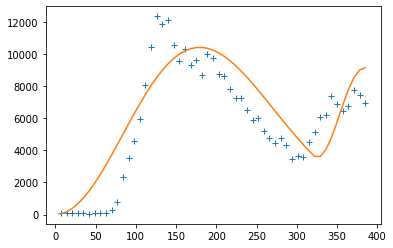

[0.0010907948904708418, 0.0, 0.16899885687590355, 379742.6079589565, 0.0014424989285721779, 125.13081503471085, 0.3904826055180388, 249971.6182303939]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp


Iteração: 1000


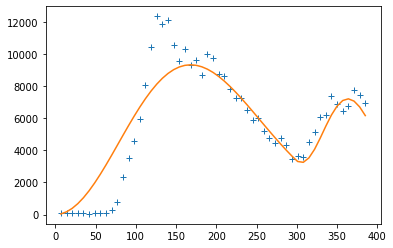

[0.000917204234166874, 0.00014694007550748674, 0.19643771065495802, 370880.91694368294, 0.0017204195369729496, 104.67068515174614, 0.3502842457696767, 178578.50316028047]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp


Iteração: 1500


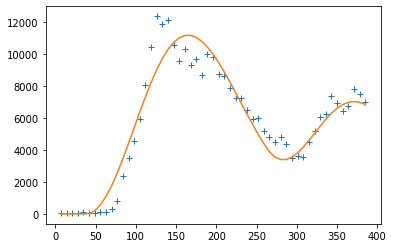

[0.0016473145384712283, 7.535058659785082, 0.1952294646469594, 331452.08672009886, 0.0005221184660017639, 100.00526269140053, 0.38403899515813045, 359866.63935879106]
Iteração: 2000


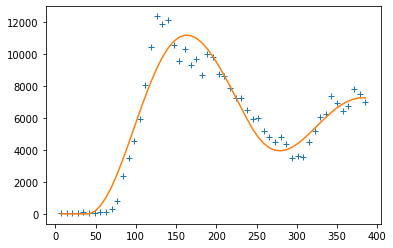

[0.0017638445856567797, 7.709198645594267, 0.1930040998649195, 320493.8177862044, 0.00027710174398188736, 100.25573072627114, 0.4163461455935484, 517696.2639891051]
Iteração: 2500


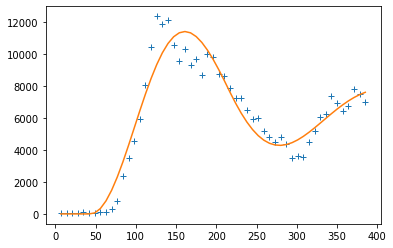

[0.0019509093997809688, 8.455982755597542, 0.19331009432645588, 310715.8145608866, 0.0001231143792029954, 100, 0.4651431078440896, 844892.7696174242]
Iteração: 3000


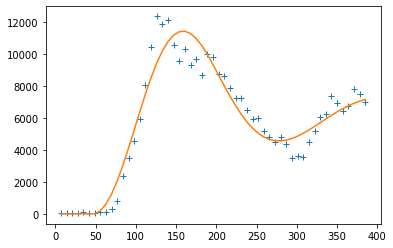

[0.0020315629869437106, 9.394629302382004, 0.1991672941383521, 305270.96848897345, 7.692423033833267e-05, 100.04340462727825, 0.525345126270294, 1000000.0]
[0.0020315629869437106, 9.394629302382004, 0.1991672941383521, 305270.96848897345, 7.692423033833267e-05, 100.04340462727825, 0.525345126270294, 1000000.0]
       w[0]      w[1]      w[2]  ...        w[5]      w[6]            w[7]
0  0.008165  0.000000  0.065963  ...  100.000000  0.349263   230542.144480
1  0.001978  9.700669  0.203756  ...  100.000147  0.536835   999993.178218
2  0.000436  0.000000  0.285425  ...  100.000000  0.348835   229263.155799
3  0.003199  0.000000  0.074368  ...  100.000000  1.000000   354467.079702
4  0.000107  0.000000  0.405695  ...  100.000000  1.000000   354465.936691
5  0.000084  0.000000  0.457953  ...  100.000000  1.000000   354465.939588
6  0.002765  8.208657  0.172381  ...  100.000000  0.537381  1000000.000000
7  0.002032  9.394629  0.199167  ...  100.043405  0.525345  1000000.000000

[8 rows x 8 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp


Iteração: 500


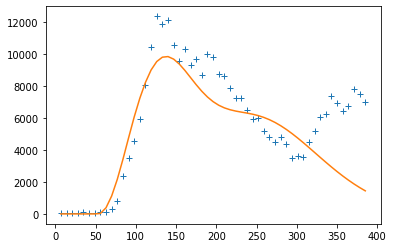

[0.00047087637149770267, 32.26839522368382, 0.6033621747992846, 511102.2747600742, 5.1335724949332683e-05, 100.0, 0.9603749287068849, 1000000.0]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: overflow encountered in exp


Iteração: 1000


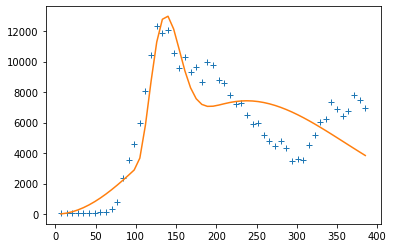

[0.07986298481186042, 0.0, 0.014885860699444097, 31663.45501179305, 0.0007845968791803284, 100.0, 1.0, 354444.5483726878]
Iteração: 1500


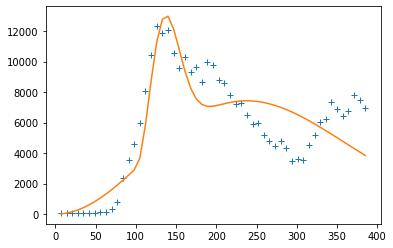

[0.09165908505801612, 0.0, 0.013893756824398326, 29559.203580867386, 0.0007848677393781269, 100.0, 1.0, 354437.8743728268]
Iteração: 2000


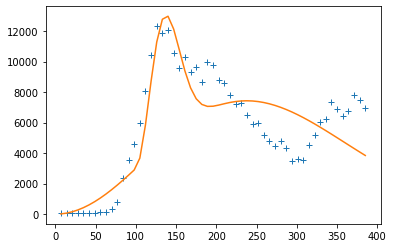

[0.08000589958121603, 0.0, 0.014870917279604334, 31638.276359366755, 0.0007848369243161307, 100.0, 1.0, 354465.9343901926]
Iteração: 2500


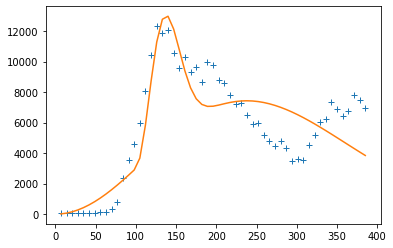

[0.08009136445362398, 0.0, 0.01486298432103541, 31621.3938531815, 0.0007848375477135803, 100.0, 1.0, 354465.93471975264]
Iteração: 3000


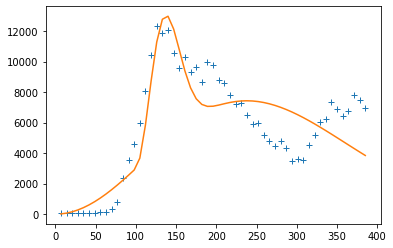

[0.08007291934284606, 0.0, 0.014864696049365394, 31625.035814614035, 0.0007848375246582699, 100.0, 1.0, 354465.93833991105]
[0.08007291934284606, 0.0, 0.014864696049365394, 31625.035814614035, 0.0007848375246582699, 100.0, 1.0, 354465.93833991105]
       w[0]      w[1]      w[2]  ...        w[5]      w[6]            w[7]
0  0.008165  0.000000  0.065963  ...  100.000000  0.349263   230542.144480
1  0.001978  9.700669  0.203756  ...  100.000147  0.536835   999993.178218
2  0.000436  0.000000  0.285425  ...  100.000000  0.348835   229263.155799
3  0.003199  0.000000  0.074368  ...  100.000000  1.000000   354467.079702
4  0.000107  0.000000  0.405695  ...  100.000000  1.000000   354465.936691
5  0.000084  0.000000  0.457953  ...  100.000000  1.000000   354465.939588
6  0.002765  8.208657  0.172381  ...  100.000000  0.537381  1000000.000000
7  0.002032  9.394629  0.199167  ...  100.043405  0.525345  1000000.000000
8  0.080073  0.000000  0.014865  ...  100.000000  1.000000   354465.938340

[

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp


Iteração: 500


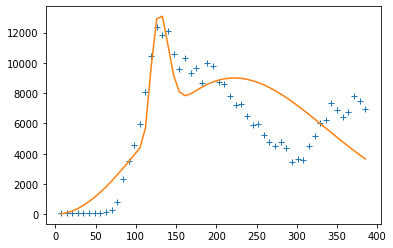

[0.0058958408164537495, 0.0, 0.058596440195957, 141206.91933240538, 0.0025400196859179623, 100, 0.9303216928363701, 178668.96765037166]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: overflow encountered in exp


Iteração: 1000


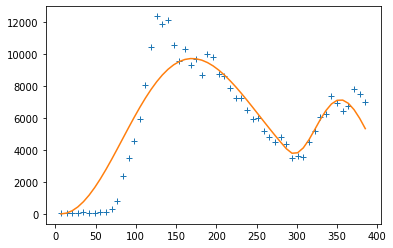

[0.004495213614358235, 0.6245921302038905, 0.09145479772082274, 174407.58609168086, 0.0005224194410740673, 177.26823251131503, 0.6150614661941027, 311545.9402588504]
Iteração: 1500


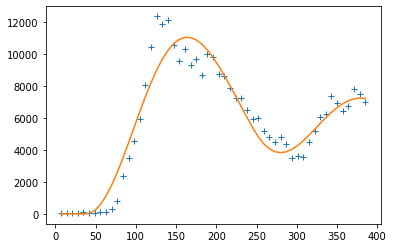

[0.006456204229003125, 3.794274746605774, 0.09914678349676452, 165512.4697795407, 0.0003254531248911167, 100, 0.40574449495999987, 474912.5983996058]
Iteração: 2000


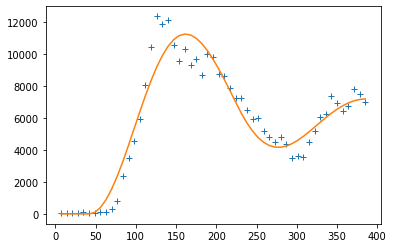

[0.006522711681100487, 4.395541561792636, 0.1037133832322981, 167582.74497838566, 0.00019624488576806953, 100.05277860642408, 0.44073190519805355, 612745.9647577978]
Iteração: 2500


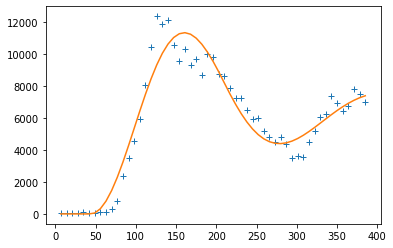

[0.006678325148067005, 4.630609119165445, 0.10522598063195912, 166883.50413731745, 0.00011004011842309323, 100.03212886738729, 0.4798629222221599, 863878.2203060007]
Iteração: 3000


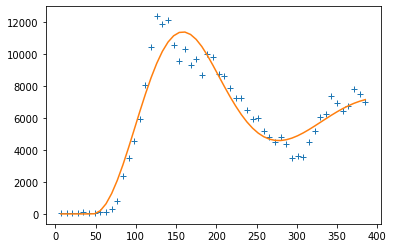

[0.0072904544338286605, 4.9229639721660625, 0.10501275713089653, 160426.6066644609, 7.64374807441435e-05, 100.0094668946611, 0.5271887782490589, 1000000.0]
[0.0072904544338286605, 4.9229639721660625, 0.10501275713089653, 160426.6066644609, 7.64374807441435e-05, 100.0094668946611, 0.5271887782490589, 1000000.0]
       w[0]      w[1]      w[2]  ...        w[5]      w[6]            w[7]
0  0.008165  0.000000  0.065963  ...  100.000000  0.349263   230542.144480
1  0.001978  9.700669  0.203756  ...  100.000147  0.536835   999993.178218
2  0.000436  0.000000  0.285425  ...  100.000000  0.348835   229263.155799
3  0.003199  0.000000  0.074368  ...  100.000000  1.000000   354467.079702
4  0.000107  0.000000  0.405695  ...  100.000000  1.000000   354465.936691
5  0.000084  0.000000  0.457953  ...  100.000000  1.000000   354465.939588
6  0.002765  8.208657  0.172381  ...  100.000000  0.537381  1000000.000000
7  0.002032  9.394629  0.199167  ...  100.043405  0.525345  1000000.000000
8  0.080073  

<Figure size 432x288 with 0 Axes>

In [ ]:
#Testing the model:

x_dados = np.array(srag_deaths_data['semana_epidemiologica'].astype(float))
y_dados = np.array(srag_deaths_data['casos'].astype(float))

cost_func = rsme
objective_function_name = 'dist_maxwell_boltzmann'

bounds = [(0.,1), (0.,50), (0.,1), (0.,1e6), (0.,1), (100,500), (0.,1), (0.,1e6)]

popsize = 80              #Tamanho da população (Artigo 10*n_parâmetros_do_modelo)
mutate = 0.5              #Fator de mutação [0,2]
recombination = 0.5       #Parâmetro de recombinação [0,1]
maxiter = 3000            #Número de gerações
plot_interval = 300       #plotar a cada...

res_cases_data = pd.DataFrame(columns=('w[0]','w[1]','w[2]','w[3]','w[4]','w[5]','w[6]','w[7]'))

for i in range(10):
    list_tmp = Differential_Evolution(cost_func, bounds, popsize, mutate, recombination, maxiter, x_dados, y_dados, plot_interval)
    print(list_tmp)

    res_cases_data = res_cases_data.append({'w[0]': list_tmp[0], 'w[1]': list_tmp[1],'w[2]': list_tmp[2], 'w[3]': list_tmp[3], 'w[4]': list_tmp[4], 'w[5]': list_tmp[5], 'w[6]': list_tmp[6], 'w[7]': list_tmp[7]}, ignore_index=True)
    print(res_cases_data)


In [ ]:
#Calculate de mean of the values of the variables of the maxwell_boltzmann model

res_srag_cases_data_mean = [np.mean(res_cases_data['w[0]']),
                            np.mean(res_cases_data['w[1]']),
                            np.mean(res_cases_data['w[2]']),
                            np.mean(res_cases_data['w[3]']),
                            np.mean(res_cases_data['w[4]']),
                            np.mean(res_cases_data['w[5]']),
                            np.mean(res_cases_data['w[6]']),
                            np.mean(res_cases_data['w[7]'])]
                            
print(res_srag_cases_data_mean)

double_gaussian_mean=[10491.497494952408, 159.26694811189964, 49.592399944956725, 7983.1436258520935, 435.1153568606149, 131.04661517798567]
print(double_gaussian_mean)
double_gaussian_mean_old=[10297.076720348887, 164.98089091868414, 54.223535220447566, 6713.095863459282, 432.9836927778496, 119.24192415495958]
print(double_gaussian_mean_old)


[0.010612948844170848, 3.2226919865932344, 0.19845844486250766, 374993.6563883689, 0.0005710114403967226, 100.00530182096195, 0.6824847636102946, 587766.3372816939]
[10491.497494952408, 159.26694811189964, 49.592399944956725, 7983.1436258520935, 435.1153568606149, 131.04661517798567]
[10297.076720348887, 164.98089091868414, 54.223535220447566, 6713.095863459282, 432.9836927778496, 119.24192415495958]


In [ ]:
#calculate the error generated by the parameters:
print('rsme_mean:\n', rsme(x_dados, y_dados, res_srag_cases_data_mean), '\nrsme_all:')

for i in range(len(res_cases_data.iloc[0])):
    
    tmp_list = []
    for j in range(len(res_cases_data.iloc[i])):
        tmp_list.append(res_cases_data.iloc[i][j])
    
    print(i, rsme(x_dados, y_dados, tmp_list))

def rsme_tmp(x_dados, y_dados, w):
    y_pred = double_gaussian(x_dados, w)
    return np.sqrt(sum((y_dados-y_pred)**2)/len(y_dados))

print('rsme_gauss_old: ', rsme_tmp(x_dados, y_dados, double_gaussian_mean_old))
print('rsme_gauss_new: ', rsme_tmp(x_dados, y_dados, double_gaussian_mean))

tmp_list = []
for i in range(len(res_cases_data.iloc[6])):
    tmp_list.append(res_cases_data.iloc[6][i])

print('how much the new model is better than the old parameters: ', 100-rsme(x_dados, y_dados, tmp_list)*100/rsme_tmp(x_dados, y_dados, double_gaussian_mean_old), '%')


rsme_mean:
 11172.008763382824 
rsme_all:
0 1445.5719807793587
1 934.3189619203432
2 1445.5767820546303
3 1765.5625972524517
4 1765.5625972248097
5 1765.5625972248097
6 934.3133743390488
7 934.9253908759359
rsme_gauss_old:  1299.9864279930168
rsme_gauss_new:  1140.3352128823647
how much the new model is better than the old parameters:  28.128990101728377 %


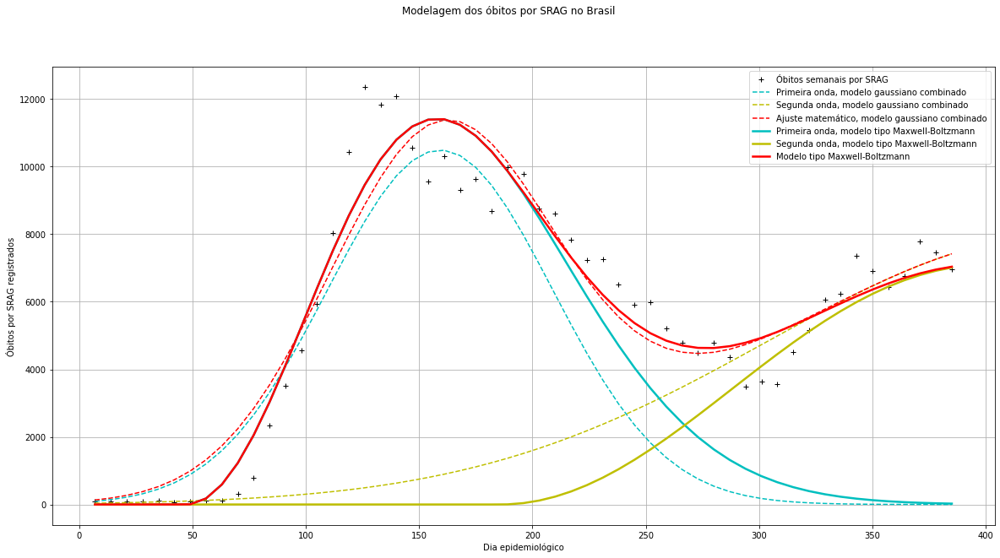

In [ ]:
#Visualize the curves generated by the obtained parameters:

plt.figure(figsize=(20,10))
plt.grid(True)
plt.ylabel('Óbitos por SRAG registrados')
plt.xlabel('Dia epidemiológico')
plt.suptitle('Modelagem dos óbitos por SRAG no Brasil')

future_dias=[]
dia_inicial=1.
for i in range(731):
    future_dias.append(dia_inicial)
    dia_inicial+=1

#points:
plt.plot(srag_deaths_data['semana_epidemiologica'], srag_deaths_data['casos'], 'k+')

#old_parameters:
tmp_list = []
for i in range(len(srag_deaths_data['semana_epidemiologica'])): 
    tmp_list.append(single_gaussian(srag_deaths_data['semana_epidemiologica'].iloc[i],
                                    [double_gaussian_mean[0],
                                     double_gaussian_mean[1],
                                     double_gaussian_mean[2]]))
plt.plot(srag_deaths_data['semana_epidemiologica'], tmp_list, 'c--')

tmp_list = []
for i in range(len(srag_deaths_data['semana_epidemiologica'])): 
    tmp_list.append(single_gaussian(srag_deaths_data['semana_epidemiologica'].iloc[i],
                                    [double_gaussian_mean[3],
                                     double_gaussian_mean[4],
                                     double_gaussian_mean[5]]))
plt.plot(srag_deaths_data['semana_epidemiologica'], tmp_list, 'y--')

tmp_list = []
for i in range(len(srag_deaths_data['semana_epidemiologica'])): 
    tmp_list.append(double_gaussian(srag_deaths_data['semana_epidemiologica'].iloc[i],
                                    double_gaussian_mean))
plt.plot(srag_deaths_data['semana_epidemiologica'], tmp_list, 'r--')

#new_parameters:
plt.plot(srag_deaths_data['semana_epidemiologica'],
         single_maxwell_boltzmann(srag_deaths_data['semana_epidemiologica'],
                                [0.0027648447859564365,
                                 8.20865739132915,
                                 0.172381047660809,
                                 261615.94360942408]),
          'c', linewidth=2.5)

plt.plot(srag_deaths_data['semana_epidemiologica'],
         single_maxwell_boltzmann(srag_deaths_data['semana_epidemiologica'],
                                [7.344851577413023e-05,
                                 100.0,
                                 0.5373812023398077,
                                 1000000.0]),
          'y', linewidth=2.5)

plt.plot(srag_deaths_data['semana_epidemiologica'],
         dist_maxwell_boltzmann(srag_deaths_data['semana_epidemiologica'],
                                [0.0027648447859564365,
                                 8.20865739132915,
                                 0.172381047660809,
                                 261615.94360942408,
                                 7.344851577413023e-05,
                                 100.0,
                                 0.5373812023398077,
                                 1000000.0]),
          'r', linewidth=2.5)

plt.legend(['Óbitos semanais por SRAG',
            'Primeira onda, modelo gaussiano combinado',
            'Segunda onda, modelo gaussiano combinado',
            'Ajuste matemático, modelo gaussiano combinado',
            'Primeira onda, modelo tipo Maxwell-Boltzmann',
            'Segunda onda, modelo tipo Maxwell-Boltzmann',
            'Modelo tipo Maxwell-Boltzmann'], loc=1)

plt.show()


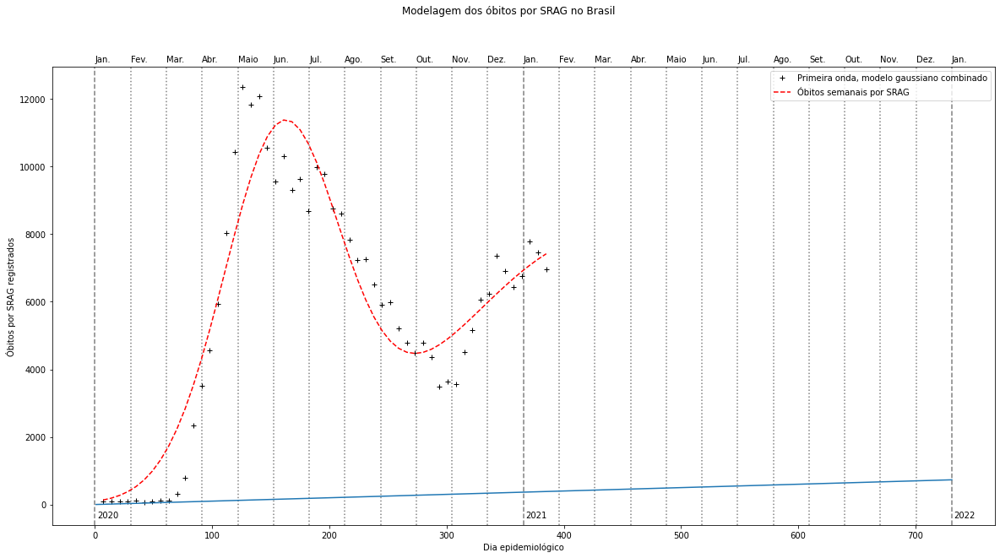

In [ ]:
#New plot script test:

plt.figure(figsize=(20,10))
#plt.grid(True)
plt.ylabel('Óbitos por SRAG registrados')
plt.xlabel('Dia epidemiológico')
plt.suptitle('Modelagem dos óbitos por SRAG no Brasil')

future_dias=[]
dia_inicial=1.
for i in range(731):
    future_dias.append(dia_inicial)
    dia_inicial+=1

initial_day = 0
month_tmp = 0
year_tmp = '202'
cont = 0
months = ['Jan.', 'Fev.', 'Mar.', 'Abr.', 'Maio', 'Jun.', 'Jul.', 'Ago.',
          'Set.', 'Out.', 'Nov.', 'Dez.', 'Jan.', 'Fev.', 'Mar.', 'Abr.', 
          'Maio', 'Jun.', 'Jul.', 'Ago.', 'Set.', 'Out.', 'Nov.', 'Dez.',
          'Jan.', 'Fev.', 'Mar.', 'Abr.', 'Maio', 'Jun.', 'Jul.', 'Ago.',
          'Set.', 'Out.', 'Nov.', 'Dez.']
while initial_day < len(future_dias):
    if months[int(month_tmp)]=='Jan.':
        plt.text(initial_day, 13100, months[int(month_tmp)], rotation=0)
        plt.text(initial_day+2, -400, year_tmp+str(cont), rotation=0)
        plt.axvline(initial_day, color="grey", linestyle="--")
        cont+=1
    else:
        plt.text(initial_day, 13100, months[int(month_tmp)], rotation=0)
        plt.axvline(initial_day, color="grey", linestyle=":")
    initial_day+=30.4583333
    month_tmp+=1.

#points:
plt.plot(srag_deaths_data['semana_epidemiologica'], srag_deaths_data['casos'], 'k+',
         label='Primeira onda, modelo gaussiano combinado')
plt.plot(future_dias, future_dias)

#old_parameters:
tmp_list = []
for i in range(len(srag_deaths_data['semana_epidemiologica'])): 
    tmp_list.append(double_gaussian(srag_deaths_data['semana_epidemiologica'].iloc[i],
                                    double_gaussian_mean))
plt.plot(srag_deaths_data['semana_epidemiologica'], tmp_list, 'r--',
         label='Óbitos semanais por SRAG')

plt.legend(loc=1)

plt.show()


NEW COVID-19 CASES ANALYSIS:

Iteração: 3000


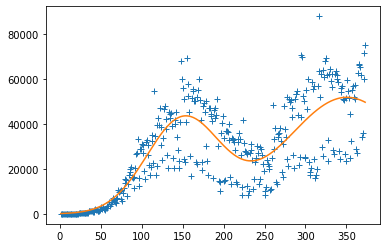

[41901.92032673272, 150.8770837236012, 45.161030230999536, 51828.60708945287, 350.6892969129278, 75.80863983943492]
[41901.92032673272, 150.8770837236012, 45.161030230999536, 51828.60708945287, 350.6892969129278, 75.80863983943492]
           w[0]        w[1]      w[2]          w[3]        w[4]       w[5]
0  41901.920138  150.877083  45.16103  51828.607325  350.689298  75.808642
1  41901.920327  150.877084  45.16103  51828.607089  350.689297  75.808640


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in true_divide


Iteração: 300


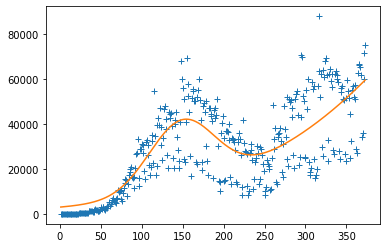

[30206.0924692588, 148.86420566709322, 40.48583958209446, 408350.8659373271, 996.9053578200177, 317.8838170856155]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in true_divide


Iteração: 600


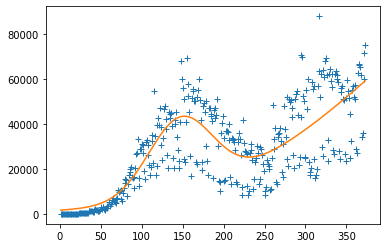

[33373.699852605765, 147.2130088570379, 39.29934814422215, 112998.13460853804, 612.5467707639536, 210.39118853400893]
Iteração: 900


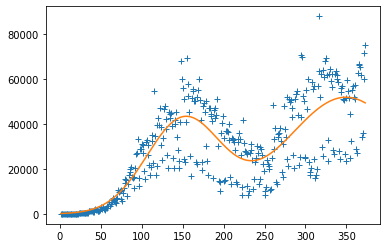

[41828.36064940501, 151.39888470940835, 45.645396996026264, 51866.14760960759, 349.5393287733451, 74.35291441726125]
Iteração: 1200


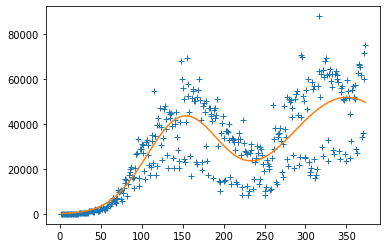

[41901.756812619555, 150.87708371897088, 45.16164380208986, 51828.55962645183, 350.68981379567253, 75.8083460818238]
Iteração: 1500


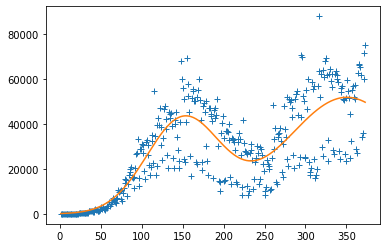

[41901.9210567788, 150.8770840797953, 45.16102958315611, 51828.607915646186, 350.68929894482955, 75.80864112715479]
Iteração: 1800


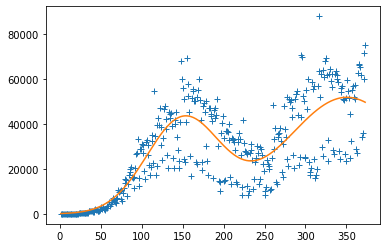

[41901.92063991498, 150.87708366287575, 45.16103008845646, 51828.60715744954, 350.6892960818441, 75.80863922333735]
Iteração: 2100


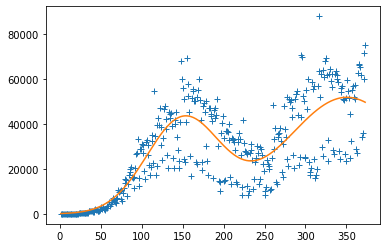

[41901.92063991498, 150.87708366287575, 45.16103008845646, 51828.60715744954, 350.6892960818441, 75.80863922333735]
Iteração: 2400


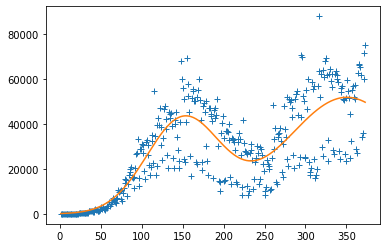

[41901.9202130552, 150.87708299415394, 45.161029953461494, 51828.607299206364, 350.68929725947356, 75.8086413163876]
Iteração: 2700


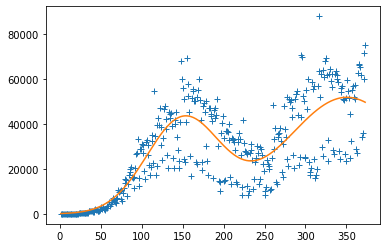

[41901.92055346394, 150.87708291172441, 45.16102982723463, 51828.60743224987, 350.6892988510303, 75.80864189063944]
Iteração: 3000


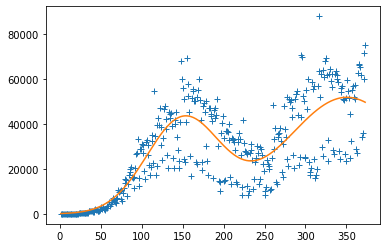

[41901.92055346394, 150.87708291172441, 45.16102982723463, 51828.60743224987, 350.6892988510303, 75.80864189063944]
[41901.92055346394, 150.87708291172441, 45.16102982723463, 51828.60743224987, 350.6892988510303, 75.80864189063944]
           w[0]        w[1]      w[2]          w[3]        w[4]       w[5]
0  41901.920138  150.877083  45.16103  51828.607325  350.689298  75.808642
1  41901.920327  150.877084  45.16103  51828.607089  350.689297  75.808640
2  41901.920553  150.877083  45.16103  51828.607432  350.689299  75.808642


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in true_divide


Iteração: 300


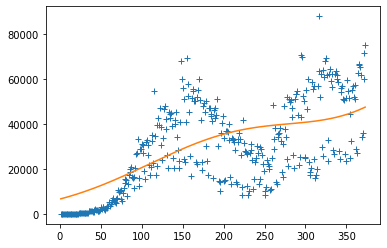

[32162.209189223777, 222.04995207233944, 124.09461945432156, 229245.92643914153, 761.8544733426509, 196.1151126318068]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in true_divide


Iteração: 600


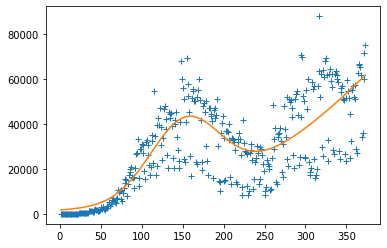

[32661.260080646145, 152.81474489803492, 42.87545832879013, 142592.38011834433, 660.1348735341348, 221.69640156029644]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in true_divide


Iteração: 900


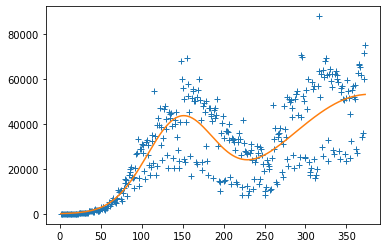

[39269.320642766506, 146.82353382095707, 41.4820279166093, 53152.8835760536, 377.74525964007125, 102.47923694001905]
Iteração: 1200


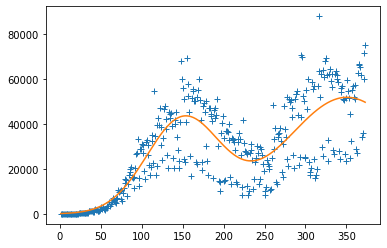

[41900.78219976237, 150.8773633590682, 45.16582480358317, 51828.150504015975, 350.68129296056475, 75.78830064405228]
Iteração: 1500


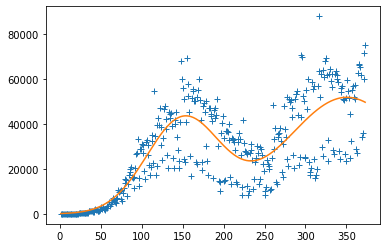

[41901.92958058954, 150.8770843870797, 45.16102495621336, 51828.5939666168, 350.6892536799348, 75.80861552310523]
Iteração: 1800


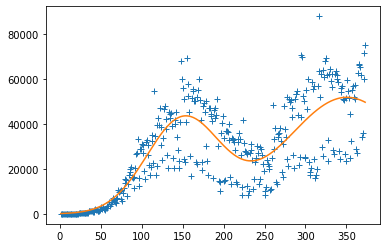

[41901.92024493829, 150.8770832125526, 45.16103010729864, 51828.607162933426, 350.6892973805686, 75.8086407528572]
Iteração: 2100


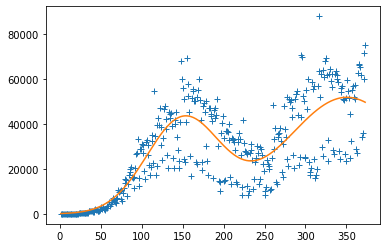

[41901.92009311468, 150.87708365677983, 45.161030145589415, 51828.607172337295, 350.6892984664576, 75.80864150707399]
Iteração: 2400


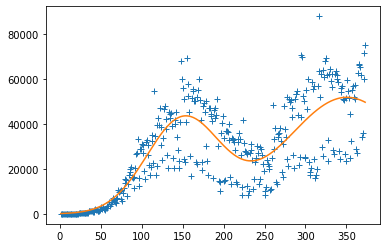

[41901.92009311468, 150.87708365677983, 45.161030145589415, 51828.607172337295, 350.6892984664576, 75.80864150707399]
Iteração: 2700


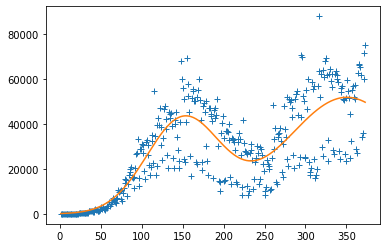

[41901.92009311468, 150.87708365677983, 45.161030145589415, 51828.607172337295, 350.6892984664576, 75.80864150707399]
Iteração: 3000


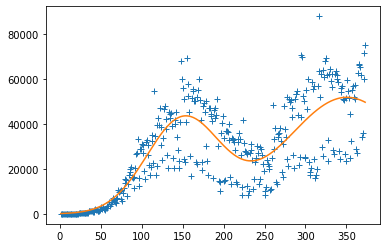

[41901.92009311468, 150.87708365677983, 45.161030145589415, 51828.607172337295, 350.6892984664576, 75.80864150707399]
[41901.92009311468, 150.87708365677983, 45.161030145589415, 51828.607172337295, 350.6892984664576, 75.80864150707399]
           w[0]        w[1]      w[2]          w[3]        w[4]       w[5]
0  41901.920138  150.877083  45.16103  51828.607325  350.689298  75.808642
1  41901.920327  150.877084  45.16103  51828.607089  350.689297  75.808640
2  41901.920553  150.877083  45.16103  51828.607432  350.689299  75.808642
3  41901.920093  150.877084  45.16103  51828.607172  350.689298  75.808642


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in true_divide


Iteração: 300


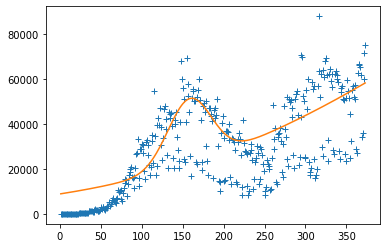

[28820.40813009286, 158.3278728431344, 26.50673641993859, 139848.04189242548, 855.5314366394359, 364.3526517835636]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in true_divide


Iteração: 600


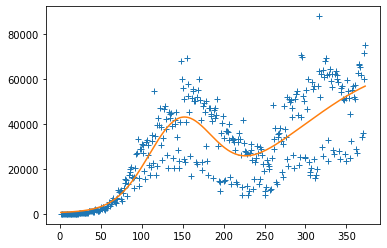

[34599.860437073214, 146.6856560423987, 39.00537841994093, 62271.34573285356, 434.24241813807555, 142.59554363565405]
Iteração: 900


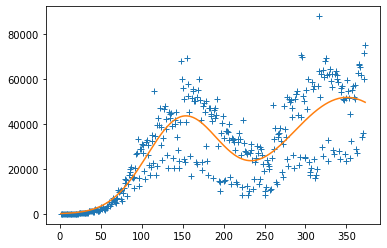

[41845.07997746612, 150.9126281684998, 45.15574669519567, 51776.964286082344, 350.7684683086751, 76.09548754767914]
Iteração: 1200


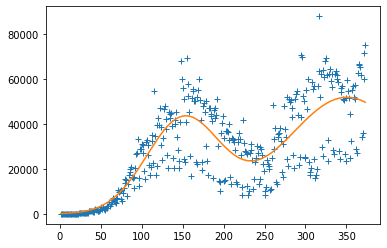

[41901.908841484335, 150.87685882584293, 45.16099079407139, 51828.59943370264, 350.689339466961, 75.80866570234853]
Iteração: 1500


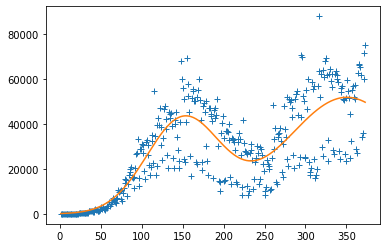

[41901.92050710974, 150.87708345447513, 45.161029611862716, 51828.60729189372, 350.68930002630606, 75.80864332907058]
Iteração: 1800


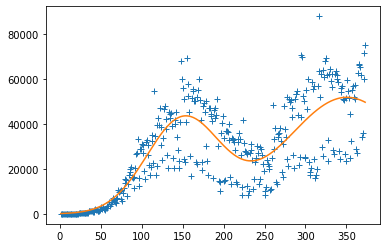

[41901.92026385582, 150.87708316723533, 45.161029399501984, 51828.60739665217, 350.68929846878655, 75.80864184467139]
Iteração: 2100


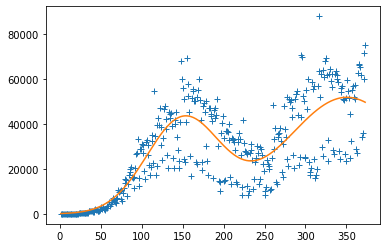

[41901.92026385582, 150.87708316723533, 45.161029399501984, 51828.60739665217, 350.68929846878655, 75.80864184467139]
Iteração: 2400


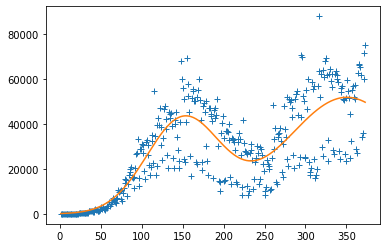

[41901.92026385582, 150.87708316723533, 45.161029399501984, 51828.60739665217, 350.68929846878655, 75.80864184467139]
Iteração: 2700


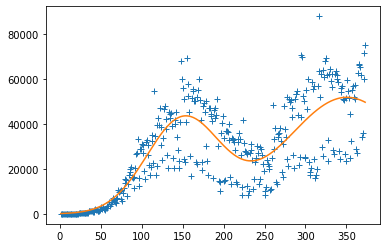

[41901.92018857734, 150.8770824387883, 45.16102954760356, 51828.60708183939, 350.68929848645485, 75.8086427884855]
Iteração: 3000


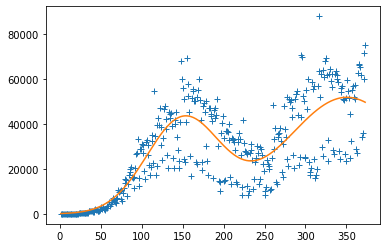

[41901.92018857734, 150.8770824387883, 45.16102954760356, 51828.60708183939, 350.68929848645485, 75.8086427884855]
[41901.92018857734, 150.8770824387883, 45.16102954760356, 51828.60708183939, 350.68929848645485, 75.8086427884855]
           w[0]        w[1]      w[2]          w[3]        w[4]       w[5]
0  41901.920138  150.877083  45.16103  51828.607325  350.689298  75.808642
1  41901.920327  150.877084  45.16103  51828.607089  350.689297  75.808640
2  41901.920553  150.877083  45.16103  51828.607432  350.689299  75.808642
3  41901.920093  150.877084  45.16103  51828.607172  350.689298  75.808642
4  41901.920189  150.877082  45.16103  51828.607082  350.689298  75.808643


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in true_divide


Iteração: 300


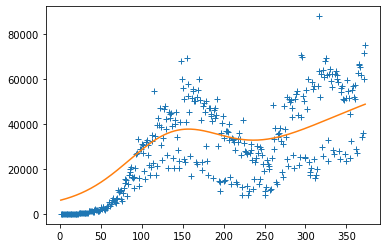

[21414.97258689581, 138.65521367306977, 56.880253161167325, 62111.09877392225, 539.948107859072, 239.85941222116526]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in true_divide


Iteração: 600


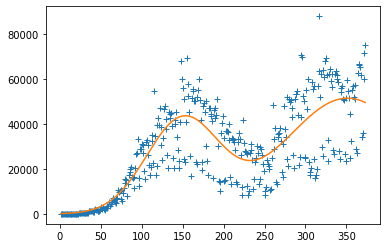

[41661.03422657319, 150.0640542756916, 44.53572978557874, 51443.6848002547, 351.3739974246687, 78.24268726770316]
Iteração: 900


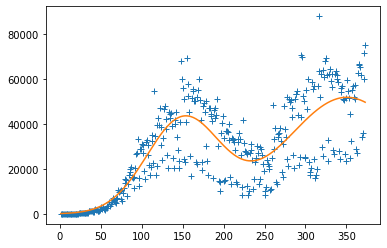

[41902.344226974776, 150.87820635932758, 45.162123875801676, 51828.74267351906, 350.6852415062685, 75.80334676895727]
Iteração: 1200


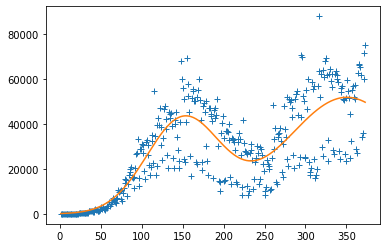

[41901.920289233494, 150.87708242349856, 45.1610302494712, 51828.60756602839, 350.68929908085073, 75.8086421737666]
Iteração: 1500


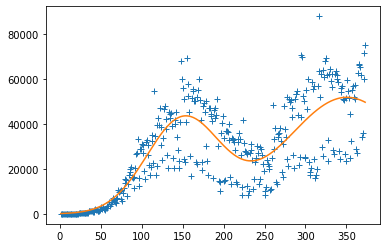

[41901.92030490944, 150.87708324224144, 45.16102979264114, 51828.60718695175, 350.68929734953565, 75.80864114952504]
Iteração: 1800


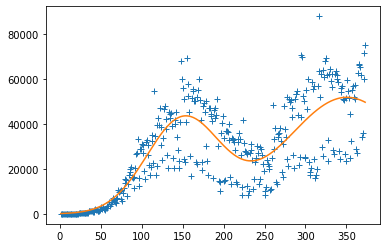

[41901.92037849965, 150.87708295760933, 45.16102994836483, 51828.60716883518, 350.6892972110921, 75.80864054101056]
Iteração: 2100


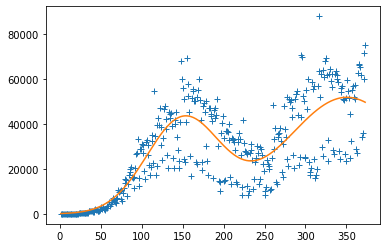

[41901.92029996277, 150.87708348333453, 45.161029752411686, 51828.60715254688, 350.6892967935447, 75.80864076825802]
Iteração: 2400


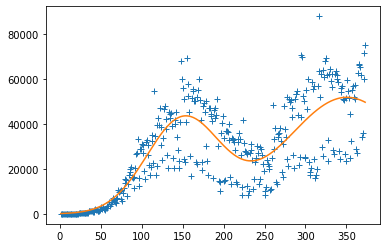

[41901.92029996277, 150.87708348333453, 45.161029752411686, 51828.60715254688, 350.6892967935447, 75.80864076825802]
Iteração: 2700


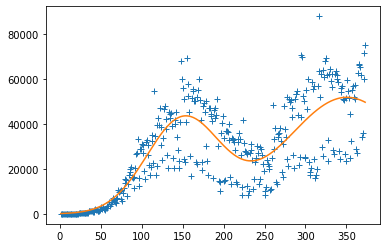

[41901.92029996277, 150.87708348333453, 45.161029752411686, 51828.60715254688, 350.6892967935447, 75.80864076825802]
Iteração: 3000


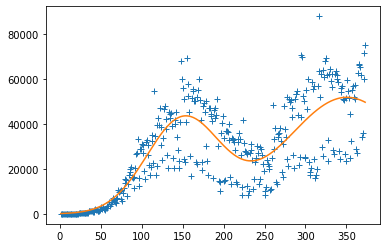

[41901.92029996277, 150.87708348333453, 45.161029752411686, 51828.60715254688, 350.6892967935447, 75.80864076825802]
[41901.92029996277, 150.87708348333453, 45.161029752411686, 51828.60715254688, 350.6892967935447, 75.80864076825802]
           w[0]        w[1]      w[2]          w[3]        w[4]       w[5]
0  41901.920138  150.877083  45.16103  51828.607325  350.689298  75.808642
1  41901.920327  150.877084  45.16103  51828.607089  350.689297  75.808640
2  41901.920553  150.877083  45.16103  51828.607432  350.689299  75.808642
3  41901.920093  150.877084  45.16103  51828.607172  350.689298  75.808642
4  41901.920189  150.877082  45.16103  51828.607082  350.689298  75.808643
5  41901.920300  150.877083  45.16103  51828.607153  350.689297  75.808641


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in true_divide


Iteração: 300


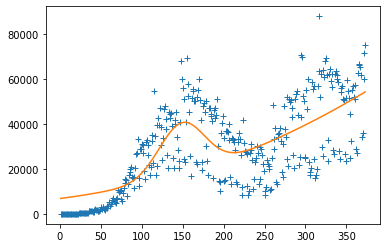

[22606.328510560357, 148.8127281278508, 27.84344938387482, 143179.97335253772, 857.490720312295, 347.5511982331864]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in true_divide


Iteração: 600


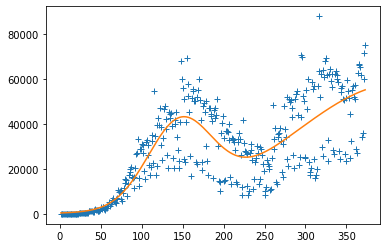

[35797.69889114982, 146.38522532439538, 39.32760853769382, 57885.801761558934, 413.6734372785149, 130.55855052736607]
Iteração: 900


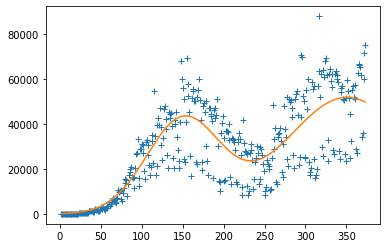

[41851.00110645877, 150.77224243249103, 45.07637799148817, 51840.16071111767, 351.01688510540623, 76.2547940152673]
Iteração: 1200


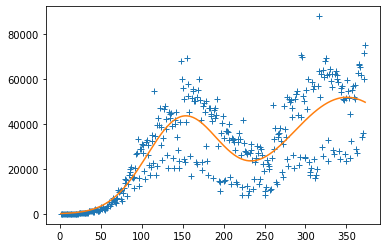

[41901.935913478184, 150.87697717651884, 45.16091780975078, 51828.570790922204, 350.689268820652, 75.80882803510958]
Iteração: 1500


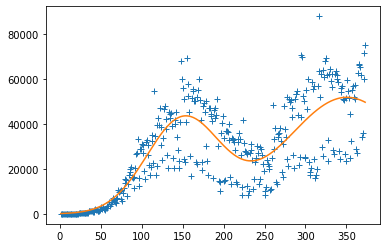

[41901.92059110342, 150.87708320758458, 45.16102998713428, 51828.6074969233, 350.6892974966465, 75.80864151863479]
Iteração: 1800


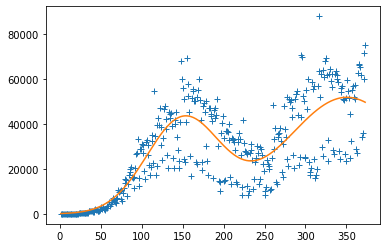

[41901.91998439117, 150.87708334634604, 45.161030566490744, 51828.60697263233, 350.6892962166964, 75.8086401609956]
Iteração: 2100


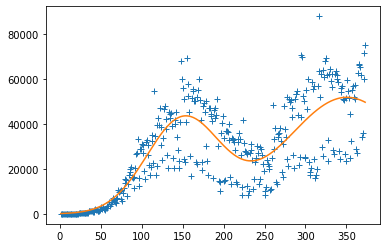

[41901.92034368516, 150.87708367280675, 45.161030369193305, 51828.60717645418, 350.68929654921203, 75.80863972037542]
Iteração: 2400


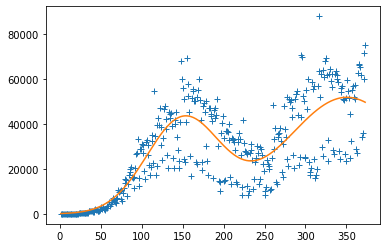

[41901.92034368516, 150.87708367280675, 45.161030369193305, 51828.60717645418, 350.68929654921203, 75.80863972037542]
Iteração: 2700


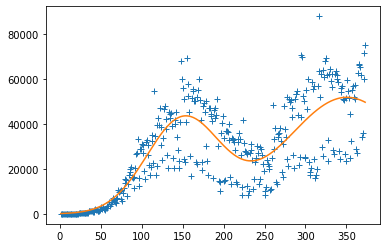

[41901.92034368516, 150.87708367280675, 45.161030369193305, 51828.60717645418, 350.68929654921203, 75.80863972037542]
Iteração: 3000


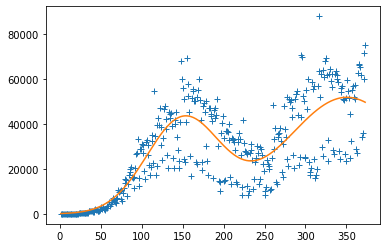

[41901.92063685259, 150.87708301471082, 45.16103002539803, 51828.60695662044, 350.6892971601507, 75.80864092448031]
[41901.92063685259, 150.87708301471082, 45.16103002539803, 51828.60695662044, 350.6892971601507, 75.80864092448031]
           w[0]        w[1]      w[2]          w[3]        w[4]       w[5]
0  41901.920138  150.877083  45.16103  51828.607325  350.689298  75.808642
1  41901.920327  150.877084  45.16103  51828.607089  350.689297  75.808640
2  41901.920553  150.877083  45.16103  51828.607432  350.689299  75.808642
3  41901.920093  150.877084  45.16103  51828.607172  350.689298  75.808642
4  41901.920189  150.877082  45.16103  51828.607082  350.689298  75.808643
5  41901.920300  150.877083  45.16103  51828.607153  350.689297  75.808641
6  41901.920637  150.877083  45.16103  51828.606957  350.689297  75.808641


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in true_divide


Iteração: 300


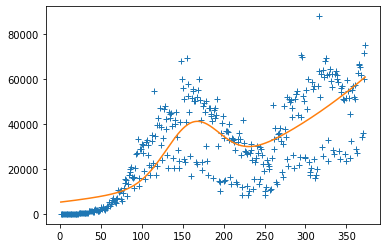

[23348.702226018515, 162.22404526557798, 32.94663221872755, 298148.778440211, 1000, 351.6546571258816]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in true_divide


Iteração: 600


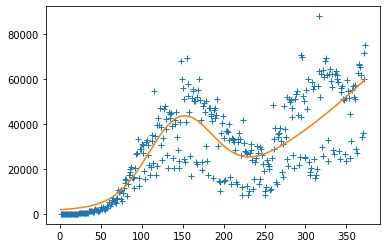

[33353.14588119108, 147.48274084886827, 39.30535755430671, 134917.94684086018, 659.8040249828745, 224.6979057572012]
Iteração: 900


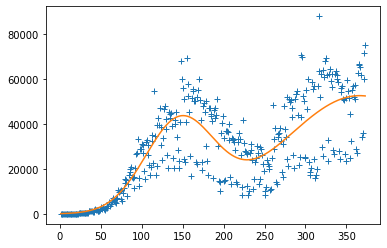

[40138.14510579524, 146.35771443846275, 42.39462160780683, 52563.61419709678, 366.24878569297755, 93.83544966032548]
Iteração: 1200


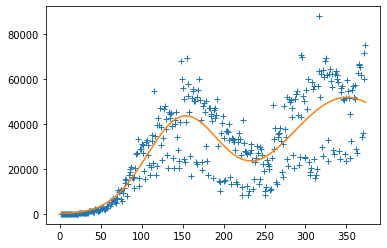

[41901.801994391026, 150.87718250928197, 45.160786169840875, 51828.400924288115, 350.69282912366015, 75.81417314587672]
Iteração: 1500


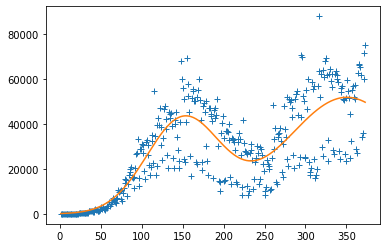

[41901.920960542775, 150.87708356772026, 45.16102918389077, 51828.60578456918, 350.6892973043293, 75.80863944654878]
Iteração: 1800


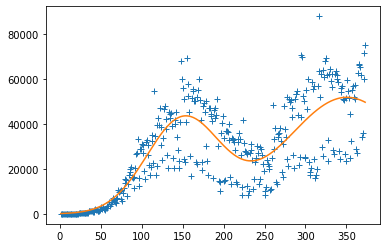

[41901.92033919988, 150.87708297442302, 45.161029997358305, 51828.607429754324, 350.6892964839885, 75.80864011760919]
Iteração: 2100


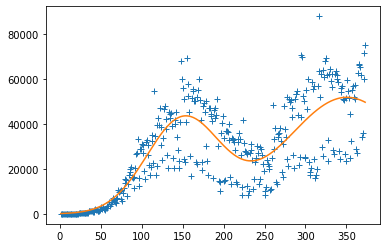

[41901.92027488734, 150.87708339291717, 45.16102980842294, 51828.60711842721, 350.6892974893756, 75.80864114731175]
Iteração: 2400


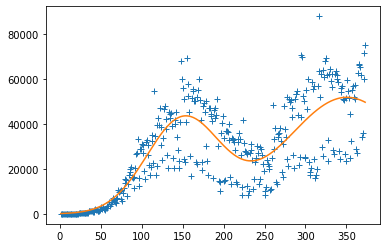

[41901.92027488734, 150.87708339291717, 45.16102980842294, 51828.60711842721, 350.6892974893756, 75.80864114731175]
Iteração: 2700


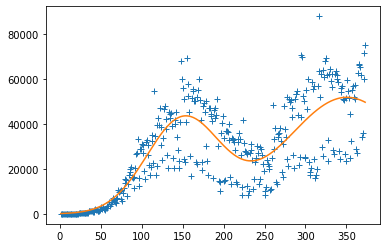

[41901.92027488734, 150.87708339291717, 45.16102980842294, 51828.60711842721, 350.6892974893756, 75.80864114731175]
Iteração: 3000


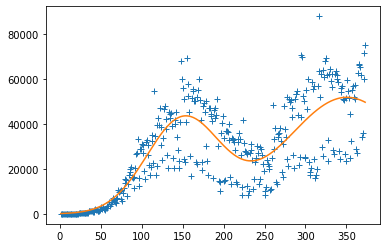

[41901.92027488734, 150.87708339291717, 45.16102980842294, 51828.60711842721, 350.6892974893756, 75.80864114731175]
[41901.92027488734, 150.87708339291717, 45.16102980842294, 51828.60711842721, 350.6892974893756, 75.80864114731175]
           w[0]        w[1]      w[2]          w[3]        w[4]       w[5]
0  41901.920138  150.877083  45.16103  51828.607325  350.689298  75.808642
1  41901.920327  150.877084  45.16103  51828.607089  350.689297  75.808640
2  41901.920553  150.877083  45.16103  51828.607432  350.689299  75.808642
3  41901.920093  150.877084  45.16103  51828.607172  350.689298  75.808642
4  41901.920189  150.877082  45.16103  51828.607082  350.689298  75.808643
5  41901.920300  150.877083  45.16103  51828.607153  350.689297  75.808641
6  41901.920637  150.877083  45.16103  51828.606957  350.689297  75.808641
7  41901.920275  150.877083  45.16103  51828.607118  350.689297  75.808641


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in true_divide


Iteração: 300


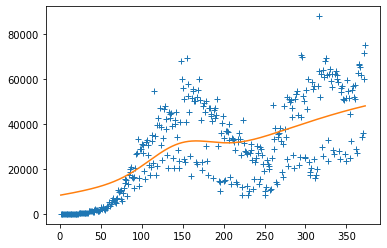

[9994.484043314435, 146.20144024942823, 38.48633855355868, 53277.77831161587, 488.71969690890523, 253.46799701990668]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in true_divide


Iteração: 600


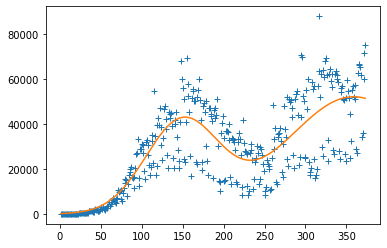

[40668.63299294426, 149.23467001358676, 44.89547883391181, 52095.28274717403, 359.0482463958439, 83.6032405647644]
Iteração: 900


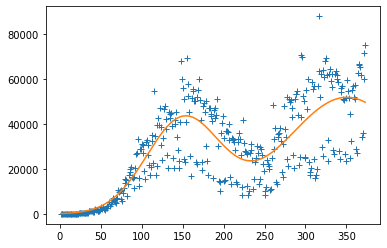

[41901.64469317249, 150.87740392067698, 45.16171680934286, 51830.86546266411, 350.69824301389474, 75.81310357074284]
Iteração: 1200


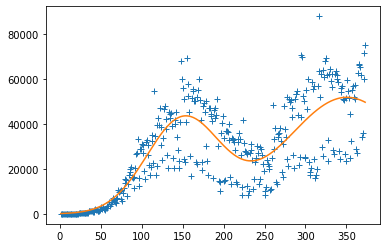

[41901.91915760912, 150.8770798530639, 45.161029675779446, 51828.60639326602, 350.68930441050776, 75.80865136281498]
Iteração: 1500


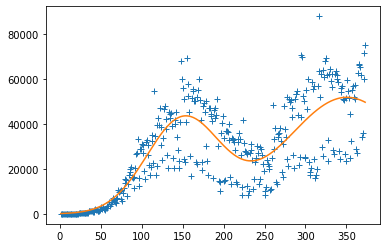

[41901.92007022249, 150.87708278086487, 45.16102942816774, 51828.60733562236, 350.6893001846528, 75.80864393133388]
Iteração: 1800


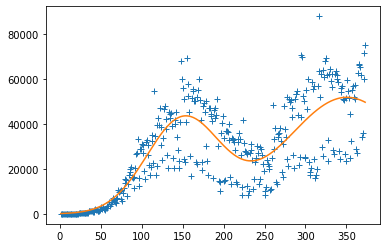

[41901.920107473255, 150.87708276068162, 45.161029789470426, 51828.607283791855, 350.68929919143335, 75.80864216631109]
Iteração: 2100


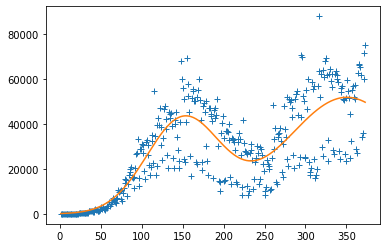

[41901.920107473255, 150.87708276068162, 45.161029789470426, 51828.607283791855, 350.68929919143335, 75.80864216631109]
Iteração: 2400


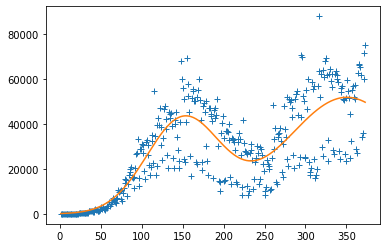

[41901.920107473255, 150.87708276068162, 45.161029789470426, 51828.607283791855, 350.68929919143335, 75.80864216631109]
Iteração: 2700


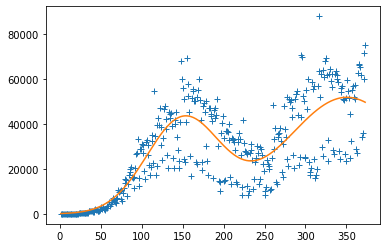

[41901.920107473255, 150.87708276068162, 45.161029789470426, 51828.607283791855, 350.68929919143335, 75.80864216631109]
Iteração: 3000


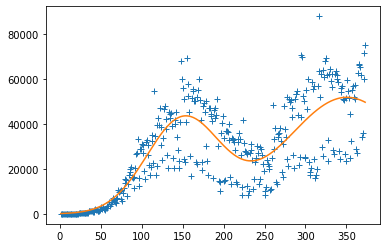

[41901.920107473255, 150.87708276068162, 45.161029789470426, 51828.607283791855, 350.68929919143335, 75.80864216631109]
[41901.920107473255, 150.87708276068162, 45.161029789470426, 51828.607283791855, 350.68929919143335, 75.80864216631109]
           w[0]        w[1]      w[2]          w[3]        w[4]       w[5]
0  41901.920138  150.877083  45.16103  51828.607325  350.689298  75.808642
1  41901.920327  150.877084  45.16103  51828.607089  350.689297  75.808640
2  41901.920553  150.877083  45.16103  51828.607432  350.689299  75.808642
3  41901.920093  150.877084  45.16103  51828.607172  350.689298  75.808642
4  41901.920189  150.877082  45.16103  51828.607082  350.689298  75.808643
5  41901.920300  150.877083  45.16103  51828.607153  350.689297  75.808641
6  41901.920637  150.877083  45.16103  51828.606957  350.689297  75.808641
7  41901.920275  150.877083  45.16103  51828.607118  350.689297  75.808641
8  41901.920107  150.877083  45.16103  51828.607284  350.689299  75.808642


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in true_divide


Iteração: 300


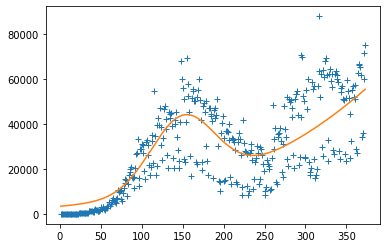

[31747.03892590133, 150.14094924450308, 39.456096895980934, 339572.90376816713, 1000, 329.2738256193119]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: divide by zero encountered in true_divide


Iteração: 600


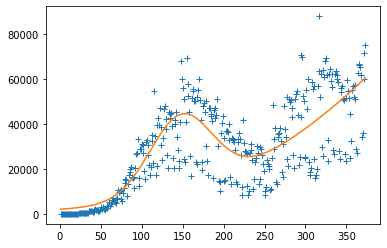

[33760.75459120793, 147.8107307138244, 38.23911666058008, 146198.645766422, 683.8212786224391, 233.69283614587113]
Iteração: 900


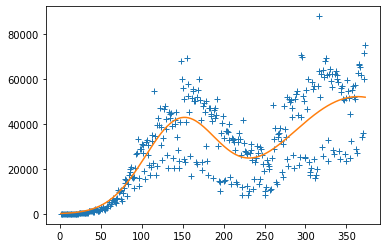

[39669.642844502065, 147.70513505767997, 44.671074955382196, 52130.7357295259, 363.7978183641209, 90.71358006699236]
Iteração: 1200


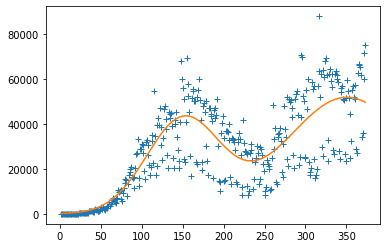

[41902.92114269888, 150.87656545086438, 45.16045177878069, 51830.85849085125, 350.6952213863878, 75.81062854724826]
Iteração: 1500


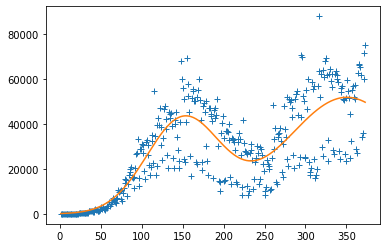

[41901.917882930094, 150.87708282488254, 45.16103138472749, 51828.60998288134, 350.6893061191864, 75.8086482237024]
Iteração: 1800


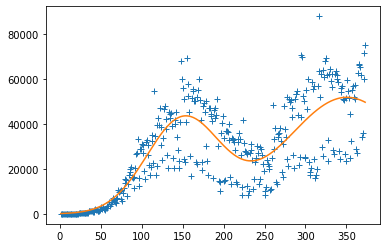

[41901.9202459661, 150.87708299460746, 45.16102990460823, 51828.6075061104, 350.6892985946179, 75.80864193421021]
Iteração: 2100


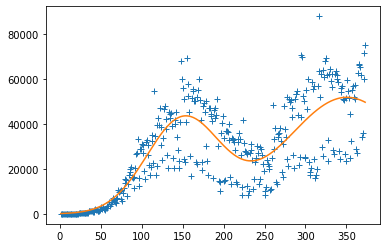

[41901.92003384435, 150.87708283467325, 45.16102979099188, 51828.606813031445, 350.6892973239427, 75.80864195635436]
Iteração: 2400


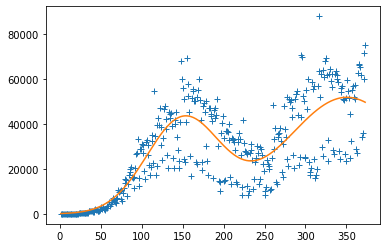

[41901.92003384435, 150.87708283467325, 45.16102979099188, 51828.606813031445, 350.6892973239427, 75.80864195635436]
Iteração: 2700


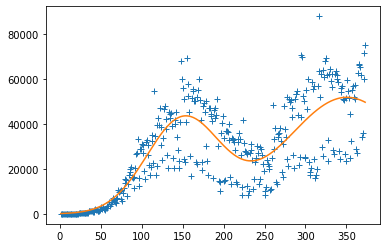

[41901.91991157213, 150.8770833089597, 45.161029960018084, 51828.60712222262, 350.68929867096483, 75.80864189156763]
Iteração: 3000


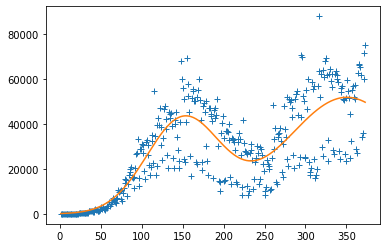

[41901.91991157213, 150.8770833089597, 45.161029960018084, 51828.60712222262, 350.68929867096483, 75.80864189156763]
[41901.91991157213, 150.8770833089597, 45.161029960018084, 51828.60712222262, 350.68929867096483, 75.80864189156763]
           w[0]        w[1]      w[2]          w[3]        w[4]       w[5]
0  41901.920138  150.877083  45.16103  51828.607325  350.689298  75.808642
1  41901.920327  150.877084  45.16103  51828.607089  350.689297  75.808640
2  41901.920553  150.877083  45.16103  51828.607432  350.689299  75.808642
3  41901.920093  150.877084  45.16103  51828.607172  350.689298  75.808642
4  41901.920189  150.877082  45.16103  51828.607082  350.689298  75.808643
5  41901.920300  150.877083  45.16103  51828.607153  350.689297  75.808641
6  41901.920637  150.877083  45.16103  51828.606957  350.689297  75.808641
7  41901.920275  150.877083  45.16103  51828.607118  350.689297  75.808641
8  41901.920107  150.877083  45.16103  51828.607284  350.689299  75.808642
9  41901.919912 

"\n#Testing the model:\n\nx_dados = np.array(srag_deaths_data['semana_epidemiologica'].astype(float))\ny_dados = np.array(srag_deaths_data['casos'].astype(float))\n\ncost_func = rsme\nobjective_function_name = 'dist_maxwell_boltzmann'\n\nbounds = [(0.,1), (0.,50), (0.,1), (0.,1e6), (0.,1), (100,500), (0.,1), (0.,1e6)]\n\npopsize = 80              #Tamanho da população (Artigo 10*n_parâmetros_do_modelo)\nmutate = 0.5              #Fator de mutação [0,2]\nrecombination = 0.5       #Parâmetro de recombinação [0,1]\nmaxiter = 3000            #Número de gerações\nplot_interval = 300       #plotar a cada...\n\nres_cases_data = pd.DataFrame(columns=('w[0]','w[1]','w[2]','w[3]','w[4]','w[5]','w[6]','w[7]'))\n\nfor i in range(10):\n    list_tmp = Differential_Evolution(cost_func, bounds, popsize, mutate, recombination, maxiter, x_dados, y_dados, plot_interval)\n    print(list_tmp)\n\n    res_cases_data = res_cases_data.append({'w[0]': list_tmp[0], 'w[1]': list_tmp[1],'w[2]': list_tmp[2], 'w[3]'

<Figure size 432x288 with 0 Axes>

In [ ]:
#Old model:

x_dados = np.array(cases_data['dia_epidemiologico'])
y_dados = np.array(cases_data['casos'])

cost_func = rsme
objective_function_name = 'double_gaussian'

#leg: w[0]->height of the peak, w[1]->center position, w[2]->standard deviations
bounds = [(0,1e6), (0,225), (0,5000), (0,1e6), (225,1000), (0,5000)]

popsize = 60              #Tamanho da população (Artigo 10*n_parâmetros_do_modelo)
mutate = 0.6              #Fator de mutação [0,2]
recombination = 0.5       #Parâmetro de recombinação [0,1]
maxiter = 3000            #Número de gerações
plot_interval = 300       #plotar a cada...

res_cases_data = pd.DataFrame(columns=('w[0]','w[1]','w[2]','w[3]','w[4]','w[5]'))

for i in range(10):
    list_tmp = Differential_Evolution(cost_func, bounds, popsize, mutate, recombination, maxiter, x_dados, y_dados, plot_interval)
    print(list_tmp)

    res_cases_data = res_cases_data.append({'w[0]': list_tmp[0], 'w[1]': list_tmp[1],'w[2]': list_tmp[2], 'w[3]': list_tmp[3], 'w[4]': list_tmp[4], 'w[5]': list_tmp[5]}, ignore_index=True)
    print(res_cases_data)
    

In [ ]:
#Calculate the error generated by the parameters:

cost_function = 'double_gaussian'
x_dados = np.array(cases_data['dia_epidemiologico'])
y_dados = np.array(cases_data['casos'])

index_list_tmp = []
error_list_tmp = []
for i in range(len(res_cases_data)):
    
    tmp_list = []
    for j in range(len(res_cases_data.iloc[i])):
        tmp_list.append(res_cases_data.iloc[i][j])
    
    print(i, tmp_list)
    index_list_tmp.append(i)
    error_list_tmp.append(rsme(x_dados, y_dados, tmp_list))

for i in range(len(res_cases_data)):
    print(index_list_tmp[i], error_list_tmp[i])


0 [41901.92013825378, 150.87708281502267, 45.1610298833124, 51828.60732526354, 350.6892979535555, 75.80864162346583]
1 [41901.92032673272, 150.8770837236012, 45.161030230999536, 51828.60708945287, 350.6892969129278, 75.80863983943492]
2 [41901.92055346394, 150.87708291172441, 45.16102982723463, 51828.60743224987, 350.6892988510303, 75.80864189063944]
3 [41901.92009311468, 150.87708365677983, 45.161030145589415, 51828.607172337295, 350.6892984664576, 75.80864150707399]
4 [41901.92018857734, 150.8770824387883, 45.16102954760356, 51828.60708183939, 350.68929848645485, 75.8086427884855]
5 [41901.92029996277, 150.87708348333453, 45.161029752411686, 51828.60715254688, 350.6892967935447, 75.80864076825802]
6 [41901.92063685259, 150.87708301471082, 45.16103002539803, 51828.60695662044, 350.6892971601507, 75.80864092448031]
7 [41901.92027488734, 150.87708339291717, 45.16102980842294, 51828.60711842721, 350.6892974893756, 75.80864114731175]
8 [41901.920107473255, 150.87708276068162, 45.161029789

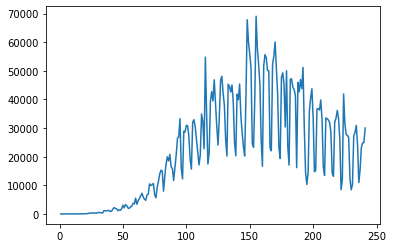

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp


Iteração: 50


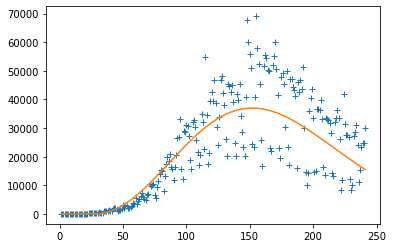

[0.004266550804984441, 3.4857196275486864, 0.1236514089491793, 682112.7790998584]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp


Iteração: 100


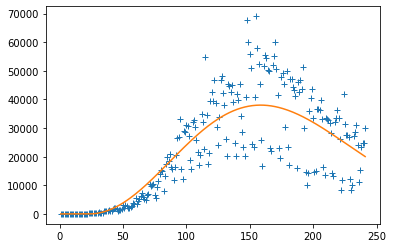

[0.0019980732457234858, 3.9000323815787823, 0.1656687029472087, 1024519.4537129592]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp


Iteração: 150


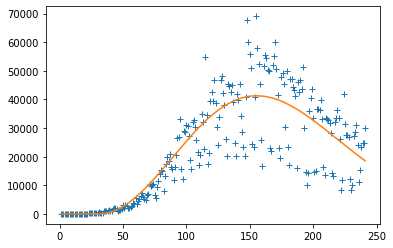

[0.004360435052635161, 3.742182148281424, 0.12152371425423641, 752921.6634558067]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp


Iteração: 200


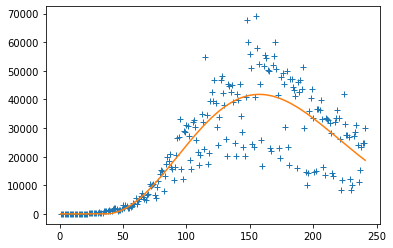

[0.0034948204267174496, 5.00935127730555, 0.13924319635636154, 851072.7212525189]
Iteração: 250


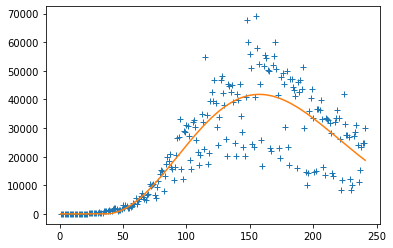

[0.0034948204267174496, 5.00935127730555, 0.13924319635636154, 851072.7212525189]
Iteração: 300


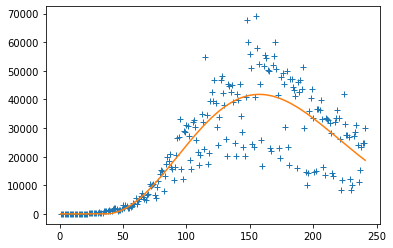

[0.0034948204267174496, 5.00935127730555, 0.13924319635636154, 851072.7212525189]
Iteração: 350


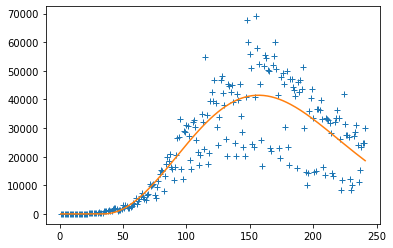

[0.0024698726012248335, 5.7101549884067015, 0.16459116524168096, 1005072.5250327033]
Iteração: 400


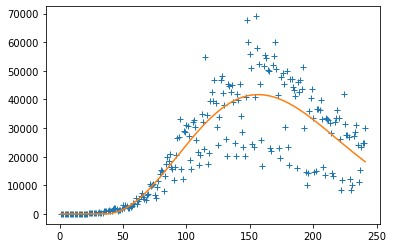

[0.001829116086664468, 6.955603615798063, 0.19374393527802689, 1174280.219626639]
Iteração: 450


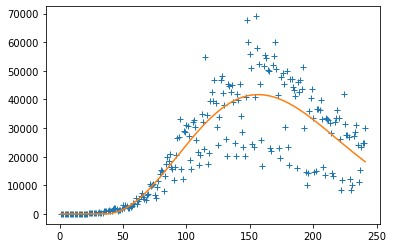

[0.001829116086664468, 6.955603615798063, 0.19374393527802689, 1174280.219626639]
Iteração: 500


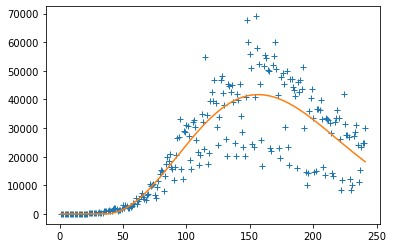

[0.001829116086664468, 6.955603615798063, 0.19374393527802689, 1174280.219626639]
Iteração: 550


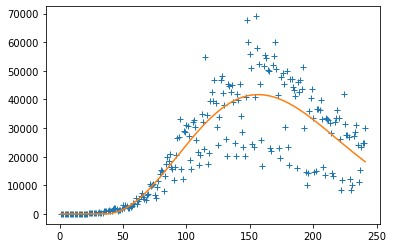

[0.001829116086664468, 6.955603615798063, 0.19374393527802689, 1174280.219626639]
Iteração: 600


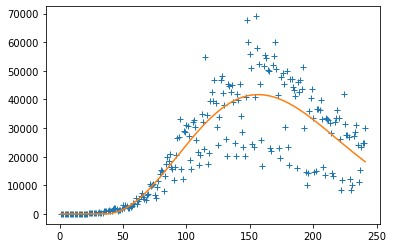

[0.001829116086664468, 6.955603615798063, 0.19374393527802689, 1174280.219626639]
Iteração: 650


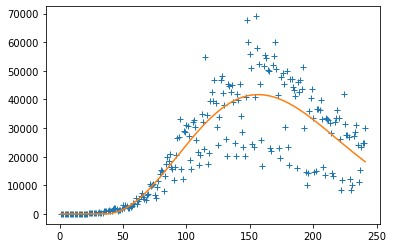

[0.001829116086664468, 6.955603615798063, 0.19374393527802689, 1174280.219626639]
Iteração: 700


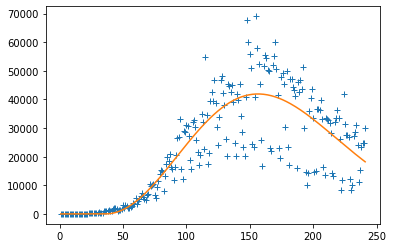

[0.002731836031674634, 5.757109776540109, 0.15901279474831875, 965943.4016182818]
Iteração: 750


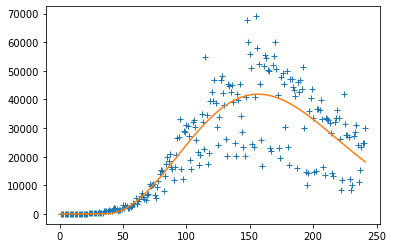

[0.002745820868943683, 5.747453110869984, 0.15858426005181375, 961671.1105858244]
Iteração: 800


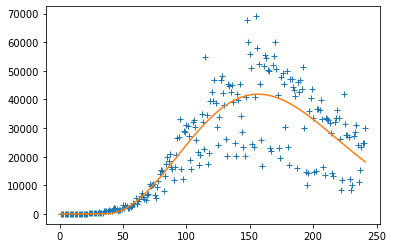

[0.002745820868943683, 5.747453110869984, 0.15858426005181375, 961671.1105858244]
Iteração: 850


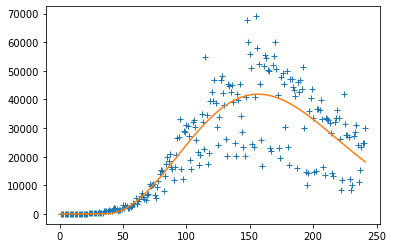

[0.002745820868943683, 5.747453110869984, 0.15858426005181375, 961671.1105858244]
Iteração: 900


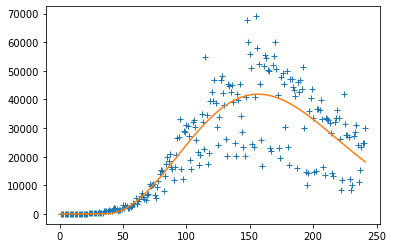

[0.002745820868943683, 5.747453110869984, 0.15858426005181375, 961671.1105858244]
Iteração: 950


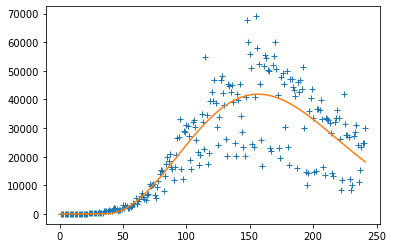

[0.002745820868943683, 5.747453110869984, 0.15858426005181375, 961671.1105858244]
Iteração: 1000


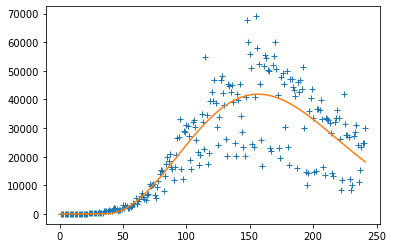

[0.002745820868943683, 5.747453110869984, 0.15858426005181375, 961671.1105858244]
[0.002745820868943683, 5.747453110869984, 0.15858426005181375, 961671.1105858244]
       w[0]      w[1]      w[2]           w[3]
0  0.002746  5.747453  0.158584  961671.110586


<Figure size 432x288 with 0 Axes>

In [ ]:
#Fit the first wave with the new model:

cases_data_tmp = cases_data.copy()

for i in range(len(cases_data_tmp)): 
    if i > 240: cases_data_tmp.drop([i], inplace=True)

x_dados = np.array(cases_data_tmp['dia_epidemiologico'])
y_dados = np.array(cases_data_tmp['casos'])

plt.plot(x_dados, y_dados)
plt.show()

cost_func = rsme
objective_function_name = 'single_maxwell_boltzmann'

bounds = [(0.,1e-1), (0.,50), (1e-2,1), (1e1,1e7)]

popsize = 80              #Tamanho da população (Artigo 10*n_parâmetros_do_modelo)
mutate = 0.5              #Fator de mutação [0,2]
recombination = 0.4       #Parâmetro de recombinação [0,1]
maxiter = 1000            #Número de gerações
plot_interval = 100       #plotar a cada...

for i in range(1):
    list_tmp = Differential_Evolution(cost_func, bounds, popsize, mutate, recombination, maxiter, x_dados, y_dados, plot_interval)
    print(list_tmp)


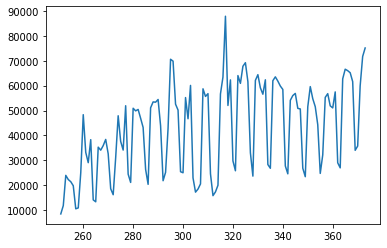

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp


Iteração: 100


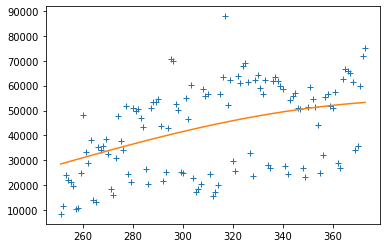

[0.00020952264182561627, 22.830190786980477, 0.2278260673414506, 4525039.094409114]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp


Iteração: 200


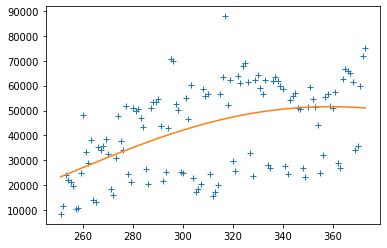

[0.002284266765277935, 17.15946596970044, 0.10612067799914143, 1298572.7524559088]
Iteração: 300


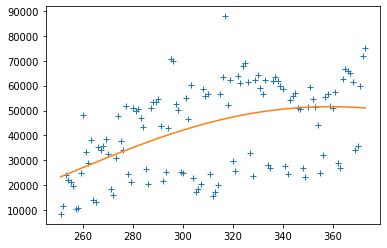

[0.002284266765277935, 17.15946596970044, 0.10612067799914143, 1298572.7524559088]
Iteração: 400


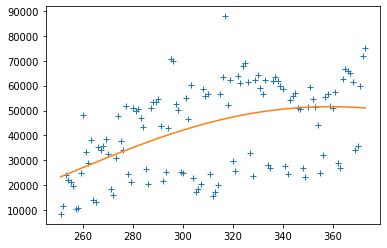

[0.002284266765277935, 17.15946596970044, 0.10612067799914143, 1298572.7524559088]
Iteração: 500


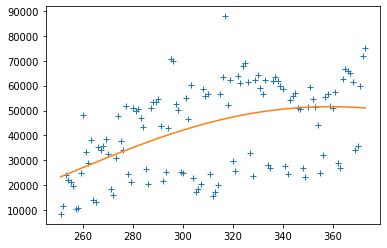

[0.002284266765277935, 17.15946596970044, 0.10612067799914143, 1298572.7524559088]
Iteração: 600


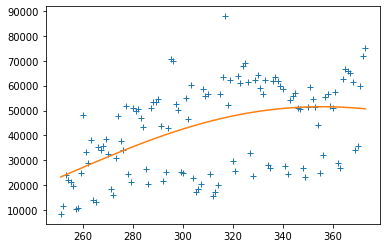

[0.001577522494728939, 21.725092654730002, 0.1319217162499107, 1562449.5021187267]
Iteração: 700


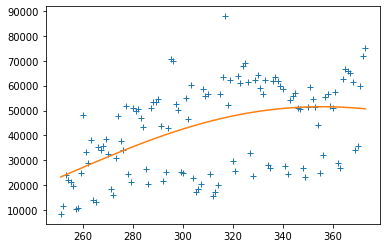

[0.001577522494728939, 21.725092654730002, 0.1319217162499107, 1562449.5021187267]
Iteração: 800


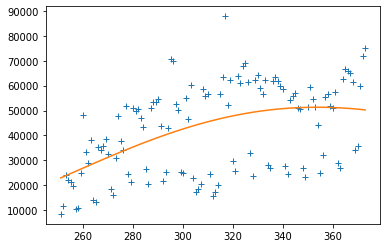

[0.001276760840576872, 25.162851133169298, 0.15029416606268378, 1729918.786822686]
Iteração: 900


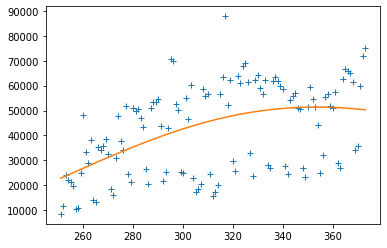

[0.001557861218758222, 23.032172392766775, 0.1368774635875986, 1568101.5780443596]
Iteração: 1000


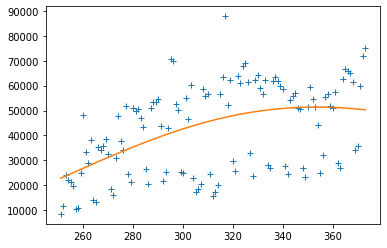

[0.001557861218758222, 23.032172392766775, 0.1368774635875986, 1568101.5780443596]
Iteração: 1100


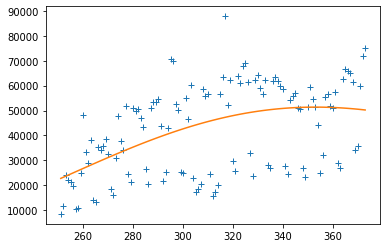

[0.0018427124393284428, 21.34750279003039, 0.12644621596286243, 1441370.5419467362]
Iteração: 1200


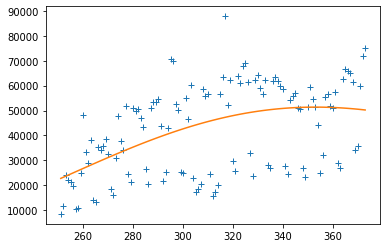

[0.0018427124393284428, 21.34750279003039, 0.12644621596286243, 1441370.5419467362]
Iteração: 1300


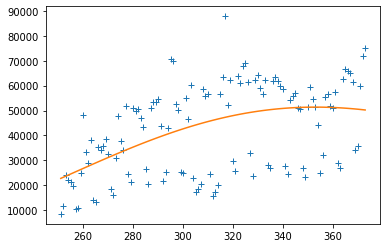

[0.0018427124393284428, 21.34750279003039, 0.12644621596286243, 1441370.5419467362]
Iteração: 1400


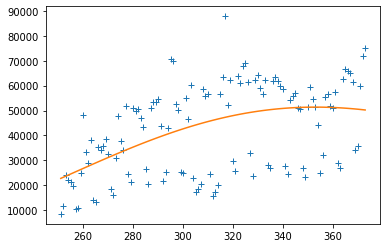

[0.0018427124393284428, 21.34750279003039, 0.12644621596286243, 1441370.5419467362]
Iteração: 1500


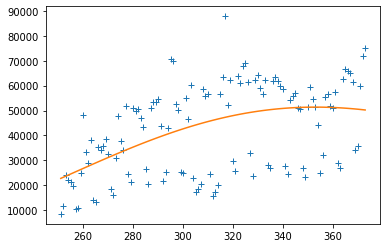

[0.0018427124393284428, 21.34750279003039, 0.12644621596286243, 1441370.5419467362]
Iteração: 1600


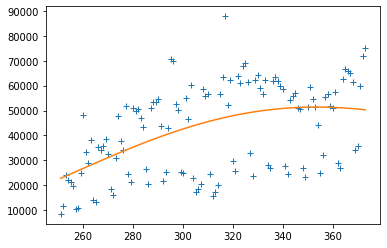

[0.0018627086145444568, 21.08187549028779, 0.12518630878267462, 1434243.4060119223]
Iteração: 1700


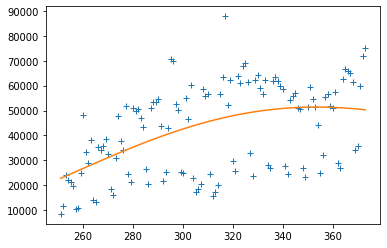

[0.0018627086145444568, 21.08187549028779, 0.12518630878267462, 1434243.4060119223]
Iteração: 1800


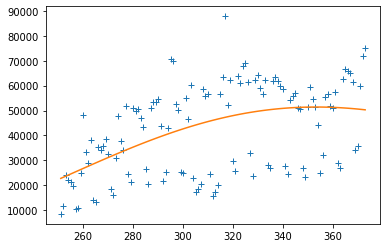

[0.0015946345109744803, 22.891116779816393, 0.13568010451352558, 1550546.5779353878]
Iteração: 1900


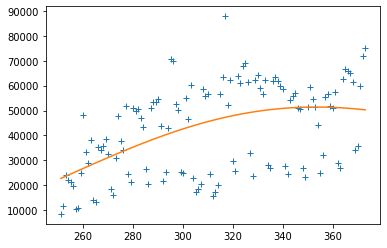

[0.0017767629799061223, 21.680864178995048, 0.12852233086043358, 1468615.8325787564]
Iteração: 2000


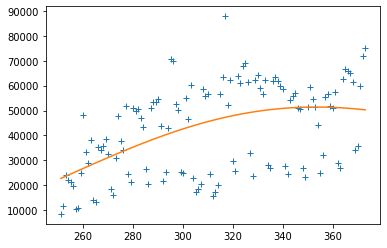

[0.0017767629799061223, 21.680864178995048, 0.12852233086043358, 1468615.8325787564]
[0.0017767629799061223, 21.680864178995048, 0.12852233086043358, 1468615.8325787564]
       w[0]       w[1]      w[2]          w[3]
0  0.001777  21.680864  0.128522  1.468616e+06


<Figure size 432x288 with 0 Axes>

In [ ]:
#Fit the second wave with the new model:

cases_data_tmp = cases_data.copy()

for i in range(len(cases_data_tmp)): 
    if i < 250: cases_data_tmp.drop([i], inplace=True)

x_dados = np.array(cases_data_tmp['dia_epidemiologico'])
y_dados = np.array(cases_data_tmp['casos'])

plt.plot(x_dados, y_dados)
plt.show()

cost_func = rsme
objective_function_name = 'single_maxwell_boltzmann'

bounds = [(0.,1e-1), (5.747453110869984,500), (1e-2,1), (1e1,1e7)]

popsize = 40              #Tamanho da população (Artigo 10*n_parâmetros_do_modelo)
mutate = 0.5              #Fator de mutação [0,2]
recombination = 0.4       #Parâmetro de recombinação [0,1]
maxiter = 2000            #Número de gerações
plot_interval = 100       #plotar a cada...

for i in range(1):
    list_tmp = Differential_Evolution(cost_func, bounds, popsize, mutate, recombination, maxiter, x_dados, y_dados, plot_interval)
    print(list_tmp)


Iteração: 10


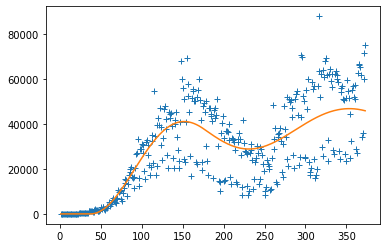

[0.002446468931761283, 6.6088681720590605, 0.17693755428406688, 1000000.0, 0.0018567486508831734, 22.58203637503849, 0.128410360288701, 1297105.2862371884]
Iteração: 20


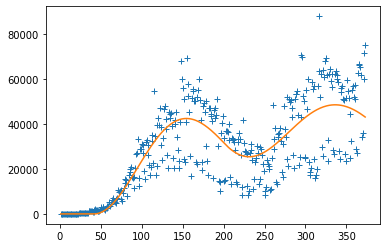

[0.0026091229790963636, 7.2, 0.17333429310031234, 1000000.0, 0.0017819314085557119, 34.070836458269824, 0.17, 1360593.0664954577]
Iteração: 30


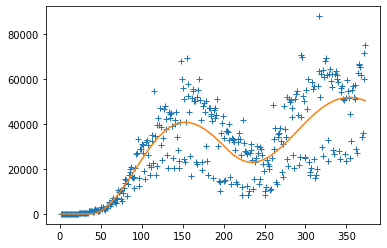

[0.002405151032524932, 6.549939746872198, 0.17601027218593646, 1000000.0, 0.001787262547222976, 31.89080456226583, 0.15601681653485744, 1462237.976942258]
Iteração: 40


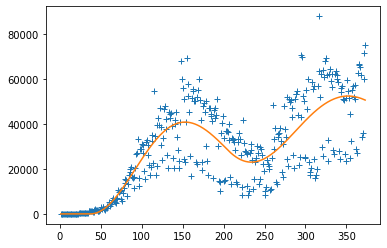

[0.002416449277057725, 6.549939746872198, 0.17601027218593646, 1000000.0, 0.00182889546470061, 31.89080456226583, 0.15601681653485744, 1462237.976942258]
Iteração: 50


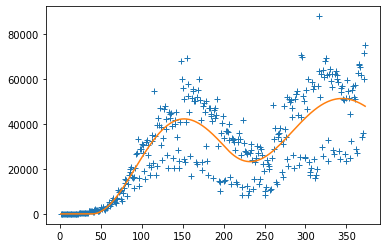

[0.0023199980480882697, 7.189353884792226, 0.1842319240338106, 1055911.9923510575, 0.0018291684021512287, 33.088378716620724, 0.16278460495819558, 1429908.5372507945]
Iteração: 60


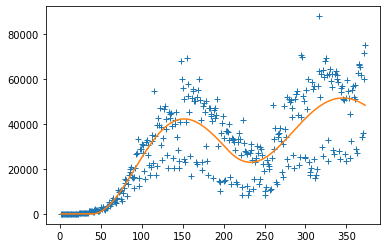

[0.0023199980480882697, 7.189353884792226, 0.1842319240338106, 1055911.9923510575, 0.0018291684021512287, 33.23922843278564, 0.16278460495819558, 1437005.7698875186]
Iteração: 70


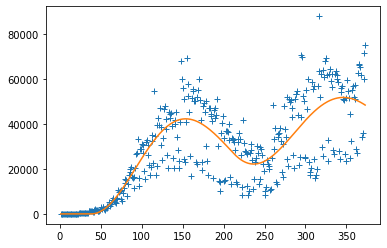

[0.0025904535877107606, 6.500916546621125, 0.17018707520234877, 1000000.0, 0.00198039801216884, 34.72167673522425, 0.16404462298959932, 1384054.347195228]
Iteração: 80


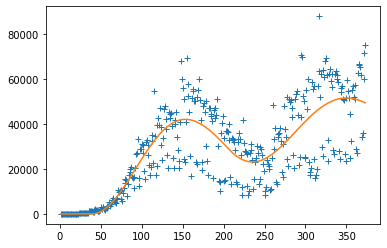

[0.0024284216633825876, 6.88672179357849, 0.1772098929255902, 1027093.0795314193, 0.0017095118943729049, 33.98602049248575, 0.16506181734830427, 1486701.0517605783]
Iteração: 90


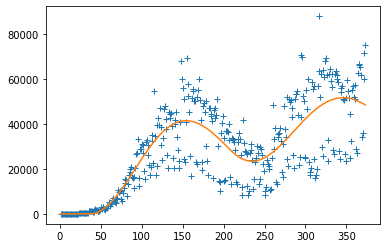

[0.0023822993310761422, 6.395094537216917, 0.17450516968335766, 1022467.6224735316, 0.0019417147269736115, 33.4785162515645, 0.1609939191242583, 1392521.584762871]
Iteração: 100


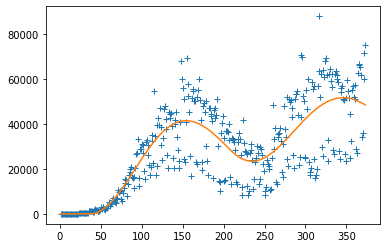

[0.0023822993310761422, 6.395094537216917, 0.17450516968335766, 1022467.6224735316, 0.0019417147269736115, 33.4785162515645, 0.1609939191242583, 1392521.584762871]
Iteração: 110


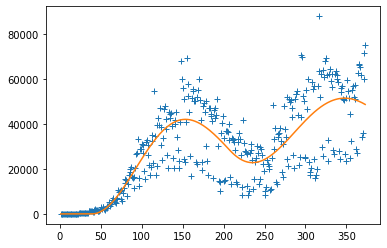

[0.0024284216633825876, 6.88672179357849, 0.1772098929255902, 1027093.0795314193, 0.0017, 35.27145893539708, 0.17, 1486701.0517605783]
Iteração: 120


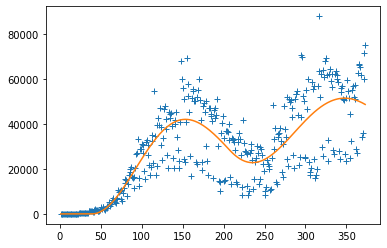

[0.0024284216633825876, 6.88672179357849, 0.1772098929255902, 1027093.0795314193, 0.0017, 35.27145893539708, 0.17, 1486701.0517605783]
Iteração: 130


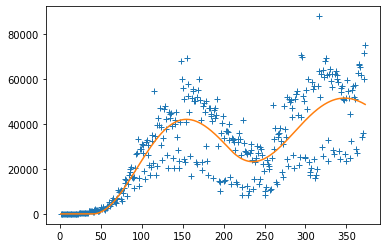

[0.0024284216633825876, 7.103946860930385, 0.1772098929255902, 1027093.0795314193, 0.0017, 35.27145893539708, 0.17, 1486701.0517605783]
Iteração: 140


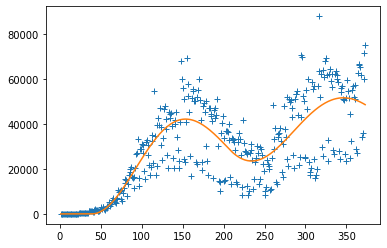

[0.0024563540854246066, 6.814074140704321, 0.17580012426410005, 1024098.1510600662, 0.0018783634848225567, 33.20318861737708, 0.16126177787240564, 1417737.0135103315]
Iteração: 150


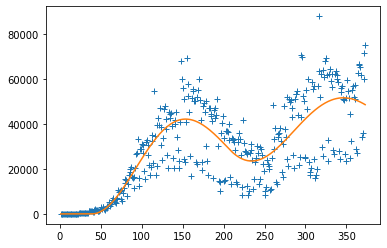

[0.0024563540854246066, 6.814074140704321, 0.17580012426410005, 1024098.1510600662, 0.0018783634848225567, 33.20318861737708, 0.16126177787240564, 1417737.0135103315]
Iteração: 160


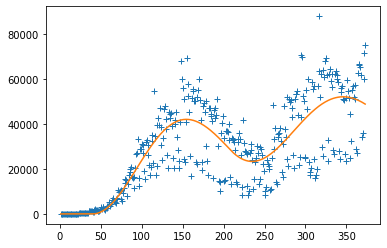

[0.0024284216633825876, 7.0763728836337645, 0.1772098929255902, 1027093.0795314193, 0.0017369522504201314, 35.27145893539708, 0.17, 1486701.0517605783]
Iteração: 170


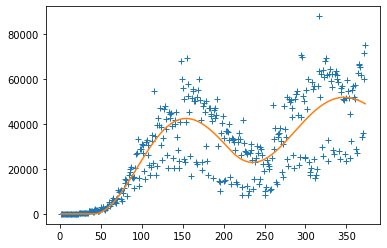

[0.002517788248812226, 7.2, 0.17601749083638144, 1018097.0559055964, 0.0019511973154871607, 33.08054852807006, 0.15929723956756206, 1398885.5783427176]
Iteração: 180


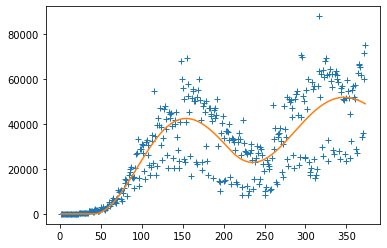

[0.002517788248812226, 7.2, 0.17601749083638144, 1018097.0559055964, 0.0019511973154871607, 33.08054852807006, 0.15929723956756206, 1398885.5783427176]
Iteração: 190


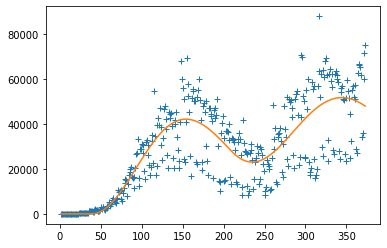

[0.0023373358078802218, 6.959478082678196, 0.17956689424324723, 1049070.1263840091, 0.0019425935185489963, 34.30195390696528, 0.16421648831616084, 1394244.9559392622]
Iteração: 200


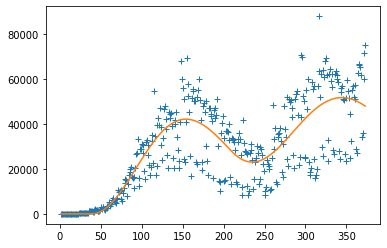

[0.0023373358078802218, 6.959478082678196, 0.17956689424324723, 1049070.1263840091, 0.0019425935185489963, 34.30195390696528, 0.16421648831616084, 1394244.9559392622]
Iteração: 210


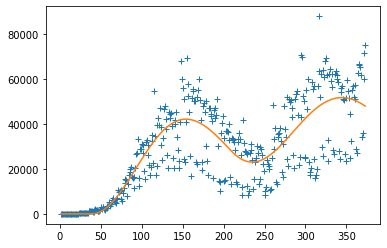

[0.0023373358078802218, 6.959478082678196, 0.17956689424324723, 1049070.1263840091, 0.0019425935185489963, 34.30195390696528, 0.16421648831616084, 1394244.9559392622]
Iteração: 220


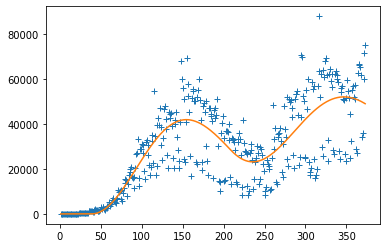

[0.0025456226768139313, 6.625602927765858, 0.17123602866155413, 1000000.0, 0.00202521606125377, 32.91379845375813, 0.1577038042435257, 1374957.8341083024]
Iteração: 230


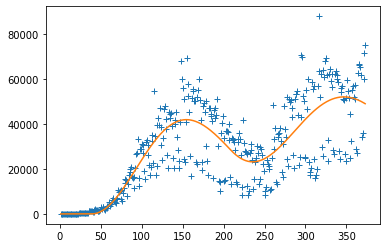

[0.0025456226768139313, 6.625602927765858, 0.17123602866155413, 1000000.0, 0.00202521606125377, 32.91379845375813, 0.1577038042435257, 1374957.8341083024]
Iteração: 240


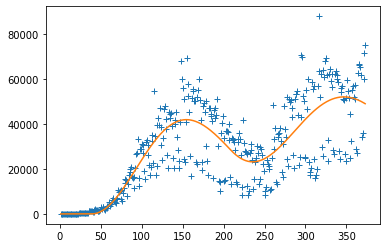

[0.0025456226768139313, 6.625602927765858, 0.17123602866155413, 1000000.0, 0.00202521606125377, 32.91379845375813, 0.1577038042435257, 1374957.8341083024]
Iteração: 250


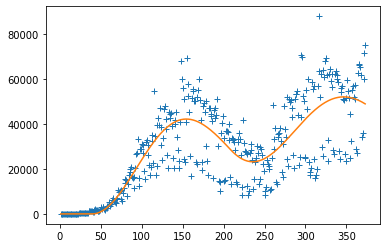

[0.002539082054156469, 6.759055461088252, 0.17227236808488056, 1007642.9280019992, 0.0019029106794762186, 33.9875938268561, 0.16293785946565503, 1418896.6884196624]
Iteração: 260


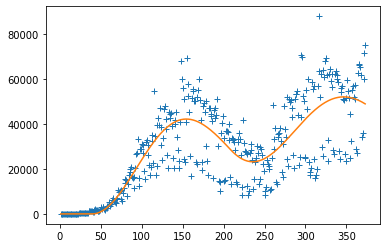

[0.002539082054156469, 6.759055461088252, 0.17227236808488056, 1007642.9280019992, 0.0019029106794762186, 33.9875938268561, 0.16293785946565503, 1418896.6884196624]
Iteração: 270


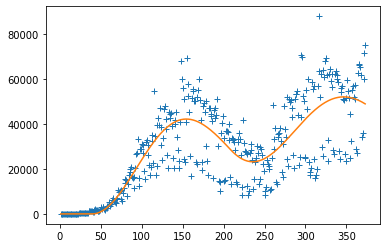

[0.002539082054156469, 6.759055461088252, 0.17227236808488056, 1007642.9280019992, 0.0019029106794762186, 33.9875938268561, 0.16293785946565503, 1418896.6884196624]
Iteração: 280


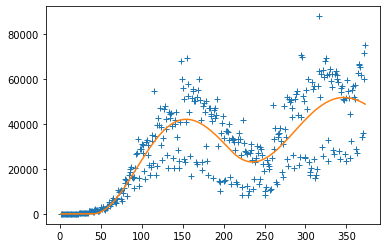

[0.002519175254412616, 6.919020112887907, 0.17398167849936405, 1008987.4055077373, 0.001818785868684889, 34.37533570419683, 0.16542532368614984, 1445121.5038530985]
Iteração: 290


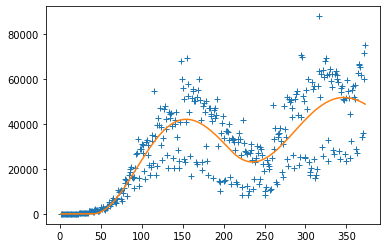

[0.002519175254412616, 6.919020112887907, 0.17398167849936405, 1008987.4055077373, 0.001818785868684889, 34.37533570419683, 0.16542532368614984, 1445121.5038530985]
Iteração: 300


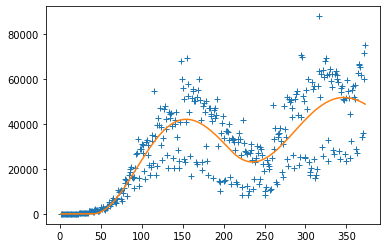

[0.002519175254412616, 6.919020112887907, 0.17398167849936405, 1008987.4055077373, 0.001818785868684889, 34.37533570419683, 0.16542532368614984, 1445121.5038530985]
[0.002519175254412616, 6.919020112887907, 0.17398167849936405, 1008987.4055077373, 0.001818785868684889, 34.37533570419683, 0.16542532368614984, 1445121.5038530985]
       w[0]     w[1]      w[2]  ...       w[5]      w[6]          w[7]
0  0.002519  6.91902  0.173982  ...  34.375336  0.165425  1.445122e+06

[1 rows x 8 columns]


<Figure size 432x288 with 0 Axes>

In [ ]:
#Adjusting the two waves at the same time with the new model:

x_dados = np.array(cases_data['dia_epidemiologico'])
y_dados = np.array(cases_data['casos'])

cost_func = rsme
objective_function_name = 'dist_maxwell_boltzmann'

#Parameters based on the predecessor runs:
#wave_1: [0.002745820868943683, 5.747453110869984, 0.15858426005181375, 961671.1105858244]
#wave_2: [0.0017767629799061223, 21.680864178995048, 0.12852233086043358, 1468615.8325787564]
bounds = [(0.0022,0.0032),
          (5.2,7.2),
          (0.10,0.20),
          (1000000.,9000000.),
          (0.0017,0.0022),
          (16.,36.),
          (0.07,0.17),
          (900000.,1900000.)]
'''
[0.0023943217186252553, 6.2, 0.17262923779276163, 1012185.8349331734, 
0.0017000000000000001,26.69079635306599,0.13711731827681597,1494521.7846571286]

[0.0024884374273399625, 6.7, 0.1799102098600806, 1008527.9774501943,
0.0012, 31.0, 0.1620991959907354, 1900000.0]

[0.002292249524057352, 6.764231032803092, 0.17879479727640585, 1057454.5352815702, 
0.0018511937209240291, 35.83295226392707, 0.17, 1421398.2136353317]

[0.0024383858688630973, 7.1994278789330775, 0.1810143176329468, 1020289.8346088822, 
0.002122223528153758, 22.742595476219133, 0.12, 1391686.2646192168]

[0.002519175254412616, 6.919020112887907, 0.17398167849936405, 1008987.4055077373, 
0.001818785868684889, 34.37533570419683, 0.16542532368614984, 1445121.5038530985]
'''
popsize = 80              #Tamanho da população (Artigo 10*n_parâmetros_do_modelo)
mutate = 0.5              #Fator de mutação [0,2]
recombination = 0.4       #Parâmetro de recombinação [0,1]
maxiter = 300            #Número de gerações
plot_interval = 10       #plotar a cada...

res_cases_data = pd.DataFrame(columns=('w[0]','w[1]','w[2]','w[3]','w[4]','w[5]','w[6]','w[7]'))

for i in range(1):
    list_tmp = Differential_Evolution(cost_func, bounds, popsize, mutate, recombination, maxiter, x_dados, y_dados, plot_interval)
    print(list_tmp)

    res_cases_data = res_cases_data.append({'w[0]': list_tmp[0], 'w[1]': list_tmp[1],'w[2]': list_tmp[2], 'w[3]': list_tmp[3], 'w[4]': list_tmp[4], 'w[5]': list_tmp[5], 'w[6]': list_tmp[6], 'w[7]': list_tmp[7]}, ignore_index=True)
    print(res_cases_data)


In [ ]:
#Calculate the error generated by the parameters:

cost_function = 'single_maxwell_boltzmann'
x_dados = np.array(cases_data['dia_epidemiologico'])
y_dados = np.array(cases_data['casos'])

tmp_list = [0.002519175254412616, 6.919020112887907, 0.17398167849936405, 1008987.4055077373, 
            0.001818785868684889, 34.37533570419683, 0.16542532368614984, 1445121.5038530985]

print(list_tmp, '\n', rsme(x_dados, y_dados, tmp_list))

print('How much the new model is better than the old parameters: ', 100-rsme(x_dados, y_dados, tmp_list)*100/11638.173789785424, '%')


[0.002519175254412616, 6.919020112887907, 0.17398167849936405, 1008987.4055077373, 0.001818785868684889, 34.37533570419683, 0.16542532368614984, 1445121.5038530985] 
 11619.20079938462
How much the new model is better than the old parameters:  0.16302377626854536 %


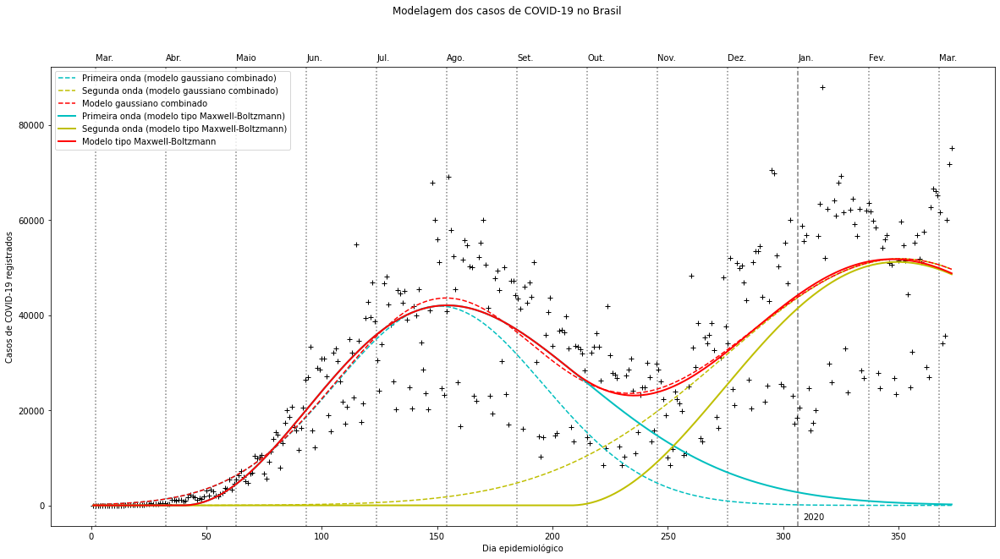

In [ ]:
#Plot the fitting and forecast of the models:

plt.figure(figsize=(20,10))
#plt.grid(True)
plt.ylabel('Casos de COVID-19 registrados')
plt.xlabel('Dia epidemiológico')
plt.suptitle('Modelagem dos casos de COVID-19 no Brasil')

future_dias=[]
dia_inicial=1.
for i in range(len(cases_data['dia_epidemiologico'])):
    future_dias.append(dia_inicial)
    dia_inicial+=1

initial_day = -59
month_tmp = 0
year_tmp = '202'
cont = 0
months = ['Jan.', 'Fev.', 'Mar.', 'Abr.', 'Maio', 'Jun.', 'Jul.', 'Ago.',
          'Set.', 'Out.', 'Nov.', 'Dez.', 'Jan.', 'Fev.', 'Mar.', 'Abr.', 
          'Maio', 'Jun.', 'Jul.', 'Ago.', 'Set.', 'Out.', 'Nov.', 'Dez.',
          'Jan.', 'Fev.', 'Mar.', 'Abr.', 'Maio', 'Jun.', 'Jul.', 'Ago.',
          'Set.', 'Out.', 'Nov.', 'Dez.']
while initial_day < len(future_dias):
    if initial_day > 0:
        if months[int(month_tmp)]=='Jan.':
            plt.text(initial_day, 93500, months[int(month_tmp)], rotation=0)
            plt.text(initial_day+2, -3000, year_tmp+str(cont), rotation=0)
            plt.axvline(initial_day, color="grey", linestyle="--")
            cont+=1
        else:
            plt.text(initial_day, 93500, months[int(month_tmp)], rotation=0)
            plt.axvline(initial_day, color="grey", linestyle=":")
    initial_day+=30.4583333
    month_tmp+=1.

plt.plot(cases_data['dia_epidemiologico'], cases_data['casos'], 'k+')

#Old model:

tmp_list = []
for i in range(len(cases_data['dia_epidemiologico'])): 
    tmp_list.append(single_gaussian(cases_data['dia_epidemiologico'].iloc[i],
                                    [41901.92013825378, 
                                     150.87708281502267, 
                                     45.1610298833124]))
plt.plot(cases_data['dia_epidemiologico'], tmp_list, 'c--',
         label='Primeira onda (modelo gaussiano combinado)')

tmp_list = []
for i in range(len(cases_data['dia_epidemiologico'])): 
    tmp_list.append(single_gaussian(cases_data['dia_epidemiologico'].iloc[i],
                                    [51828.60732526354, 
                                     350.6892979535555, 
                                     75.80864162346583]))
plt.plot(cases_data['dia_epidemiologico'], tmp_list, 'y--',
         label='Segunda onda (modelo gaussiano combinado)')

tmp_list = []
for i in range(len(cases_data['dia_epidemiologico'])): 
    tmp_list.append(double_gaussian(cases_data['dia_epidemiologico'].iloc[i],
                                    [41901.92013825378, 
                                     150.87708281502267, 
                                     45.1610298833124, 
                                     51828.60732526354, 
                                     350.6892979535555, 
                                     75.80864162346583]))
plt.plot(cases_data['dia_epidemiologico'], tmp_list, 'r--',
         label='Modelo gaussiano combinado')

#New model:

plt.plot(cases_data['dia_epidemiologico'],
         single_maxwell_boltzmann(cases_data['dia_epidemiologico'],
                                [0.002519175254412616, 
                                 6.919020112887907, 
                                 0.17398167849936405, 
                                 1008987.4055077373]),
          'c', linewidth=2., label='Primeira onda (modelo tipo Maxwell-Boltzmann)')

plt.plot(cases_data['dia_epidemiologico'],
         single_maxwell_boltzmann(cases_data['dia_epidemiologico'],
                                [0.001818785868684889, 
                                 34.37533570419683, 
                                 0.16542532368614984, 
                                 1445121.5038530985]),
          'y', linewidth=2., label='Segunda onda (modelo tipo Maxwell-Boltzmann)')

plt.plot(cases_data['dia_epidemiologico'],
         dist_maxwell_boltzmann(cases_data['dia_epidemiologico'],
                                [0.002519175254412616, 
                                 6.919020112887907, 
                                 0.17398167849936405, 
                                 1008987.4055077373, 
                                 0.001818785868684889, 
                                 34.37533570419683, 
                                 0.16542532368614984, 
                                 1445121.5038530985]),
          'r', linewidth=2., label='Modelo tipo Maxwell-Boltzmann')

plt.legend(loc=2)

plt.show()


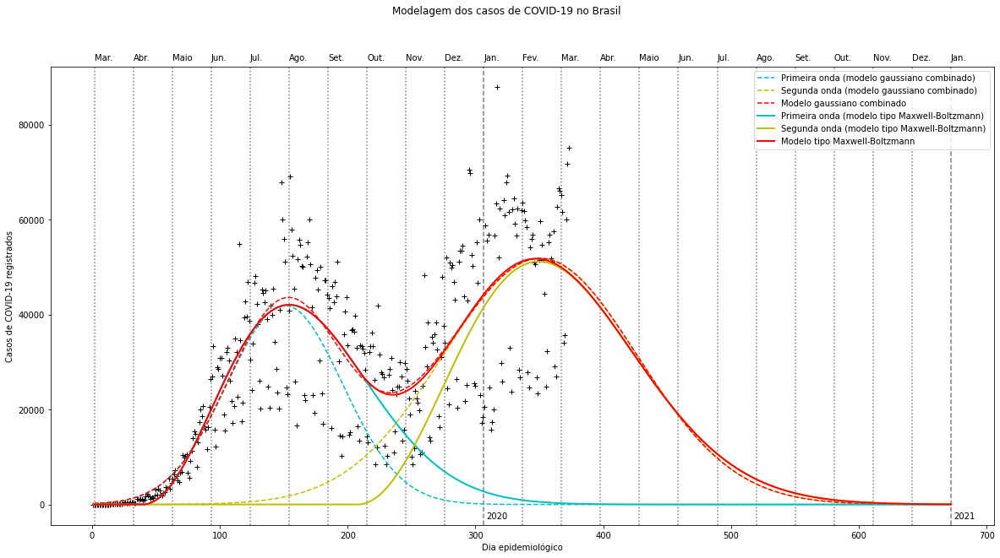

In [ ]:
#Plot the fitting and forecast of the models:

plt.figure(figsize=(20,10))
#plt.grid(True)
plt.ylabel('Casos de COVID-19 registrados')
plt.xlabel('Dia epidemiológico')
plt.suptitle('Modelagem dos casos de COVID-19 no Brasil')

future_dias=[]
dia_inicial=1.
for i in range(672):
    future_dias.append(dia_inicial)
    dia_inicial+=1

initial_day = -59
month_tmp = 0
year_tmp = '202'
cont = 0
months = ['Jan.', 'Fev.', 'Mar.', 'Abr.', 'Maio', 'Jun.', 'Jul.', 'Ago.',
          'Set.', 'Out.', 'Nov.', 'Dez.', 'Jan.', 'Fev.', 'Mar.', 'Abr.', 
          'Maio', 'Jun.', 'Jul.', 'Ago.', 'Set.', 'Out.', 'Nov.', 'Dez.',
          'Jan.', 'Fev.', 'Mar.', 'Abr.', 'Maio', 'Jun.', 'Jul.', 'Ago.',
          'Set.', 'Out.', 'Nov.', 'Dez.']
while initial_day < len(future_dias):
    if initial_day > 0:
        if months[int(month_tmp)]=='Jan.':
            plt.text(initial_day, 93500, months[int(month_tmp)], rotation=0)
            plt.text(initial_day+2, -3000, year_tmp+str(cont), rotation=0)
            plt.axvline(initial_day, color="grey", linestyle="--")
            cont+=1
        else:
            plt.text(initial_day, 93500, months[int(month_tmp)], rotation=0)
            plt.axvline(initial_day, color="grey", linestyle=":")
    initial_day+=30.4583333
    month_tmp+=1.

plt.plot(cases_data['dia_epidemiologico'], cases_data['casos'], 'k+')

#Old model:

tmp_list = []
for i in range(len(future_dias)): 
    tmp_list.append(single_gaussian(future_dias[i],
                                    [41901.92013825378, 
                                     150.87708281502267, 
                                     45.1610298833124]))
plt.plot(future_dias, tmp_list, 'c--',
         label='Primeira onda (modelo gaussiano combinado)')

tmp_list = []
for i in range(len(future_dias)): 
    tmp_list.append(single_gaussian(future_dias[i],
                                    [51828.60732526354, 
                                     350.6892979535555, 
                                     75.80864162346583]))
plt.plot(future_dias, tmp_list, 'y--',
         label='Segunda onda (modelo gaussiano combinado)')

tmp_list = []
for i in range(len(future_dias)): 
    tmp_list.append(double_gaussian(future_dias[i],
                                    [41901.92013825378, 
                                     150.87708281502267, 
                                     45.1610298833124, 
                                     51828.60732526354, 
                                     350.6892979535555, 
                                     75.80864162346583]))
plt.plot(future_dias, tmp_list, 'r--',
         label='Modelo gaussiano combinado')

#New model:

plt.plot(future_dias,
         single_maxwell_boltzmann(future_dias,
                                [0.002519175254412616, 
                                 6.919020112887907, 
                                 0.17398167849936405, 
                                 1008987.4055077373]),
          'c', linewidth=2., label='Primeira onda (modelo tipo Maxwell-Boltzmann)')

plt.plot(future_dias,
         single_maxwell_boltzmann(future_dias,
                                [0.001818785868684889, 
                                 34.37533570419683, 
                                 0.16542532368614984, 
                                 1445121.5038530985]),
          'y', linewidth=2., label='Segunda onda (modelo tipo Maxwell-Boltzmann)')

plt.plot(future_dias,
         dist_maxwell_boltzmann(future_dias,
                                [0.002519175254412616, 
                                 6.919020112887907, 
                                 0.17398167849936405, 
                                 1008987.4055077373, 
                                 0.001818785868684889, 
                                 34.37533570419683, 
                                 0.16542532368614984, 
                                 1445121.5038530985]),
          'r', linewidth=2., label='Modelo tipo Maxwell-Boltzmann')

plt.legend(loc=1)

plt.show()


NEW COVID-19 DEATH CASES ANALYSIS:

Iteração: 500


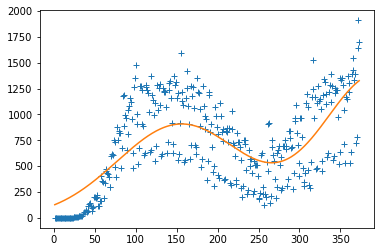

[906.2006906424391, 155.3969060943241, 78.00436429679506, 1381.105689490412, 394.78708891132123, 65.6164931349617]
Iteração: 1000


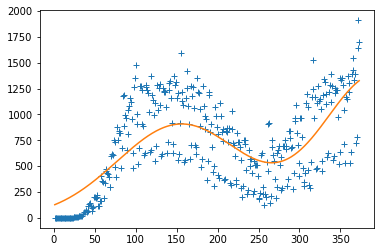

[906.2006906435236, 155.396906094079, 78.00436429651677, 1381.1056602310264, 394.7870889089996, 65.61649312651036]
[906.2006906435236, 155.396906094079, 78.00436429651677, 1381.1056602310264, 394.7870889089996, 65.61649312651036]
         w[0]        w[1]       w[2]        w[3]        w[4]       w[5]
0  906.200691  155.396906  78.004364  1381.10566  394.787089  65.616493
Iteração: 500


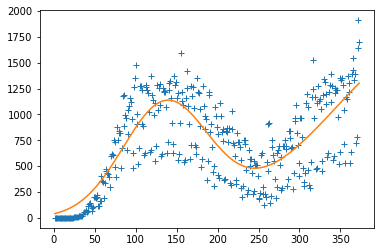

[1086.4397047856849, 136.63754982162126, 52.75745817162129, 1748.6654465107113, 468.5097587716131, 124.45366199584134]
Iteração: 1000


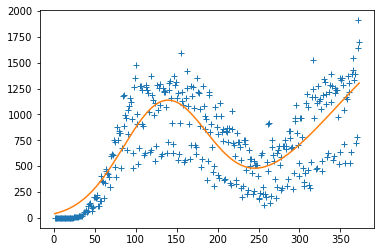

[1086.3707878253658, 136.63367259922438, 52.75598490090789, 1749.7300316312435, 468.6645208218756, 124.52679947971986]
[1086.3707878253658, 136.63367259922438, 52.75598490090789, 1749.7300316312435, 468.6645208218756, 124.52679947971986]
          w[0]        w[1]       w[2]         w[3]        w[4]        w[5]
0   906.200691  155.396906  78.004364  1381.105660  394.787089   65.616493
1  1086.370788  136.633673  52.755985  1749.730032  468.664521  124.526799
Iteração: 500


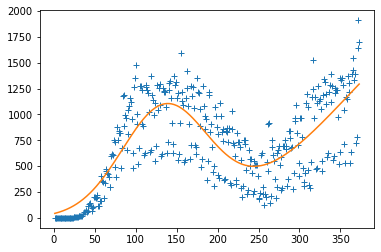

[1034.3230673431806, 135.56525031069086, 52.77053882526982, 1940.292821344951, 500, 140.99663692468556]
Iteração: 1000


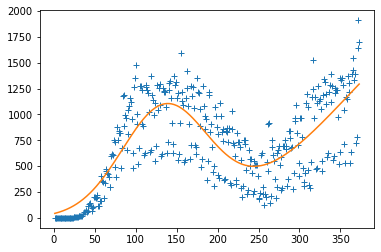

[1034.3230673431992, 135.56525045545618, 52.770538859574536, 1940.292821671802, 499.9999999999996, 140.99663691332407]
[1034.3230673431992, 135.56525045545618, 52.770538859574536, 1940.292821671802, 499.9999999999996, 140.99663691332407]
          w[0]        w[1]       w[2]         w[3]        w[4]        w[5]
0   906.200691  155.396906  78.004364  1381.105660  394.787089   65.616493
1  1086.370788  136.633673  52.755985  1749.730032  468.664521  124.526799
2  1034.323067  135.565250  52.770539  1940.292822  500.000000  140.996637
Iteração: 500


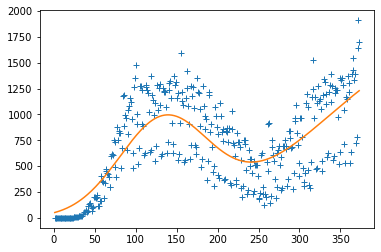

[905.8294379428469, 134.10749356549096, 54.663590384682614, 1575.5486560498452, 471.7263608852322, 140.0360603515666]
Iteração: 1000


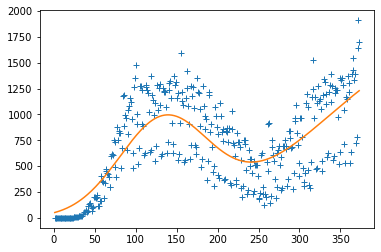

[905.829437943067, 134.10748978648888, 54.663590426823625, 1575.5486564587832, 471.726360974807, 140.03606035172348]
[905.829437943067, 134.10748978648888, 54.663590426823625, 1575.5486564587832, 471.726360974807, 140.03606035172348]
          w[0]        w[1]       w[2]         w[3]        w[4]        w[5]
0   906.200691  155.396906  78.004364  1381.105660  394.787089   65.616493
1  1086.370788  136.633673  52.755985  1749.730032  468.664521  124.526799
2  1034.323067  135.565250  52.770539  1940.292822  500.000000  140.996637
3   905.829438  134.107490  54.663590  1575.548656  471.726361  140.036060
Iteração: 500


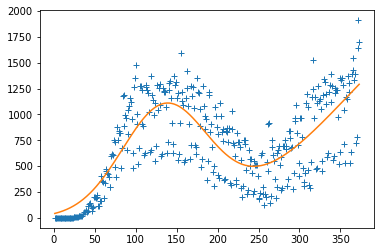

[1038.4327931014082, 135.4769805498223, 52.5565962983694, 1932.208621247177, 500, 141.41189631211893]
Iteração: 1000


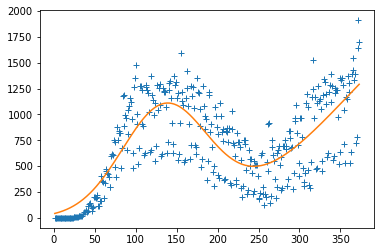

[1038.4327931014097, 135.4769808685287, 52.55659591989583, 1932.2086221552524, 500, 141.41189631210662]
[1038.4327931014097, 135.4769808685287, 52.55659591989583, 1932.2086221552524, 500, 141.41189631210662]
          w[0]        w[1]       w[2]         w[3]        w[4]        w[5]
0   906.200691  155.396906  78.004364  1381.105660  394.787089   65.616493
1  1086.370788  136.633673  52.755985  1749.730032  468.664521  124.526799
2  1034.323067  135.565250  52.770539  1940.292822  500.000000  140.996637
3   905.829438  134.107490  54.663590  1575.548656  471.726361  140.036060
4  1038.432793  135.476981  52.556596  1932.208622  500.000000  141.411896
Iteração: 500


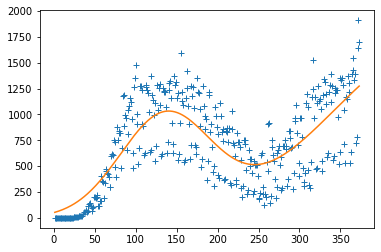

[971.4240178593312, 136.122056378666, 55.79196443109731, 1667.0716599949988, 466.82566238750536, 127.86515670450719]
Iteração: 1000


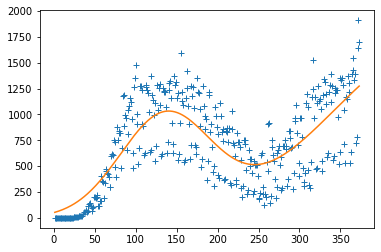

[971.424017875563, 136.1220544645498, 55.79196441943559, 1667.071840470662, 466.82566784746007, 127.8651567302278]
[971.424017875563, 136.1220544645498, 55.79196441943559, 1667.071840470662, 466.82566784746007, 127.8651567302278]
          w[0]        w[1]       w[2]         w[3]        w[4]        w[5]
0   906.200691  155.396906  78.004364  1381.105660  394.787089   65.616493
1  1086.370788  136.633673  52.755985  1749.730032  468.664521  124.526799
2  1034.323067  135.565250  52.770539  1940.292822  500.000000  140.996637
3   905.829438  134.107490  54.663590  1575.548656  471.726361  140.036060
4  1038.432793  135.476981  52.556596  1932.208622  500.000000  141.411896
5   971.424018  136.122054  55.791964  1667.071840  466.825668  127.865157
Iteração: 500


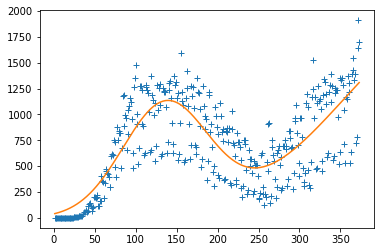

[1077.5660643807537, 136.33219406891018, 52.60091934660307, 1873.114797802272, 484.3626485818173, 131.3320414728897]
Iteração: 1000


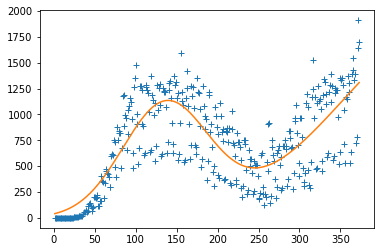

[1077.5664839965727, 136.33346470720747, 52.601763223815986, 1873.1868751077482, 484.3586671494926, 131.32693530182763]
[1077.5664839965727, 136.33346470720747, 52.601763223815986, 1873.1868751077482, 484.3586671494926, 131.32693530182763]
          w[0]        w[1]       w[2]         w[3]        w[4]        w[5]
0   906.200691  155.396906  78.004364  1381.105660  394.787089   65.616493
1  1086.370788  136.633673  52.755985  1749.730032  468.664521  124.526799
2  1034.323067  135.565250  52.770539  1940.292822  500.000000  140.996637
3   905.829438  134.107490  54.663590  1575.548656  471.726361  140.036060
4  1038.432793  135.476981  52.556596  1932.208622  500.000000  141.411896
5   971.424018  136.122054  55.791964  1667.071840  466.825668  127.865157
6  1077.566484  136.333465  52.601763  1873.186875  484.358667  131.326935
Iteração: 500


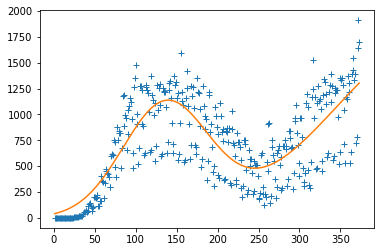

[1086.51582943538, 136.64220511077696, 52.762331088676454, 1746.8845286285768, 468.2915547267254, 124.36178430724756]
Iteração: 1000


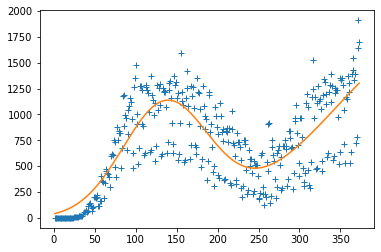

[1086.5064171277875, 136.64192677909105, 52.76159566267424, 1746.9789249231385, 468.3056567937618, 124.36893062469683]
[1086.5064171277875, 136.64192677909105, 52.76159566267424, 1746.9789249231385, 468.3056567937618, 124.36893062469683]
          w[0]        w[1]       w[2]         w[3]        w[4]        w[5]
0   906.200691  155.396906  78.004364  1381.105660  394.787089   65.616493
1  1086.370788  136.633673  52.755985  1749.730032  468.664521  124.526799
2  1034.323067  135.565250  52.770539  1940.292822  500.000000  140.996637
3   905.829438  134.107490  54.663590  1575.548656  471.726361  140.036060
4  1038.432793  135.476981  52.556596  1932.208622  500.000000  141.411896
5   971.424018  136.122054  55.791964  1667.071840  466.825668  127.865157
6  1077.566484  136.333465  52.601763  1873.186875  484.358667  131.326935
7  1086.506417  136.641927  52.761596  1746.978925  468.305657  124.368931
Iteração: 500


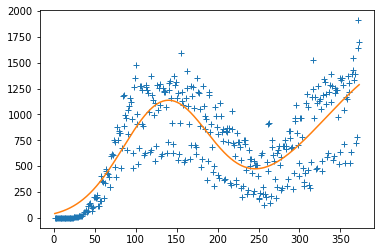

[1099.0054947488743, 137.51892927847973, 53.387588595054815, 1527.5695573281137, 437.32438204609366, 109.85865708007013]
Iteração: 1000


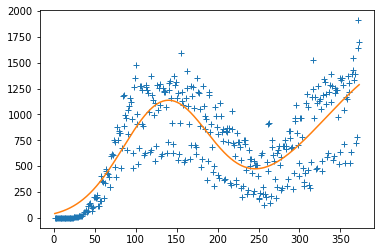

[1099.0055173210135, 137.51892926174781, 53.38758856645402, 1527.5695611367512, 437.3243765862146, 109.85865710645791]
[1099.0055173210135, 137.51892926174781, 53.38758856645402, 1527.5695611367512, 437.3243765862146, 109.85865710645791]
          w[0]        w[1]       w[2]         w[3]        w[4]        w[5]
0   906.200691  155.396906  78.004364  1381.105660  394.787089   65.616493
1  1086.370788  136.633673  52.755985  1749.730032  468.664521  124.526799
2  1034.323067  135.565250  52.770539  1940.292822  500.000000  140.996637
3   905.829438  134.107490  54.663590  1575.548656  471.726361  140.036060
4  1038.432793  135.476981  52.556596  1932.208622  500.000000  141.411896
5   971.424018  136.122054  55.791964  1667.071840  466.825668  127.865157
6  1077.566484  136.333465  52.601763  1873.186875  484.358667  131.326935
7  1086.506417  136.641927  52.761596  1746.978925  468.305657  124.368931
8  1099.005517  137.518929  53.387589  1527.569561  437.324377  109.858657
Iteração: 50

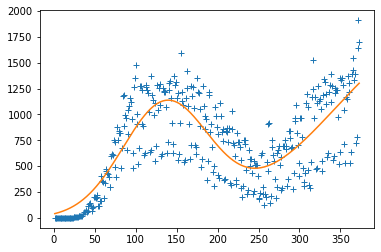

[1087.611411015588, 136.69604627220014, 52.80393039845036, 1724.22563728423, 465.3529559837006, 123.08205415534945]
Iteração: 1000


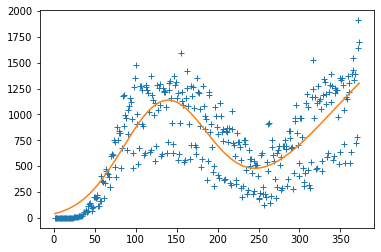

[1087.6018320246671, 136.69517791419065, 52.80285230107879, 1724.293193339442, 465.3790163300863, 123.10240115487365]
[1087.6018320246671, 136.69517791419065, 52.80285230107879, 1724.293193339442, 465.3790163300863, 123.10240115487365]
          w[0]        w[1]       w[2]         w[3]        w[4]        w[5]
0   906.200691  155.396906  78.004364  1381.105660  394.787089   65.616493
1  1086.370788  136.633673  52.755985  1749.730032  468.664521  124.526799
2  1034.323067  135.565250  52.770539  1940.292822  500.000000  140.996637
3   905.829438  134.107490  54.663590  1575.548656  471.726361  140.036060
4  1038.432793  135.476981  52.556596  1932.208622  500.000000  141.411896
5   971.424018  136.122054  55.791964  1667.071840  466.825668  127.865157
6  1077.566484  136.333465  52.601763  1873.186875  484.358667  131.326935
7  1086.506417  136.641927  52.761596  1746.978925  468.305657  124.368931
8  1099.005517  137.518929  53.387589  1527.569561  437.324377  109.858657
9  1087.601832

<Figure size 432x288 with 0 Axes>

In [ ]:
#Old model:

x_dados = np.array(deaths_data['dia_epidemiologico'])
y_dados = np.array(deaths_data['casos'])

cost_func = rsme
objective_function_name = 'double_gaussian'

#leg: w[0]->height of the peak, w[1]->center position, w[2]->standard deviations
bounds = [(900,1e6), (1e-6,160), (50,150), (325,1e6), (225,500), (50,150)]

popsize = 60              #Tamanho da população (Artigo 10*n_parâmetros_do_modelo)
mutate = 0.2              #Fator de mutação [0,2]
recombination = 0.5       #Parâmetro de recombinação [0,1]
maxiter = 1000            #Número de gerações
plot_interval = 500       #plotar a cada...

res_deaths_data = pd.DataFrame(columns=('w[0]','w[1]','w[2]','w[3]','w[4]','w[5]'))

for i in range(10):
    list_tmp = Differential_Evolution(cost_func, bounds, popsize, mutate, recombination, maxiter, x_dados, y_dados, plot_interval)
    print(list_tmp)

    res_deaths_data = res_deaths_data.append({'w[0]': list_tmp[0], 'w[1]': list_tmp[1],'w[2]': list_tmp[2], 'w[3]': list_tmp[3], 'w[4]': list_tmp[4], 'w[5]': list_tmp[5]}, ignore_index=True)
    print(res_deaths_data)
    

In [ ]:
#Calculate the error generated by the parameters:

cost_function = 'double_gaussian'
x_dados = np.array(deaths_data['dia_epidemiologico'])
y_dados = np.array(deaths_data['casos'])

index_list_tmp = []
error_list_tmp = []
for i in range(len(res_deaths_data)):
    
    tmp_list = []
    for j in range(len(res_deaths_data.iloc[i])):
        tmp_list.append(res_deaths_data.iloc[i][j])
    
    print(i, tmp_list)
    index_list_tmp.append(i)
    error_list_tmp.append(rsme(x_dados, y_dados, tmp_list))

for i in range(len(res_deaths_data)):
    print(index_list_tmp[i], error_list_tmp[i])


0 [906.2006906435236, 155.396906094079, 78.00436429651677, 1381.1056602310264, 394.7870889089996, 65.61649312651036]
1 [1086.3707878253658, 136.63367259922438, 52.75598490090789, 1749.7300316312435, 468.6645208218756, 124.52679947971986]
2 [1034.3230673431992, 135.56525045545618, 52.770538859574536, 1940.292821671802, 499.9999999999996, 140.99663691332407]
3 [905.829437943067, 134.10748978648888, 54.663590426823625, 1575.5486564587832, 471.726360974807, 140.03606035172348]
4 [1038.4327931014097, 135.4769808685287, 52.55659591989583, 1932.2086221552524, 500.0, 141.41189631210662]
5 [971.424017875563, 136.1220544645498, 55.79196441943559, 1667.071840470662, 466.82566784746007, 127.8651567302278]
6 [1077.5664839965727, 136.33346470720747, 52.601763223815986, 1873.1868751077482, 484.3586671494926, 131.32693530182763]
7 [1086.5064171277875, 136.64192677909105, 52.76159566267424, 1746.9789249231385, 468.3056567937618, 124.36893062469683]
8 [1099.0055173210135, 137.51892926174781, 53.38758856

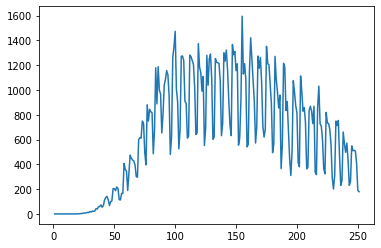

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp


Iteração: 100


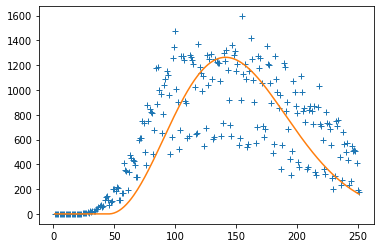

[0.008309610553632696, 5.191070232219813, 0.11434568900201941, 16699.245367656287]
Iteração: 200


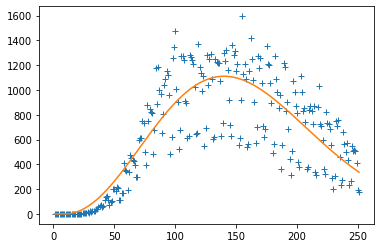

[0.004335855810695072, 1.1106439393869039, 0.11638427756039549, 20320.084285792404]
Iteração: 300


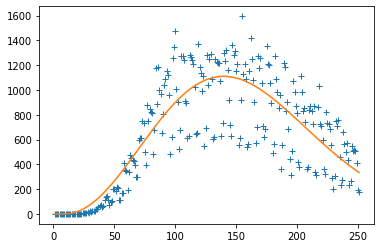

[0.0038314887745367916, 1.1642193580348459, 0.12390144542945856, 21603.573537684886]
Iteração: 400


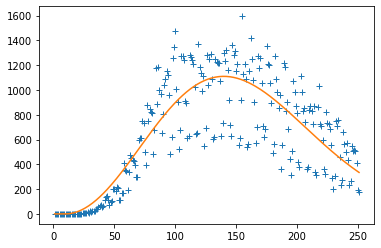

[0.00484893318877541, 1.0529119971714083, 0.11017895237962909, 19199.51198994414]
Iteração: 500


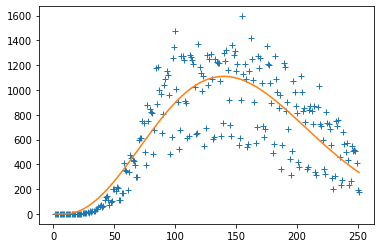

[0.00484893318877541, 1.0455868469359983, 0.11017895237962909, 19199.51198994414]
Iteração: 600


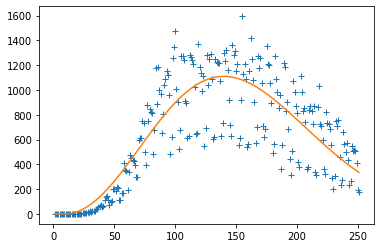

[0.004706254371929631, 1.0586877030275377, 0.11180251233710267, 19480.831574415213]
Iteração: 700


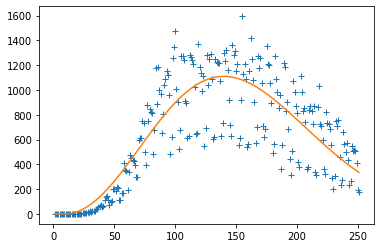

[0.004706254371929631, 1.0586877030275377, 0.11180251233710267, 19480.831574415213]
Iteração: 800


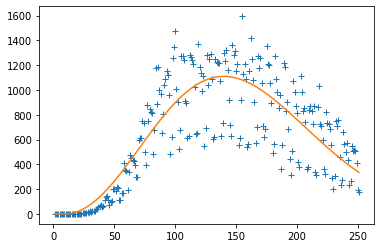

[0.004706254371929631, 1.0586877030275377, 0.11180251233710267, 19480.831574415213]
Iteração: 900


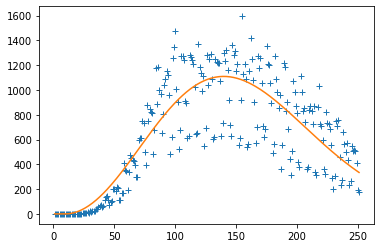

[0.004739869640298248, 1.0553162721547609, 0.11140685861180841, 19410.640053295352]
Iteração: 1000


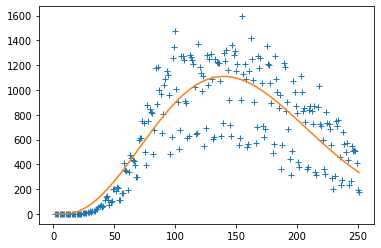

[0.004812917578358774, 1.0470993133936064, 0.11055748772779143, 19263.305525888987]
[0.004812917578358774, 1.0470993133936064, 0.11055748772779143, 19263.305525888987]


<Figure size 432x288 with 0 Axes>

In [ ]:
#Fit the first wave with the new model:

deaths_data_tmp = deaths_data.copy()

for i in range(len(deaths_data_tmp)): 
    if i > 250: deaths_data_tmp.drop([i], inplace=True)

x_dados = np.array(deaths_data_tmp['dia_epidemiologico'])
y_dados = np.array(deaths_data_tmp['casos'])

plt.plot(x_dados, y_dados)
plt.show()

cost_func = rsme
objective_function_name = 'single_maxwell_boltzmann'

bounds = [(0.,1e-1), (0.,50), (1e-2,1), (1e2,1e7)]

popsize = 40              #Tamanho da população (Artigo 10*n_parâmetros_do_modelo)
mutate = 0.5              #Fator de mutação [0,2]
recombination = 0.4       #Parâmetro de recombinação [0,1]
maxiter = 1000            #Número de gerações
plot_interval = 100       #plotar a cada...

for i in range(1):
    list_tmp = Differential_Evolution(cost_func, bounds, popsize, mutate, recombination, maxiter, x_dados, y_dados, plot_interval)
    print(list_tmp)


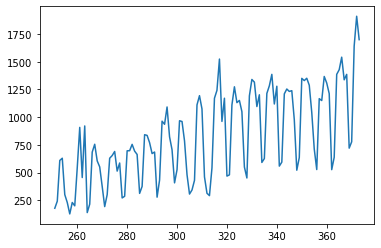

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp


Iteração: 100


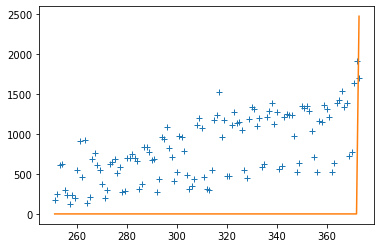

[0.030811477647756467, 211.7615134490864, 0.5682277996422486, 5769020.1735088555]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp


Iteração: 200


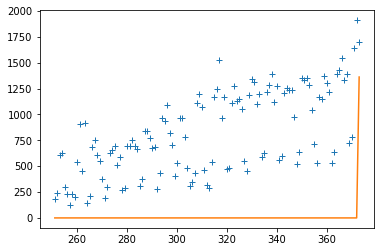

[0.03629125225685922, 211.7615134490864, 0.5682277996422486, 2486447.2449006923]
Iteração: 300


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp


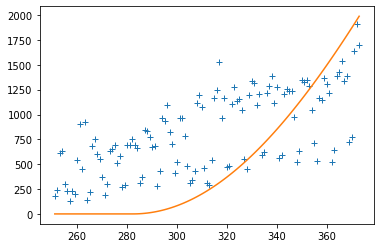

[7.898972299368034e-05, 107.07371089272152, 0.3792431527751825, 1165527.4585471994]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp


Iteração: 400


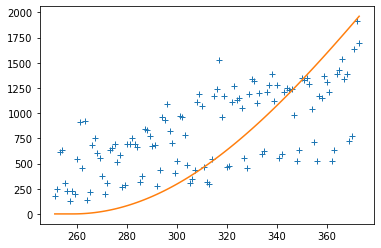

[7.898972299368034e-05, 100, 0.38719897098155753, 733141.5345919086]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp


Iteração: 500


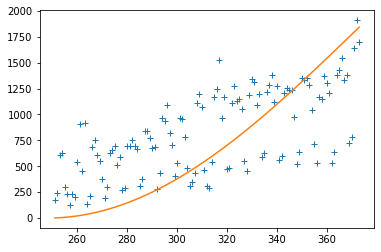

[7.898972299368034e-05, 102.16805971331986, 0.4118378756104858, 541631.1313615143]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp


Iteração: 600


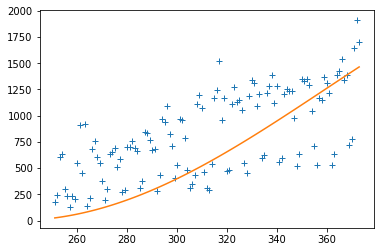

[7.898972299368034e-05, 100, 0.42485675939943257, 354229.7063594735]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp


Iteração: 700


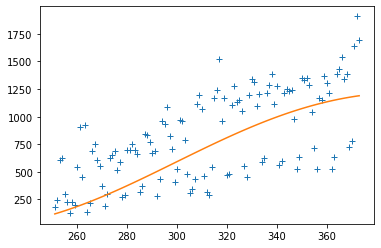

[0.0001539039779169457, 100, 0.4603287381111808, 118472.7402541383]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp


Iteração: 800


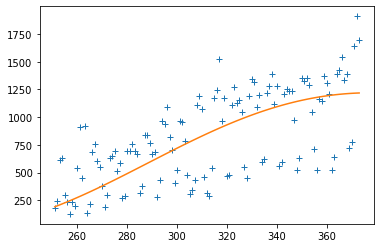

[0.0001539039779169457, 100, 0.4781497656006372, 118472.7402541383]
Iteração: 900


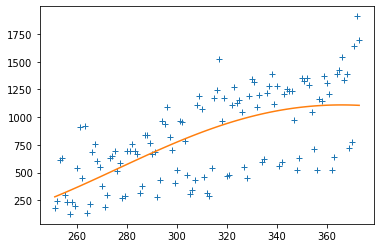

[0.0001342491476862853, 100.00530719329572, 0.5091309120349585, 115451.79344436378]
Iteração: 1000


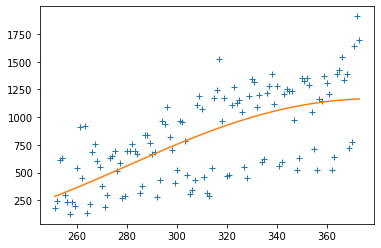

[0.00010391602029677155, 100.0, 0.521716632481268, 137905.1974315428]
Iteração: 1100


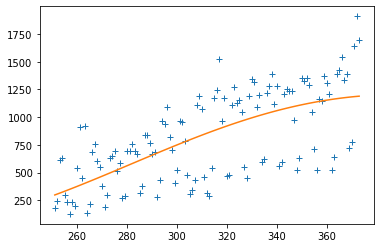

[8.502341421892507e-05, 100.0, 0.5356646315143228, 157417.42513457345]
Iteração: 1200


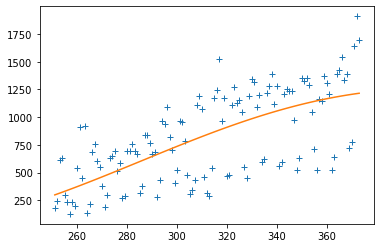

[7.115002866076209e-05, 100.00011282725615, 0.5450529110532535, 179723.94712618773]
Iteração: 1300


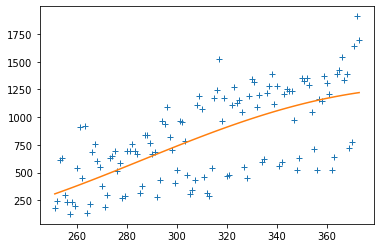

[6.569038556609795e-05, 100.0, 0.5526071618591204, 189193.24184075443]
Iteração: 1400


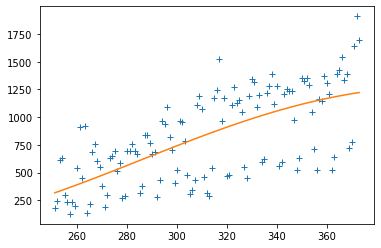

[6.050569725932535e-05, 100.0, 0.5613152596515368, 198383.15138093295]
Iteração: 1500


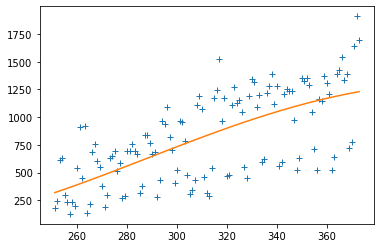

[5.311598586459691e-05, 100.0, 0.5701222234384491, 217686.65510673536]
Iteração: 1600


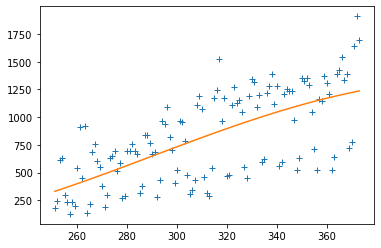

[4.4768957735588145e-05, 100.0, 0.5861640392483252, 243990.03981861088]
Iteração: 1700


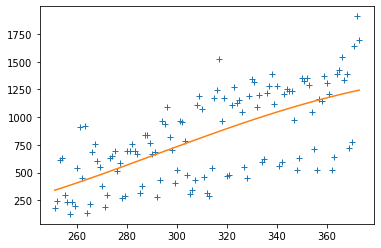

[3.889162719839804e-05, 100.0, 0.6000654179921557, 268986.7681206575]
Iteração: 1800


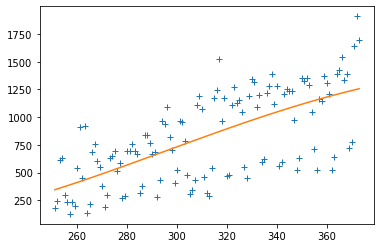

[3.3639550305599545e-05, 100.0, 0.6117097665880127, 301864.519055307]
Iteração: 1900


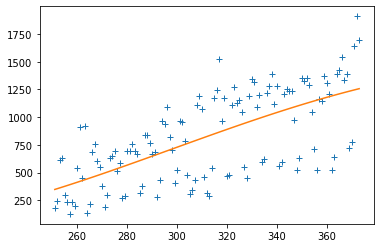

[3.033602068634895e-05, 100.0, 0.6210905411940401, 325329.8262776681]
Iteração: 2000


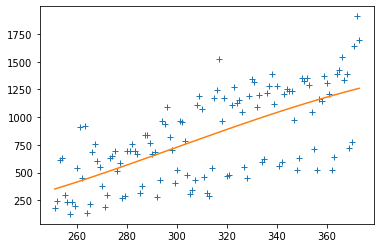

[2.8223039064415918e-05, 100.0, 0.6284790944821186, 343215.22975524905]
[2.8223039064415918e-05, 100.0, 0.6284790944821186, 343215.22975524905]


<Figure size 432x288 with 0 Axes>

In [ ]:
#Fit the second wave with the new model:

deaths_data_tmp = deaths_data.copy()

for i in range(len(deaths_data_tmp)): 
    if i < 250: deaths_data_tmp.drop([i], inplace=True)

x_dados = np.array(deaths_data_tmp['dia_epidemiologico'])
y_dados = np.array(deaths_data_tmp['casos'])

plt.plot(x_dados, y_dados)
plt.show()

cost_func = rsme
objective_function_name = 'single_maxwell_boltzmann'

bounds = [(0.,1e-1), (100,500), (1e-2,1), (1e1,1e7)]

popsize = 40              #Tamanho da população (Artigo 10*n_parâmetros_do_modelo)
mutate = 0.5              #Fator de mutação [0,2]
recombination = 0.4       #Parâmetro de recombinação [0,1]
maxiter = 2000            #Número de gerações
plot_interval = 100       #plotar a cada...

for i in range(1):
    list_tmp = Differential_Evolution(cost_func, bounds, popsize, mutate, recombination, maxiter, x_dados, y_dados, plot_interval)
    print(list_tmp)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 10


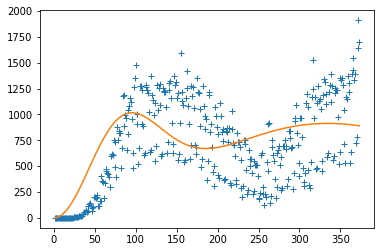

[0.0053, 0.0, 0.1581442096395584, 14000.0, 0.00030879004432414595, 0.00073, 0.17, 62614.53402274867]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 20


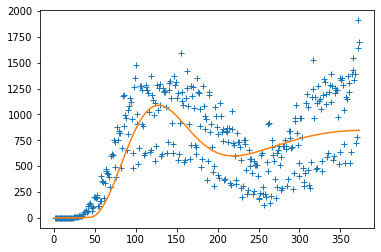

[0.0053, 0.997651635674357, 0.03923138085118161, 14000.0, 0.00037017902849587064, 30.0, 0.67, 57382.13862841764]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 30


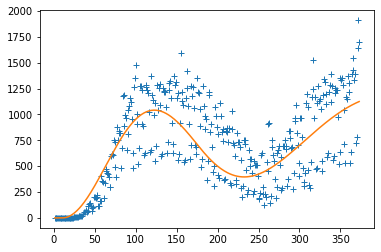

[0.008026783259220332, 1.0053, 0.09917060811249605, 14000.0, 0.0006234851686650265, 30.0, 0.17, 57458.22671334435]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 40


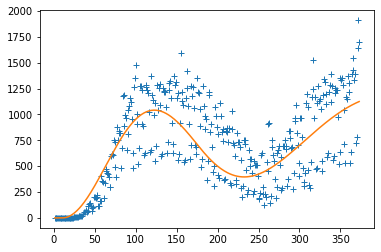

[0.008026783259220332, 1.0053, 0.09917060811249605, 14000.0, 0.0006234851686650265, 30.0, 0.17, 57458.22671334435]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 50


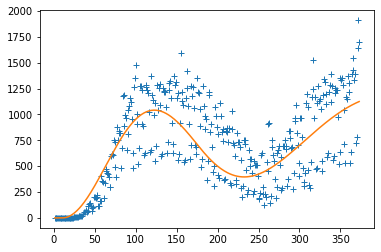

[0.008026783259220332, 1.0053, 0.09917060811249605, 14000.0, 0.0006234851686650265, 30.0, 0.17, 57458.22671334435]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 60


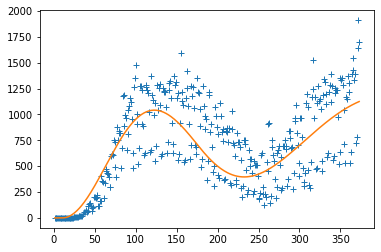

[0.008026783259220332, 1.0053, 0.09917060811249605, 14000.0, 0.0006234851686650265, 30.0, 0.17, 57458.22671334435]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 70


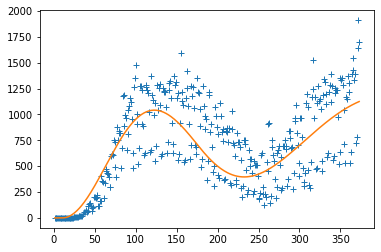

[0.008026783259220332, 1.0053, 0.09917060811249605, 14000.0, 0.0006234851686650265, 30.0, 0.17, 57458.22671334435]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 80


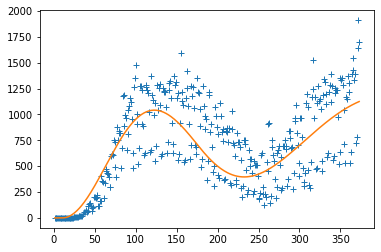

[0.008026783259220332, 1.0053, 0.09917060811249605, 14000.0, 0.0006234851686650265, 30.0, 0.17, 57458.22671334435]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 90


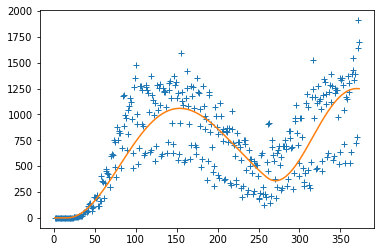

[0.008296037662557956, 1.2529276562916805, 0.0795767232041422, 14000.0, 0.00030839318896730314, 130.0, 0.502322639540072, 84000.0]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp


Iteração: 100


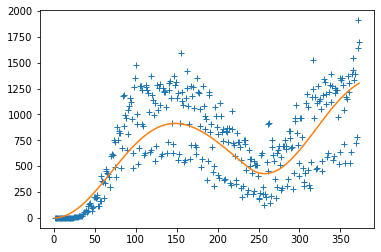

[0.0053, 0.0, 0.09268729707837473, 15102.433203202545, 0.000578806792643969, 60.84504806834667, 0.2574796522972844, 66973.88429408541]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 110


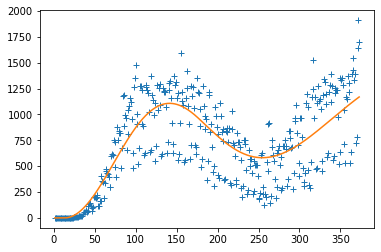

[0.0053, 1.3783594302423272, 0.10698867981482885, 18317.94398443804, 0.0004271168482816795, 30.0, 0.17, 84000.0]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 120


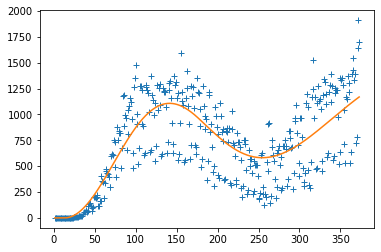

[0.0053, 1.3783594302423272, 0.10698867981482885, 18317.94398443804, 0.0004271168482816795, 30.0, 0.17, 84000.0]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 130


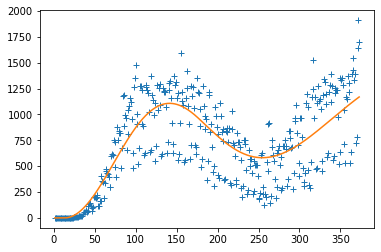

[0.0053, 1.3783594302423272, 0.10698867981482885, 18317.94398443804, 0.0004271168482816795, 30.0, 0.17, 84000.0]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 140


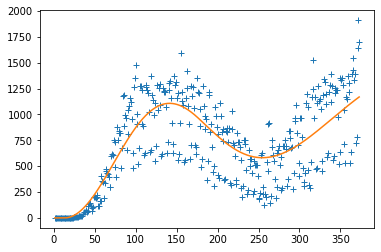

[0.0053, 1.3783594302423272, 0.10698867981482885, 18317.94398443804, 0.0004271168482816795, 30.0, 0.17, 84000.0]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 150


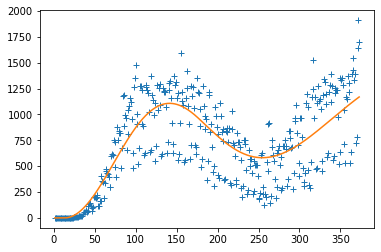

[0.0053, 1.3783594302423272, 0.10698867981482885, 18317.94398443804, 0.0004271168482816795, 30.0, 0.17, 84000.0]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 160


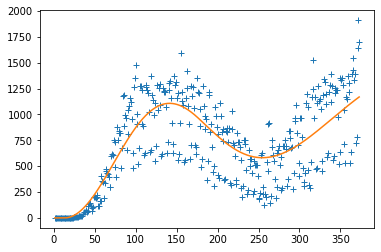

[0.0053, 1.3783594302423272, 0.10698867981482885, 18317.94398443804, 0.0004271168482816795, 30.0, 0.17, 84000.0]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 170


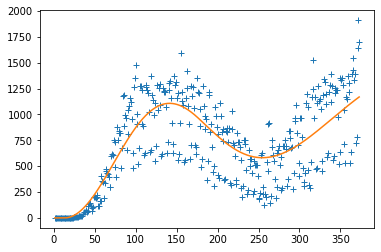

[0.0053, 1.3783594302423272, 0.10698867981482885, 18317.94398443804, 0.0004271168482816795, 30.0, 0.17, 84000.0]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 180


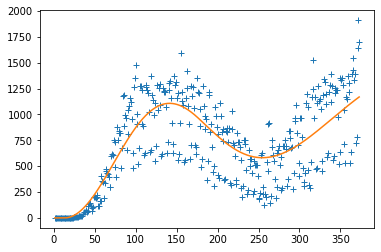

[0.0053, 1.3783594302423272, 0.10698867981482885, 18317.94398443804, 0.0004271168482816795, 30.0, 0.17, 84000.0]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 190


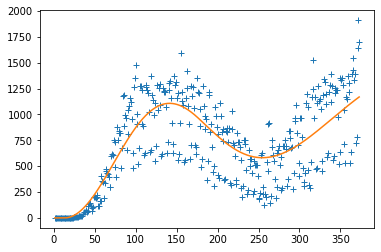

[0.0053, 1.3783594302423272, 0.10698867981482885, 18317.94398443804, 0.0004271168482816795, 30.0, 0.17, 84000.0]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 200


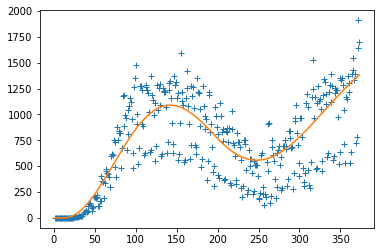

[0.0053, 1.2804544635169417, 0.10576306716911105, 18033.63980941812, 0.0005883542554490542, 33.18782471383502, 0.17, 79612.78798139596]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 210


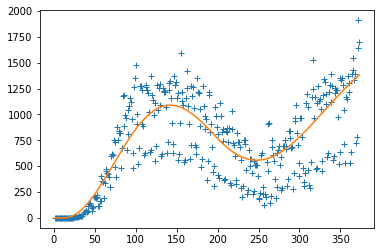

[0.0053, 1.2804544635169417, 0.10576306716911105, 18033.63980941812, 0.0005883542554490542, 33.18782471383502, 0.17, 79612.78798139596]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 220


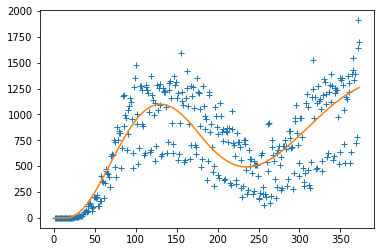

[0.005620473381216684, 1.7599009722936994, 0.1160413296451808, 17659.29601619332, 0.0006225262747437052, 30.0, 0.17, 64406.74456762836]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 230


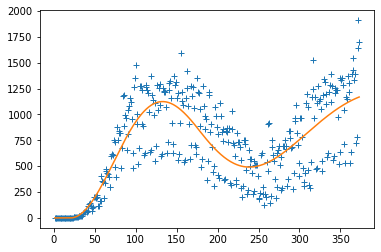

[0.008026783259220332, 2.0, 0.09917060811249605, 15115.470302951551, 0.0006540346269421493, 30.0, 0.17, 57458.22671334435]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 240


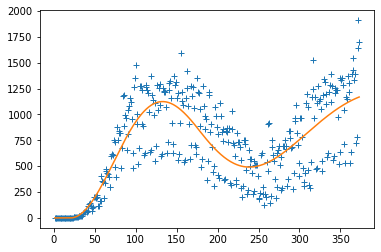

[0.008026783259220332, 2.0, 0.09917060811249605, 15115.470302951551, 0.0006540346269421493, 30.0, 0.17, 57458.22671334435]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 250


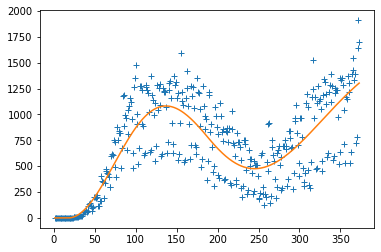

[0.0053, 2.0, 0.11503868416720618, 17897.566796797455, 0.00051804761828029, 32.0369333771465, 0.17, 82575.61256463031]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 260


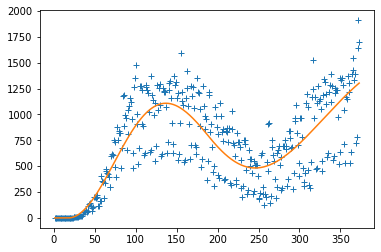

[0.0053, 2.0, 0.11503868416720618, 18333.670864034473, 0.00051804761828029, 32.0369333771465, 0.17, 82575.61256463031]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp


Iteração: 270


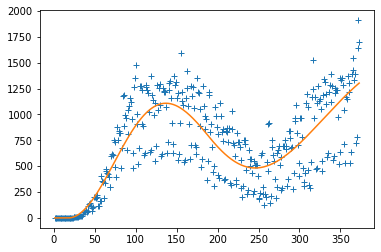

[0.0053, 2.0, 0.11503868416720618, 18333.670864034473, 0.00051804761828029, 32.0369333771465, 0.17, 82575.61256463031]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 280


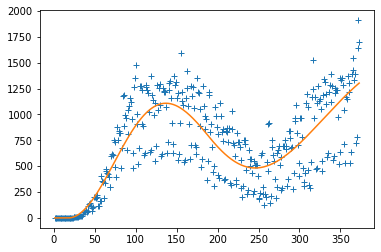

[0.0053, 2.0, 0.11503868416720618, 18333.670864034473, 0.00051804761828029, 32.0369333771465, 0.17, 82575.61256463031]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 290


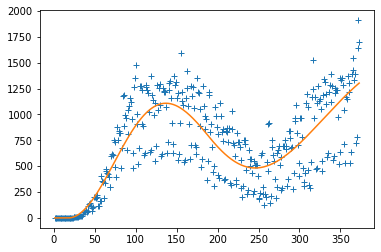

[0.0053, 2.0, 0.11503868416720618, 18333.670864034473, 0.00051804761828029, 32.0369333771465, 0.17, 82575.61256463031]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 300


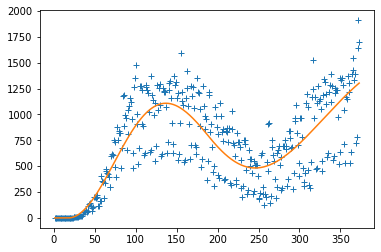

[0.0053, 2.0, 0.11503868416720618, 18333.670864034473, 0.00051804761828029, 32.0369333771465, 0.17, 82575.61256463031]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 310


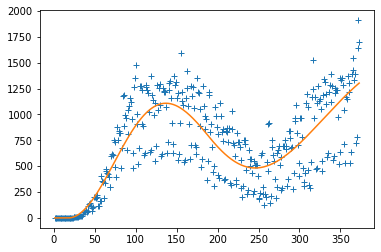

[0.0053, 2.0, 0.11503868416720618, 18333.670864034473, 0.00051804761828029, 32.0369333771465, 0.17, 82575.61256463031]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 320


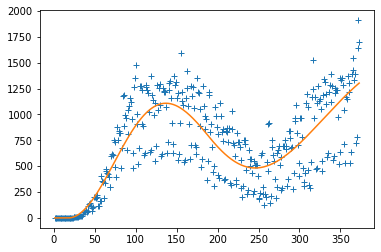

[0.0053, 2.0, 0.11503868416720618, 18333.670864034473, 0.00051804761828029, 32.0369333771465, 0.17, 82575.61256463031]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 330


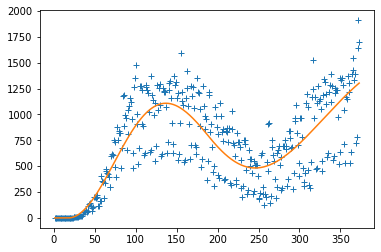

[0.0053, 2.0, 0.11503868416720618, 18333.670864034473, 0.00051804761828029, 32.0369333771465, 0.17, 82575.61256463031]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 340


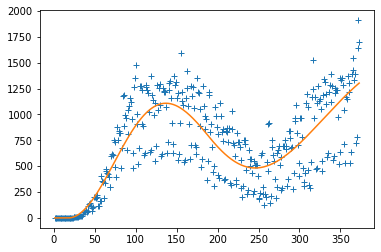

[0.0053, 2.0, 0.11503868416720618, 18333.670864034473, 0.00051804761828029, 32.0369333771465, 0.17, 82575.61256463031]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 350


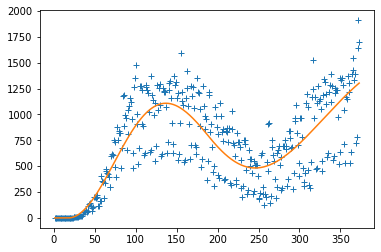

[0.0053, 2.0, 0.11503868416720618, 18333.670864034473, 0.00051804761828029, 32.0369333771465, 0.17, 82575.61256463031]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 360


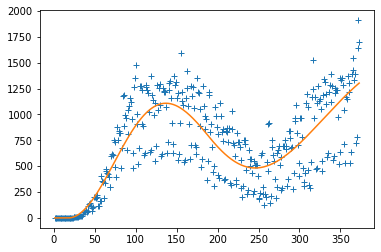

[0.0053, 2.0, 0.11503868416720618, 18333.670864034473, 0.00051804761828029, 32.0369333771465, 0.17, 82575.61256463031]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 370


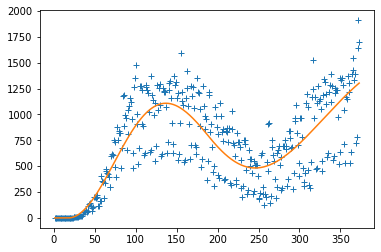

[0.0053, 2.0, 0.11503868416720618, 18333.670864034473, 0.00051804761828029, 32.0369333771465, 0.17, 82575.61256463031]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 380


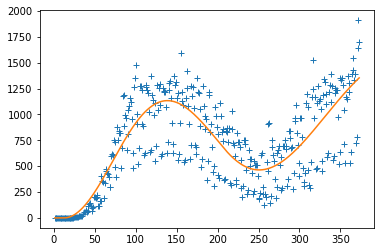

[0.0053, 1.3225658272570677, 0.10868785669368544, 18750.15493182509, 0.0005323113256375173, 38.6382423528953, 0.1869682600945935, 84000.0]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 390


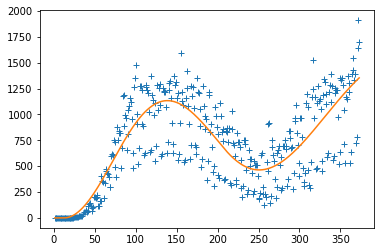

[0.0053, 1.3225658272570677, 0.10868785669368544, 18750.15493182509, 0.0005323113256375173, 38.6382423528953, 0.1869682600945935, 84000.0]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 400


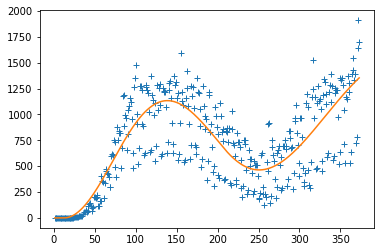

[0.0053, 1.3225658272570677, 0.10868785669368544, 18750.15493182509, 0.0005323113256375173, 38.6382423528953, 0.1869682600945935, 84000.0]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 410


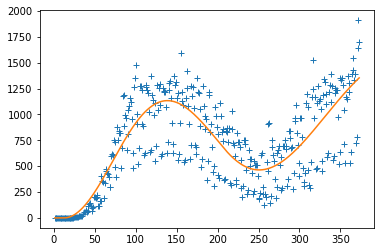

[0.0053, 1.3225658272570677, 0.10868785669368544, 18750.15493182509, 0.0005323113256375173, 38.6382423528953, 0.1869682600945935, 84000.0]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 420


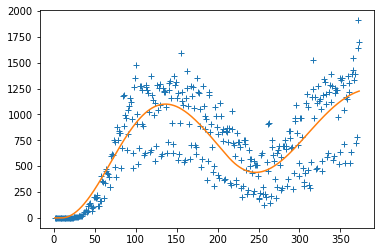

[0.0053, 0.9753119283901094, 0.10790633331131182, 18195.75876026933, 0.00031859777533815593, 66.50225685631231, 0.313255304327693, 84000.0]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 430


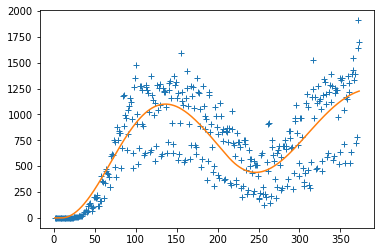

[0.0053, 0.9753119283901094, 0.10790633331131182, 18195.75876026933, 0.00031859777533815593, 66.50225685631231, 0.313255304327693, 84000.0]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 440


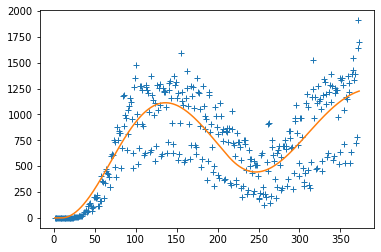

[0.0053, 0.9753119283901094, 0.10790633331131182, 18411.68945227418, 0.00031859777533815593, 66.50225685631231, 0.313255304327693, 84000.0]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 450


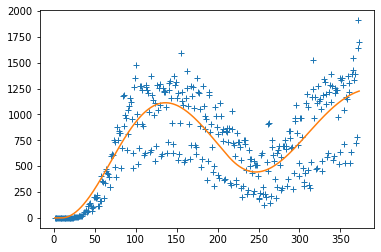

[0.0053, 0.9753119283901094, 0.10790633331131182, 18411.68945227418, 0.00031859777533815593, 66.50225685631231, 0.313255304327693, 84000.0]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 460


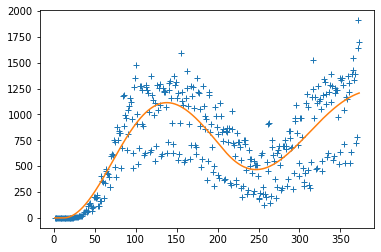

[0.0053, 1.2474932472517994, 0.1086371446294625, 18428.002768579034, 0.0005852891729905905, 46.24774648143824, 0.22220572059893762, 61367.647972351995]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 470


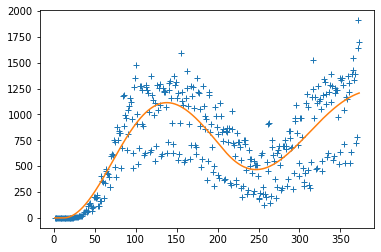

[0.0053, 1.2474932472517994, 0.1086371446294625, 18428.002768579034, 0.0005852891729905905, 46.24774648143824, 0.22220572059893762, 61367.647972351995]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 480


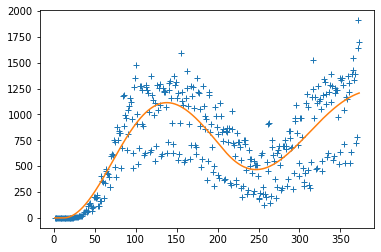

[0.0053, 1.2474932472517994, 0.1086371446294625, 18428.002768579034, 0.0005852891729905905, 46.24774648143824, 0.22220572059893762, 61367.647972351995]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp


Iteração: 490


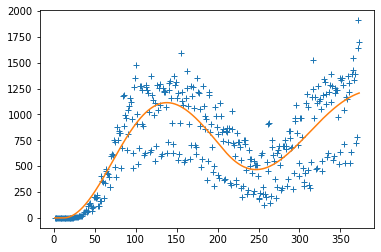

[0.0053, 1.2474932472517994, 0.1086371446294625, 18428.002768579034, 0.0005852891729905905, 46.24774648143824, 0.22220572059893762, 61367.647972351995]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: RuntimeWarning: overflow encountered in exp
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:70: RuntimeWarning: overflow encountered in exp


Iteração: 500


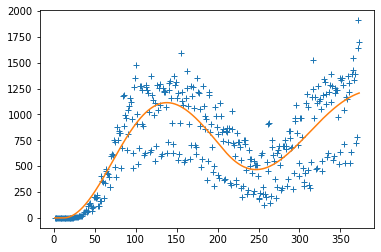

[0.0053, 1.2474932472517994, 0.1086371446294625, 18428.002768579034, 0.0005852891729905905, 46.24774648143824, 0.22220572059893762, 61367.647972351995]
[0.0053, 1.2474932472517994, 0.1086371446294625, 18428.002768579034, 0.0005852891729905905, 46.24774648143824, 0.22220572059893762, 61367.647972351995]
     w[0]      w[1]      w[2]  ...       w[5]      w[6]          w[7]
0  0.0053  1.247493  0.108637  ...  46.247746  0.222206  61367.647972

[1 rows x 8 columns]


<Figure size 432x288 with 0 Axes>

In [ ]:
#Adjusting the two waves at the same time with the new model:

x_dados = np.array(deaths_data['dia_epidemiologico'])
y_dados = np.array(deaths_data['casos'])

cost_func = rsme
objective_function_name = 'dist_maxwell_boltzmann'

#Parameters based on the predecessor runs:
#wave_1: [0.004812917578358774, 1.0470993133936064, 0.11055748772779143, 19263.305525888987]
#wave_2: [0.004357346586809356, 6.047335846409213, 0.04132256522135283, 32983.950315302194]
#wave_2_test_2: [2.8223039064415918e-05, 100.0, 0.6284790944821186, 343215.22975524905]
bounds = [(0.038,0.0053),
          (0.0,2.0),
          (0.06,0.16),
          (14000.,24000.),
          (2.3e-05,7.3e-04),
          (30.0,130.0),
          (0.17,0.67),
          (29000.,84000.)]

'''
[0.0049382439063024855, 1.5, 0.1174456948567322, 19088.81807834829, 
0.0048, 6.446188053886484, 0.03866553480602554, 37000.0]

[0.00480643152367259, 1.7852416980243966, 0.11939616148652328, 19576.968913930068, 
0.005174878109967218, 8.432804058274378, 0.045673839108987785, 30760.637744312684]

[0.0043, 0.5, 0.10925201105325862, 19885.567815003174, 
0.00033, 107.98468802455112, 0.47, 49000.0]

[0.0058, 0.4677126848651011, 0.0958287379324712, 17197.961707414484, 
0.00033, 99.5, 0.4405557519932247, 54000.0]

[0.0053, 0.6747078855986797, 0.10227437480987982, 18115.781435696208, 
0.00033, 99.0, 0.43655025413768134, 59000.0]

[0.005314680924543007, 1.1439252083000677, 0.10600284115586806, 18077.817579579438, 
0.00033, 94.0, 0.42, 64000.0]

[0.005681632012584273, 0.7645017111340899, 0.10156518369447248, 17499.971465221344, 
0.00033, 93.26838922491434, 0.41361562366677346,68483.94656528241]

[0.0053, 0.9537140676539041, 0.10263656731900374, 18458.498003508455, 
0.00038, 89.0, 0.37942795825994, 69000.0]

[0.0053, 0.9786422068196172,0.10354651172474533, 17995.231038448976,
0.000376306192176419, 85.10100273174588,0.37, 74000.0]

[0.0053, 1.0, 0.10555056807898411, 18045.895825828942, 
0.0003471933306940367, 70.0, 0.32, 79000.0]

[0.0053, 1.2179056175276166,0.10734011157141099, 18158.080246385667,
0.0003336280710749469, 65.0, 0.3090311900136504, 79770.28999532611]

[0.0053, 0.8621898496247034, 0.10426712482044792, 18268.910506715165, 
0.00044265108743154916, 60.14371852208159, 0.27, 75076.73867667347]

[0.0053, 1.1525335856183454, 0.10669754669427578, 18502.21371632507, 
0.0005784532779426557, 60.0, 0.2659580162104088, 63157.653354986964]

[0.0053, 1.4576638369263561, 0.11063840028372601, 18849.785054164582, 
0.0006591641261845701, 50.0, 0.23156495475209182, 56555.58151815071]

[0.0053, 1.271735080249455, 0.11281020570189287, 18420.638536959254, 
0.0004787071304760648, 42.49995999660352, 0.22, 67274.57993123477]
'''

popsize = 80              #Tamanho da população (Artigo 10*n_parâmetros_do_modelo)
mutate = 0.5              #Fator de mutação [0,2]
recombination = 0.4       #Parâmetro de recombinação [0,1]
maxiter = 500#300            #Número de gerações
plot_interval = 10       #plotar a cada...

res_deaths_data = pd.DataFrame(columns=('w[0]','w[1]','w[2]','w[3]','w[4]','w[5]','w[6]','w[7]'))

for i in range(1):
    list_tmp = Differential_Evolution(cost_func, bounds, popsize, mutate, recombination, maxiter, x_dados, y_dados, plot_interval)
    print(list_tmp)

    res_deaths_data = res_deaths_data.append({'w[0]': list_tmp[0], 'w[1]': list_tmp[1],'w[2]': list_tmp[2], 'w[3]': list_tmp[3], 'w[4]': list_tmp[4], 'w[5]': list_tmp[5], 'w[6]': list_tmp[6], 'w[7]': list_tmp[7]}, ignore_index=True)
    print(res_deaths_data)


In [ ]:
#Calculate the error generated by the parameters:

cost_function = 'single_maxwell_boltzmann'
x_dados = np.array(deaths_data['dia_epidemiologico'])
y_dados = np.array(deaths_data['casos'])

tmp_list = [0.0053, 1.2474932472517994, 0.1086371446294625, 18428.002768579034,
            0.0005852891729905905, 46.24774648143824, 0.22220572059893762, 61367.647972351995]

print(list_tmp, '\n', rsme(x_dados, y_dados, tmp_list))

print('How much the new model is better than the old parameters: ', 100-rsme(x_dados, y_dados, tmp_list)*100/260.1588865136927, '%')


[0.0053, 1.2474932472517994, 0.1086371446294625, 18428.002768579034, 0.0005852891729905905, 46.24774648143824, 0.22220572059893762, 61367.647972351995] 
 254.99143795339847
How much the new model is better than the old parameters:  1.986266404173847 %


'\n1 [1086.3707878253658, 136.63367259922438, 52.75598490090789, 1749.7300316312435, 468.6645208218756, 124.52679947971986]\n1 260.1588865136927\n'

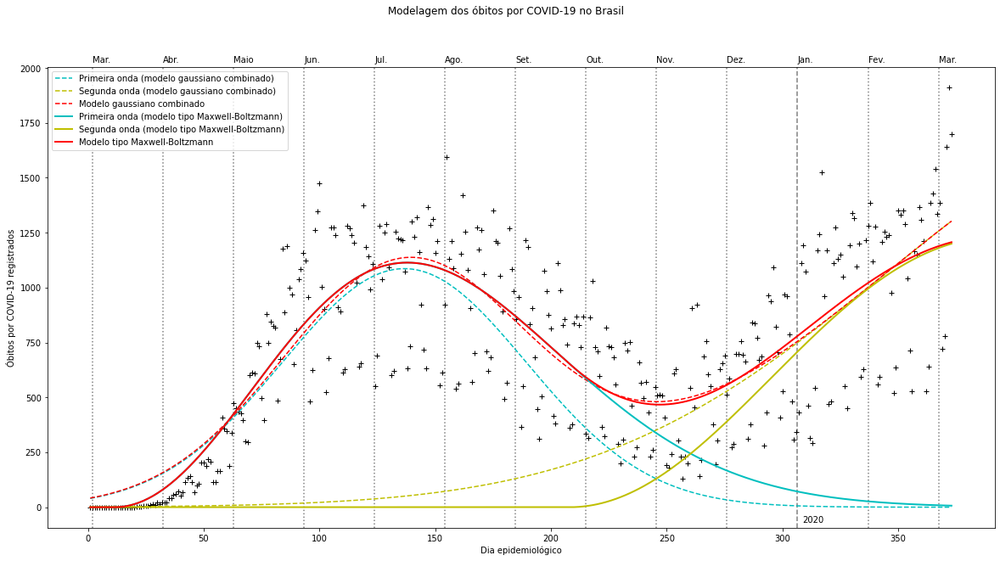

In [ ]:
#Plot the fitting and forecast of the models:

plt.figure(figsize=(20,10))
#plt.grid(True)
plt.ylabel('Óbitos por COVID-19 registrados')
plt.xlabel('Dia epidemiológico')
plt.suptitle('Modelagem dos óbitos por COVID-19 no Brasil')

future_dias=[]
dia_inicial=1.
for i in range(len(deaths_data['dia_epidemiologico'])):
    future_dias.append(dia_inicial)
    dia_inicial+=1

initial_day = -59
month_tmp = 0
year_tmp = '202'
cont = 0
months = ['Jan.', 'Fev.', 'Mar.', 'Abr.', 'Maio', 'Jun.', 'Jul.', 'Ago.',
          'Set.', 'Out.', 'Nov.', 'Dez.', 'Jan.', 'Fev.', 'Mar.', 'Abr.', 
          'Maio', 'Jun.', 'Jul.', 'Ago.', 'Set.', 'Out.', 'Nov.', 'Dez.',
          'Jan.', 'Fev.', 'Mar.', 'Abr.', 'Maio', 'Jun.', 'Jul.', 'Ago.',
          'Set.', 'Out.', 'Nov.', 'Dez.']
while initial_day < len(future_dias):
    if initial_day > 0:
        if months[int(month_tmp)]=='Jan.':
            plt.text(initial_day, 2025, months[int(month_tmp)], rotation=0)
            plt.text(initial_day+2, -70, year_tmp+str(cont), rotation=0)
            plt.axvline(initial_day, color="grey", linestyle="--")
            cont+=1
        else:
            plt.text(initial_day, 2025, months[int(month_tmp)], rotation=0)
            plt.axvline(initial_day, color="grey", linestyle=":")
    initial_day+=30.4583333
    month_tmp+=1.

plt.plot(deaths_data['dia_epidemiologico'], deaths_data['casos'], 'k+')

#Old model:

tmp_list = []
for i in range(len(deaths_data['dia_epidemiologico'])): 
    tmp_list.append(single_gaussian(deaths_data['dia_epidemiologico'][i],
                                    [1086.3707878253658, 
                                     136.63367259922438, 
                                     52.75598490090789]))
plt.plot(deaths_data['dia_epidemiologico'], tmp_list, 'c--',
         label='Primeira onda (modelo gaussiano combinado)')

tmp_list = []
for i in range(len(deaths_data['dia_epidemiologico'])): 
    tmp_list.append(single_gaussian(deaths_data['dia_epidemiologico'][i],
                                    [1749.7300316312435, 
                                     468.6645208218756, 
                                     124.52679947971986]))
plt.plot(deaths_data['dia_epidemiologico'], tmp_list, 'y--',
         label='Segunda onda (modelo gaussiano combinado)')

tmp_list = []
for i in range(len(deaths_data['dia_epidemiologico'])): 
    tmp_list.append(double_gaussian(deaths_data['dia_epidemiologico'][i],
                                    [1086.3707878253658, 
                                     136.63367259922438, 
                                     52.75598490090789, 
                                     1749.7300316312435, 
                                     468.6645208218756, 
                                     124.52679947971986]
))
plt.plot(deaths_data['dia_epidemiologico'], tmp_list, 'r--',
         label='Modelo gaussiano combinado')

#New model:

plt.plot(deaths_data['dia_epidemiologico'],
         single_maxwell_boltzmann(deaths_data['dia_epidemiologico'],
                                [0.0053, 
                                 1.2474932472517994, 
                                 0.1086371446294625, 
                                 18428.002768579034]),
          'c', linewidth=2., label='Primeira onda (modelo tipo Maxwell-Boltzmann)')

plt.plot(deaths_data['dia_epidemiologico'],
         single_maxwell_boltzmann(deaths_data['dia_epidemiologico'],
                                [0.0005852891729905905, 
                                 46.24774648143824, 
                                 0.22220572059893762, 
                                 61367.647972351995]),
          'y', linewidth=2., label='Segunda onda (modelo tipo Maxwell-Boltzmann)')

plt.plot(deaths_data['dia_epidemiologico'],
         dist_maxwell_boltzmann(deaths_data['dia_epidemiologico'],
                                [0.0053, 
                                 1.2474932472517994, 
                                 0.1086371446294625, 
                                 18428.002768579034,
                                 0.0005852891729905905, 
                                 46.24774648143824, 
                                 0.22220572059893762, 
                                 61367.647972351995]),
          'r', linewidth=2., label='Modelo tipo Maxwell-Boltzmann')

plt.legend(loc=2)

plt.show()


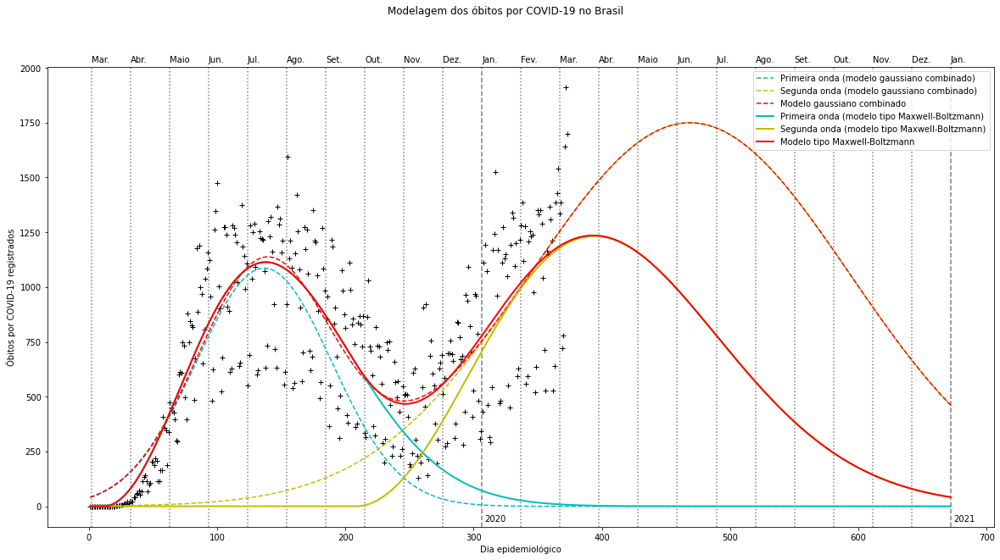

In [ ]:
#Plot the fitting and forecast of the models:

plt.figure(figsize=(20,10))
#plt.grid(True)
plt.ylabel('Óbitos por COVID-19 registrados')
plt.xlabel('Dia epidemiológico')
plt.suptitle('Modelagem dos óbitos por COVID-19 no Brasil')

future_dias=[]
dia_inicial=1.
for i in range(672):
    future_dias.append(dia_inicial)
    dia_inicial+=1

initial_day = -59
month_tmp = 0
year_tmp = '202'
cont = 0
months = ['Jan.', 'Fev.', 'Mar.', 'Abr.', 'Maio', 'Jun.', 'Jul.', 'Ago.',
          'Set.', 'Out.', 'Nov.', 'Dez.', 'Jan.', 'Fev.', 'Mar.', 'Abr.', 
          'Maio', 'Jun.', 'Jul.', 'Ago.', 'Set.', 'Out.', 'Nov.', 'Dez.',
          'Jan.', 'Fev.', 'Mar.', 'Abr.', 'Maio', 'Jun.', 'Jul.', 'Ago.',
          'Set.', 'Out.', 'Nov.', 'Dez.']
while initial_day < len(future_dias):
    if initial_day > 0:
        if months[int(month_tmp)]=='Jan.':
            plt.text(initial_day, 2025, months[int(month_tmp)], rotation=0)
            plt.text(initial_day+2, -70, year_tmp+str(cont), rotation=0)
            plt.axvline(initial_day, color="grey", linestyle="--")
            cont+=1
        else:
            plt.text(initial_day, 2025, months[int(month_tmp)], rotation=0)
            plt.axvline(initial_day, color="grey", linestyle=":")
    initial_day+=30.4583333
    month_tmp+=1.

plt.plot(deaths_data['dia_epidemiologico'], deaths_data['casos'], 'k+')

#Old model:

tmp_list = []
for i in range(len(future_dias)): 
    tmp_list.append(single_gaussian(future_dias[i],
                                    [1086.3707878253658, 
                                     136.63367259922438, 
                                     52.75598490090789]))
plt.plot(future_dias, tmp_list, 'c--',
         label='Primeira onda (modelo gaussiano combinado)')

tmp_list = []
for i in range(len(future_dias)): 
    tmp_list.append(single_gaussian(future_dias[i],
                                    [1749.7300316312435, 
                                     468.6645208218756, 
                                     124.52679947971986]))
plt.plot(future_dias, tmp_list, 'y--',
         label='Segunda onda (modelo gaussiano combinado)')

tmp_list = []
for i in range(len(future_dias)): 
    tmp_list.append(double_gaussian(future_dias[i],
                                    [1086.3707878253658, 
                                     136.63367259922438, 
                                     52.75598490090789, 
                                     1749.7300316312435, 
                                     468.6645208218756, 
                                     124.52679947971986]
))
plt.plot(future_dias, tmp_list, 'r--',
         label='Modelo gaussiano combinado')

#New model:

plt.plot(future_dias,
         single_maxwell_boltzmann(future_dias,
                                [0.0053, 
                                 1.2474932472517994, 
                                 0.1086371446294625, 
                                 18428.002768579034]),
          'c', linewidth=2., label='Primeira onda (modelo tipo Maxwell-Boltzmann)')

plt.plot(future_dias,
         single_maxwell_boltzmann(future_dias,
                                [0.0005852891729905905, 
                                 46.24774648143824, 
                                 0.22220572059893762, 
                                 61367.647972351995]),
          'y', linewidth=2., label='Segunda onda (modelo tipo Maxwell-Boltzmann)')

plt.plot(future_dias,
         dist_maxwell_boltzmann(future_dias,
                                [0.0053, 
                                 1.2474932472517994, 
                                 0.1086371446294625, 
                                 18428.002768579034,
                                 0.0005852891729905905, 
                                 46.24774648143824, 
                                 0.22220572059893762, 
                                 61367.647972351995]),
          'r', linewidth=2., label='Modelo tipo Maxwell-Boltzmann')

plt.legend(loc=1)

plt.show()


NEW SRAG CASES ANALYSIS:

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in true_divide


Iteração: 1000


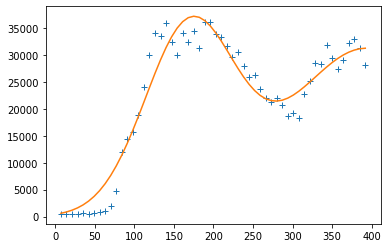

[34701.09994305283, 169.81956777414476, 57.029941033188145, 31256.06775243619, 393.33208280173375, 98.31725491996787]
Iteração: 2000


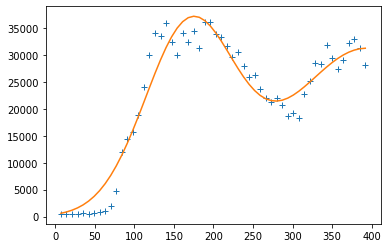

[34699.79922820057, 169.81840597538095, 57.029812131028564, 31252.746100354263, 393.3086092946849, 98.30710490917347]
Iteração: 3000


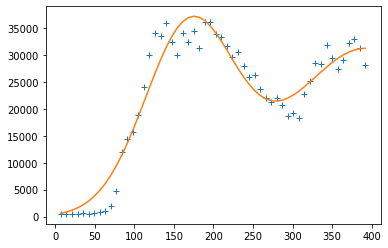

[34699.79510307667, 169.81840319558916, 57.02981266564598, 31252.7543782171, 393.3086422163359, 98.307123477753]
[34699.79510307667, 169.81840319558916, 57.02981266564598, 31252.7543782171, 393.3086422163359, 98.307123477753]
           w[0]        w[1]       w[2]          w[3]        w[4]       w[5]
0  34699.795103  169.818403  57.029813  31252.754378  393.308642  98.307123


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in true_divide


Iteração: 1000


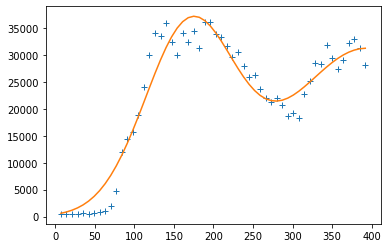

[34710.38771029544, 169.83918345803184, 57.03774706633093, 31247.964714242844, 393.1815604374863, 98.15945630170944]
Iteração: 2000


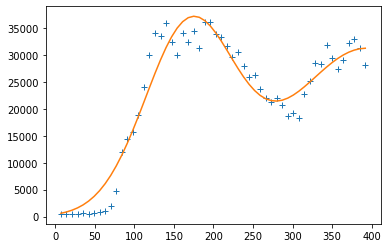

[34699.80425907637, 169.81841705605143, 57.02981766524304, 31252.74885385574, 393.3085454024088, 98.30702831543374]
Iteração: 3000


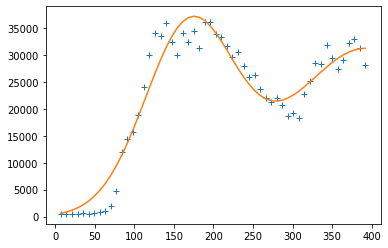

[34699.79517896728, 169.81840339635448, 57.02981269208311, 31252.754193743924, 393.3086398438668, 98.30712147266536]
[34699.79517896728, 169.81840339635448, 57.02981269208311, 31252.754193743924, 393.3086398438668, 98.30712147266536]
           w[0]        w[1]       w[2]          w[3]        w[4]       w[5]
0  34699.795103  169.818403  57.029813  31252.754378  393.308642  98.307123
1  34699.795179  169.818403  57.029813  31252.754194  393.308640  98.307121


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in true_divide


Iteração: 1000


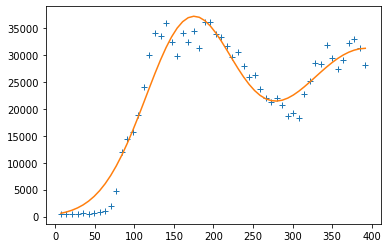

[34713.22795681845, 169.8328118200723, 57.016838212372235, 31243.98797152053, 393.0973701136532, 98.15894702042425]
Iteração: 2000


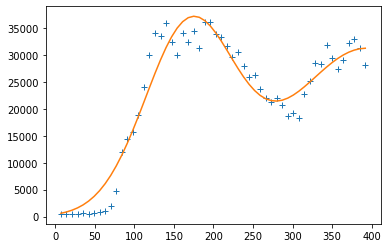

[34699.812440845475, 169.81841214166158, 57.02982245769797, 31252.752418844346, 393.3085961450696, 98.30703229972923]
Iteração: 3000


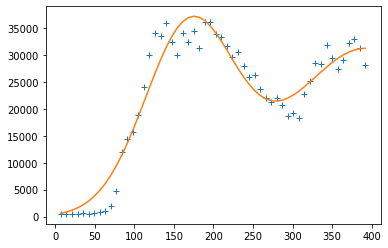

[34699.795309311456, 169.8184033707498, 57.02981269694455, 31252.75412768675, 393.30863826129195, 98.30712026122804]
[34699.795309311456, 169.8184033707498, 57.02981269694455, 31252.75412768675, 393.30863826129195, 98.30712026122804]
           w[0]        w[1]       w[2]          w[3]        w[4]       w[5]
0  34699.795103  169.818403  57.029813  31252.754378  393.308642  98.307123
1  34699.795179  169.818403  57.029813  31252.754194  393.308640  98.307121
2  34699.795309  169.818403  57.029813  31252.754128  393.308638  98.307120


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in true_divide


Iteração: 1000


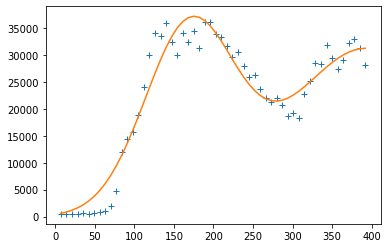

[34698.30388017267, 169.80816626405334, 57.022890252406995, 31249.08925909712, 393.2787016170749, 98.31239625542058]
Iteração: 2000


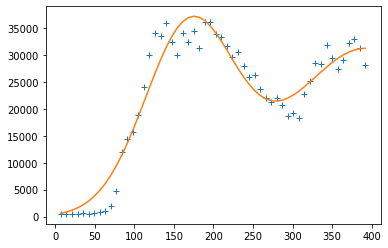

[34699.784219142275, 169.81838161440712, 57.029797454677706, 31252.76654453238, 393.30878762221226, 98.30726309702027]
Iteração: 3000


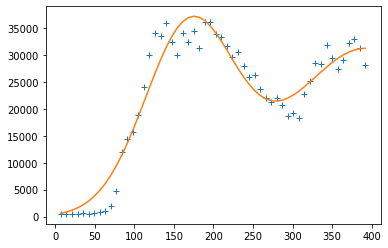

[34699.79534815226, 169.8184036825612, 57.02981289173551, 31252.75411559303, 393.30863840047704, 98.30711940054312]
[34699.79534815226, 169.8184036825612, 57.02981289173551, 31252.75411559303, 393.30863840047704, 98.30711940054312]
           w[0]        w[1]       w[2]          w[3]        w[4]       w[5]
0  34699.795103  169.818403  57.029813  31252.754378  393.308642  98.307123
1  34699.795179  169.818403  57.029813  31252.754194  393.308640  98.307121
2  34699.795309  169.818403  57.029813  31252.754128  393.308638  98.307120
3  34699.795348  169.818404  57.029813  31252.754116  393.308638  98.307119


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in true_divide


Iteração: 1000


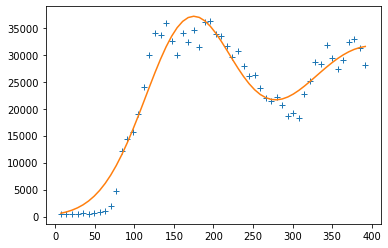

[34041.87113234705, 168.8127481573515, 56.66547894124926, 31598.86656389092, 399.29986625867406, 105.52510747601859]
Iteração: 2000


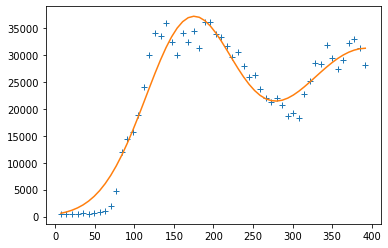

[34700.689460269976, 169.81992470903455, 57.030734335429806, 31252.26733736154, 393.2994290593549, 98.29645635185214]
Iteração: 3000


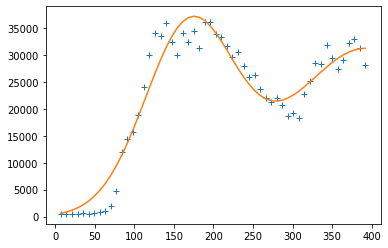

[34699.79570637734, 169.81840356608606, 57.02981320616885, 31252.75421110336, 393.3086388999995, 98.30711830513626]
[34699.79570637734, 169.81840356608606, 57.02981320616885, 31252.75421110336, 393.3086388999995, 98.30711830513626]
           w[0]        w[1]       w[2]          w[3]        w[4]       w[5]
0  34699.795103  169.818403  57.029813  31252.754378  393.308642  98.307123
1  34699.795179  169.818403  57.029813  31252.754194  393.308640  98.307121
2  34699.795309  169.818403  57.029813  31252.754128  393.308638  98.307120
3  34699.795348  169.818404  57.029813  31252.754116  393.308638  98.307119
4  34699.795706  169.818404  57.029813  31252.754211  393.308639  98.307118


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in true_divide


Iteração: 1000


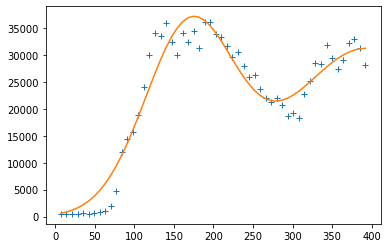

[34714.397229253605, 169.83529916560556, 57.04055748668528, 31241.203890422483, 393.1010497836008, 98.11825593376786]
Iteração: 2000


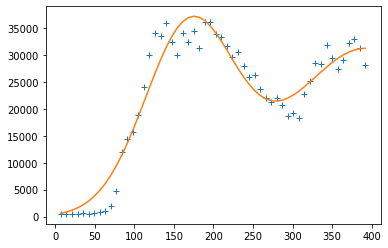

[34699.780903465864, 169.81836347411334, 57.029781908615234, 31252.760343449532, 393.30868487128834, 98.3072656558247]
Iteração: 3000


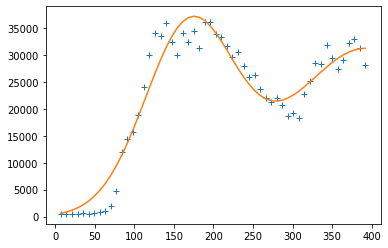

[34699.795142313116, 169.81840339016577, 57.02981268459279, 31252.754314992657, 393.3086410863316, 98.3071223223571]
[34699.795142313116, 169.81840339016577, 57.02981268459279, 31252.754314992657, 393.3086410863316, 98.3071223223571]
           w[0]        w[1]       w[2]          w[3]        w[4]       w[5]
0  34699.795103  169.818403  57.029813  31252.754378  393.308642  98.307123
1  34699.795179  169.818403  57.029813  31252.754194  393.308640  98.307121
2  34699.795309  169.818403  57.029813  31252.754128  393.308638  98.307120
3  34699.795348  169.818404  57.029813  31252.754116  393.308638  98.307119
4  34699.795706  169.818404  57.029813  31252.754211  393.308639  98.307118
5  34699.795142  169.818403  57.029813  31252.754315  393.308641  98.307122


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in true_divide


Iteração: 1000


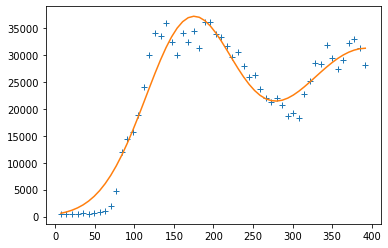

[34705.05344041816, 169.83509244831862, 57.0435062989448, 31252.17159643637, 393.2690260996466, 98.22943837951874]
Iteração: 2000


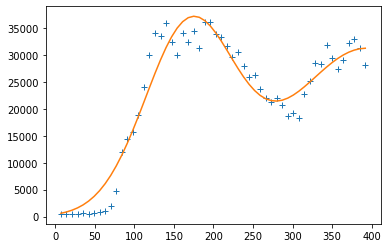

[34699.78250926735, 169.81838528927668, 57.02979864907288, 31252.750665825595, 393.30872468348616, 98.30728191508067]
Iteração: 3000


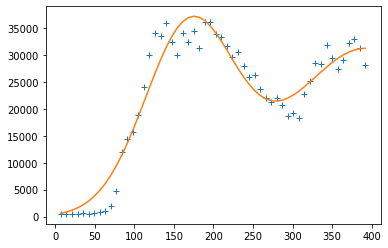

[34699.79541523733, 169.81840383093734, 57.029813089371, 31252.754125574516, 393.30863760084253, 98.30711875605415]
[34699.79541523733, 169.81840383093734, 57.029813089371, 31252.754125574516, 393.30863760084253, 98.30711875605415]
           w[0]        w[1]       w[2]          w[3]        w[4]       w[5]
0  34699.795103  169.818403  57.029813  31252.754378  393.308642  98.307123
1  34699.795179  169.818403  57.029813  31252.754194  393.308640  98.307121
2  34699.795309  169.818403  57.029813  31252.754128  393.308638  98.307120
3  34699.795348  169.818404  57.029813  31252.754116  393.308638  98.307119
4  34699.795706  169.818404  57.029813  31252.754211  393.308639  98.307118
5  34699.795142  169.818403  57.029813  31252.754315  393.308641  98.307122
6  34699.795415  169.818404  57.029813  31252.754126  393.308638  98.307119


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in true_divide


Iteração: 1000


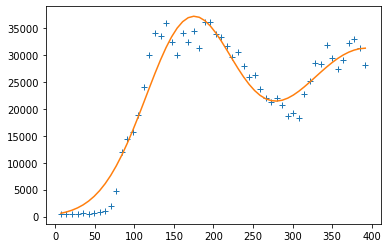

[34704.78051477876, 169.83324834358376, 57.038624378990505, 31263.230451003386, 393.3486676335359, 98.2728241031551]
Iteração: 2000


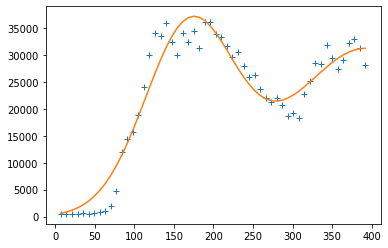

[34699.79745228239, 169.81841127296468, 57.029818029244126, 31252.759905659204, 393.30864860828154, 98.30709679710479]
Iteração: 3000


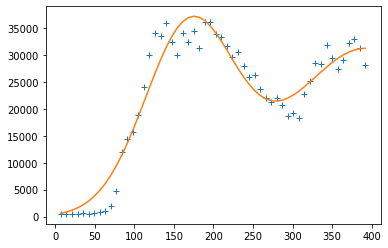

[34699.795091055115, 169.81840303311904, 57.029812626081316, 31252.75401585404, 393.30863869702426, 98.30712175088848]
[34699.795091055115, 169.81840303311904, 57.029812626081316, 31252.75401585404, 393.30863869702426, 98.30712175088848]
           w[0]        w[1]       w[2]          w[3]        w[4]       w[5]
0  34699.795103  169.818403  57.029813  31252.754378  393.308642  98.307123
1  34699.795179  169.818403  57.029813  31252.754194  393.308640  98.307121
2  34699.795309  169.818403  57.029813  31252.754128  393.308638  98.307120
3  34699.795348  169.818404  57.029813  31252.754116  393.308638  98.307119
4  34699.795706  169.818404  57.029813  31252.754211  393.308639  98.307118
5  34699.795142  169.818403  57.029813  31252.754315  393.308641  98.307122
6  34699.795415  169.818404  57.029813  31252.754126  393.308638  98.307119
7  34699.795091  169.818403  57.029813  31252.754016  393.308639  98.307122


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in true_divide


Iteração: 1000


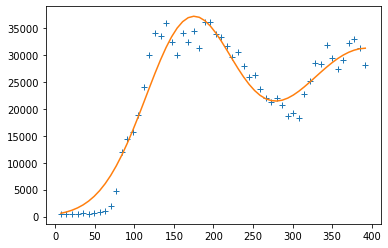

[34662.76605045299, 169.75413237091226, 56.99521820108723, 31260.104856675505, 393.6645927706269, 98.75100776645434]
Iteração: 2000


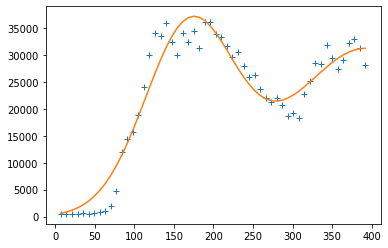

[34699.73850296747, 169.81829687069524, 57.0297616750178, 31252.765225301155, 393.30902191813414, 98.30769806973723]
Iteração: 3000


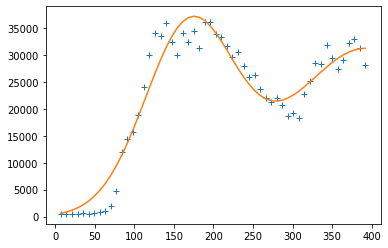

[34699.79524175948, 169.81840339474144, 57.029812725156134, 31252.754211971747, 393.3086398620596, 98.30712148870262]
[34699.79524175948, 169.81840339474144, 57.029812725156134, 31252.754211971747, 393.3086398620596, 98.30712148870262]
           w[0]        w[1]       w[2]          w[3]        w[4]       w[5]
0  34699.795103  169.818403  57.029813  31252.754378  393.308642  98.307123
1  34699.795179  169.818403  57.029813  31252.754194  393.308640  98.307121
2  34699.795309  169.818403  57.029813  31252.754128  393.308638  98.307120
3  34699.795348  169.818404  57.029813  31252.754116  393.308638  98.307119
4  34699.795706  169.818404  57.029813  31252.754211  393.308639  98.307118
5  34699.795142  169.818403  57.029813  31252.754315  393.308641  98.307122
6  34699.795415  169.818404  57.029813  31252.754126  393.308638  98.307119
7  34699.795091  169.818403  57.029813  31252.754016  393.308639  98.307122
8  34699.795242  169.818403  57.029813  31252.754212  393.308640  98.307121


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in true_divide


Iteração: 1000


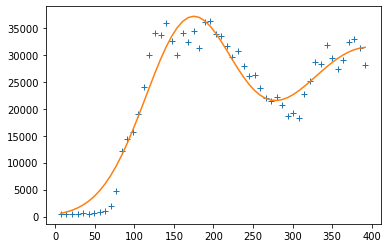

[34305.68499658119, 169.10951712617936, 56.64989762796655, 31397.529742787607, 396.2030736709824, 102.30273707775439]
Iteração: 2000


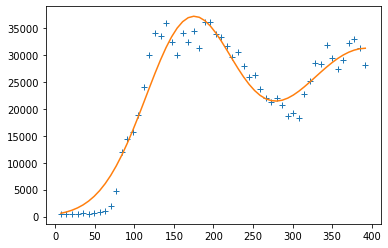

[34699.580092704215, 169.8180553995294, 57.02967358141724, 31252.78098180567, 393.3107967897124, 98.31003380167097]
Iteração: 3000


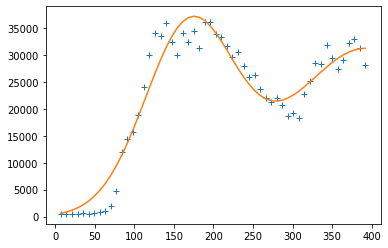

[34699.79517631492, 169.8184035878448, 57.02981275669081, 31252.754205511774, 393.3086403146499, 98.30712178973523]
[34699.79517631492, 169.8184035878448, 57.02981275669081, 31252.754205511774, 393.3086403146499, 98.30712178973523]
           w[0]        w[1]       w[2]          w[3]        w[4]       w[5]
0  34699.795103  169.818403  57.029813  31252.754378  393.308642  98.307123
1  34699.795179  169.818403  57.029813  31252.754194  393.308640  98.307121
2  34699.795309  169.818403  57.029813  31252.754128  393.308638  98.307120
3  34699.795348  169.818404  57.029813  31252.754116  393.308638  98.307119
4  34699.795706  169.818404  57.029813  31252.754211  393.308639  98.307118
5  34699.795142  169.818403  57.029813  31252.754315  393.308641  98.307122
6  34699.795415  169.818404  57.029813  31252.754126  393.308638  98.307119
7  34699.795091  169.818403  57.029813  31252.754016  393.308639  98.307122
8  34699.795242  169.818403  57.029813  31252.754212  393.308640  98.307121
9  34699

<Figure size 432x288 with 0 Axes>

In [ ]:
#Old model:

x_dados = np.array(srag_cases_data['semana_epidemiologica'])
y_dados = np.array(srag_cases_data['casos'])

cost_func = rsme
objective_function_name = 'double_gaussian'

#leg: w[0]->height of the peak, w[1]->center position, w[2]->standard deviations
bounds = [(0,1e6), (0,225), (0,5000), (0,1e6), (225,1000), (0,5000)]

popsize = 60              #Tamanho da população (Artigo 10*n_parâmetros_do_modelo)
mutate = 0.6              #Fator de mutação [0,2]
recombination = 0.5       #Parâmetro de recombinação [0,1]
maxiter = 3000            #Número de gerações
plot_interval = 1000       #plotar a cada...

res_srag_cases_data = pd.DataFrame(columns=('w[0]','w[1]','w[2]','w[3]','w[4]','w[5]'))

for i in range(10):
    list_tmp = Differential_Evolution(cost_func, bounds, popsize, mutate, recombination, maxiter, x_dados, y_dados, plot_interval)
    print(list_tmp)

    res_srag_cases_data = res_srag_cases_data.append({'w[0]': list_tmp[0], 'w[1]': list_tmp[1],'w[2]': list_tmp[2], 'w[3]': list_tmp[3], 'w[4]': list_tmp[4], 'w[5]': list_tmp[5]}, ignore_index=True)
    print(res_srag_cases_data)
    

In [ ]:
#Calculate the error generated by the parameters:

cost_function = 'double_gaussian'
x_dados = np.array(srag_cases_data['semana_epidemiologica'])
y_dados = np.array(srag_cases_data['casos'])

index_list_tmp = []
error_list_tmp = []
for i in range(len(res_srag_cases_data)):
    
    tmp_list = []
    for j in range(len(res_srag_cases_data.iloc[i])):
        tmp_list.append(res_srag_cases_data.iloc[i][j])
    
    print(i, tmp_list)
    index_list_tmp.append(i)
    error_list_tmp.append(rsme(x_dados, y_dados, tmp_list))

for i in range(len(res_srag_cases_data)):
    print(index_list_tmp[i], error_list_tmp[i])


0 [34699.79510307667, 169.81840319558916, 57.02981266564598, 31252.7543782171, 393.3086422163359, 98.307123477753]
1 [34699.79517896728, 169.81840339635448, 57.02981269208311, 31252.754193743924, 393.3086398438668, 98.30712147266536]
2 [34699.795309311456, 169.8184033707498, 57.02981269694455, 31252.75412768675, 393.30863826129195, 98.30712026122804]
3 [34699.79534815226, 169.8184036825612, 57.02981289173551, 31252.75411559303, 393.30863840047704, 98.30711940054312]
4 [34699.79570637734, 169.81840356608606, 57.02981320616885, 31252.75421110336, 393.3086388999995, 98.30711830513626]
5 [34699.795142313116, 169.81840339016577, 57.02981268459279, 31252.754314992657, 393.3086410863316, 98.3071223223571]
6 [34699.79541523733, 169.81840383093734, 57.029813089371, 31252.754125574516, 393.30863760084253, 98.30711875605415]
7 [34699.795091055115, 169.81840303311904, 57.029812626081316, 31252.75401585404, 393.30863869702426, 98.30712175088848]
8 [34699.79524175948, 169.81840339474144, 57.02981272

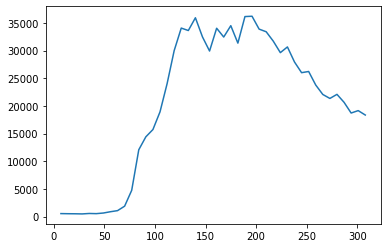

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp


Iteração: 100


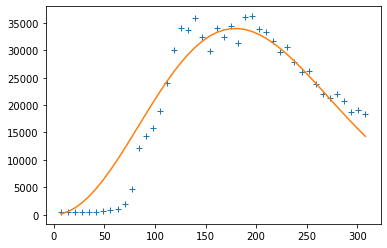

[0.017843246624523856, 0.0, 0.04171469151300874, 306418.5613255517]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp


Iteração: 200


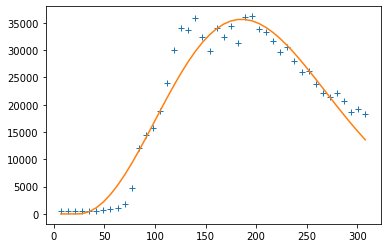

[0.004801792471749975, 2.1937573234828225, 0.08954996668869308, 619723.6326663019]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp


Iteração: 300


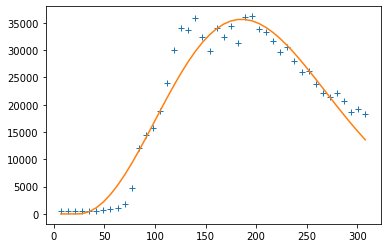

[0.004801792471749975, 2.1937573234828225, 0.08954996668869308, 619723.6326663019]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp


Iteração: 400


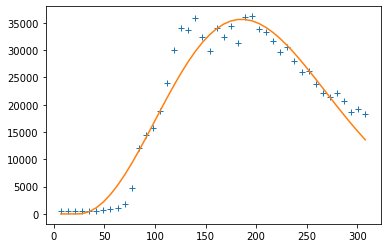

[0.004801792471749975, 2.1937573234828225, 0.08954996668869308, 619723.6326663019]
Iteração: 500


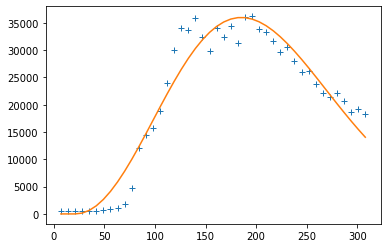

[0.007946690965927422, 1.482143815993615, 0.06850700173235331, 486221.1028070379]
Iteração: 600


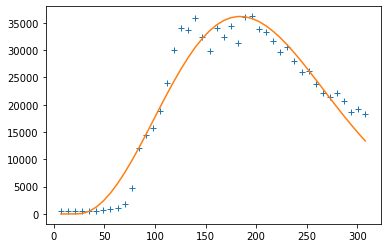

[0.015198254427070793, 1.1984038795249385, 0.05055876742490832, 353428.5490551624]
Iteração: 700


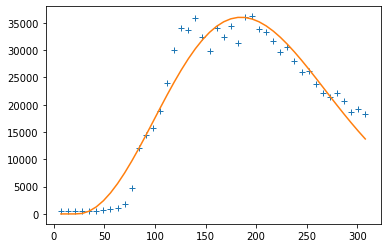

[0.013800980922145607, 1.2237705924126563, 0.05258597939926832, 369325.766276216]
Iteração: 800


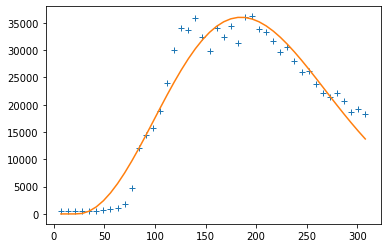

[0.013800980922145607, 1.2237705924126563, 0.05258597939926832, 369325.766276216]
Iteração: 900


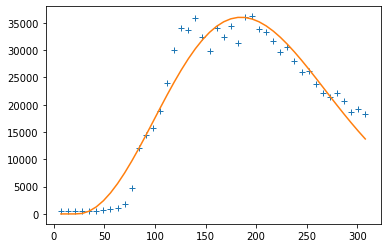

[0.013800980922145607, 1.2237705924126563, 0.05258597939926832, 369325.766276216]
Iteração: 1000


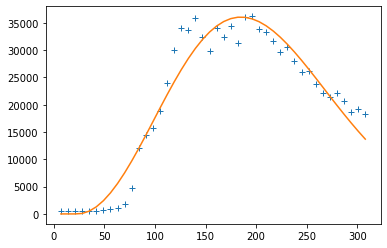

[0.011741461399094783, 1.3270375931294005, 0.05705142830738952, 400781.110507522]
[0.011741461399094783, 1.3270375931294005, 0.05705142830738952, 400781.110507522]


<Figure size 432x288 with 0 Axes>

In [ ]:
#Fit the first wave with the new model:

srag_cases_data_tmp = srag_cases_data.copy()

for i in range(len(srag_cases_data_tmp)): 
    if i > 43: srag_cases_data_tmp.drop([i], inplace=True)

x_dados = np.array(srag_cases_data_tmp['semana_epidemiologica'])
y_dados = np.array(srag_cases_data_tmp['casos'])

plt.plot(x_dados, y_dados)
plt.show()

cost_func = rsme
objective_function_name = 'single_maxwell_boltzmann'

bounds = [(0.,1e-1), (0.,50), (1e-2,1), (1e1,1e7)]

popsize = 80              #Tamanho da população (Artigo 10*n_parâmetros_do_modelo)
mutate = 0.5              #Fator de mutação [0,2]
recombination = 0.4       #Parâmetro de recombinação [0,1]
maxiter = 1000            #Número de gerações
plot_interval = 100       #plotar a cada...

for i in range(1):
    list_tmp = Differential_Evolution(cost_func, bounds, popsize, mutate, recombination, maxiter, x_dados, y_dados, plot_interval)
    print(list_tmp)


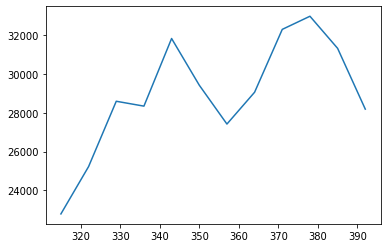

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp


Iteração: 200


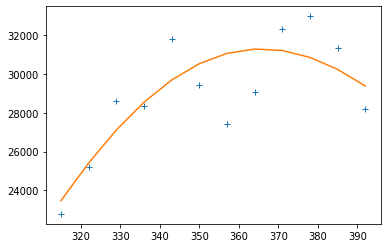

[0.00011715777386926696, 142.05470537542925, 0.6410555473387268, 3481414.4288871977]
Iteração: 400


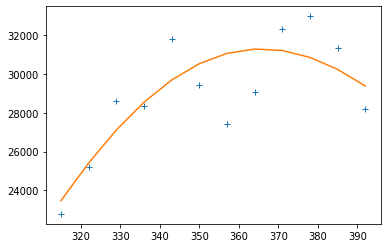

[0.00011715777386926696, 142.05470537542925, 0.6410555473387268, 3481414.4288871977]
Iteração: 600


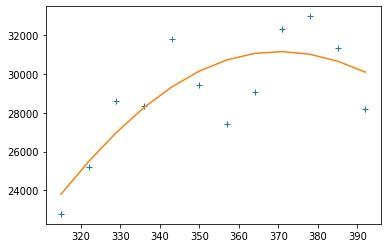

[0.00034947587325175587, 68.83027135897228, 0.33035223411112125, 2006790.6400559286]
Iteração: 800


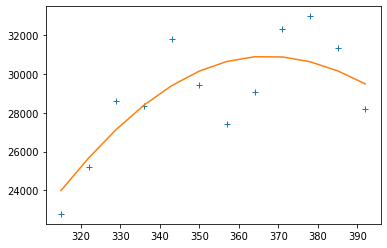

[0.0002206100648761378, 89.83467498402104, 0.42794020814179545, 2506229.41894464]
Iteração: 1000


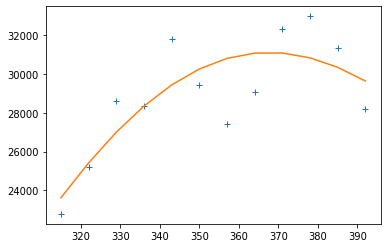

[0.0003627312096305751, 73.94037545881305, 0.34391954948181275, 1966966.106259408]
Iteração: 1200


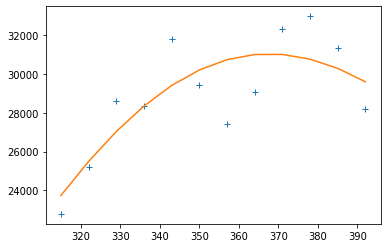

[0.00033234164831072465, 75.64201884243387, 0.3549453790411593, 2050106.2873195861]
Iteração: 1400


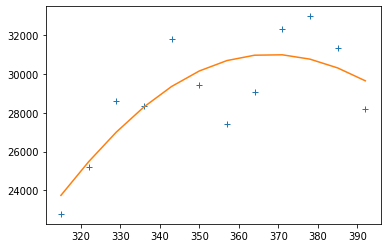

[0.0003324306407987979, 74.49865987047141, 0.35140963114385937, 2048019.8303047833]
Iteração: 1600


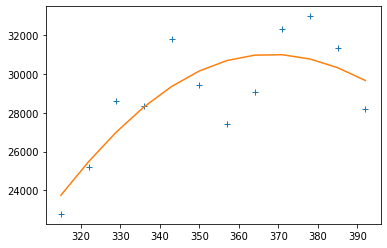

[0.00033554725794674226, 73.93462102939958, 0.3491091383480559, 2038715.4048658214]
Iteração: 1800


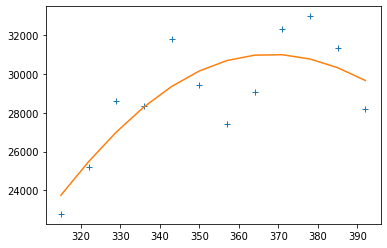

[0.00033554725794674226, 73.93462102939958, 0.3491091383480559, 2038715.4048658214]
Iteração: 2000


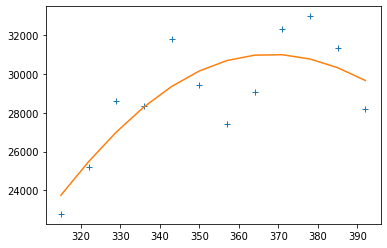

[0.00033554725794674226, 73.93462102939958, 0.3491091383480559, 2038715.4048658214]
[0.00033554725794674226, 73.93462102939958, 0.3491091383480559, 2038715.4048658214]


<Figure size 432x288 with 0 Axes>

In [ ]:
#Fit the second wave with the new model:

srag_cases_data_tmp = srag_cases_data.copy()

for i in range(len(srag_cases_data_tmp)): 
    if i < 44: srag_cases_data_tmp.drop([i], inplace=True)

x_dados = np.array(srag_cases_data_tmp['semana_epidemiologica'])
y_dados = np.array(srag_cases_data_tmp['casos'])

plt.plot(x_dados, y_dados)
plt.show()

cost_func = rsme
objective_function_name = 'single_maxwell_boltzmann'

bounds = [(0.,1e-1), (5.3270375931294005,500), (1e-2,1), (1e1,1e7)]

popsize = 40              #Tamanho da população (Artigo 10*n_parâmetros_do_modelo)
mutate = 0.5              #Fator de mutação [0,2]
recombination = 0.4       #Parâmetro de recombinação [0,1]
maxiter = 2000            #Número de gerações
plot_interval = 200       #plotar a cada...

for i in range(1):
    list_tmp = Differential_Evolution(cost_func, bounds, popsize, mutate, recombination, maxiter, x_dados, y_dados, plot_interval)
    print(list_tmp)


In [ ]:
#Adjusting the two waves at the same time with the new model:

x_dados = np.array(srag_cases_data['semana_epidemiologica'])
y_dados = np.array(srag_cases_data['casos'])

cost_func = rsme
objective_function_name = 'dist_maxwell_boltzmann'

#Parameters based on the predecessor runs:
#wave_1: [0.011741461399094783, 1.3270375931294005, 0.05705142830738952, 400781.110507522]
#wave_2: [0.0007989273821909342, 33.84119051650734, 0.181666051906779, 1341825.1093587307]
#wave_2_new:[0.00033554725794674226, 73.93462102939958, 0.3491091383480559, 2038715.4048658214] 
bounds = [(0.006,0.026),
          (0.8,3.3),
          (0.052,0.072),
          (300000.,450000.),
          (0.00028,0.00053),
          (68.,73.),
          (0.29,0.39),
          (800000.,2300000.)]
'''
[0.014907901026927569, 1.8, 0.05713165296348881, 358975.4929217708, 
0.0008327695916384781, 37.602763803418085, 0.16835152374377244, 1465385.6931502826]

[0.015326028633053122, 2.2202523582296605, 0.06026481908902822, 356515.2907349684, 
0.0007649918309228186, 28.0, 0.14311833317371248, 1609006.725557867]

[0.016, 2.3, 0.06051935945521045, 350000.0, 0.0007466561711856716, 
23.931131373770725, 0.13, 1722926.0211891576]

[0.01551341339924436, 2.443011968515191, 0.062, 353162.4457524311,
0.0007546772479819416, 23.0, 0.1273505068155696, 1712592.0817601124]

[0.019958789706773773, 2.229314860707847, 0.05592805930742468, 311621.8755249769, 
0.000783122804104851, 18.0, 0.1101887444880072, 1746460.4337117528]

[0.017802627485360954, 2.472714320295585, 0.060355599725982104, 325314.4015822805, 
0.0007999210615331342, 15.958106375630084, 0.10400316239809712, 1762994.8037587581]

[0.016277552648810218, 2.5984317346642496, 0.06356100557149785, 340459.3847257019, 
0.0008047496538817297, 14.877357805533402, 0.0994308067968869, 1800000.0]

[0.014730933709771785, 2.7898690007161404, 0.067, 356545.9602096771,
 0.0008026767711069861, 13.0, 0.08961188023402805, 2033574.159991579]

[0.015979373174337744, 2.6694849814867068, 0.06434457579320685, 343299.67939464544, 
0.0007801692883413745, 12.707076460943883, 0.08883181820429813, 2111147.3210188174]

[0.014118995268168646, 2.8, 0.06812956110960802, 365601.9549914904, 
0.00084, 12.759072799969665, 0.08733264682307623, 2004902.7973659695]

New:
[0.013278519965964498, 2.0299787917918586, 0.06114290723983892, 384202.7154655281, 
0.00038, 68.036477337472, 0.2963943512769163, 1909474.100763769]
'''
popsize = 80              #Tamanho da população (Artigo 10*n_parâmetros_do_modelo)
mutate = 0.5              #Fator de mutação [0,2]
recombination = 0.4       #Parâmetro de recombinação [0,1]
maxiter = 300            #Número de gerações
plot_interval = 30        #plotar a cada...

res_srag_cases_data = pd.DataFrame(columns=('w[0]','w[1]','w[2]','w[3]','w[4]','w[5]','w[6]','w[7]'))

for i in range(1):
    list_tmp = Differential_Evolution(cost_func, bounds, popsize, mutate, recombination, maxiter, x_dados, y_dados, plot_interval)
    print(list_tmp)

    res_srag_cases_data = res_srag_cases_data.append({'w[0]': list_tmp[0], 'w[1]': list_tmp[1],'w[2]': list_tmp[2], 'w[3]': list_tmp[3], 'w[4]': list_tmp[4], 'w[5]': list_tmp[5], 'w[6]': list_tmp[6], 'w[7]': list_tmp[7]}, ignore_index=True)
    print(res_srag_cases_data)


In [ ]:
#Calculate the error generated by the parameters:

cost_function = 'single_maxwell_boltzmann'
x_dados = np.array(srag_cases_data['semana_epidemiologica'])
y_dados = np.array(srag_cases_data['casos'])

tmp_list = [0.013278519965964498, 2.0299787917918586, 0.06114290723983892, 384202.7154655281, 
            0.00038, 68.036477337472, 0.2963943512769163, 1909474.100763769]

print(list_tmp, '\n', rsme(x_dados, y_dados, tmp_list))

print('How much the new model is better than the old parameters: ', 100-rsme(x_dados, y_dados, tmp_list)*100/2906.8057249606036, '%')

'''
[34699.79534815226, 169.8184036825612, 57.02981289173551, 31252.75411559303, 393.30863840047704, 98.30711940054312]
2906.8057249606036
'''

[0.016030660025645738, 1.8123916147644517, 0.05482085404164144, 348668.22439814144, 0.00053, 71.07223993091658, 0.29352526813056856, 1568864.866577908] 
 2468.0180583762676
How much the new model is better than the old parameters:  15.095183789425178 %


'\n[34699.79534815226, 169.8184036825612, 57.02981289173551, 31252.75411559303, 393.30863840047704, 98.30711940054312]\n2906.8057249606036\n'

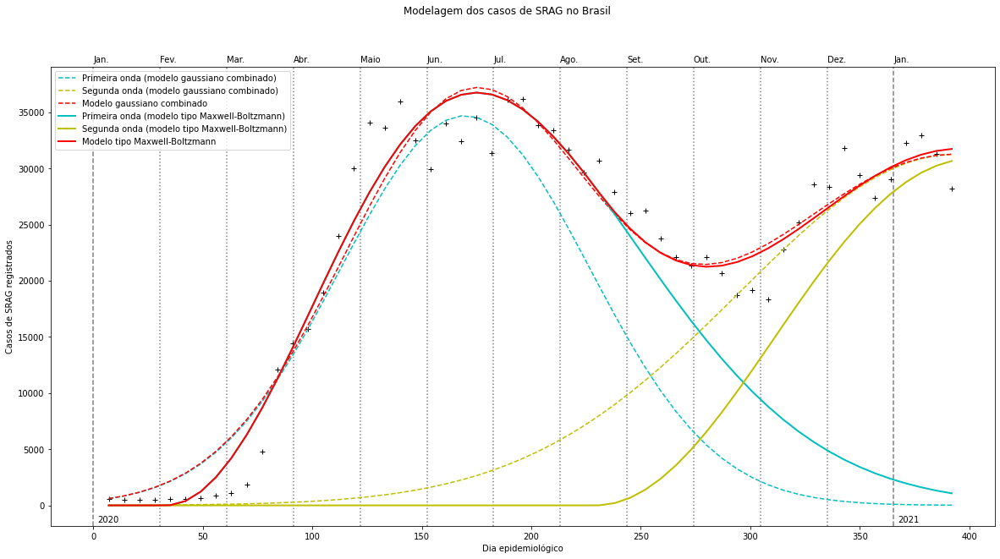

In [ ]:
#Plot the fitting and forecast of the models:

plt.figure(figsize=(20,10))
#plt.grid(True)
plt.ylabel('Casos de SRAG registrados')
plt.xlabel('Dia epidemiológico')
plt.suptitle('Modelagem dos casos de SRAG no Brasil')

future_dias=[]
dia_inicial=1.
for i in range(len(srag_cases_data['semana_epidemiologica'])):
    future_dias.append(dia_inicial)
    dia_inicial+=1

initial_day = 0
month_tmp = 0
year_tmp = '202'
cont = 0
months = ['Jan.', 'Fev.', 'Mar.', 'Abr.', 'Maio', 'Jun.', 'Jul.', 'Ago.',
          'Set.', 'Out.', 'Nov.', 'Dez.', 'Jan.', 'Fev.', 'Mar.', 'Abr.', 
          'Maio', 'Jun.', 'Jul.', 'Ago.', 'Set.', 'Out.', 'Nov.', 'Dez.',
          'Jan.', 'Fev.', 'Mar.', 'Abr.', 'Maio', 'Jun.', 'Jul.', 'Ago.',
          'Set.', 'Out.', 'Nov.', 'Dez.']
while initial_day < len(future_dias)*7:
    if initial_day >= 0:
        if months[int(month_tmp)]=='Jan.':
            plt.text(initial_day, 39500, months[int(month_tmp)], rotation=0)
            plt.text(initial_day+2, -1500, year_tmp+str(cont), rotation=0)
            plt.axvline(initial_day, color="grey", linestyle="--")
            cont+=1
        else:
            plt.text(initial_day, 39500, months[int(month_tmp)], rotation=0)
            plt.axvline(initial_day, color="grey", linestyle=":")
    initial_day+=30.4583333
    month_tmp+=1.

plt.plot(srag_cases_data['semana_epidemiologica'], srag_cases_data['casos'], 'k+')

#Old model:

tmp_list = []
for i in range(len(srag_cases_data['semana_epidemiologica'])): 
    tmp_list.append(single_gaussian(srag_cases_data['semana_epidemiologica'].iloc[i],
                                    [34699.79534815226, 
                                     169.8184036825612, 
                                     57.02981289173551]))
plt.plot(srag_cases_data['semana_epidemiologica'], tmp_list, 'c--',
         label='Primeira onda (modelo gaussiano combinado)')

tmp_list = []
for i in range(len(srag_cases_data['semana_epidemiologica'])): 
    tmp_list.append(single_gaussian(srag_cases_data['semana_epidemiologica'].iloc[i],
                                    [31252.75411559303, 
                                     393.30863840047704, 
                                     98.30711940054312]))
plt.plot(srag_cases_data['semana_epidemiologica'], tmp_list, 'y--',
         label='Segunda onda (modelo gaussiano combinado)')

tmp_list = []
for i in range(len(srag_cases_data['semana_epidemiologica'])): 
    tmp_list.append(double_gaussian(srag_cases_data['semana_epidemiologica'].iloc[i],
                                    [34699.79534815226, 
                                     169.8184036825612, 
                                     57.02981289173551, 
                                     31252.75411559303, 
                                     393.30863840047704, 
                                     98.30711940054312]))
plt.plot(srag_cases_data['semana_epidemiologica'], tmp_list, 'r--',
         label='Modelo gaussiano combinado')

#New model:

plt.plot(srag_cases_data['semana_epidemiologica'],
         single_maxwell_boltzmann(srag_cases_data['semana_epidemiologica'],
                                [0.013278519965964498, 
                                 2.0299787917918586, 
                                 0.06114290723983892, 
                                 384202.7154655281]),
          'c', linewidth=2., label='Primeira onda (modelo tipo Maxwell-Boltzmann)')

plt.plot(srag_cases_data['semana_epidemiologica'],
         single_maxwell_boltzmann(srag_cases_data['semana_epidemiologica'],
                                [0.00038, 
                                 68.036477337472, 
                                 0.2963943512769163, 
                                 1909474.100763769]),
          'y', linewidth=2., label='Segunda onda (modelo tipo Maxwell-Boltzmann)')

plt.plot(srag_cases_data['semana_epidemiologica'],
         dist_maxwell_boltzmann(srag_cases_data['semana_epidemiologica'],
                                [0.013278519965964498, 
                                 2.0299787917918586, 
                                 0.06114290723983892, 
                                 384202.7154655281, 
                                 0.00038, 
                                 68.036477337472, 
                                 0.2963943512769163, 
                                 1909474.100763769]),
          'r', linewidth=2., label='Modelo tipo Maxwell-Boltzmann')

plt.legend(loc=2)

plt.show()


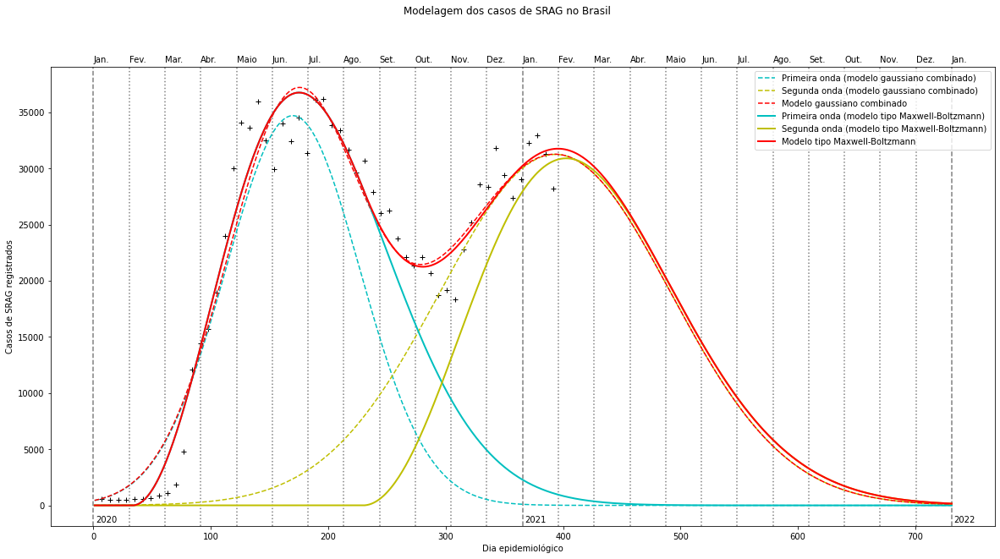

In [ ]:
#Plot the fitting and forecast of the models:

plt.figure(figsize=(20,10))
#plt.grid(True)
plt.ylabel('Casos de SRAG registrados')
plt.xlabel('Dia epidemiológico')
plt.suptitle('Modelagem dos casos de SRAG no Brasil')

future_dias=[]
dia_inicial=1.
for i in range(731):
    future_dias.append(dia_inicial)
    dia_inicial+=1

initial_day = 0
month_tmp = 0
year_tmp = '202'
cont = 0
months = ['Jan.', 'Fev.', 'Mar.', 'Abr.', 'Maio', 'Jun.', 'Jul.', 'Ago.',
          'Set.', 'Out.', 'Nov.', 'Dez.', 'Jan.', 'Fev.', 'Mar.', 'Abr.', 
          'Maio', 'Jun.', 'Jul.', 'Ago.', 'Set.', 'Out.', 'Nov.', 'Dez.',
          'Jan.', 'Fev.', 'Mar.', 'Abr.', 'Maio', 'Jun.', 'Jul.', 'Ago.',
          'Set.', 'Out.', 'Nov.', 'Dez.']
while initial_day < len(future_dias):
    if initial_day >= 0:
        if months[int(month_tmp)]=='Jan.':
            plt.text(initial_day, 39500, months[int(month_tmp)], rotation=0)
            plt.text(initial_day+2, -1500, year_tmp+str(cont), rotation=0)
            plt.axvline(initial_day, color="grey", linestyle="--")
            cont+=1
        else:
            plt.text(initial_day, 39500, months[int(month_tmp)], rotation=0)
            plt.axvline(initial_day, color="grey", linestyle=":")
    initial_day+=30.4583333
    month_tmp+=1.

plt.plot(srag_cases_data['semana_epidemiologica'], srag_cases_data['casos'], 'k+')

#Old model:

tmp_list = []
for i in range(len(future_dias)): 
    tmp_list.append(single_gaussian(future_dias[i],
                                    [34699.79534815226, 
                                     169.8184036825612, 
                                     57.02981289173551]))
plt.plot(future_dias, tmp_list, 'c--',
         label='Primeira onda (modelo gaussiano combinado)')

tmp_list = []
for i in range(len(future_dias)): 
    tmp_list.append(single_gaussian(future_dias[i],
                                    [31252.75411559303, 
                                     393.30863840047704, 
                                     98.30711940054312]))
plt.plot(future_dias, tmp_list, 'y--',
         label='Segunda onda (modelo gaussiano combinado)')

tmp_list = []
for i in range(len(future_dias)): 
    tmp_list.append(double_gaussian(future_dias[i],
                                    [34699.79534815226, 
                                     169.8184036825612, 
                                     57.02981289173551, 
                                     31252.75411559303, 
                                     393.30863840047704, 
                                     98.30711940054312]))
plt.plot(future_dias, tmp_list, 'r--',
         label='Modelo gaussiano combinado')

#New model:

plt.plot(future_dias,
         single_maxwell_boltzmann(future_dias,
                                [0.013278519965964498, 
                                 2.0299787917918586, 
                                 0.06114290723983892, 
                                 384202.7154655281]),
          'c', linewidth=2., label='Primeira onda (modelo tipo Maxwell-Boltzmann)')

plt.plot(future_dias,
         single_maxwell_boltzmann(future_dias,
                                [0.00038, 
                                 68.036477337472, 
                                 0.2963943512769163, 
                                 1909474.100763769]),
          'y', linewidth=2., label='Segunda onda (modelo tipo Maxwell-Boltzmann)')

plt.plot(future_dias,
         dist_maxwell_boltzmann(future_dias,
                                [0.013278519965964498, 
                                 2.0299787917918586, 
                                 0.06114290723983892, 
                                 384202.7154655281, 
                                 0.00038, 
                                 68.036477337472, 
                                 0.2963943512769163, 
                                 1909474.100763769]),
          'r', linewidth=2., label='Modelo tipo Maxwell-Boltzmann')

plt.legend(loc=1)

plt.show()


NEW SRAG CASES ANALYSIS:

Iteração: 200


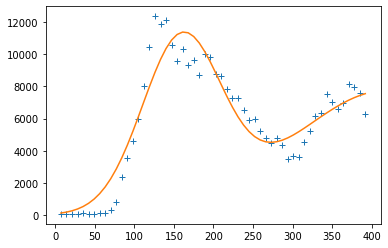

[10583.311864167932, 159.4602862265531, 50.0, 7754.006139118545, 420.47557311795856, 121.60155945530059]
Iteração: 400


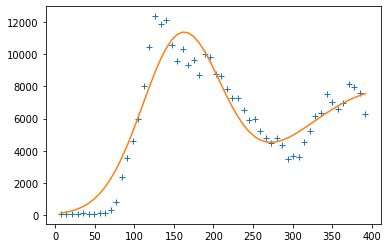

[10581.82216089687, 159.47166408095364, 50, 7749.425532527424, 420.31841205839044, 121.50477053004514]
Iteração: 600


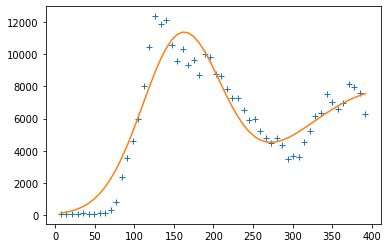

[10581.82538109407, 159.47166708952233, 50.000000000000014, 7749.421838655537, 420.3181361838702, 121.50455955502842]
Iteração: 800


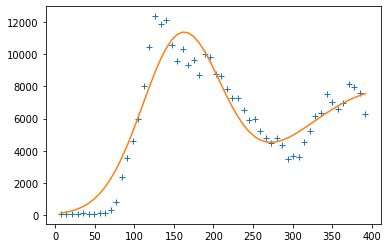

[10581.825357948042, 159.47166704904677, 50.000000000000014, 7749.421790175317, 420.31813574679603, 121.50456001936897]
Iteração: 1000


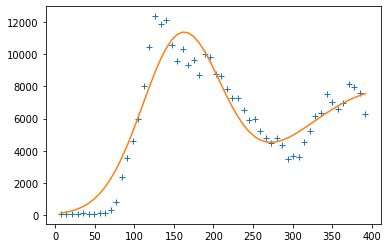

[10581.825353912913, 159.47166718150484, 50.0, 7749.421819499938, 420.3181361527931, 121.50455941338761]
[10581.825353912913, 159.47166718150484, 50.0, 7749.421819499938, 420.3181361527931, 121.50455941338761]
           w[0]        w[1]  w[2]         w[3]        w[4]        w[5]
0  10581.825354  159.471667  50.0  7749.421819  420.318136  121.504559
Iteração: 200


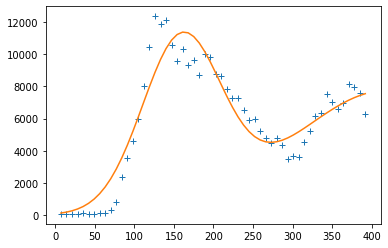

[10581.01824975646, 159.47198202059357, 50.0, 7752.857669595159, 420.485743573075, 121.5993935297879]
Iteração: 400


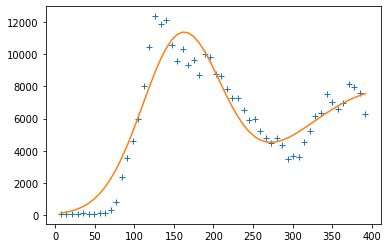

[10581.825893161262, 159.47167166517497, 50.0, 7749.423069893698, 420.31819430007016, 121.50457831661049]
Iteração: 600


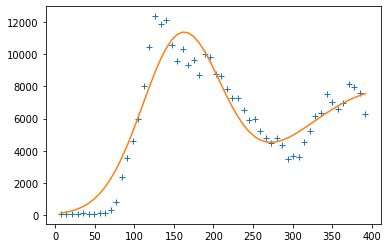

[10581.825420910598, 159.47166737756098, 50.0, 7749.421820561723, 420.3181348800851, 121.50455832128186]
Iteração: 800


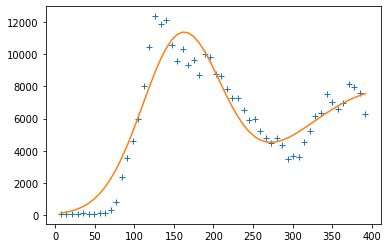

[10581.825399430512, 159.4716672103171, 50.0, 7749.421839620165, 420.318135928184, 121.50455897388879]
Iteração: 1000


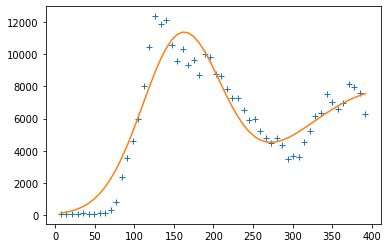

[10581.825399430512, 159.4716672103171, 50.0, 7749.421839620165, 420.318135928184, 121.50455897388879]
[10581.825399430512, 159.4716672103171, 50.0, 7749.421839620165, 420.318135928184, 121.50455897388879]
           w[0]        w[1]  w[2]         w[3]        w[4]        w[5]
0  10581.825354  159.471667  50.0  7749.421819  420.318136  121.504559
1  10581.825399  159.471667  50.0  7749.421840  420.318136  121.504559
Iteração: 200


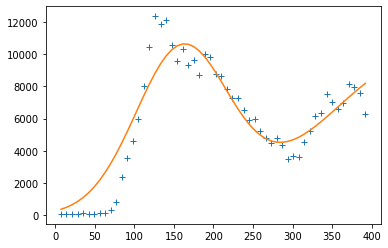

[10098.310359810674, 159.99998297071167, 58.793353324839465, 9889.221059537716, 471.1492692227315, 128.4847927671166]
Iteração: 400


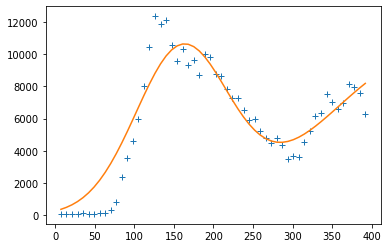

[10097.501003849056, 160, 58.79324283971349, 9888.733084516454, 471.1869946277503, 128.52410739786893]
Iteração: 600


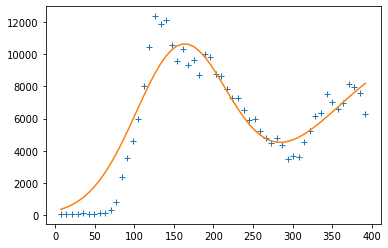

[10097.500997870795, 160.0, 58.79324283951443, 9888.733083544705, 471.18699931071285, 128.52410878336852]
Iteração: 800


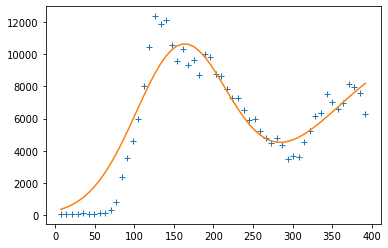

[10097.500997870722, 160.0, 58.79324283951443, 9888.733083544685, 471.1869993107907, 128.5241087833863]
Iteração: 1000


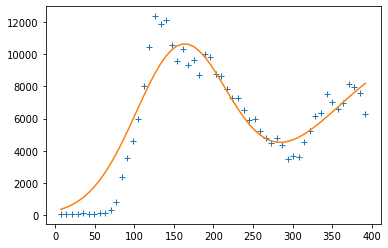

[10097.500997870708, 160.0, 58.79324283951443, 9888.733083544692, 471.18699931084063, 128.52410878339913]
[10097.500997870708, 160.0, 58.79324283951443, 9888.733083544692, 471.18699931084063, 128.52410878339913]
           w[0]        w[1]       w[2]         w[3]        w[4]        w[5]
0  10581.825354  159.471667  50.000000  7749.421819  420.318136  121.504559
1  10581.825399  159.471667  50.000000  7749.421840  420.318136  121.504559
2  10097.500998  160.000000  58.793243  9888.733084  471.186999  128.524109
Iteração: 200


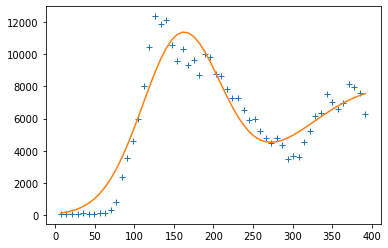

[10579.699132395972, 159.46510403276795, 50.000003832252176, 7755.728837207603, 420.62403394832825, 121.6974400433248]
Iteração: 400


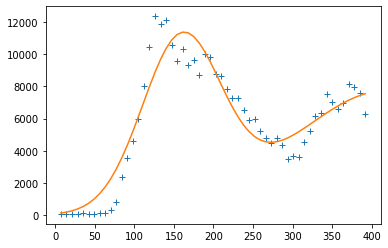

[10580.939180977282, 159.47031950085622, 50, 7751.6979286167, 420.42680196651287, 121.57262643175306]
Iteração: 600


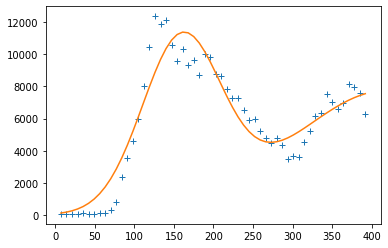

[10580.945356694629, 159.47032913776886, 50, 7751.695998123434, 420.4267336956208, 121.57259146461207]
Iteração: 800


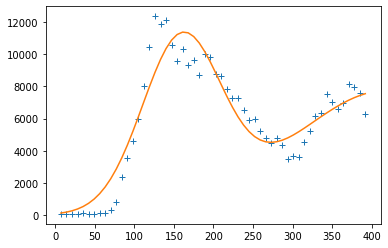

[10580.945356711729, 159.4703291377924, 50.0, 7751.696003623734, 420.42673369552756, 121.57259146458858]
Iteração: 1000


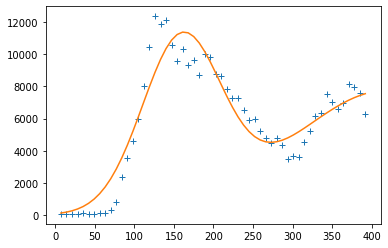

[10580.945357079992, 159.47032913781675, 50.0, 7751.696013682334, 420.42673369535515, 121.57259146464085]
[10580.945357079992, 159.47032913781675, 50.0, 7751.696013682334, 420.42673369535515, 121.57259146464085]
           w[0]        w[1]       w[2]         w[3]        w[4]        w[5]
0  10581.825354  159.471667  50.000000  7749.421819  420.318136  121.504559
1  10581.825399  159.471667  50.000000  7749.421840  420.318136  121.504559
2  10097.500998  160.000000  58.793243  9888.733084  471.186999  128.524109
3  10580.945357  159.470329  50.000000  7751.696014  420.426734  121.572591
Iteração: 200


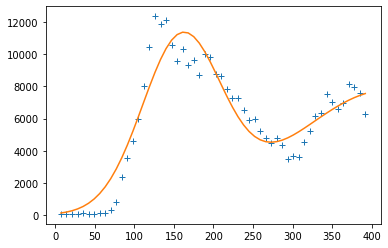

[10555.31676138383, 159.42232332413084, 50.00125332939908, 7785.157147580325, 422.3938513277684, 123.07730887604284]
Iteração: 400


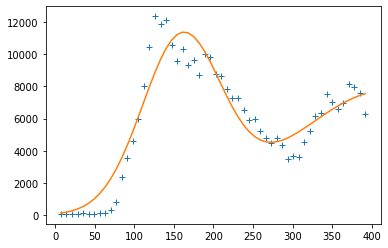

[10572.144259038576, 159.4607047711481, 50.00000000301803, 7770.311190265393, 421.37318726449155, 122.19966456324433]
Iteração: 600


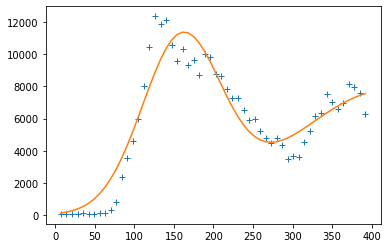

[10572.129337609449, 159.46064663401427, 50.000000000000014, 7770.283264973091, 421.37255401897056, 122.1996609363673]
Iteração: 800


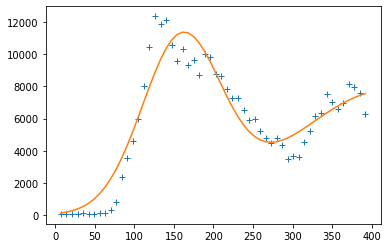

[10572.129337242426, 159.46064663282206, 50.000000000000014, 7770.283264693851, 421.3725538884463, 122.19966093630465]
Iteração: 1000


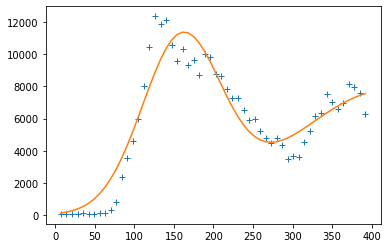

[10572.129337135051, 159.46064663282667, 50.00000000000001, 7770.283264677717, 421.37255386558564, 122.19966093630119]
[10572.129337135051, 159.46064663282667, 50.00000000000001, 7770.283264677717, 421.37255386558564, 122.19966093630119]
           w[0]        w[1]       w[2]         w[3]        w[4]        w[5]
0  10581.825354  159.471667  50.000000  7749.421819  420.318136  121.504559
1  10581.825399  159.471667  50.000000  7749.421840  420.318136  121.504559
2  10097.500998  160.000000  58.793243  9888.733084  471.186999  128.524109
3  10580.945357  159.470329  50.000000  7751.696014  420.426734  121.572591
4  10572.129337  159.460647  50.000000  7770.283265  421.372554  122.199661
Iteração: 200


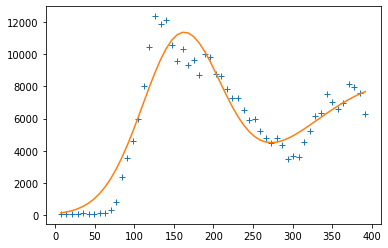

[10511.741196939209, 159.52200668520035, 50.00070147138533, 8084.433367299058, 433.6411228982366, 128.5299506813812]
Iteração: 400


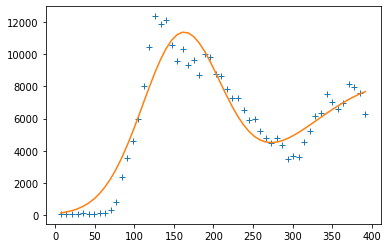

[10515.492362883135, 159.48531485352063, 50.00000000077014, 8081.742082745086, 433.45658645204554, 128.48465038010934]
Iteração: 600


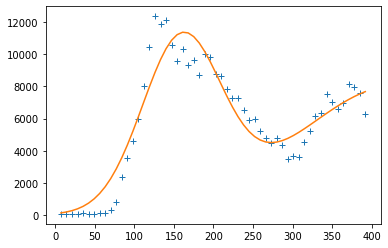

[10515.493253372384, 159.4853148491846, 50.000000000000085, 8081.7420671953605, 433.4565842082095, 128.48464793150532]
Iteração: 800


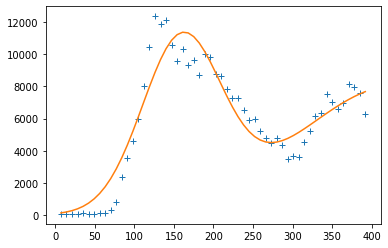

[10515.493253374463, 159.48531481444746, 50.00000000000002, 8081.742067195333, 433.45658420820575, 128.48464793149773]
Iteração: 1000


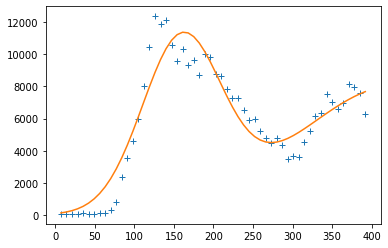

[10515.493253374507, 159.4853148978505, 50.00000000000001, 8081.742067195271, 433.4565842082042, 128.48464793149228]
[10515.493253374507, 159.4853148978505, 50.00000000000001, 8081.742067195271, 433.4565842082042, 128.48464793149228]
           w[0]        w[1]       w[2]         w[3]        w[4]        w[5]
0  10581.825354  159.471667  50.000000  7749.421819  420.318136  121.504559
1  10581.825399  159.471667  50.000000  7749.421840  420.318136  121.504559
2  10097.500998  160.000000  58.793243  9888.733084  471.186999  128.524109
3  10580.945357  159.470329  50.000000  7751.696014  420.426734  121.572591
4  10572.129337  159.460647  50.000000  7770.283265  421.372554  122.199661
5  10515.493253  159.485315  50.000000  8081.742067  433.456584  128.484648
Iteração: 200


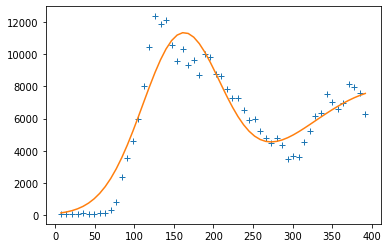

[10477.927816866995, 159.29598124274096, 50.00003964830432, 7837.366192594254, 425.9998555705269, 126.13963513403836]
Iteração: 400


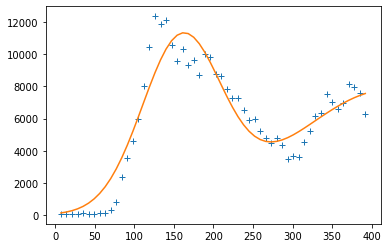

[10479.753002448413, 159.31305323605866, 50.00000002409864, 7816.100976133957, 424.75921485133796, 125.31711574665616]
Iteração: 600


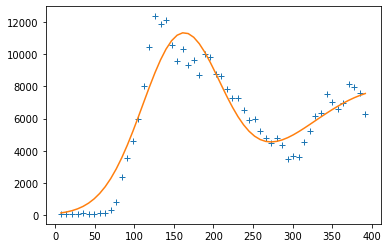

[10479.753019442624, 159.31305679885472, 50.00000000000003, 7816.090596910295, 424.75888494214576, 125.31700687658224]
Iteração: 800


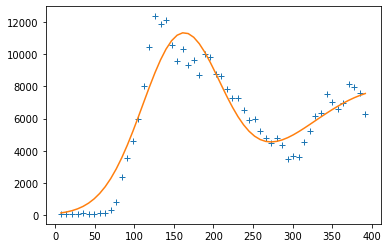

[10479.75301944268, 159.31305679885932, 50.0, 7816.09061501351, 424.75888494198915, 125.31700687430298]
Iteração: 1000


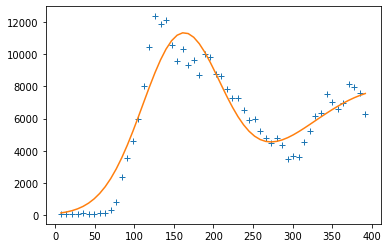

[10479.75301944268, 159.31305679885932, 50.0, 7816.09061501351, 424.75888494198915, 125.31700687430298]
[10479.75301944268, 159.31305679885932, 50.0, 7816.09061501351, 424.75888494198915, 125.31700687430298]
           w[0]        w[1]       w[2]         w[3]        w[4]        w[5]
0  10581.825354  159.471667  50.000000  7749.421819  420.318136  121.504559
1  10581.825399  159.471667  50.000000  7749.421840  420.318136  121.504559
2  10097.500998  160.000000  58.793243  9888.733084  471.186999  128.524109
3  10580.945357  159.470329  50.000000  7751.696014  420.426734  121.572591
4  10572.129337  159.460647  50.000000  7770.283265  421.372554  122.199661
5  10515.493253  159.485315  50.000000  8081.742067  433.456584  128.484648
6  10479.753019  159.313057  50.000000  7816.090615  424.758885  125.317007
Iteração: 200


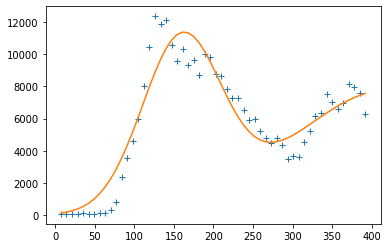

[10577.799355139943, 159.47298434647487, 50, 7772.795860081241, 421.23241322391533, 121.99174230261528]
Iteração: 400


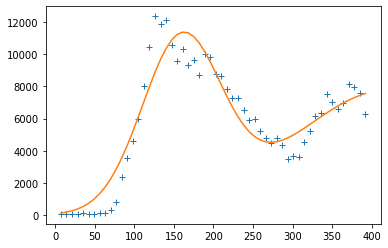

[10579.565459381834, 159.4726134568726, 50.000000002958394, 7759.632884458919, 420.7371009437082, 121.73283472128945]
Iteração: 600


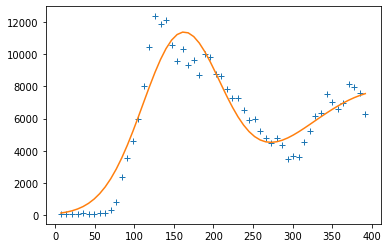

[10579.577623599545, 159.47257994960717, 50.000000000000014, 7759.631214312995, 420.73691370395153, 121.7327223363881]
Iteração: 800


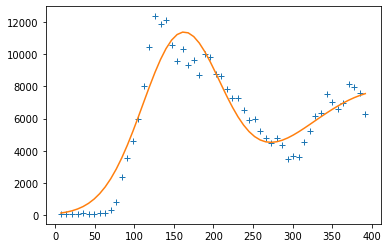

[10579.57761775658, 159.47257994922663, 50.00000000000001, 7759.631214311058, 420.736913703373, 121.73272233531955]
Iteração: 1000


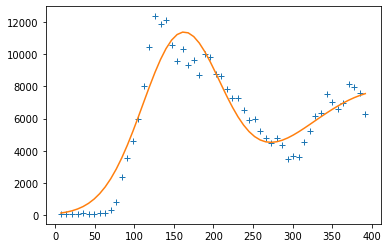

[10579.577638342564, 159.47257994920102, 50.0, 7759.631214310827, 420.7369137033287, 121.73272233521818]
[10579.577638342564, 159.47257994920102, 50.0, 7759.631214310827, 420.7369137033287, 121.73272233521818]
           w[0]        w[1]       w[2]         w[3]        w[4]        w[5]
0  10581.825354  159.471667  50.000000  7749.421819  420.318136  121.504559
1  10581.825399  159.471667  50.000000  7749.421840  420.318136  121.504559
2  10097.500998  160.000000  58.793243  9888.733084  471.186999  128.524109
3  10580.945357  159.470329  50.000000  7751.696014  420.426734  121.572591
4  10572.129337  159.460647  50.000000  7770.283265  421.372554  122.199661
5  10515.493253  159.485315  50.000000  8081.742067  433.456584  128.484648
6  10479.753019  159.313057  50.000000  7816.090615  424.758885  125.317007
7  10579.577638  159.472580  50.000000  7759.631214  420.736914  121.732722
Iteração: 200


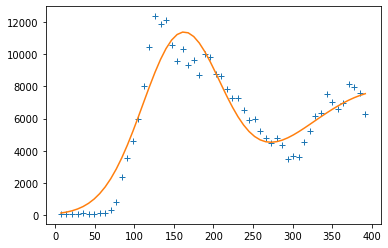

[10577.982088524972, 159.46569041211677, 50.000068011750386, 7753.4388964605405, 420.54969515846847, 121.77435990438596]
Iteração: 400


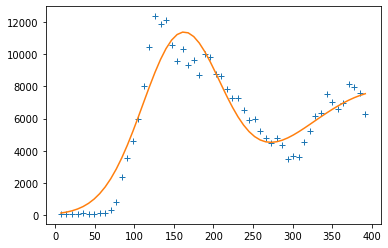

[10581.821455880177, 159.4716070847934, 50.0, 7749.4378957649615, 420.3187601856808, 121.5051181387936]
Iteração: 600


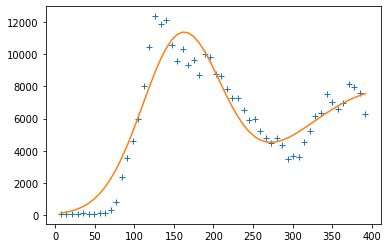

[10581.825353739956, 159.47166710943063, 50.0, 7749.421780081273, 420.31813623791487, 121.50456047424606]
Iteração: 800


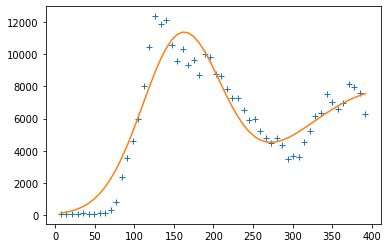

[10581.825367824287, 159.4716671250398, 50.00000000000001, 7749.421806033868, 420.31813536106546, 121.50455880923077]
Iteração: 1000


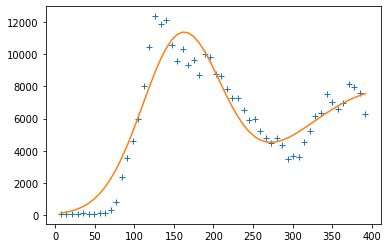

[10581.825367824287, 159.4716671250398, 50.00000000000001, 7749.421806033868, 420.31813536106546, 121.50455880923077]
[10581.825367824287, 159.4716671250398, 50.00000000000001, 7749.421806033868, 420.31813536106546, 121.50455880923077]
           w[0]        w[1]       w[2]         w[3]        w[4]        w[5]
0  10581.825354  159.471667  50.000000  7749.421819  420.318136  121.504559
1  10581.825399  159.471667  50.000000  7749.421840  420.318136  121.504559
2  10097.500998  160.000000  58.793243  9888.733084  471.186999  128.524109
3  10580.945357  159.470329  50.000000  7751.696014  420.426734  121.572591
4  10572.129337  159.460647  50.000000  7770.283265  421.372554  122.199661
5  10515.493253  159.485315  50.000000  8081.742067  433.456584  128.484648
6  10479.753019  159.313057  50.000000  7816.090615  424.758885  125.317007
7  10579.577638  159.472580  50.000000  7759.631214  420.736914  121.732722
8  10581.825368  159.471667  50.000000  7749.421806  420.318135  121.504559
Iter

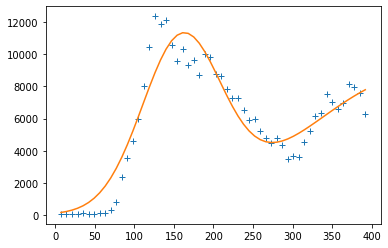

[10337.449074025672, 159.47993241422176, 50.000241721309756, 8756.570798436478, 461.9334701362693, 144.4556776193051]
Iteração: 400


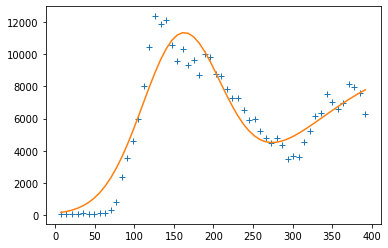

[10343.004511419924, 159.44259817407365, 50.0000000001051, 8737.030955865937, 461.30302671774103, 144.18726032163767]
Iteração: 600


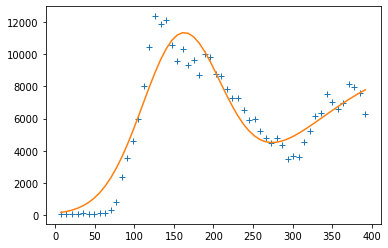

[10343.005700442189, 159.44260232883852, 50.0, 8737.030588994307, 461.3030266814771, 144.18726030313758]
Iteração: 800


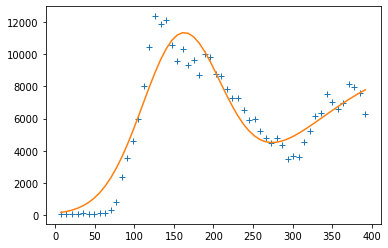

[10343.005682296778, 159.44260230273872, 50.0, 8737.030588991865, 461.30302668147607, 144.18726030313755]
Iteração: 1000


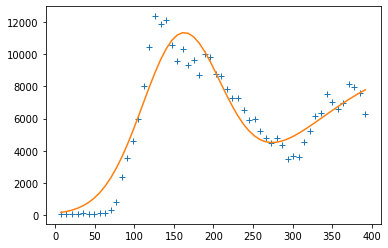

[10343.005682296778, 159.44260230273872, 50.0, 8737.030588991865, 461.30302668147607, 144.18726030313755]
[10343.005682296778, 159.44260230273872, 50.0, 8737.030588991865, 461.30302668147607, 144.18726030313755]
           w[0]        w[1]       w[2]         w[3]        w[4]        w[5]
0  10581.825354  159.471667  50.000000  7749.421819  420.318136  121.504559
1  10581.825399  159.471667  50.000000  7749.421840  420.318136  121.504559
2  10097.500998  160.000000  58.793243  9888.733084  471.186999  128.524109
3  10580.945357  159.470329  50.000000  7751.696014  420.426734  121.572591
4  10572.129337  159.460647  50.000000  7770.283265  421.372554  122.199661
5  10515.493253  159.485315  50.000000  8081.742067  433.456584  128.484648
6  10479.753019  159.313057  50.000000  7816.090615  424.758885  125.317007
7  10579.577638  159.472580  50.000000  7759.631214  420.736914  121.732722
8  10581.825368  159.471667  50.000000  7749.421806  420.318135  121.504559
9  10343.005682  159.442602 

<Figure size 432x288 with 0 Axes>

In [ ]:
#Old model:

x_dados = np.array(srag_deaths_data['semana_epidemiologica'])
y_dados = np.array(srag_deaths_data['casos'])

cost_func = rsme
objective_function_name = 'double_gaussian'

#leg: w[0]->height of the peak, w[1]->center position, w[2]->standard deviations
bounds = [(900,1e6), (1e-6,160), (50,150), (325,1e6), (225,500), (50,150)]

popsize = 60              #Tamanho da população (Artigo 10*n_parâmetros_do_modelo)
mutate = 0.2              #Fator de mutação [0,2]
recombination = 0.5       #Parâmetro de recombinação [0,1]
maxiter = 1000            #Número de gerações
plot_interval = 200       #plotar a cada...

res_srag_deaths_data = pd.DataFrame(columns=('w[0]','w[1]','w[2]','w[3]','w[4]','w[5]'))

for i in range(10):
    list_tmp = Differential_Evolution(cost_func, bounds, popsize, mutate, recombination, maxiter, x_dados, y_dados, plot_interval)
    print(list_tmp)

    res_srag_deaths_data = res_srag_deaths_data.append({'w[0]': list_tmp[0], 'w[1]': list_tmp[1],'w[2]': list_tmp[2], 'w[3]': list_tmp[3], 'w[4]': list_tmp[4], 'w[5]': list_tmp[5]}, ignore_index=True)
    print(res_srag_deaths_data)
    

In [ ]:
#Calculate the error generated by the parameters:

cost_function = 'double_gaussian'
x_dados = np.array(srag_deaths_data['semana_epidemiologica'])
y_dados = np.array(srag_deaths_data['casos'])

index_list_tmp = []
error_list_tmp = []
for i in range(len(res_srag_deaths_data)):
    
    tmp_list = []
    for j in range(len(res_srag_deaths_data.iloc[i])):
        tmp_list.append(res_srag_deaths_data.iloc[i][j])
    
    print(i, tmp_list)
    index_list_tmp.append(i)
    error_list_tmp.append(rsme(x_dados, y_dados, tmp_list))

for i in range(len(res_srag_deaths_data)):
    print(index_list_tmp[i], error_list_tmp[i])


0 [10581.825353912913, 159.47166718150484, 50.0, 7749.421819499938, 420.3181361527931, 121.50455941338761]
1 [10581.825399430512, 159.4716672103171, 50.0, 7749.421839620165, 420.318135928184, 121.50455897388879]
2 [10097.500997870708, 160.0, 58.79324283951443, 9888.733083544692, 471.18699931084063, 128.52410878339913]
3 [10580.945357079992, 159.47032913781675, 50.0, 7751.696013682334, 420.42673369535515, 121.57259146464085]
4 [10572.129337135051, 159.46064663282667, 50.00000000000001, 7770.283264677717, 421.37255386558564, 122.19966093630119]
5 [10515.493253374507, 159.4853148978505, 50.00000000000001, 8081.742067195271, 433.4565842082042, 128.48464793149228]
6 [10479.75301944268, 159.31305679885932, 50.0, 7816.09061501351, 424.75888494198915, 125.31700687430298]
7 [10579.577638342564, 159.47257994920102, 50.0, 7759.631214310827, 420.7369137033287, 121.73272233521818]
8 [10581.825367824287, 159.4716671250398, 50.00000000000001, 7749.421806033868, 420.31813536106546, 121.50455880923077]

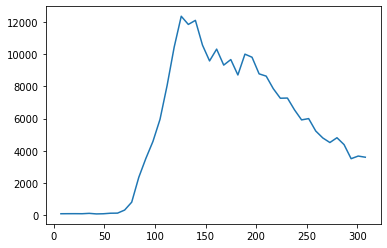

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp


Iteração: 500


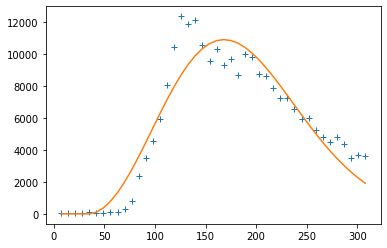

[0.006890975086864188, 3.0297115512855517, 0.08963296795963352, 158109.21647756454]
Iteração: 1000


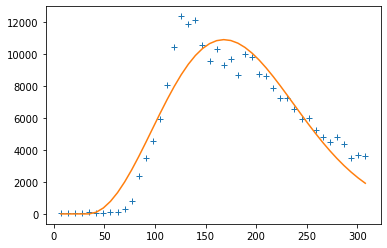

[0.006684772799301003, 3.0795862759860686, 0.09102778770352518, 160508.86670453806]
Iteração: 1500


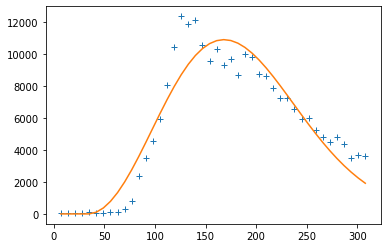

[0.0067842344129294884, 3.056375262103531, 0.09035431006773582, 159322.83238783403]
Iteração: 2000


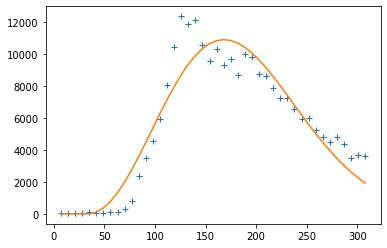

[0.006692325213529584, 3.077261196798351, 0.09097261296732428, 160413.19155935344]
Iteração: 2500


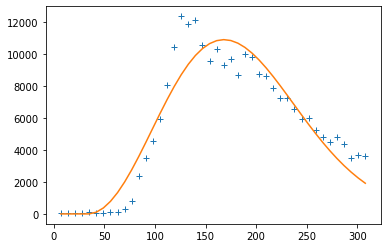

[0.006780400492679698, 3.057190669337495, 0.09037971977326528, 159367.13754324103]
Iteração: 3000


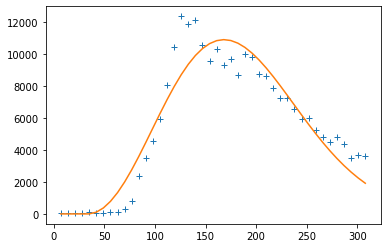

[0.006788208188275551, 3.0554380195539377, 0.09032773209798678, 159275.49567668003]
[0.006788208188275551, 3.0554380195539377, 0.09032773209798678, 159275.49567668003]


<Figure size 432x288 with 0 Axes>

In [ ]:
#Fit the first wave with the new model:

srag_deaths_data_tmp = srag_deaths_data.copy()

for i in range(len(srag_deaths_data_tmp)): 
    if i > 43: srag_deaths_data_tmp.drop([i], inplace=True)

x_dados = np.array(srag_deaths_data_tmp['semana_epidemiologica'])
y_dados = np.array(srag_deaths_data_tmp['casos'])

plt.plot(x_dados, y_dados)
plt.show()

cost_func = rsme
objective_function_name = 'single_maxwell_boltzmann'

bounds = [(0.,1e-1), (0.,50), (1e-2,1), (1e1,1e7)]

popsize = 40              #Tamanho da população (Artigo 10*n_parâmetros_do_modelo)
mutate = 0.5              #Fator de mutação [0,2]
recombination = 0.4       #Parâmetro de recombinação [0,1]
maxiter = 3000            #Número de gerações
plot_interval = 500       #plotar a cada...

for i in range(1):
    list_tmp = Differential_Evolution(cost_func, bounds, popsize, mutate, recombination, maxiter, x_dados, y_dados, plot_interval)
    print(list_tmp)


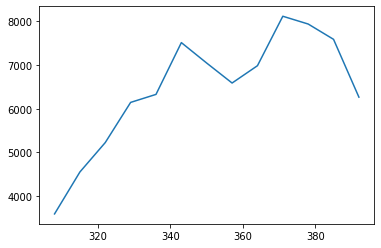

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:45: RuntimeWarning: overflow encountered in exp


Iteração: 500


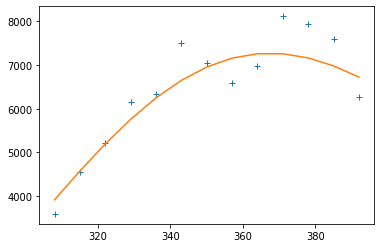

[0.0011427706898535046, 60.70422968095528, 0.2456961023928038, 259013.42296041193]
Iteração: 1000


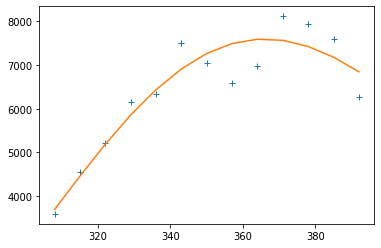

[9.517379645100543e-05, 238.20601739336735, 0.9308425596432242, 937702.1662297149]
Iteração: 1500


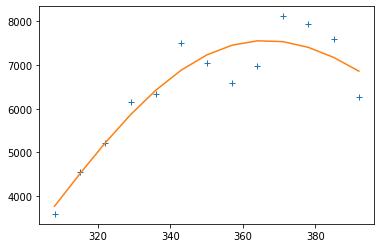

[0.0001188518627554535, 207.19769694820766, 0.8159320285182432, 835275.9663851152]
Iteração: 2000


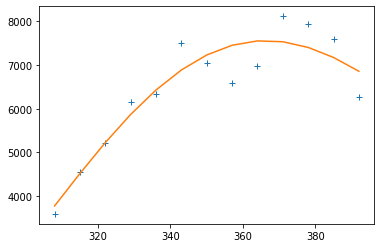

[0.0001208431367567175, 205.23612284202997, 0.8085567635146383, 828104.2407300011]
Iteração: 2500


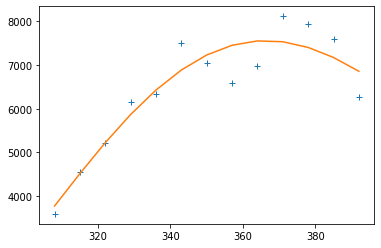

[0.0001233909529059729, 203.17683560641822, 0.8003665988343363, 819502.0959314851]
Iteração: 3000


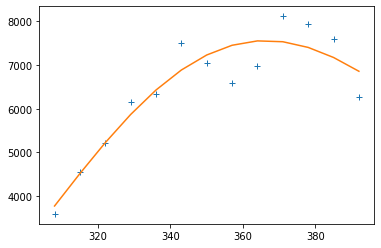

[0.00012448899097475524, 202.2701399642217, 0.7968007037087501, 815909.4556406954]
[0.00012448899097475524, 202.2701399642217, 0.7968007037087501, 815909.4556406954]


<Figure size 432x288 with 0 Axes>

In [ ]:
#Fit the second wave with the new model:

srag_deaths_data_tmp = srag_deaths_data.copy()

for i in range(len(srag_deaths_data_tmp)): 
    if i < 43: srag_deaths_data_tmp.drop([i], inplace=True)

x_dados = np.array(srag_deaths_data_tmp['semana_epidemiologica'])
y_dados = np.array(srag_deaths_data_tmp['casos'])

plt.plot(x_dados, y_dados)
plt.show()

cost_func = rsme
objective_function_name = 'single_maxwell_boltzmann'

bounds = [(0.,1e-1), (8.0554380195539377,500), (1e-2,1), (1e1,1e7)]

popsize = 40              #Tamanho da população (Artigo 10*n_parâmetros_do_modelo)
mutate = 0.5              #Fator de mutação [0,2]
recombination = 0.4       #Parâmetro de recombinação [0,1]
maxiter = 3000            #Número de gerações
plot_interval = 500       #plotar a cada...

for i in range(1):
    list_tmp = Differential_Evolution(cost_func, bounds, popsize, mutate, recombination, maxiter, x_dados, y_dados, plot_interval)
    print(list_tmp)


In [ ]:
#Adjusting the two waves at the same time with the new model:

x_dados = np.array(srag_deaths_data['semana_epidemiologica'])
y_dados = np.array(srag_deaths_data['casos'])

cost_func = rsme
objective_function_name = 'dist_maxwell_boltzmann'

#Parameters based on the predecessor runs:
#wave_1: [0.006788208188275551, 3.0554380195539377, 0.09032773209798678, 159275.49567668003]
#wave_2: [0.00012448899097475524, 202.2701399642217, 0.7968007037087501, 815909.4556406954]
bounds = [(0.0062,0.0082),
          (2.5,5.0),
          (0.085,0.15),
          (100000.,200000.),
          (0.00002,0.00017),
          (130.,250.),
          (0.69,0.84),
          (760000.,1560000.)]
'''
[0.0072, 3.5, 0.09312803707856981, 157033.3604076302,
 0.00010214315232938958, 182.8344965697113, 0.74, 860000.0]

[0.007604647426947762, 4.0, 0.095, 155473.9855742585, 
9.121786577372378e-05, 161.17109196917534, 0.69, 909999.6944839815]

[0.006950806262779689, 4.1852332138959305, 0.09932392267968207, 162817.7474212732, 
8.967506444391109e-05, 176.39207943608704, 0.7412758147350427, 910000.0]

[0.006970299623996476, 4.2075962328557175, 0.09957067236486675, 
162483.36837282614, 8.082790184499547e-05, 172.50439814955087, 0.74, 960000.0]

[0.007354919064971596, 4.392414596307345, 0.09963058749205918, 159156.37813245627, 
7.285327565978482e-05, 151.0501101291366, 0.69, 1010000.0]

[0.007582431898545551, 4.161149589871754, 0.09659309472092797, 156212.9799245837, 
7e-05, 167.85221606598634, 0.74, 1049833.2814555783]

[0.007688505898016063, 4.463587099212031, 0.09973192950150046, 154910.72976921967, 
3.7873874292978877e-05, 150.0, 0.7628251616830027, 1472759.8418196733]

[0.0077, 4.5, 0.1, 155429.21881051234, 
3.6522595574879995e-05, 145.0, 0.7519315629109542, 1510000.0]

[0.007965830434181663, 4.629604506371672, 0.1, 153955.36728912208, 
3.816499980449387e-05, 140.0, 0.7273585512633065, 1516950.3569648336]

[0.007632057991231712, 4.978910279586291, 0.10451227913790068, 156317.6442831405, 
3.4062023797135866e-05, 135.0, 0.758545869851931, 1471009.347411626]

'''
popsize = 80              #Tamanho da população (Artigo 10*n_parâmetros_do_modelo)
mutate = 0.5              #Fator de mutação [0,2]
recombination = 0.4       #Parâmetro de recombinação [0,1]
maxiter = 1000            #Número de gerações
plot_interval = 200        #plotar a cada...

res_srag_deaths_data = pd.DataFrame(columns=('w[0]','w[1]','w[2]','w[3]','w[4]','w[5]','w[6]','w[7]'))

for i in range(1):
    list_tmp = Differential_Evolution(cost_func, bounds, popsize, mutate, recombination, maxiter, x_dados, y_dados, plot_interval)
    print(list_tmp)

    res_srag_deaths_data = res_srag_deaths_data.append({'w[0]': list_tmp[0], 'w[1]': list_tmp[1],'w[2]': list_tmp[2], 'w[3]': list_tmp[3], 'w[4]': list_tmp[4], 'w[5]': list_tmp[5], 'w[6]': list_tmp[6], 'w[7]': list_tmp[7]}, ignore_index=True)
    print(res_srag_deaths_data)


In [ ]:
#Calculate the error generated by the parameters:

cost_function = 'single_maxwell_boltzmann'
x_dados = np.array(srag_deaths_data['semana_epidemiologica'])
y_dados = np.array(srag_deaths_data['casos'])

tmp_list = [0.007632057991231712, 4.978910279586291, 0.10451227913790068, 156317.6442831405, 
            3.4062023797135866e-05, 135.0, 0.758545869851931, 1471009.347411626]

print(list_tmp, '\n', rsme(x_dados, y_dados, tmp_list))

print('How much the new model is better than the old parameters: ', 100-rsme(x_dados, y_dados, tmp_list)*100/1151.3792379178592, '%')

'''
[10581.825353912913, 159.47166718150484, 50.0, 7749.421819499938, 420.3181361527931, 121.50455941338761]
1151.3792379178592
'''

[0.0082, 4.9755094222110845, 0.10234408751171206, 152187.45932695107, 3.2042308442907794e-05, 130.0, 0.7473474851802547, 1560000.0] 
 946.3556137946266
How much the new model is better than the old parameters:  17.80678488644584 %


'\n[10581.825353912913, 159.47166718150484, 50.0, 7749.421819499938, 420.3181361527931, 121.50455941338761]\n1151.3792379178592\n'

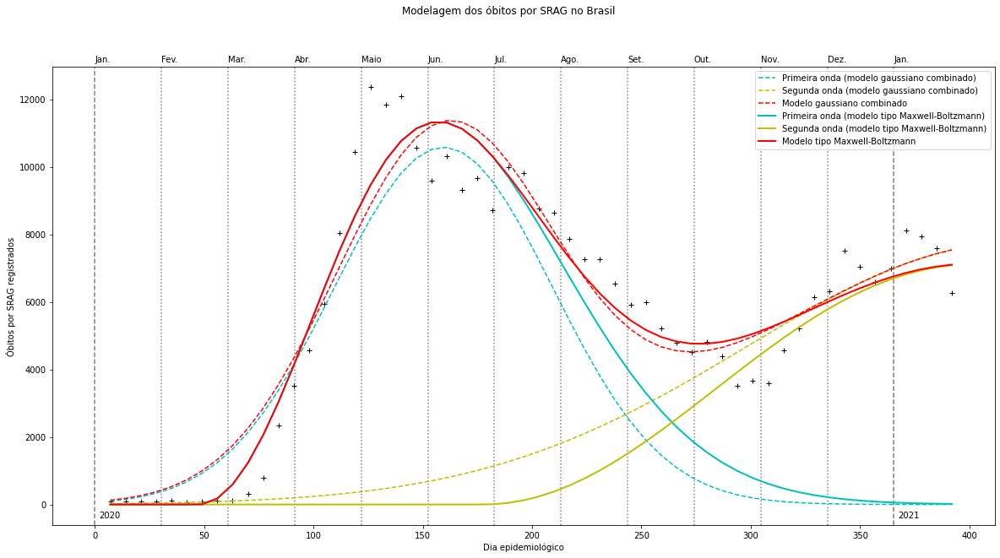

In [ ]:
#Plot the fitting and forecast of the models:

plt.figure(figsize=(20,10))
plt.ylabel('Óbitos por SRAG registrados')
plt.xlabel('Dia epidemiológico')
plt.suptitle('Modelagem dos óbitos por SRAG no Brasil')

future_dias=[]
dia_inicial=1.
for i in range(len(srag_deaths_data['semana_epidemiologica'])):
    future_dias.append(dia_inicial)
    dia_inicial+=1

initial_day = 0
month_tmp = 0
year_tmp = '202'
cont = 0
months = ['Jan.', 'Fev.', 'Mar.', 'Abr.', 'Maio', 'Jun.', 'Jul.', 'Ago.',
          'Set.', 'Out.', 'Nov.', 'Dez.', 'Jan.', 'Fev.', 'Mar.', 'Abr.', 
          'Maio', 'Jun.', 'Jul.', 'Ago.', 'Set.', 'Out.', 'Nov.', 'Dez.',
          'Jan.', 'Fev.', 'Mar.', 'Abr.', 'Maio', 'Jun.', 'Jul.', 'Ago.',
          'Set.', 'Out.', 'Nov.', 'Dez.']
while initial_day < len(future_dias)*7:
    if initial_day >= 0:
        if months[int(month_tmp)]=='Jan.':
            plt.text(initial_day, 13100, months[int(month_tmp)], rotation=0)
            plt.text(initial_day+2, -400, year_tmp+str(cont), rotation=0)
            plt.axvline(initial_day, color="grey", linestyle="--")
            cont+=1
        else:
            plt.text(initial_day, 13100, months[int(month_tmp)], rotation=0)
            plt.axvline(initial_day, color="grey", linestyle=":")
    initial_day+=30.4583333
    month_tmp+=1.

plt.plot(srag_deaths_data['semana_epidemiologica'], srag_deaths_data['casos'], 'k+')

#Old model:

tmp_list = []
for i in range(len(srag_deaths_data['semana_epidemiologica'])): 
    tmp_list.append(single_gaussian(srag_deaths_data['semana_epidemiologica'].iloc[i],
                                    [10581.825353912913, 
                                     159.47166718150484, 
                                     50.0]))
plt.plot(srag_deaths_data['semana_epidemiologica'], tmp_list, 'c--',
         label='Primeira onda (modelo gaussiano combinado)')

tmp_list = []
for i in range(len(srag_deaths_data['semana_epidemiologica'])): 
    tmp_list.append(single_gaussian(srag_deaths_data['semana_epidemiologica'].iloc[i],
                                    [7749.421819499938, 
                                     420.3181361527931, 
                                     121.50455941338761]))
plt.plot(srag_deaths_data['semana_epidemiologica'], tmp_list, 'y--',
         label='Segunda onda (modelo gaussiano combinado)')

tmp_list = []
for i in range(len(srag_deaths_data['semana_epidemiologica'])): 
    tmp_list.append(double_gaussian(srag_deaths_data['semana_epidemiologica'].iloc[i],
                                    [10581.825353912913, 
                                     159.47166718150484, 
                                     50.0, 
                                     7749.421819499938, 
                                     420.3181361527931, 
                                     121.50455941338761]
))
plt.plot(srag_deaths_data['semana_epidemiologica'], tmp_list, 'r--',
         label='Modelo gaussiano combinado')

#New model:

plt.plot(srag_deaths_data['semana_epidemiologica'],
         single_maxwell_boltzmann(srag_deaths_data['semana_epidemiologica'],
                                [0.007632057991231712, 
                                 4.978910279586291, 
                                 0.10451227913790068, 
                                 156317.6442831405]),
          'c', linewidth=2., label='Primeira onda (modelo tipo Maxwell-Boltzmann)')

plt.plot(srag_deaths_data['semana_epidemiologica'],
         single_maxwell_boltzmann(srag_deaths_data['semana_epidemiologica'],
                                [3.4062023797135866e-05, 
                                 135.0, 
                                 0.758545869851931, 
                                 1471009.347411626]),
          'y', linewidth=2., label='Segunda onda (modelo tipo Maxwell-Boltzmann)')

plt.plot(srag_deaths_data['semana_epidemiologica'],
         dist_maxwell_boltzmann(srag_deaths_data['semana_epidemiologica'],
                                [0.007632057991231712, 
                                 4.978910279586291, 
                                 0.10451227913790068, 
                                 156317.6442831405, 
                                 3.4062023797135866e-05, 
                                 135.0, 
                                 0.758545869851931, 
                                 1471009.347411626]),
          'r', linewidth=2., label='Modelo tipo Maxwell-Boltzmann')

plt.legend(loc=1)

plt.show()


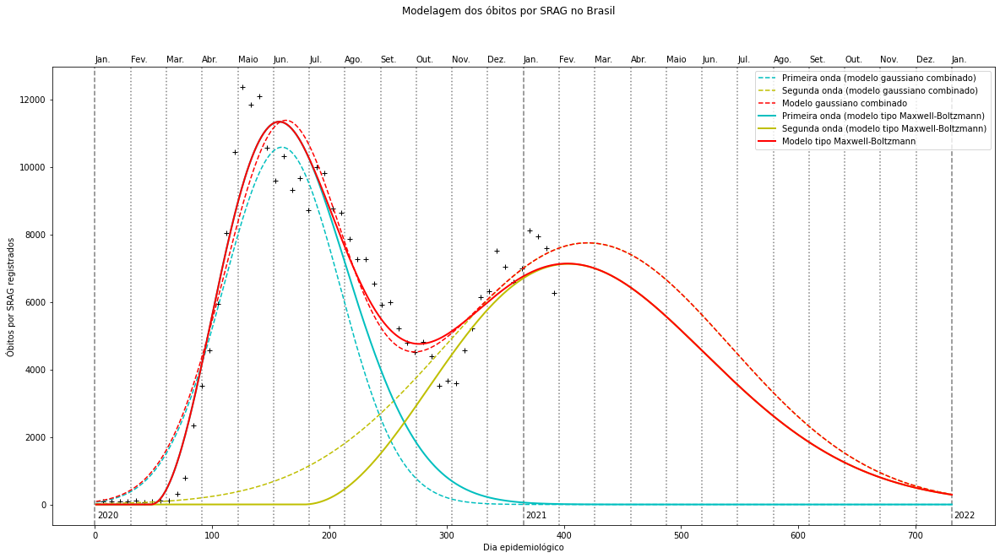

In [ ]:
#Plot the fitting and forecast of the models:

plt.figure(figsize=(20,10))
plt.ylabel('Óbitos por SRAG registrados')
plt.xlabel('Dia epidemiológico')
plt.suptitle('Modelagem dos óbitos por SRAG no Brasil')

future_dias=[]
dia_inicial=1.
for i in range(731):
    future_dias.append(dia_inicial)
    dia_inicial+=1

initial_day = 0
month_tmp = 0
year_tmp = '202'
cont = 0
months = ['Jan.', 'Fev.', 'Mar.', 'Abr.', 'Maio', 'Jun.', 'Jul.', 'Ago.',
          'Set.', 'Out.', 'Nov.', 'Dez.', 'Jan.', 'Fev.', 'Mar.', 'Abr.', 
          'Maio', 'Jun.', 'Jul.', 'Ago.', 'Set.', 'Out.', 'Nov.', 'Dez.',
          'Jan.', 'Fev.', 'Mar.', 'Abr.', 'Maio', 'Jun.', 'Jul.', 'Ago.',
          'Set.', 'Out.', 'Nov.', 'Dez.']
while initial_day < len(future_dias):
    if initial_day >= 0:
        if months[int(month_tmp)]=='Jan.':
            plt.text(initial_day, 13100, months[int(month_tmp)], rotation=0)
            plt.text(initial_day+2, -400, year_tmp+str(cont), rotation=0)
            plt.axvline(initial_day, color="grey", linestyle="--")
            cont+=1
        else:
            plt.text(initial_day, 13100, months[int(month_tmp)], rotation=0)
            plt.axvline(initial_day, color="grey", linestyle=":")
    initial_day+=30.4583333
    month_tmp+=1.

plt.plot(srag_deaths_data['semana_epidemiologica'], srag_deaths_data['casos'], 'k+')

#Old model:

tmp_list = []
for i in range(len(future_dias)): 
    tmp_list.append(single_gaussian(future_dias[i],
                                    [10581.825353912913, 
                                     159.47166718150484, 
                                     50.0]))
plt.plot(future_dias, tmp_list, 'c--',
         label='Primeira onda (modelo gaussiano combinado)')

tmp_list = []
for i in range(len(future_dias)): 
    tmp_list.append(single_gaussian(future_dias[i],
                                    [7749.421819499938, 
                                     420.3181361527931, 
                                     121.50455941338761]))
plt.plot(future_dias, tmp_list, 'y--',
         label='Segunda onda (modelo gaussiano combinado)')

tmp_list = []
for i in range(len(future_dias)): 
    tmp_list.append(double_gaussian(future_dias[i],
                                    [10581.825353912913, 
                                     159.47166718150484, 
                                     50.0, 
                                     7749.421819499938, 
                                     420.3181361527931, 
                                     121.50455941338761]))
plt.plot(future_dias, tmp_list, 'r--',
         label='Modelo gaussiano combinado')

#New model:

plt.plot(future_dias,
         single_maxwell_boltzmann(future_dias,
                                [0.007632057991231712, 
                                 4.978910279586291, 
                                 0.10451227913790068, 
                                 156317.6442831405]),
          'c', linewidth=2., label='Primeira onda (modelo tipo Maxwell-Boltzmann)')

plt.plot(future_dias,
         single_maxwell_boltzmann(future_dias,
                                [3.4062023797135866e-05, 
                                 135.0, 
                                 0.758545869851931, 
                                 1471009.347411626]),
          'y', linewidth=2., label='Segunda onda (modelo tipo Maxwell-Boltzmann)')

plt.plot(future_dias,
         dist_maxwell_boltzmann(future_dias,
                                [0.007632057991231712, 
                                 4.978910279586291, 
                                 0.10451227913790068, 
                                 156317.6442831405, 
                                 3.4062023797135866e-05, 
                                 135.0, 
                                 0.758545869851931, 
                                 1471009.347411626]),
          'r', linewidth=2., label='Modelo tipo Maxwell-Boltzmann')

plt.legend(loc=1)

plt.show()


NORMALIZATED MEAN CURVE:

In [ ]:
#Obtaining the maximum of the curves

future_dias=[]
dia_inicial=1.
for i in range(731):
    future_dias.append(dia_inicial)
    dia_inicial+=1

#COVID-19 cases:
tmp_list = dist_maxwell_boltzmann(future_dias,
                                [0.002519175254412616, 6.919020112887907, 
                                 0.17398167849936405, 1008987.4055077373, 
                                 0.001818785868684889, 34.37533570419683, 
                                 0.16542532368614984, 1445121.5038530985])
tmp_max = max(tmp_list)
for i in range(len(tmp_list)): 
    if tmp_list[i]==tmp_max: tmp_index = i
print('Max covid19_cases: ', tmp_max, '; Max covid19_cases index: ', tmp_index)

#COVID-19 deaths:
tmp_list = dist_maxwell_boltzmann(future_dias,
                                [0.0053, 1.2474932472517994, 
                                 0.1086371446294625, 18428.002768579034,
                                 0.0005852891729905905, 46.24774648143824, 
                                 0.22220572059893762, 61367.647972351995])
tmp_max = max(tmp_list)
for i in range(len(tmp_list)): 
    if tmp_list[i]==tmp_max: tmp_index = i
print('Max covid19_deaths: ', tmp_max, '; Max covid19_deaths index: ', tmp_index)

#SRAG cases:
tmp_list = dist_maxwell_boltzmann(future_dias,
                                [0.013278519965964498, 2.0299787917918586, 
                                 0.06114290723983892, 384202.7154655281, 
                                 0.00038, 68.036477337472, 
                                 0.2963943512769163, 1909474.100763769])
tmp_max = max(tmp_list)
for i in range(len(tmp_list)): 
    if tmp_list[i]==tmp_max: tmp_index = i
print('Max srag_cases: ', tmp_max, '; Max srag_cases index: ', tmp_index)

#SRAG deaths:
tmp_list = dist_maxwell_boltzmann(future_dias,
                                [0.007632057991231712, 4.978910279586291, 
                                 0.10451227913790068, 156317.6442831405, 
                                 3.4062023797135866e-05, 135.0, 
                                 0.758545869851931, 1471009.347411626])
tmp_max = max(tmp_list)
for i in range(len(tmp_list)): 
    if tmp_list[i]==tmp_max: tmp_index = i
print('Max srag_deaths: ', tmp_max, '; Max srag_deaths index: ', tmp_index)


Max covid19_cases:  51748.87356566221 ; Max covid19_cases index:  346
Max covid19_deaths:  1235.5500775896278 ; Max covid19_deaths index:  392
Max srag_cases:  36755.73276586548 ; Max srag_cases index:  174
Max srag_deaths:  11337.504021859022 ; Max srag_deaths index:  156


In [ ]:
#Calculate the maximuns of the second wave:

future_dias=[]
dia_inicial=300.
for i in range(731):
    future_dias.append(dia_inicial)
    dia_inicial+=1

#COVID-19 cases:
tmp_list = dist_maxwell_boltzmann(future_dias,
                                [0.002519175254412616, 6.919020112887907, 
                                 0.17398167849936405, 1008987.4055077373, 
                                 0.001818785868684889, 34.37533570419683, 
                                 0.16542532368614984, 1445121.5038530985])
tmp_max = max(tmp_list)
for i in range(len(tmp_list)): 
    if tmp_list[i]==tmp_max: tmp_index = i
print('Max covid19_cases on the second wave: ', tmp_max, '; Max covid19_cases index: ', tmp_index+300+59)

#COVID-19 deaths:
tmp_list = dist_maxwell_boltzmann(future_dias,
                                [0.0053, 1.2474932472517994, 
                                 0.1086371446294625, 18428.002768579034,
                                 0.0005852891729905905, 46.24774648143824, 
                                 0.22220572059893762, 61367.647972351995])
tmp_max = max(tmp_list)
for i in range(len(tmp_list)): 
    if tmp_list[i]==tmp_max: tmp_index = i
print('Max covid19_deaths on the second wave: ', tmp_max, '; Max covid19_deaths index: ', tmp_index+300+59)

#SRAG cases:
tmp_list = dist_maxwell_boltzmann(future_dias,
                                [0.013278519965964498, 2.0299787917918586, 
                                 0.06114290723983892, 384202.7154655281, 
                                 0.00038, 68.036477337472, 
                                 0.2963943512769163, 1909474.100763769])
tmp_max = max(tmp_list)
for i in range(len(tmp_list)): 
    if tmp_list[i]==tmp_max: tmp_index = i
print('Max srag_cases on the second wave: ', tmp_max, '; Max srag_cases index: ', tmp_index+300)

#SRAG deaths:
tmp_list = dist_maxwell_boltzmann(future_dias,
                                [0.007632057991231712, 4.978910279586291, 
                                 0.10451227913790068, 156317.6442831405, 
                                 3.4062023797135866e-05, 135.0, 
                                 0.758545869851931, 1471009.347411626])
tmp_max = max(tmp_list)
for i in range(len(tmp_list)): 
    if tmp_list[i]==tmp_max: tmp_index = i
print('Max srag_deaths on the second wave: ', tmp_max, '; Max srag_deaths index: ', tmp_index+300)


Max covid19_cases on the second wave:  51748.87356566221 ; Max covid19_cases index:  406
Max covid19_deaths on the second wave:  1235.5500775896278 ; Max covid19_deaths index:  452
Max srag_cases on the second wave:  31759.833459854333 ; Max srag_cases index:  396
Max srag_deaths on the second wave:  7136.055022557952 ; Max srag_deaths index:  403


In [1]:
(406+452+396+403)/4

414.25

In [106]:
#Calculate the end of the pandemic:

future_dias=[]
dia_inicial=300.
for i in range(2000):
    future_dias.append(dia_inicial)
    dia_inicial+=1

#COVID-19 cases:
tmp_index=-1000
tmp_list = dist_maxwell_boltzmann(future_dias,
                                [0.002519175254412616, 6.919020112887907, 
                                 0.17398167849936405, 1008987.4055077373, 
                                 0.001818785868684889, 34.37533570419683, 
                                 0.16542532368614984, 1445121.5038530985])
for i in range(len(tmp_list)): 
    if tmp_list[i]<1: tmp_index = i; break
print('Fim dos casos de covid: ', tmp_index+300+59)

#COVID-19 deaths:
tmp_index=-1000
tmp_list = dist_maxwell_boltzmann(future_dias,
                                [0.0053, 1.2474932472517994, 
                                 0.1086371446294625, 18428.002768579034,
                                 0.0005852891729905905, 46.24774648143824, 
                                 0.22220572059893762, 61367.647972351995])
for i in range(len(tmp_list)): 
    if tmp_list[i]<1: tmp_index = i; break
print('Fim dos casos de morte por covid: ', tmp_index+300+59)

#SRAG cases:
tmp_index=-1000
tmp_list = dist_maxwell_boltzmann(future_dias,
                                [0.013278519965964498, 2.0299787917918586, 
                                 0.06114290723983892, 384202.7154655281, 
                                 0.00038, 68.036477337472, 
                                 0.2963943512769163, 1909474.100763769])
for i in range(len(tmp_list)): 
    if tmp_list[i]<1: tmp_index = i; break
print('Fim dos casos de SRAG: ', tmp_index+300)

#SRAG deaths:
tmp_index=-1000
tmp_list = dist_maxwell_boltzmann(future_dias,
                                [0.007632057991231712, 4.978910279586291, 
                                 0.10451227913790068, 156317.6442831405, 
                                 3.4062023797135866e-05, 135.0, 
                                 0.758545869851931, 1471009.347411626])
for i in range(len(tmp_list)): 
    if tmp_list[i]<1: tmp_index = i; break
print('Fim dos casos de morte por SRAG: ', tmp_index+300)


Fim dos casos de covid:  807
Fim dos casos de morte por covid:  359
Fim dos casos de SRAG:  877
Fim dos casos de morte por SRAG:  974


In [2]:
(807+869+877+974)/4

881.75

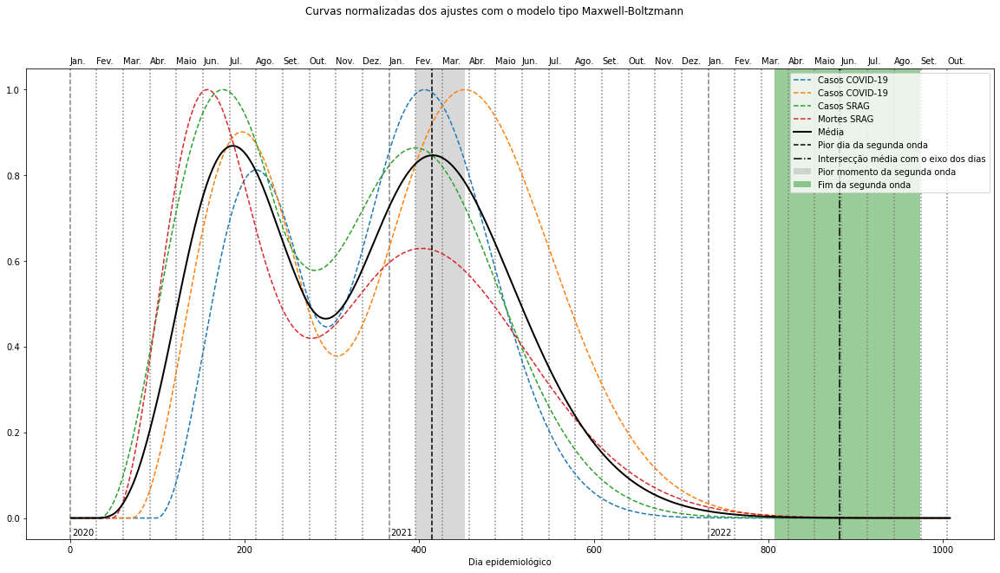

In [99]:
#Ploting the normalized curve

plt.figure(figsize=(20,10))

plt.xlabel('Dia epidemiológico')
plt.suptitle('Curvas normalizadas dos ajustes com o modelo tipo Maxwell-Boltzmann')

future_dias=[]
dia_inicial=1.
for i in range(1008):
    future_dias.append(dia_inicial)
    dia_inicial+=1

initial_day = 0
month_tmp = 0
year_tmp = '202'
cont = 0
months = ['Jan.', 'Fev.', 'Mar.', 'Abr.', 'Maio', 'Jun.', 'Jul.', 'Ago.',
          'Set.', 'Out.', 'Nov.', 'Dez.', 'Jan.', 'Fev.', 'Mar.', 'Abr.', 
          'Maio', 'Jun.', 'Jul.', 'Ago.', 'Set.', 'Out.', 'Nov.', 'Dez.',
          'Jan.', 'Fev.', 'Mar.', 'Abr.', 'Maio', 'Jun.', 'Jul.', 'Ago.',
          'Set.', 'Out.', 'Nov.', 'Dez.']
while initial_day < len(future_dias):
    if initial_day >= 0:
        if months[int(month_tmp)]=='Jan.':
            plt.text(initial_day, 1.06, months[int(month_tmp)], rotation=0)
            plt.text(initial_day+2, -0.04, year_tmp+str(cont), rotation=0)
            plt.axvline(initial_day, color="grey", linestyle="--")
            cont+=1
        else:
            plt.text(initial_day, 1.06, months[int(month_tmp)], rotation=0)
            plt.axvline(initial_day, color="grey", linestyle=":")
    initial_day+=30.4583333
    month_tmp+=1.

tmp_list = dist_maxwell_boltzmann(future_dias,   
                                [0.002519175254412616, 6.919020112887907, 
                                 0.17398167849936405, 1008987.4055077373, 
                                 0.001818785868684889, 34.37533570419683, 
                                 0.16542532368614984, 1445121.5038530985])
tmp_list_1=[]
for i in range(len(future_dias)): 
    if i >= 59: tmp_list_1.append(tmp_list[i-59])
    else: tmp_list_1.append(0)
for i in range(len(tmp_list_1)): tmp_list_1[i]=tmp_list_1[i]/51748.87356566221
plt.plot(future_dias, tmp_list_1, '--', label='Casos COVID-19')

tmp_list = dist_maxwell_boltzmann(future_dias,   
                                [0.0053, 1.2474932472517994, 
                                 0.1086371446294625, 18428.002768579034,
                                 0.0005852891729905905, 46.24774648143824, 
                                 0.22220572059893762, 61367.647972351995])
tmp_list_2=[]
for i in range(len(future_dias)): 
    if i >= 59: tmp_list_2.append(tmp_list[i-59])
    else: tmp_list_2.append(0)
for i in range(len(tmp_list_2)): tmp_list_2[i]=tmp_list_2[i]/1235.5500775896278
plt.plot(future_dias, tmp_list_2, '--', label='Casos COVID-19')

tmp_list_3 = dist_maxwell_boltzmann(future_dias,
                                [0.013278519965964498, 2.0299787917918586, 
                                 0.06114290723983892, 384202.7154655281, 
                                 0.00038, 68.036477337472, 
                                 0.2963943512769163, 1909474.100763769])
for i in range(len(tmp_list_3)): tmp_list_3[i]=tmp_list_3[i]/36755.73276586548
plt.plot(future_dias, tmp_list_3, '--', label='Casos SRAG')

tmp_list_4 = dist_maxwell_boltzmann(future_dias,
                                [0.007632057991231712, 4.978910279586291, 
                                 0.10451227913790068, 156317.6442831405, 
                                 3.4062023797135866e-05, 135.0, 
                                 0.758545869851931, 1471009.347411626])
for i in range(len(tmp_list_4)): tmp_list_4[i]=tmp_list_4[i]/11337.504021859022
plt.plot(future_dias, tmp_list_4, '--', label='Mortes SRAG')

tmp_list = []
for i in range(len(future_dias)): tmp_list.append((tmp_list_1[i]+tmp_list_2[i]+tmp_list_3[i]+tmp_list_4[i])/4.)
plt.plot(future_dias, tmp_list, color='k', label='Média', linewidth=2.)

plt.axvline((406+452+396+403)/4., color='k', linestyle='--', label='Pior dia da segunda onda')
plt.axvspan(396, 452, facecolor='0.7', alpha=0.5, label='Pior momento da segunda onda')

plt.axvline((807+869+877+974)/4., color='k', linestyle='dashdot', label='Intersecção média com o eixo dos dias')
plt.axvspan(807, 974, facecolor='g', alpha=0.4, label='Fim da segunda onda')

plt.legend(loc=1)

plt.show()


In [127]:
#Calculating the sum of the fitted curves:

#Obtaining the maximum of the curves

future_dias=[]
dia_inicial=1.
for i in range(1000):
    future_dias.append(dia_inicial)
    dia_inicial+=1

#COVID-19 cases:
tmp_list = dist_maxwell_boltzmann(future_dias,
                                [0.002519175254412616, 6.919020112887907, 
                                 0.17398167849936405, 1008987.4055077373, 
                                 0.001818785868684889, 34.37533570419683, 
                                 0.16542532368614984, 1445121.5038530985])
cases_sum = 0.
for i in range(len(tmp_list)-59): cases_sum+=tmp_list[i]
print('COVID-19 total cases: ', cases_sum)

#COVID-19 deaths:
tmp_list = dist_maxwell_boltzmann(future_dias,
                                [0.0053, 1.2474932472517994, 
                                 0.1086371446294625, 18428.002768579034,
                                 0.0005852891729905905, 46.24774648143824, 
                                 0.22220572059893762, 61367.647972351995])
deaths_sum = 0.
for i in range(len(tmp_list)-59): deaths_sum+=tmp_list[i]
print('COVID-19 total deaths: ', deaths_sum)

#SRAG cases:
tmp_list = dist_maxwell_boltzmann(future_dias,
                                [0.013278519965964498, 2.0299787917918586, 
                                 0.06114290723983892, 384202.7154655281, 
                                 0.00038, 68.036477337472, 
                                 0.2963943512769163, 1909474.100763769])
srag_cases_sum = 0.
for i in range(len(tmp_list)): 
    srag_cases_sum+=tmp_list[i]
print('SRAG total cases: ', srag_cases_sum/7.)

#SRAG deaths:
tmp_list = dist_maxwell_boltzmann(future_dias,
                                [0.007632057991231712, 4.978910279586291, 
                                 0.10451227913790068, 156317.6442831405, 
                                 3.4062023797135866e-05, 135.0, 
                                 0.758545869851931, 1471009.347411626])
srag_deaths_sum = 0.
for i in range(len(tmp_list)): 
    srag_deaths_sum+=tmp_list[i]
print('SRAG total deaths: ', srag_deaths_sum/7.)

#Cases subnotification:
print('COVID-19 cases subnotification: ', 100-(100*cases_sum)/(srag_cases_sum/7.))

#Deaths subnotification
print('COVID-19 deaths subnotification: ', 100-(100*deaths_sum)/(srag_deaths_sum/7.))


COVID-19 total cases:  14535182.315630632
COVID-19 total deaths:  445803.6318135574
SRAG total cases:  1818003.8858789844
SRAG total deaths:  490703.0696573024
COVID-19 cases subnotification:  -699.5132699401814
COVID-19 deaths subnotification:  9.15002179935452
